# Coursework 1

This notebook is intended to be used as a starting point for your experiments. The instructions can be found in the instructions file located under spec/coursework1.pdf. The methods provided here are just helper functions. If you want more complex graphs such as side by side comparisons of different experiments you should learn more about matplotlib and implement them. Before each experiment remember to re-initialize neural network weights and reset the data providers so you get a properly initialized experiment. For each experiment try to keep most hyperparameters the same except the one under investigation so you can understand what the effects of each are.

In [1]:
from mlp.layers import AffineLayer, SoftmaxLayer, SigmoidLayer, ReluLayer
from mlp.errors import CrossEntropySoftmaxError
from mlp.models import MultipleLayerModel
from mlp.initialisers import ConstantInit, GlorotUniformInit
from mlp.learning_rules import AdamLearningRule
from mlp.optimisers import Optimiser
from collections import defaultdict

import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('ggplot')

def train_model_and_plot_stats(
        model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval, notebook=True, early_stopping=None):
    
    # As well as monitoring the error over training also monitor classification
    # accuracy i.e. proportion of most-probable predicted classes being equal to targets
    data_monitors={'acc': lambda y, t: (y.argmax(-1) == t.argmax(-1)).mean()}

    # Use the created objects to initialise a new Optimiser instance.
    optimiser = Optimiser(
        model, error, learning_rule, train_data, valid_data, data_monitors, notebook=notebook)

    # Run the optimiser for 5 epochs (full passes through the training set)
    # printing statistics every epoch.
    if early_stopping is not None:
        stats, keys, run_time = optimiser.train_with_early_stopping(num_epochs=num_epochs, stop_after=early_stopping, stats_interval=stats_interval)
    else:
        stats, keys, run_time = optimiser.train(num_epochs=num_epochs, stats_interval=stats_interval)

    # Plot the change in the validation and training set error over training.
    fig_1 = plt.figure(figsize=(8, 4))
    ax_1 = fig_1.add_subplot(111)
    for k in ['error(train)', 'error(valid)']:
        ax_1.plot(np.arange(1, stats.shape[0]) * stats_interval, 
                  stats[1:, keys[k]], label=k)
    ax_1.legend(loc=0)
    ax_1.set_xlabel('Epoch number')

    # Plot the change in the validation and training set accuracy over training.
    fig_2 = plt.figure(figsize=(8, 4))
    ax_2 = fig_2.add_subplot(111)
    for k in ['acc(train)', 'acc(valid)']:
        ax_2.plot(np.arange(1, stats.shape[0]) * stats_interval, 
                  stats[1:, keys[k]], label=k)
    ax_2.legend(loc=0)
    ax_2.set_xlabel('Epoch number')
    
    return optimiser, stats, keys, run_time, fig_1, ax_1, fig_2, ax_2

In [2]:
def createMultiLayerReLUModel(numHiddenLayers, input_dim, hidden_dim, output_dim, rng):
    weights_init = GlorotUniformInit(rng=rng)
    biases_init = ConstantInit(0.)

    model_layers = [
        AffineLayer(input_dim, hidden_dim, weights_init, biases_init)
    ]

    for i in range(numHiddenLayers):
        model_layers.append(ReluLayer())

        if i == numHiddenLayers - 1:
            # final numHiddenLayers
            model_layers.append(AffineLayer(hidden_dim, output_dim, weights_init, biases_init))
        else:
            model_layers.append(AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init))

    return MultipleLayerModel(model_layers)

In [3]:
# The below code will set up the data providers, random number
# generator and logger objects needed for training runs. As
# loading the data from file take a little while you generally
# will probably not want to reload the data providers on
# every training run. If you wish to reset their state you
# should instead use the .reset() method of the data providers.
import numpy as np
import logging
from mlp.data_providers import MNISTDataProvider, EMNISTDataProvider

# Seed a random number generator
seed = 11102019 
rng = np.random.RandomState(seed)
batch_size = 100
# Set up a logger object to print info about the training run to stdout
logger = logging.getLogger()
logger.setLevel(logging.INFO)
logger.handlers = [logging.StreamHandler()]

# Create data provider objects for the MNIST data set
train_data = EMNISTDataProvider('train', batch_size=batch_size, rng=rng)
valid_data = EMNISTDataProvider('valid', batch_size=batch_size, rng=rng)
test_data = EMNISTDataProvider('test', batch_size=batch_size, rng=rng)

KeysView(<numpy.lib.npyio.NpzFile object at 0x112ab45c0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x112ab4eb8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x112ab4550>)


In [4]:
# The model set up code below is provided as a starting point.
# You will probably want to add further code cells for the
# different experiments you run.

from mlp.layers import AffineLayer, SoftmaxLayer, SigmoidLayer, ReluLayer
from mlp.errors import CrossEntropySoftmaxError
from mlp.models import MultipleLayerModel
from mlp.initialisers import ConstantInit, GlorotUniformInit
from mlp.learning_rules import AdamLearningRule
from mlp.optimisers import Optimiser

# #setup hyperparameters
# learning_rate = 0.1
# num_epochs = 11
# stats_interval = 1
# input_dim, output_dim, hidden_dim = 784, 47, 100

# weights_init = GlorotUniformInit(rng=rng)
# biases_init = ConstantInit(0.)
# model = MultipleLayerModel([
#     AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
#     ReluLayer(),
#     AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
#     ReluLayer(),
#     AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
#     ReluLayer(),
#     AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
# ])

# error = CrossEntropySoftmaxError()
# # Use a basic gradient descent learning rule
# learning_rule = AdamLearningRule()

# #Remember to use notebook=False when you write a script to be run in a terminal
# stats = train_model_and_plot_stats(
#     model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval, notebook=True)

In [5]:
from mlp.layers import LayerWithParameters, StochasticLayer, StochasticLayerWithParameters

# I don't need original model, but it's good for sanity checking that the code is doing what I think it should be
def createModelWithBestParameterSettings(original_model, best_model, final_parameters, best_parameters, verbose=False, model_type=None):
    model_params = [layer.params for layer in original_model.layers if isinstance(layer, LayerWithParameters) or isinstance(layer, StochasticLayerWithParameters)]
    model_params_flat = [item for sublist in model_params for item in sublist]

    if verbose:
        print("Model parameters equal to final model params: {}".format(final_parameters == original_model.params))
        print("Model parameters equal to best model params: {}".format(bool(np.prod([(a == b).prod() for (a,b) in zip(best_parameters, original_model.params)]))))
        print("Final parameters equal to best model params: {}".format(bool(np.prod([(a == b).prod() for (a,b) in zip(best_parameters, final_parameters)]))))

    if model_type == 'PReLU':
        is_affine_layer = True
        layers_processed = 0
        reshaped_best_params = []
        while layers_processed < len(best_parameters):
            if is_affine_layer:
                # take two 
                reshaped_best_params.append([best_parameters[layers_processed], best_parameters[layers_processed + 1]])
                layers_processed += 2
                is_affine_layer = False
            else:
                reshaped_best_params.append([best_parameters[layers_processed]])
                layers_processed += 1
                is_affine_layer = True
    else:
        reshaped_best_params = [list(a) for a in np.array(best_parameters).reshape(np.array(model_params).shape)]

    layers_with_params = [isinstance(layer, LayerWithParameters) or isinstance(layer, StochasticLayerWithParameters) for layer in best_model.layers]

    # update parameters of model to the parameters of the best setting of the model
    paramsUpdated = 0 # we have N layers, but only K have params, with K <= N, therefore reshaped_params is of size K, while model.layers is size N, with N-K layers which should be ignored, and K which should be updated
    for layerNum, hasParams in enumerate(layers_with_params):
        if hasParams:
            best_model.layers[layerNum].params = reshaped_best_params[paramsUpdated]
            paramsUpdated += 1

    if verbose:
        print("New model parameters equal to final model params: {}".format(bool(np.prod([(a == b).prod() for (a,b) in zip(final_parameters, best_model.params)]))))
        print("New model parameters equal to best model params: {}".format(bool(np.prod([(a == b).prod() for (a,b) in zip(best_parameters, best_model.params)]))))
        print("Final parameters equal to best model params: {}".format(bool(np.prod([(a == b).prod() for (a,b) in zip(final_parameters, best_parameters)]))))
        print("New model parameters equal to original model parameters: {}".format(bool(np.prod([(a == b).prod() for (a,b) in zip(best_model.params, original_model.params)]))))
    
    return best_model

In [6]:
# evaluate test set accuracy
def acc(y, t):
    return (y.argmax(-1) == t.argmax(-1)).mean()

def calculateAccuracy(model, data, data_type, verbose=False):
    accs = []
    for inputs_batch, targets_batch in data:
        activations = model.fprop(inputs_batch)
        accs.append(acc(activations[-1], targets_batch))

    if verbose:
        print("{} set accuracy on best model: {}".format(data_type, np.mean(accs)))
    
    return np.mean(accs)

def createBestModelAndCalculateAccuracy(original_model, best_model, final_parameters, best_parameters, data, data_type, model_type=None):
    # set best model parameters
    createModelWithBestParameterSettings(original_model, best_model, final_parameters, best_parameters, model_type=model_type)

    # prepare data
    data.reset()
    data.batch_size = batch_size

    # calculate accuracy
    return calculateAccuracy(best_model, data, data_type, verbose=True)

## 4.2 Baseline

Parameters:
- Number of hidden units per layer: [32, 64, 128]
- Number of hidden layers: [1, 2, 3]
- Learning rate (be able to backup why you chose this specific rate) (Nielsen uses 0.5 when working with MNIST data. He says he chose it becuase it gave good performance out the experiments he ran. I'll use it too as a baseline for my experiments, since he's already done a lot of heavty lifting.)
- Cost function?

Compare the above models by test set accuracy.

Choosing the best model:
- Early stopping (define a rule for when to stop training, e.g. acc(train) - acc(valid) increased 5 epochs in a row
- Best validation model

### Choosing a smaller batch

In [7]:
# Seed a random number generator
seed = 11102019 
rng = np.random.RandomState(seed)
batch_size = 100
max_num_batches = 10

# Create data provider objects for the MNIST data set
train_data_small = EMNISTDataProvider('train', batch_size=batch_size, max_num_batches=10, rng=rng)
valid_data_small = EMNISTDataProvider('valid', batch_size=batch_size, max_num_batches=1, rng=rng)

KeysView(<numpy.lib.npyio.NpzFile object at 0x7fd0c9b26790>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x7fd09f0b28d0>)


#### 1 layer

******* 32 hidden units *******


Epoch 1: 1.5s to complete
    error(train)=1.23e+00, acc(train)=6.56e-01, error(valid)=1.23e+00, acc(valid)=6.55e-01


Epoch 2: 1.6s to complete
    error(train)=1.10e+00, acc(train)=6.90e-01, error(valid)=1.12e+00, acc(valid)=6.85e-01


Epoch 3: 1.5s to complete
    error(train)=1.03e+00, acc(train)=7.08e-01, error(valid)=1.05e+00, acc(valid)=7.00e-01


Epoch 4: 1.5s to complete
    error(train)=9.80e-01, acc(train)=7.20e-01, error(valid)=1.00e+00, acc(valid)=7.11e-01


Epoch 5: 1.6s to complete
    error(train)=9.29e-01, acc(train)=7.34e-01, error(valid)=9.56e-01, acc(valid)=7.27e-01


Epoch 6: 1.6s to complete
    error(train)=8.96e-01, acc(train)=7.41e-01, error(valid)=9.27e-01, acc(valid)=7.33e-01


Epoch 7: 1.6s to complete
    error(train)=8.64e-01, acc(train)=7.48e-01, error(valid)=8.96e-01, acc(valid)=7.40e-01


Epoch 8: 1.5s to complete
    error(train)=8.46e-01, acc(train)=7.49e-01, error(valid)=8.85e-01, acc(valid)=7.40e-01


Epoch 9: 1.5s to complete
    error(train)=8.19e-01, acc(train)=7.58e-01, error(valid)=8.61e-01, acc(valid)=7.47e-01


Epoch 10: 1.5s to complete
    error(train)=8.06e-01, acc(train)=7.62e-01, error(valid)=8.52e-01, acc(valid)=7.49e-01


Epoch 11: 1.4s to complete
    error(train)=7.85e-01, acc(train)=7.66e-01, error(valid)=8.33e-01, acc(valid)=7.51e-01


Epoch 12: 1.4s to complete
    error(train)=7.68e-01, acc(train)=7.71e-01, error(valid)=8.17e-01, acc(valid)=7.56e-01


Epoch 13: 1.8s to complete
    error(train)=7.62e-01, acc(train)=7.69e-01, error(valid)=8.14e-01, acc(valid)=7.55e-01


Epoch 14: 1.5s to complete
    error(train)=7.44e-01, acc(train)=7.74e-01, error(valid)=7.97e-01, acc(valid)=7.59e-01


Epoch 15: 1.6s to complete
    error(train)=7.30e-01, acc(train)=7.79e-01, error(valid)=7.86e-01, acc(valid)=7.64e-01


Epoch 16: 1.5s to complete
    error(train)=7.18e-01, acc(train)=7.81e-01, error(valid)=7.77e-01, acc(valid)=7.67e-01


Epoch 17: 1.6s to complete
    error(train)=7.12e-01, acc(train)=7.83e-01, error(valid)=7.78e-01, acc(valid)=7.64e-01


Epoch 18: 1.4s to complete
    error(train)=7.01e-01, acc(train)=7.84e-01, error(valid)=7.62e-01, acc(valid)=7.68e-01


Epoch 19: 1.4s to complete
    error(train)=6.94e-01, acc(train)=7.87e-01, error(valid)=7.59e-01, acc(valid)=7.71e-01


Epoch 20: 1.4s to complete
    error(train)=6.93e-01, acc(train)=7.87e-01, error(valid)=7.59e-01, acc(valid)=7.71e-01


Epoch 21: 1.4s to complete
    error(train)=6.91e-01, acc(train)=7.85e-01, error(valid)=7.59e-01, acc(valid)=7.68e-01


Epoch 22: 1.4s to complete
    error(train)=6.79e-01, acc(train)=7.92e-01, error(valid)=7.47e-01, acc(valid)=7.76e-01


Epoch 23: 1.5s to complete
    error(train)=6.76e-01, acc(train)=7.91e-01, error(valid)=7.51e-01, acc(valid)=7.71e-01


Epoch 24: 1.6s to complete
    error(train)=6.81e-01, acc(train)=7.89e-01, error(valid)=7.55e-01, acc(valid)=7.70e-01


Epoch 25: 1.6s to complete
    error(train)=6.63e-01, acc(train)=7.95e-01, error(valid)=7.39e-01, acc(valid)=7.77e-01


Epoch 26: 1.5s to complete
    error(train)=6.59e-01, acc(train)=7.96e-01, error(valid)=7.36e-01, acc(valid)=7.78e-01


Epoch 27: 1.5s to complete
    error(train)=6.63e-01, acc(train)=7.94e-01, error(valid)=7.44e-01, acc(valid)=7.75e-01


Epoch 28: 1.5s to complete
    error(train)=6.56e-01, acc(train)=7.97e-01, error(valid)=7.39e-01, acc(valid)=7.79e-01


Epoch 29: 1.6s to complete
    error(train)=6.44e-01, acc(train)=7.99e-01, error(valid)=7.26e-01, acc(valid)=7.80e-01


Epoch 30: 1.5s to complete
    error(train)=6.40e-01, acc(train)=8.02e-01, error(valid)=7.23e-01, acc(valid)=7.82e-01


Epoch 31: 1.5s to complete
    error(train)=6.40e-01, acc(train)=8.01e-01, error(valid)=7.23e-01, acc(valid)=7.78e-01


Epoch 32: 1.4s to complete
    error(train)=6.40e-01, acc(train)=8.02e-01, error(valid)=7.27e-01, acc(valid)=7.83e-01


Epoch 33: 1.5s to complete
    error(train)=6.40e-01, acc(train)=8.01e-01, error(valid)=7.24e-01, acc(valid)=7.82e-01


Epoch 34: 1.5s to complete
    error(train)=6.42e-01, acc(train)=8.00e-01, error(valid)=7.30e-01, acc(valid)=7.82e-01


Epoch 35: 1.5s to complete
    error(train)=6.34e-01, acc(train)=8.02e-01, error(valid)=7.23e-01, acc(valid)=7.79e-01


Epoch 36: 1.5s to complete
    error(train)=6.27e-01, acc(train)=8.05e-01, error(valid)=7.19e-01, acc(valid)=7.82e-01


Epoch 37: 1.5s to complete
    error(train)=6.25e-01, acc(train)=8.05e-01, error(valid)=7.20e-01, acc(valid)=7.83e-01


Epoch 38: 1.4s to complete
    error(train)=6.28e-01, acc(train)=8.04e-01, error(valid)=7.23e-01, acc(valid)=7.80e-01


Epoch 39: 1.4s to complete
    error(train)=6.30e-01, acc(train)=8.02e-01, error(valid)=7.22e-01, acc(valid)=7.82e-01


Epoch 40: 1.4s to complete
    error(train)=6.20e-01, acc(train)=8.05e-01, error(valid)=7.16e-01, acc(valid)=7.83e-01


Epoch 41: 1.4s to complete
    error(train)=6.18e-01, acc(train)=8.07e-01, error(valid)=7.17e-01, acc(valid)=7.84e-01


Epoch 42: 1.5s to complete
    error(train)=6.20e-01, acc(train)=8.05e-01, error(valid)=7.21e-01, acc(valid)=7.84e-01


Epoch 43: 1.5s to complete
    error(train)=6.08e-01, acc(train)=8.10e-01, error(valid)=7.12e-01, acc(valid)=7.84e-01


Epoch 44: 1.5s to complete
    error(train)=6.17e-01, acc(train)=8.06e-01, error(valid)=7.21e-01, acc(valid)=7.81e-01


Epoch 45: 1.6s to complete
    error(train)=6.17e-01, acc(train)=8.07e-01, error(valid)=7.23e-01, acc(valid)=7.82e-01


Epoch 46: 1.6s to complete
    error(train)=6.03e-01, acc(train)=8.11e-01, error(valid)=7.07e-01, acc(valid)=7.85e-01


Epoch 47: 1.4s to complete
    error(train)=6.08e-01, acc(train)=8.09e-01, error(valid)=7.16e-01, acc(valid)=7.84e-01


Epoch 48: 1.4s to complete
    error(train)=6.07e-01, acc(train)=8.08e-01, error(valid)=7.16e-01, acc(valid)=7.84e-01


Epoch 49: 1.4s to complete
    error(train)=6.14e-01, acc(train)=8.07e-01, error(valid)=7.24e-01, acc(valid)=7.83e-01


Epoch 50: 1.5s to complete
    error(train)=6.05e-01, acc(train)=8.10e-01, error(valid)=7.17e-01, acc(valid)=7.84e-01


Epoch 51: 1.5s to complete
    error(train)=6.06e-01, acc(train)=8.10e-01, error(valid)=7.13e-01, acc(valid)=7.84e-01


Epoch 52: 1.5s to complete
    error(train)=6.00e-01, acc(train)=8.12e-01, error(valid)=7.08e-01, acc(valid)=7.86e-01


Epoch 53: 1.6s to complete
    error(train)=5.94e-01, acc(train)=8.14e-01, error(valid)=7.07e-01, acc(valid)=7.86e-01


Epoch 54: 1.5s to complete
    error(train)=5.94e-01, acc(train)=8.14e-01, error(valid)=7.07e-01, acc(valid)=7.86e-01


Epoch 55: 1.5s to complete
    error(train)=5.97e-01, acc(train)=8.13e-01, error(valid)=7.11e-01, acc(valid)=7.86e-01


Epoch 56: 1.5s to complete
    error(train)=5.96e-01, acc(train)=8.11e-01, error(valid)=7.13e-01, acc(valid)=7.84e-01


Epoch 57: 1.4s to complete
    error(train)=5.91e-01, acc(train)=8.14e-01, error(valid)=7.07e-01, acc(valid)=7.86e-01


Epoch 58: 1.4s to complete
    error(train)=5.95e-01, acc(train)=8.12e-01, error(valid)=7.15e-01, acc(valid)=7.82e-01


Epoch 59: 1.6s to complete
    error(train)=5.93e-01, acc(train)=8.14e-01, error(valid)=7.16e-01, acc(valid)=7.86e-01


Epoch 60: 1.5s to complete
    error(train)=5.88e-01, acc(train)=8.15e-01, error(valid)=7.07e-01, acc(valid)=7.87e-01


Epoch 61: 1.5s to complete
    error(train)=5.88e-01, acc(train)=8.15e-01, error(valid)=7.09e-01, acc(valid)=7.84e-01


Epoch 62: 1.4s to complete
    error(train)=5.90e-01, acc(train)=8.14e-01, error(valid)=7.10e-01, acc(valid)=7.87e-01


Epoch 63: 1.4s to complete
    error(train)=5.81e-01, acc(train)=8.17e-01, error(valid)=7.04e-01, acc(valid)=7.87e-01


Epoch 64: 1.4s to complete
    error(train)=5.92e-01, acc(train)=8.14e-01, error(valid)=7.15e-01, acc(valid)=7.87e-01


Epoch 65: 1.4s to complete
    error(train)=5.93e-01, acc(train)=8.12e-01, error(valid)=7.23e-01, acc(valid)=7.82e-01


Epoch 66: 1.5s to complete
    error(train)=5.86e-01, acc(train)=8.16e-01, error(valid)=7.13e-01, acc(valid)=7.86e-01


Epoch 67: 1.5s to complete
    error(train)=5.79e-01, acc(train)=8.18e-01, error(valid)=7.09e-01, acc(valid)=7.86e-01


Epoch 68: 1.4s to complete
    error(train)=5.81e-01, acc(train)=8.18e-01, error(valid)=7.09e-01, acc(valid)=7.86e-01


Epoch 69: 1.5s to complete
    error(train)=5.82e-01, acc(train)=8.17e-01, error(valid)=7.11e-01, acc(valid)=7.84e-01


Epoch 70: 1.5s to complete
    error(train)=5.81e-01, acc(train)=8.17e-01, error(valid)=7.13e-01, acc(valid)=7.86e-01


Epoch 71: 1.6s to complete
    error(train)=5.83e-01, acc(train)=8.16e-01, error(valid)=7.16e-01, acc(valid)=7.87e-01


Epoch 72: 1.6s to complete
    error(train)=5.82e-01, acc(train)=8.17e-01, error(valid)=7.15e-01, acc(valid)=7.86e-01


Epoch 73: 1.6s to complete
    error(train)=5.76e-01, acc(train)=8.17e-01, error(valid)=7.09e-01, acc(valid)=7.86e-01


Epoch 74: 1.5s to complete
    error(train)=5.77e-01, acc(train)=8.18e-01, error(valid)=7.10e-01, acc(valid)=7.88e-01


Epoch 75: 1.5s to complete
    error(train)=5.82e-01, acc(train)=8.17e-01, error(valid)=7.20e-01, acc(valid)=7.86e-01


Epoch 76: 1.4s to complete
    error(train)=5.80e-01, acc(train)=8.17e-01, error(valid)=7.18e-01, acc(valid)=7.83e-01


Epoch 77: 1.4s to complete
    error(train)=5.79e-01, acc(train)=8.17e-01, error(valid)=7.17e-01, acc(valid)=7.86e-01


Epoch 78: 1.4s to complete
    error(train)=5.71e-01, acc(train)=8.22e-01, error(valid)=7.11e-01, acc(valid)=7.88e-01


Epoch 79: 1.6s to complete
    error(train)=5.69e-01, acc(train)=8.21e-01, error(valid)=7.08e-01, acc(valid)=7.90e-01


Epoch 80: 1.5s to complete
    error(train)=5.72e-01, acc(train)=8.20e-01, error(valid)=7.12e-01, acc(valid)=7.87e-01


Epoch 81: 1.6s to complete
    error(train)=5.74e-01, acc(train)=8.19e-01, error(valid)=7.14e-01, acc(valid)=7.86e-01


Epoch 82: 1.5s to complete
    error(train)=5.68e-01, acc(train)=8.21e-01, error(valid)=7.09e-01, acc(valid)=7.86e-01


Epoch 83: 1.5s to complete
    error(train)=5.76e-01, acc(train)=8.18e-01, error(valid)=7.18e-01, acc(valid)=7.82e-01


Epoch 84: 1.6s to complete
    error(train)=5.70e-01, acc(train)=8.21e-01, error(valid)=7.14e-01, acc(valid)=7.87e-01


Epoch 85: 1.4s to complete
    error(train)=5.65e-01, acc(train)=8.21e-01, error(valid)=7.10e-01, acc(valid)=7.87e-01


Epoch 86: 1.5s to complete
    error(train)=5.74e-01, acc(train)=8.17e-01, error(valid)=7.16e-01, acc(valid)=7.84e-01


Epoch 87: 1.5s to complete
    error(train)=5.71e-01, acc(train)=8.18e-01, error(valid)=7.17e-01, acc(valid)=7.82e-01


Epoch 88: 1.5s to complete
    error(train)=5.73e-01, acc(train)=8.19e-01, error(valid)=7.18e-01, acc(valid)=7.84e-01


Epoch 89: 1.6s to complete
    error(train)=5.67e-01, acc(train)=8.20e-01, error(valid)=7.12e-01, acc(valid)=7.84e-01


Epoch 90: 1.5s to complete
    error(train)=5.66e-01, acc(train)=8.19e-01, error(valid)=7.17e-01, acc(valid)=7.80e-01


Epoch 91: 1.8s to complete
    error(train)=5.65e-01, acc(train)=8.22e-01, error(valid)=7.14e-01, acc(valid)=7.87e-01


Epoch 92: 1.4s to complete
    error(train)=5.67e-01, acc(train)=8.20e-01, error(valid)=7.20e-01, acc(valid)=7.84e-01


Epoch 93: 1.5s to complete
    error(train)=5.62e-01, acc(train)=8.23e-01, error(valid)=7.10e-01, acc(valid)=7.89e-01


Epoch 94: 1.7s to complete
    error(train)=5.65e-01, acc(train)=8.22e-01, error(valid)=7.18e-01, acc(valid)=7.87e-01


Epoch 95: 1.5s to complete
    error(train)=5.63e-01, acc(train)=8.22e-01, error(valid)=7.16e-01, acc(valid)=7.86e-01


Epoch 96: 1.5s to complete
    error(train)=5.66e-01, acc(train)=8.22e-01, error(valid)=7.14e-01, acc(valid)=7.86e-01


Epoch 97: 1.7s to complete
    error(train)=5.60e-01, acc(train)=8.22e-01, error(valid)=7.13e-01, acc(valid)=7.83e-01


Epoch 98: 1.5s to complete
    error(train)=5.61e-01, acc(train)=8.21e-01, error(valid)=7.16e-01, acc(valid)=7.85e-01


Epoch 99: 1.5s to complete
    error(train)=5.62e-01, acc(train)=8.19e-01, error(valid)=7.21e-01, acc(valid)=7.81e-01


Epoch 100: 1.5s to complete
    error(train)=5.58e-01, acc(train)=8.23e-01, error(valid)=7.14e-01, acc(valid)=7.85e-01



******* 64 hidden units *******


Epoch 1: 1.9s to complete
    error(train)=1.04e+00, acc(train)=7.04e-01, error(valid)=1.06e+00, acc(valid)=7.00e-01


Epoch 2: 1.9s to complete
    error(train)=8.90e-01, acc(train)=7.40e-01, error(valid)=9.09e-01, acc(valid)=7.33e-01


Epoch 3: 1.8s to complete
    error(train)=7.89e-01, acc(train)=7.67e-01, error(valid)=8.21e-01, acc(valid)=7.53e-01


Epoch 4: 1.9s to complete
    error(train)=7.25e-01, acc(train)=7.85e-01, error(valid)=7.61e-01, acc(valid)=7.71e-01


Epoch 5: 2.1s to complete
    error(train)=6.84e-01, acc(train)=7.92e-01, error(valid)=7.27e-01, acc(valid)=7.79e-01


Epoch 6: 1.9s to complete
    error(train)=6.51e-01, acc(train)=8.01e-01, error(valid)=7.05e-01, acc(valid)=7.85e-01


Epoch 7: 2.0s to complete
    error(train)=6.24e-01, acc(train)=8.09e-01, error(valid)=6.84e-01, acc(valid)=7.90e-01


Epoch 8: 1.9s to complete
    error(train)=6.01e-01, acc(train)=8.14e-01, error(valid)=6.65e-01, acc(valid)=7.96e-01


Epoch 9: 1.9s to complete
    error(train)=5.87e-01, acc(train)=8.19e-01, error(valid)=6.57e-01, acc(valid)=8.00e-01


Epoch 10: 1.9s to complete
    error(train)=5.72e-01, acc(train)=8.20e-01, error(valid)=6.48e-01, acc(valid)=7.98e-01


Epoch 11: 1.9s to complete
    error(train)=5.59e-01, acc(train)=8.23e-01, error(valid)=6.43e-01, acc(valid)=7.99e-01


Epoch 12: 1.9s to complete
    error(train)=5.49e-01, acc(train)=8.26e-01, error(valid)=6.36e-01, acc(valid)=8.03e-01


Epoch 13: 1.9s to complete
    error(train)=5.36e-01, acc(train)=8.31e-01, error(valid)=6.29e-01, acc(valid)=8.02e-01


Epoch 14: 1.8s to complete
    error(train)=5.25e-01, acc(train)=8.34e-01, error(valid)=6.22e-01, acc(valid)=8.08e-01


Epoch 15: 2.0s to complete
    error(train)=5.10e-01, acc(train)=8.37e-01, error(valid)=6.11e-01, acc(valid)=8.08e-01


Epoch 16: 2.1s to complete
    error(train)=5.08e-01, acc(train)=8.37e-01, error(valid)=6.14e-01, acc(valid)=8.09e-01


Epoch 17: 2.1s to complete
    error(train)=5.05e-01, acc(train)=8.37e-01, error(valid)=6.19e-01, acc(valid)=8.06e-01


Epoch 18: 2.2s to complete
    error(train)=5.00e-01, acc(train)=8.37e-01, error(valid)=6.14e-01, acc(valid)=8.06e-01


Epoch 19: 2.1s to complete
    error(train)=4.96e-01, acc(train)=8.38e-01, error(valid)=6.14e-01, acc(valid)=8.07e-01


Epoch 20: 2.0s to complete
    error(train)=4.83e-01, acc(train)=8.41e-01, error(valid)=6.04e-01, acc(valid)=8.09e-01


Epoch 21: 2.1s to complete
    error(train)=4.83e-01, acc(train)=8.42e-01, error(valid)=6.09e-01, acc(valid)=8.09e-01


Epoch 22: 2.0s to complete
    error(train)=4.78e-01, acc(train)=8.45e-01, error(valid)=6.07e-01, acc(valid)=8.13e-01


Epoch 23: 2.1s to complete
    error(train)=4.72e-01, acc(train)=8.45e-01, error(valid)=6.06e-01, acc(valid)=8.11e-01


Epoch 24: 2.1s to complete
    error(train)=4.75e-01, acc(train)=8.44e-01, error(valid)=6.10e-01, acc(valid)=8.11e-01


Epoch 25: 2.1s to complete
    error(train)=4.61e-01, acc(train)=8.49e-01, error(valid)=6.04e-01, acc(valid)=8.11e-01


Epoch 26: 2.0s to complete
    error(train)=4.55e-01, acc(train)=8.51e-01, error(valid)=6.00e-01, acc(valid)=8.13e-01


Epoch 27: 1.9s to complete
    error(train)=4.53e-01, acc(train)=8.51e-01, error(valid)=6.00e-01, acc(valid)=8.14e-01


Epoch 28: 1.9s to complete
    error(train)=4.48e-01, acc(train)=8.51e-01, error(valid)=5.98e-01, acc(valid)=8.13e-01


Epoch 29: 2.0s to complete
    error(train)=4.48e-01, acc(train)=8.51e-01, error(valid)=6.00e-01, acc(valid)=8.15e-01


Epoch 30: 2.1s to complete
    error(train)=4.45e-01, acc(train)=8.53e-01, error(valid)=5.98e-01, acc(valid)=8.16e-01


Epoch 31: 2.1s to complete
    error(train)=4.37e-01, acc(train)=8.55e-01, error(valid)=5.93e-01, acc(valid)=8.13e-01


Epoch 32: 2.3s to complete
    error(train)=4.39e-01, acc(train)=8.54e-01, error(valid)=6.03e-01, acc(valid)=8.13e-01


Epoch 33: 2.0s to complete
    error(train)=4.37e-01, acc(train)=8.54e-01, error(valid)=5.98e-01, acc(valid)=8.15e-01


Epoch 34: 2.1s to complete
    error(train)=4.30e-01, acc(train)=8.56e-01, error(valid)=5.99e-01, acc(valid)=8.14e-01


Epoch 35: 2.0s to complete
    error(train)=4.26e-01, acc(train)=8.57e-01, error(valid)=5.98e-01, acc(valid)=8.16e-01


Epoch 36: 2.1s to complete
    error(train)=4.29e-01, acc(train)=8.56e-01, error(valid)=6.03e-01, acc(valid)=8.13e-01


Epoch 37: 2.2s to complete
    error(train)=4.25e-01, acc(train)=8.58e-01, error(valid)=5.99e-01, acc(valid)=8.14e-01


Epoch 38: 2.1s to complete
    error(train)=4.13e-01, acc(train)=8.62e-01, error(valid)=5.92e-01, acc(valid)=8.16e-01


Epoch 39: 2.2s to complete
    error(train)=4.10e-01, acc(train)=8.63e-01, error(valid)=5.90e-01, acc(valid)=8.18e-01


Epoch 40: 2.3s to complete
    error(train)=4.17e-01, acc(train)=8.61e-01, error(valid)=6.03e-01, acc(valid)=8.13e-01


Epoch 41: 2.5s to complete
    error(train)=4.16e-01, acc(train)=8.59e-01, error(valid)=6.05e-01, acc(valid)=8.13e-01


Epoch 42: 2.5s to complete
    error(train)=4.07e-01, acc(train)=8.63e-01, error(valid)=5.96e-01, acc(valid)=8.18e-01


Epoch 43: 2.7s to complete
    error(train)=4.07e-01, acc(train)=8.62e-01, error(valid)=6.03e-01, acc(valid)=8.14e-01


Epoch 44: 2.5s to complete
    error(train)=4.09e-01, acc(train)=8.61e-01, error(valid)=6.04e-01, acc(valid)=8.15e-01


Epoch 45: 2.5s to complete
    error(train)=4.00e-01, acc(train)=8.66e-01, error(valid)=5.97e-01, acc(valid)=8.19e-01


Epoch 46: 2.4s to complete
    error(train)=4.00e-01, acc(train)=8.64e-01, error(valid)=6.04e-01, acc(valid)=8.15e-01


Epoch 47: 2.5s to complete
    error(train)=3.96e-01, acc(train)=8.66e-01, error(valid)=5.99e-01, acc(valid)=8.15e-01


Epoch 48: 2.4s to complete
    error(train)=3.97e-01, acc(train)=8.66e-01, error(valid)=6.04e-01, acc(valid)=8.14e-01


Epoch 49: 2.0s to complete
    error(train)=3.99e-01, acc(train)=8.65e-01, error(valid)=6.06e-01, acc(valid)=8.17e-01


Epoch 50: 1.9s to complete
    error(train)=3.98e-01, acc(train)=8.65e-01, error(valid)=6.07e-01, acc(valid)=8.15e-01


Epoch 51: 1.9s to complete
    error(train)=3.93e-01, acc(train)=8.66e-01, error(valid)=6.05e-01, acc(valid)=8.17e-01


Epoch 52: 1.9s to complete
    error(train)=3.95e-01, acc(train)=8.66e-01, error(valid)=6.12e-01, acc(valid)=8.15e-01


Epoch 53: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.62e-01, error(valid)=6.15e-01, acc(valid)=8.11e-01


Epoch 54: 1.9s to complete
    error(train)=3.89e-01, acc(train)=8.68e-01, error(valid)=6.11e-01, acc(valid)=8.16e-01


Epoch 55: 1.9s to complete
    error(train)=3.85e-01, acc(train)=8.69e-01, error(valid)=6.09e-01, acc(valid)=8.18e-01


Epoch 56: 1.9s to complete
    error(train)=3.92e-01, acc(train)=8.64e-01, error(valid)=6.16e-01, acc(valid)=8.17e-01


Epoch 57: 1.8s to complete
    error(train)=3.85e-01, acc(train)=8.70e-01, error(valid)=6.10e-01, acc(valid)=8.18e-01


Epoch 58: 1.9s to complete
    error(train)=3.88e-01, acc(train)=8.67e-01, error(valid)=6.16e-01, acc(valid)=8.11e-01


Epoch 59: 1.9s to complete
    error(train)=3.90e-01, acc(train)=8.66e-01, error(valid)=6.17e-01, acc(valid)=8.14e-01


Epoch 60: 2.9s to complete
    error(train)=3.86e-01, acc(train)=8.67e-01, error(valid)=6.15e-01, acc(valid)=8.15e-01


Epoch 61: 2.0s to complete
    error(train)=3.87e-01, acc(train)=8.69e-01, error(valid)=6.22e-01, acc(valid)=8.14e-01


Epoch 62: 2.9s to complete
    error(train)=3.81e-01, acc(train)=8.70e-01, error(valid)=6.20e-01, acc(valid)=8.13e-01


Epoch 63: 2.2s to complete
    error(train)=3.72e-01, acc(train)=8.73e-01, error(valid)=6.15e-01, acc(valid)=8.17e-01


Epoch 64: 2.3s to complete
    error(train)=3.79e-01, acc(train)=8.71e-01, error(valid)=6.20e-01, acc(valid)=8.14e-01


Epoch 65: 2.6s to complete
    error(train)=3.80e-01, acc(train)=8.70e-01, error(valid)=6.26e-01, acc(valid)=8.12e-01


Epoch 66: 1.9s to complete
    error(train)=3.75e-01, acc(train)=8.72e-01, error(valid)=6.20e-01, acc(valid)=8.13e-01


Epoch 67: 2.5s to complete
    error(train)=3.81e-01, acc(train)=8.67e-01, error(valid)=6.27e-01, acc(valid)=8.12e-01


Epoch 68: 2.1s to complete
    error(train)=3.69e-01, acc(train)=8.75e-01, error(valid)=6.18e-01, acc(valid)=8.17e-01


Epoch 69: 2.0s to complete
    error(train)=3.74e-01, acc(train)=8.71e-01, error(valid)=6.23e-01, acc(valid)=8.12e-01


Epoch 70: 2.6s to complete
    error(train)=3.67e-01, acc(train)=8.76e-01, error(valid)=6.20e-01, acc(valid)=8.17e-01


Epoch 71: 2.4s to complete
    error(train)=3.65e-01, acc(train)=8.74e-01, error(valid)=6.19e-01, acc(valid)=8.16e-01


Epoch 72: 2.5s to complete
    error(train)=3.69e-01, acc(train)=8.72e-01, error(valid)=6.31e-01, acc(valid)=8.13e-01


Epoch 73: 2.2s to complete
    error(train)=3.64e-01, acc(train)=8.75e-01, error(valid)=6.28e-01, acc(valid)=8.12e-01


Epoch 74: 2.0s to complete
    error(train)=3.62e-01, acc(train)=8.76e-01, error(valid)=6.24e-01, acc(valid)=8.14e-01


Epoch 75: 2.0s to complete
    error(train)=3.62e-01, acc(train)=8.76e-01, error(valid)=6.29e-01, acc(valid)=8.15e-01


Epoch 76: 1.9s to complete
    error(train)=3.64e-01, acc(train)=8.75e-01, error(valid)=6.31e-01, acc(valid)=8.13e-01


Epoch 77: 1.9s to complete
    error(train)=3.63e-01, acc(train)=8.75e-01, error(valid)=6.38e-01, acc(valid)=8.09e-01


Epoch 78: 1.9s to complete
    error(train)=3.65e-01, acc(train)=8.74e-01, error(valid)=6.43e-01, acc(valid)=8.11e-01


Epoch 79: 2.0s to complete
    error(train)=3.71e-01, acc(train)=8.68e-01, error(valid)=6.48e-01, acc(valid)=8.05e-01


Epoch 80: 1.9s to complete
    error(train)=3.63e-01, acc(train)=8.72e-01, error(valid)=6.45e-01, acc(valid)=8.11e-01


Epoch 81: 2.0s to complete
    error(train)=3.59e-01, acc(train)=8.77e-01, error(valid)=6.41e-01, acc(valid)=8.11e-01


Epoch 82: 1.9s to complete
    error(train)=3.55e-01, acc(train)=8.78e-01, error(valid)=6.44e-01, acc(valid)=8.11e-01


Epoch 83: 1.9s to complete
    error(train)=3.60e-01, acc(train)=8.76e-01, error(valid)=6.44e-01, acc(valid)=8.11e-01


Epoch 84: 2.0s to complete
    error(train)=3.54e-01, acc(train)=8.79e-01, error(valid)=6.38e-01, acc(valid)=8.12e-01


Epoch 85: 1.9s to complete
    error(train)=3.61e-01, acc(train)=8.75e-01, error(valid)=6.57e-01, acc(valid)=8.07e-01


Epoch 86: 2.0s to complete
    error(train)=3.57e-01, acc(train)=8.77e-01, error(valid)=6.51e-01, acc(valid)=8.10e-01


Epoch 87: 2.1s to complete
    error(train)=3.50e-01, acc(train)=8.79e-01, error(valid)=6.45e-01, acc(valid)=8.11e-01


Epoch 88: 2.2s to complete
    error(train)=3.55e-01, acc(train)=8.77e-01, error(valid)=6.54e-01, acc(valid)=8.10e-01


Epoch 89: 2.1s to complete
    error(train)=3.50e-01, acc(train)=8.79e-01, error(valid)=6.50e-01, acc(valid)=8.12e-01


Epoch 90: 2.1s to complete
    error(train)=3.52e-01, acc(train)=8.78e-01, error(valid)=6.56e-01, acc(valid)=8.11e-01


Epoch 91: 1.9s to complete
    error(train)=3.49e-01, acc(train)=8.80e-01, error(valid)=6.50e-01, acc(valid)=8.11e-01


Epoch 92: 1.9s to complete
    error(train)=3.47e-01, acc(train)=8.80e-01, error(valid)=6.53e-01, acc(valid)=8.13e-01


Epoch 93: 2.3s to complete
    error(train)=3.50e-01, acc(train)=8.79e-01, error(valid)=6.60e-01, acc(valid)=8.10e-01


Epoch 94: 2.3s to complete
    error(train)=3.50e-01, acc(train)=8.79e-01, error(valid)=6.56e-01, acc(valid)=8.12e-01


Epoch 95: 2.2s to complete
    error(train)=3.50e-01, acc(train)=8.77e-01, error(valid)=6.56e-01, acc(valid)=8.12e-01


Epoch 96: 2.2s to complete
    error(train)=3.43e-01, acc(train)=8.82e-01, error(valid)=6.55e-01, acc(valid)=8.12e-01


Epoch 97: 2.1s to complete
    error(train)=3.39e-01, acc(train)=8.83e-01, error(valid)=6.53e-01, acc(valid)=8.11e-01


Epoch 98: 2.2s to complete
    error(train)=3.55e-01, acc(train)=8.74e-01, error(valid)=6.77e-01, acc(valid)=8.06e-01


Epoch 99: 2.1s to complete
    error(train)=3.42e-01, acc(train)=8.81e-01, error(valid)=6.62e-01, acc(valid)=8.10e-01


Epoch 100: 2.3s to complete
    error(train)=3.48e-01, acc(train)=8.78e-01, error(valid)=6.71e-01, acc(valid)=8.05e-01



******* 128 hidden units *******


Epoch 1: 3.3s to complete
    error(train)=9.30e-01, acc(train)=7.32e-01, error(valid)=9.51e-01, acc(valid)=7.28e-01


Epoch 2: 3.4s to complete
    error(train)=7.27e-01, acc(train)=7.85e-01, error(valid)=7.67e-01, acc(valid)=7.71e-01


Epoch 3: 3.4s to complete
    error(train)=6.27e-01, acc(train)=8.07e-01, error(valid)=6.82e-01, acc(valid)=7.91e-01


Epoch 4: 3.2s to complete
    error(train)=5.66e-01, acc(train)=8.20e-01, error(valid)=6.26e-01, acc(valid)=8.03e-01


Epoch 5: 3.5s to complete
    error(train)=5.21e-01, acc(train)=8.32e-01, error(valid)=5.93e-01, acc(valid)=8.08e-01


Epoch 6: 3.6s to complete
    error(train)=4.86e-01, acc(train)=8.42e-01, error(valid)=5.71e-01, acc(valid)=8.17e-01


Epoch 7: 3.4s to complete
    error(train)=4.70e-01, acc(train)=8.47e-01, error(valid)=5.69e-01, acc(valid)=8.18e-01


Epoch 8: 3.4s to complete
    error(train)=4.44e-01, acc(train)=8.51e-01, error(valid)=5.52e-01, acc(valid)=8.19e-01


Epoch 9: 3.5s to complete
    error(train)=4.23e-01, acc(train)=8.60e-01, error(valid)=5.43e-01, acc(valid)=8.25e-01


Epoch 10: 3.3s to complete
    error(train)=4.09e-01, acc(train)=8.62e-01, error(valid)=5.39e-01, acc(valid)=8.25e-01


Epoch 11: 3.1s to complete
    error(train)=4.08e-01, acc(train)=8.64e-01, error(valid)=5.47e-01, acc(valid)=8.24e-01


Epoch 12: 3.4s to complete
    error(train)=3.85e-01, acc(train)=8.72e-01, error(valid)=5.29e-01, acc(valid)=8.31e-01


Epoch 13: 3.3s to complete
    error(train)=3.75e-01, acc(train)=8.72e-01, error(valid)=5.31e-01, acc(valid)=8.29e-01


Epoch 14: 3.2s to complete
    error(train)=3.63e-01, acc(train)=8.78e-01, error(valid)=5.33e-01, acc(valid)=8.30e-01


Epoch 15: 3.6s to complete
    error(train)=3.62e-01, acc(train)=8.75e-01, error(valid)=5.35e-01, acc(valid)=8.30e-01


Epoch 16: 3.4s to complete
    error(train)=3.49e-01, acc(train)=8.80e-01, error(valid)=5.36e-01, acc(valid)=8.32e-01


Epoch 17: 3.5s to complete
    error(train)=3.40e-01, acc(train)=8.82e-01, error(valid)=5.29e-01, acc(valid)=8.32e-01


Epoch 18: 3.5s to complete
    error(train)=3.39e-01, acc(train)=8.82e-01, error(valid)=5.43e-01, acc(valid)=8.25e-01


Epoch 19: 3.8s to complete
    error(train)=3.30e-01, acc(train)=8.86e-01, error(valid)=5.48e-01, acc(valid)=8.29e-01


Epoch 20: 3.5s to complete
    error(train)=3.36e-01, acc(train)=8.82e-01, error(valid)=5.57e-01, acc(valid)=8.24e-01


Epoch 21: 3.7s to complete
    error(train)=3.19e-01, acc(train)=8.89e-01, error(valid)=5.44e-01, acc(valid)=8.28e-01


Epoch 22: 3.5s to complete
    error(train)=3.14e-01, acc(train)=8.89e-01, error(valid)=5.52e-01, acc(valid)=8.28e-01


Epoch 23: 3.5s to complete
    error(train)=3.15e-01, acc(train)=8.89e-01, error(valid)=5.65e-01, acc(valid)=8.22e-01


Epoch 24: 3.5s to complete
    error(train)=3.05e-01, acc(train)=8.93e-01, error(valid)=5.53e-01, acc(valid)=8.29e-01


Epoch 25: 3.4s to complete
    error(train)=2.98e-01, acc(train)=8.95e-01, error(valid)=5.60e-01, acc(valid)=8.29e-01


Epoch 26: 3.5s to complete
    error(train)=2.98e-01, acc(train)=8.95e-01, error(valid)=5.66e-01, acc(valid)=8.28e-01


Epoch 27: 3.4s to complete
    error(train)=2.90e-01, acc(train)=8.98e-01, error(valid)=5.72e-01, acc(valid)=8.27e-01


Epoch 28: 3.6s to complete
    error(train)=2.92e-01, acc(train)=8.95e-01, error(valid)=5.75e-01, acc(valid)=8.22e-01


Epoch 29: 3.5s to complete
    error(train)=2.87e-01, acc(train)=8.96e-01, error(valid)=5.79e-01, acc(valid)=8.26e-01


Epoch 30: 3.5s to complete
    error(train)=2.79e-01, acc(train)=9.00e-01, error(valid)=5.81e-01, acc(valid)=8.23e-01


Epoch 31: 3.5s to complete
    error(train)=2.78e-01, acc(train)=9.01e-01, error(valid)=5.77e-01, acc(valid)=8.28e-01


Epoch 32: 3.5s to complete
    error(train)=2.75e-01, acc(train)=9.02e-01, error(valid)=5.94e-01, acc(valid)=8.27e-01


Epoch 33: 3.5s to complete
    error(train)=2.67e-01, acc(train)=9.04e-01, error(valid)=5.93e-01, acc(valid)=8.26e-01


Epoch 34: 4.0s to complete
    error(train)=2.67e-01, acc(train)=9.05e-01, error(valid)=6.02e-01, acc(valid)=8.27e-01


Epoch 35: 3.7s to complete
    error(train)=2.64e-01, acc(train)=9.04e-01, error(valid)=5.99e-01, acc(valid)=8.24e-01


Epoch 36: 3.3s to complete
    error(train)=2.65e-01, acc(train)=9.04e-01, error(valid)=6.10e-01, acc(valid)=8.21e-01


Epoch 37: 3.3s to complete
    error(train)=2.55e-01, acc(train)=9.08e-01, error(valid)=6.05e-01, acc(valid)=8.22e-01


Epoch 38: 3.3s to complete
    error(train)=2.50e-01, acc(train)=9.11e-01, error(valid)=6.11e-01, acc(valid)=8.27e-01


Epoch 39: 3.5s to complete
    error(train)=2.53e-01, acc(train)=9.09e-01, error(valid)=6.13e-01, acc(valid)=8.24e-01


Epoch 40: 3.6s to complete
    error(train)=2.44e-01, acc(train)=9.11e-01, error(valid)=6.19e-01, acc(valid)=8.26e-01


Epoch 41: 3.5s to complete
    error(train)=2.52e-01, acc(train)=9.08e-01, error(valid)=6.32e-01, acc(valid)=8.21e-01


Epoch 42: 3.7s to complete
    error(train)=2.41e-01, acc(train)=9.11e-01, error(valid)=6.28e-01, acc(valid)=8.21e-01


Epoch 43: 3.7s to complete
    error(train)=2.43e-01, acc(train)=9.11e-01, error(valid)=6.33e-01, acc(valid)=8.21e-01


Epoch 44: 3.5s to complete
    error(train)=2.45e-01, acc(train)=9.09e-01, error(valid)=6.48e-01, acc(valid)=8.21e-01


Epoch 45: 3.4s to complete
    error(train)=2.34e-01, acc(train)=9.15e-01, error(valid)=6.46e-01, acc(valid)=8.22e-01


Epoch 46: 3.5s to complete
    error(train)=2.31e-01, acc(train)=9.16e-01, error(valid)=6.44e-01, acc(valid)=8.23e-01


Epoch 47: 3.6s to complete
    error(train)=2.31e-01, acc(train)=9.15e-01, error(valid)=6.53e-01, acc(valid)=8.20e-01


Epoch 48: 3.5s to complete
    error(train)=2.27e-01, acc(train)=9.16e-01, error(valid)=6.57e-01, acc(valid)=8.22e-01


Epoch 49: 3.4s to complete
    error(train)=2.25e-01, acc(train)=9.17e-01, error(valid)=6.64e-01, acc(valid)=8.22e-01


Epoch 50: 3.7s to complete
    error(train)=2.23e-01, acc(train)=9.18e-01, error(valid)=6.71e-01, acc(valid)=8.22e-01


Epoch 51: 3.6s to complete
    error(train)=2.31e-01, acc(train)=9.14e-01, error(valid)=6.87e-01, acc(valid)=8.17e-01


Epoch 52: 3.4s to complete
    error(train)=2.15e-01, acc(train)=9.21e-01, error(valid)=6.76e-01, acc(valid)=8.22e-01


Epoch 53: 3.3s to complete
    error(train)=2.17e-01, acc(train)=9.20e-01, error(valid)=6.89e-01, acc(valid)=8.19e-01


Epoch 54: 3.2s to complete
    error(train)=2.13e-01, acc(train)=9.22e-01, error(valid)=6.88e-01, acc(valid)=8.18e-01


Epoch 55: 3.3s to complete
    error(train)=2.10e-01, acc(train)=9.23e-01, error(valid)=6.90e-01, acc(valid)=8.20e-01


Epoch 56: 3.3s to complete
    error(train)=2.09e-01, acc(train)=9.23e-01, error(valid)=7.00e-01, acc(valid)=8.21e-01


Epoch 57: 3.3s to complete
    error(train)=2.13e-01, acc(train)=9.22e-01, error(valid)=7.07e-01, acc(valid)=8.17e-01


Epoch 58: 3.2s to complete
    error(train)=2.09e-01, acc(train)=9.23e-01, error(valid)=7.11e-01, acc(valid)=8.15e-01


Epoch 59: 3.3s to complete
    error(train)=2.13e-01, acc(train)=9.20e-01, error(valid)=7.24e-01, acc(valid)=8.13e-01


Epoch 60: 3.6s to complete
    error(train)=2.05e-01, acc(train)=9.23e-01, error(valid)=7.21e-01, acc(valid)=8.17e-01


Epoch 61: 3.6s to complete
    error(train)=2.05e-01, acc(train)=9.24e-01, error(valid)=7.25e-01, acc(valid)=8.14e-01


Epoch 62: 3.6s to complete
    error(train)=1.97e-01, acc(train)=9.28e-01, error(valid)=7.26e-01, acc(valid)=8.16e-01


Epoch 63: 3.7s to complete
    error(train)=2.01e-01, acc(train)=9.23e-01, error(valid)=7.38e-01, acc(valid)=8.13e-01


Epoch 64: 3.6s to complete
    error(train)=2.02e-01, acc(train)=9.23e-01, error(valid)=7.44e-01, acc(valid)=8.12e-01


Epoch 65: 3.5s to complete
    error(train)=2.00e-01, acc(train)=9.25e-01, error(valid)=7.54e-01, acc(valid)=8.16e-01


Epoch 66: 3.6s to complete
    error(train)=1.93e-01, acc(train)=9.27e-01, error(valid)=7.44e-01, acc(valid)=8.15e-01


Epoch 67: 3.5s to complete
    error(train)=1.93e-01, acc(train)=9.28e-01, error(valid)=7.57e-01, acc(valid)=8.18e-01


Epoch 68: 3.7s to complete
    error(train)=1.96e-01, acc(train)=9.26e-01, error(valid)=7.77e-01, acc(valid)=8.16e-01


Epoch 69: 3.6s to complete
    error(train)=1.96e-01, acc(train)=9.26e-01, error(valid)=7.76e-01, acc(valid)=8.14e-01


Epoch 70: 3.7s to complete
    error(train)=2.07e-01, acc(train)=9.20e-01, error(valid)=7.91e-01, acc(valid)=8.10e-01


Epoch 71: 3.6s to complete
    error(train)=1.94e-01, acc(train)=9.26e-01, error(valid)=7.82e-01, acc(valid)=8.13e-01


Epoch 72: 3.6s to complete
    error(train)=1.88e-01, acc(train)=9.29e-01, error(valid)=7.86e-01, acc(valid)=8.10e-01


Epoch 73: 3.7s to complete
    error(train)=1.86e-01, acc(train)=9.30e-01, error(valid)=8.02e-01, acc(valid)=8.12e-01


Epoch 74: 3.6s to complete
    error(train)=1.88e-01, acc(train)=9.30e-01, error(valid)=8.01e-01, acc(valid)=8.14e-01


Epoch 75: 3.5s to complete
    error(train)=1.92e-01, acc(train)=9.27e-01, error(valid)=8.15e-01, acc(valid)=8.09e-01


Epoch 76: 3.7s to complete
    error(train)=1.86e-01, acc(train)=9.29e-01, error(valid)=8.19e-01, acc(valid)=8.14e-01


Epoch 77: 3.6s to complete
    error(train)=1.90e-01, acc(train)=9.25e-01, error(valid)=8.27e-01, acc(valid)=8.07e-01


Epoch 78: 3.5s to complete
    error(train)=1.81e-01, acc(train)=9.32e-01, error(valid)=8.17e-01, acc(valid)=8.16e-01


Epoch 79: 3.5s to complete
    error(train)=1.74e-01, acc(train)=9.35e-01, error(valid)=8.25e-01, acc(valid)=8.11e-01


Epoch 80: 3.5s to complete
    error(train)=1.87e-01, acc(train)=9.28e-01, error(valid)=8.47e-01, acc(valid)=8.08e-01


Epoch 81: 3.6s to complete
    error(train)=1.76e-01, acc(train)=9.33e-01, error(valid)=8.39e-01, acc(valid)=8.14e-01


Epoch 82: 3.7s to complete
    error(train)=1.82e-01, acc(train)=9.30e-01, error(valid)=8.54e-01, acc(valid)=8.09e-01


Epoch 83: 3.6s to complete
    error(train)=1.73e-01, acc(train)=9.34e-01, error(valid)=8.48e-01, acc(valid)=8.12e-01


Epoch 84: 3.3s to complete
    error(train)=1.79e-01, acc(train)=9.31e-01, error(valid)=8.67e-01, acc(valid)=8.07e-01


Epoch 85: 3.4s to complete
    error(train)=1.73e-01, acc(train)=9.34e-01, error(valid)=8.66e-01, acc(valid)=8.10e-01


Epoch 86: 3.6s to complete
    error(train)=1.74e-01, acc(train)=9.33e-01, error(valid)=8.73e-01, acc(valid)=8.12e-01


Epoch 87: 3.6s to complete
    error(train)=1.65e-01, acc(train)=9.38e-01, error(valid)=8.68e-01, acc(valid)=8.12e-01


Epoch 88: 3.7s to complete
    error(train)=1.65e-01, acc(train)=9.37e-01, error(valid)=8.79e-01, acc(valid)=8.09e-01


Epoch 89: 3.7s to complete
    error(train)=1.72e-01, acc(train)=9.34e-01, error(valid)=9.01e-01, acc(valid)=8.07e-01


Epoch 90: 4.1s to complete
    error(train)=1.72e-01, acc(train)=9.35e-01, error(valid)=9.09e-01, acc(valid)=8.09e-01


Epoch 91: 3.3s to complete
    error(train)=1.62e-01, acc(train)=9.38e-01, error(valid)=8.96e-01, acc(valid)=8.13e-01


Epoch 92: 3.8s to complete
    error(train)=1.74e-01, acc(train)=9.32e-01, error(valid)=9.12e-01, acc(valid)=8.09e-01


Epoch 93: 3.2s to complete
    error(train)=1.58e-01, acc(train)=9.41e-01, error(valid)=9.04e-01, acc(valid)=8.10e-01


Epoch 94: 3.6s to complete
    error(train)=1.63e-01, acc(train)=9.37e-01, error(valid)=9.16e-01, acc(valid)=8.13e-01


Epoch 95: 4.3s to complete
    error(train)=1.60e-01, acc(train)=9.39e-01, error(valid)=9.21e-01, acc(valid)=8.10e-01


Epoch 96: 4.3s to complete
    error(train)=1.71e-01, acc(train)=9.34e-01, error(valid)=9.39e-01, acc(valid)=8.05e-01


Epoch 97: 4.6s to complete
    error(train)=1.66e-01, acc(train)=9.36e-01, error(valid)=9.47e-01, acc(valid)=8.07e-01


Epoch 98: 4.7s to complete
    error(train)=1.65e-01, acc(train)=9.36e-01, error(valid)=9.52e-01, acc(valid)=8.07e-01


Epoch 99: 4.0s to complete
    error(train)=1.63e-01, acc(train)=9.35e-01, error(valid)=9.68e-01, acc(valid)=8.03e-01


Epoch 100: 3.5s to complete
    error(train)=1.65e-01, acc(train)=9.35e-01, error(valid)=9.57e-01, acc(valid)=8.09e-01


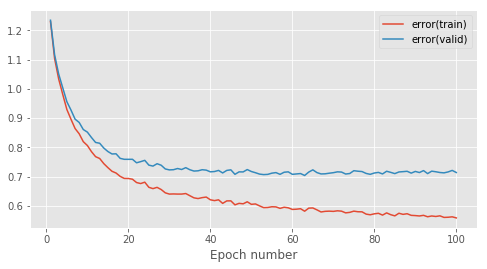

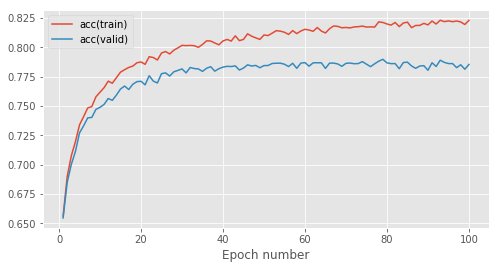

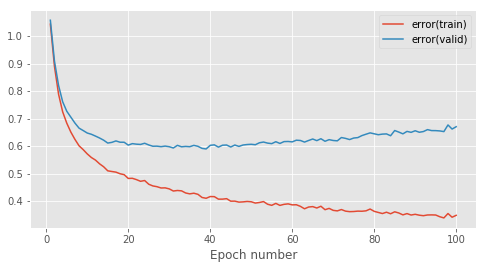

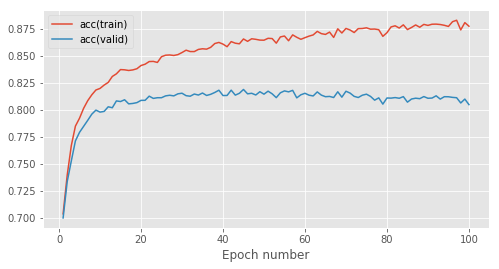

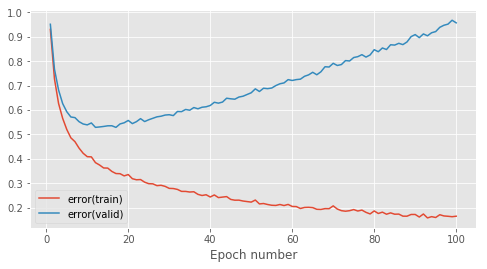

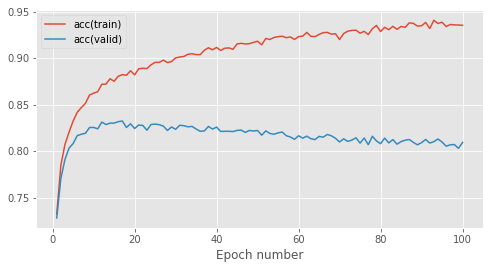

In [83]:
#setup hyperparameters
num_epochs = 100
stats_interval = 1
input_dim, output_dim = 784, 47

hidden_dims = [32, 64, 128]
layer1_stats = defaultdict(tuple)

for hidden_dim in hidden_dims:
    print("******* {} hidden units *******".format(hidden_dim))
    # Reset random number generator and data provider states on each run
    # to ensure reproducibility of results
    rng.seed(seed)
    train_data.reset()
    valid_data.reset()

    # Alter data-provider batch size
    train_data.batch_size = batch_size 
    valid_data.batch_size = batch_size
    
    weights_init = GlorotUniformInit(rng=rng)
    biases_init = ConstantInit(0.)
    model = MultipleLayerModel([
        AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
        ReluLayer(),
        AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
    ])

    error = CrossEntropySoftmaxError()
    # Use a basic gradient descent learning rule
    learning_rule = AdamLearningRule()

    #Remember to use notebook=False when you write a script to be run in a terminal
    stats = train_model_and_plot_stats(
        model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval, notebook=True)
    
    layer1_stats[hidden_dim] = stats

In [84]:
for (num_units, stats) in layer1_stats.items(): 
    print("1 layer, {} hidden units per layer:".format(num_units))
    
    # initialise empty model with the same architecture of the trained model
    best_model = MultipleLayerModel([
        AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
        ReluLayer(),
        AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
    ])

    createBestModelAndCalculateAccuracy(stats[0].model, best_model, stats[0].model.params, stats[0].best_model_params, test_data)
    print()

1 layer, 32 hidden units per layer:
Test set accuracy on best model: 0.7775949367088607

1 layer, 64 hidden units per layer:
Test set accuracy on best model: 0.8042405063291139

1 layer, 128 hidden units per layer:
Test set accuracy on best model: 0.8243037974683544



#### 2 layers

******* 32 hidden units *******


Epoch 1: 1.6s to complete
    error(train)=1.20e+00, acc(train)=6.61e-01, error(valid)=1.21e+00, acc(valid)=6.52e-01


Epoch 2: 1.7s to complete
    error(train)=1.03e+00, acc(train)=7.02e-01, error(valid)=1.05e+00, acc(valid)=6.96e-01


Epoch 3: 1.7s to complete
    error(train)=9.27e-01, acc(train)=7.26e-01, error(valid)=9.51e-01, acc(valid)=7.20e-01


Epoch 4: 2.0s to complete
    error(train)=8.59e-01, acc(train)=7.44e-01, error(valid)=8.87e-01, acc(valid)=7.38e-01


Epoch 5: 1.6s to complete
    error(train)=8.07e-01, acc(train)=7.56e-01, error(valid)=8.38e-01, acc(valid)=7.48e-01


Epoch 6: 1.6s to complete
    error(train)=7.77e-01, acc(train)=7.66e-01, error(valid)=8.08e-01, acc(valid)=7.56e-01


Epoch 7: 1.6s to complete
    error(train)=7.53e-01, acc(train)=7.70e-01, error(valid)=7.94e-01, acc(valid)=7.57e-01


Epoch 8: 2.1s to complete
    error(train)=7.47e-01, acc(train)=7.68e-01, error(valid)=7.96e-01, acc(valid)=7.54e-01


Epoch 9: 2.0s to complete
    error(train)=7.17e-01, acc(train)=7.77e-01, error(valid)=7.61e-01, acc(valid)=7.68e-01


Epoch 10: 1.6s to complete
    error(train)=6.89e-01, acc(train)=7.87e-01, error(valid)=7.40e-01, acc(valid)=7.73e-01


Epoch 11: 1.6s to complete
    error(train)=6.79e-01, acc(train)=7.86e-01, error(valid)=7.35e-01, acc(valid)=7.72e-01


Epoch 12: 1.7s to complete
    error(train)=6.69e-01, acc(train)=7.91e-01, error(valid)=7.31e-01, acc(valid)=7.75e-01


Epoch 13: 1.6s to complete
    error(train)=6.66e-01, acc(train)=7.91e-01, error(valid)=7.29e-01, acc(valid)=7.76e-01


Epoch 14: 1.8s to complete
    error(train)=6.44e-01, acc(train)=7.98e-01, error(valid)=7.08e-01, acc(valid)=7.80e-01


Epoch 15: 1.7s to complete
    error(train)=6.48e-01, acc(train)=7.96e-01, error(valid)=7.14e-01, acc(valid)=7.80e-01


Epoch 16: 1.6s to complete
    error(train)=6.33e-01, acc(train)=8.01e-01, error(valid)=7.04e-01, acc(valid)=7.85e-01


Epoch 17: 1.6s to complete
    error(train)=6.27e-01, acc(train)=8.01e-01, error(valid)=6.95e-01, acc(valid)=7.82e-01


Epoch 18: 1.6s to complete
    error(train)=6.20e-01, acc(train)=8.06e-01, error(valid)=6.92e-01, acc(valid)=7.87e-01


Epoch 19: 1.6s to complete
    error(train)=6.07e-01, acc(train)=8.09e-01, error(valid)=6.81e-01, acc(valid)=7.86e-01


Epoch 20: 1.7s to complete
    error(train)=6.07e-01, acc(train)=8.07e-01, error(valid)=6.83e-01, acc(valid)=7.89e-01


Epoch 21: 1.6s to complete
    error(train)=6.06e-01, acc(train)=8.05e-01, error(valid)=6.87e-01, acc(valid)=7.84e-01


Epoch 22: 1.6s to complete
    error(train)=6.06e-01, acc(train)=8.05e-01, error(valid)=6.97e-01, acc(valid)=7.83e-01


Epoch 23: 1.7s to complete
    error(train)=5.90e-01, acc(train)=8.13e-01, error(valid)=6.74e-01, acc(valid)=7.91e-01


Epoch 24: 1.9s to complete
    error(train)=5.91e-01, acc(train)=8.12e-01, error(valid)=6.74e-01, acc(valid)=7.93e-01


Epoch 25: 1.7s to complete
    error(train)=5.98e-01, acc(train)=8.11e-01, error(valid)=6.85e-01, acc(valid)=7.88e-01


Epoch 26: 1.8s to complete
    error(train)=5.90e-01, acc(train)=8.10e-01, error(valid)=6.79e-01, acc(valid)=7.87e-01


Epoch 27: 1.9s to complete
    error(train)=5.75e-01, acc(train)=8.16e-01, error(valid)=6.63e-01, acc(valid)=7.92e-01


Epoch 28: 1.9s to complete
    error(train)=5.77e-01, acc(train)=8.15e-01, error(valid)=6.71e-01, acc(valid)=7.89e-01


Epoch 29: 2.6s to complete
    error(train)=5.86e-01, acc(train)=8.11e-01, error(valid)=6.83e-01, acc(valid)=7.87e-01


Epoch 30: 1.7s to complete
    error(train)=5.74e-01, acc(train)=8.15e-01, error(valid)=6.71e-01, acc(valid)=7.91e-01


Epoch 31: 2.3s to complete
    error(train)=5.72e-01, acc(train)=8.15e-01, error(valid)=6.70e-01, acc(valid)=7.89e-01


Epoch 32: 1.7s to complete
    error(train)=5.58e-01, acc(train)=8.21e-01, error(valid)=6.58e-01, acc(valid)=7.96e-01


Epoch 33: 1.7s to complete
    error(train)=5.59e-01, acc(train)=8.19e-01, error(valid)=6.59e-01, acc(valid)=7.94e-01


Epoch 34: 1.8s to complete
    error(train)=5.60e-01, acc(train)=8.19e-01, error(valid)=6.58e-01, acc(valid)=7.92e-01


Epoch 35: 2.2s to complete
    error(train)=5.56e-01, acc(train)=8.21e-01, error(valid)=6.57e-01, acc(valid)=7.97e-01


Epoch 36: 1.8s to complete
    error(train)=5.44e-01, acc(train)=8.25e-01, error(valid)=6.50e-01, acc(valid)=7.98e-01


Epoch 37: 1.9s to complete
    error(train)=5.46e-01, acc(train)=8.22e-01, error(valid)=6.54e-01, acc(valid)=7.95e-01


Epoch 38: 2.1s to complete
    error(train)=5.43e-01, acc(train)=8.24e-01, error(valid)=6.49e-01, acc(valid)=7.95e-01


Epoch 39: 1.7s to complete
    error(train)=5.53e-01, acc(train)=8.18e-01, error(valid)=6.62e-01, acc(valid)=7.92e-01


Epoch 40: 1.8s to complete
    error(train)=5.44e-01, acc(train)=8.23e-01, error(valid)=6.53e-01, acc(valid)=7.95e-01


Epoch 41: 1.8s to complete
    error(train)=5.39e-01, acc(train)=8.26e-01, error(valid)=6.50e-01, acc(valid)=7.97e-01


Epoch 42: 1.8s to complete
    error(train)=5.43e-01, acc(train)=8.24e-01, error(valid)=6.55e-01, acc(valid)=7.94e-01


Epoch 43: 1.7s to complete
    error(train)=5.45e-01, acc(train)=8.22e-01, error(valid)=6.56e-01, acc(valid)=7.95e-01


Epoch 44: 1.7s to complete
    error(train)=5.37e-01, acc(train)=8.26e-01, error(valid)=6.51e-01, acc(valid)=7.98e-01


Epoch 45: 1.7s to complete
    error(train)=5.35e-01, acc(train)=8.26e-01, error(valid)=6.48e-01, acc(valid)=7.96e-01


Epoch 46: 2.4s to complete
    error(train)=5.26e-01, acc(train)=8.30e-01, error(valid)=6.40e-01, acc(valid)=8.00e-01


Epoch 47: 1.7s to complete
    error(train)=5.32e-01, acc(train)=8.27e-01, error(valid)=6.50e-01, acc(valid)=7.93e-01


Epoch 48: 1.7s to complete
    error(train)=5.23e-01, acc(train)=8.29e-01, error(valid)=6.45e-01, acc(valid)=7.99e-01


Epoch 49: 1.7s to complete
    error(train)=5.33e-01, acc(train)=8.26e-01, error(valid)=6.53e-01, acc(valid)=7.95e-01


Epoch 50: 2.0s to complete
    error(train)=5.37e-01, acc(train)=8.23e-01, error(valid)=6.57e-01, acc(valid)=7.94e-01


Epoch 51: 2.2s to complete
    error(train)=5.15e-01, acc(train)=8.31e-01, error(valid)=6.39e-01, acc(valid)=7.99e-01


Epoch 52: 1.7s to complete
    error(train)=5.20e-01, acc(train)=8.29e-01, error(valid)=6.46e-01, acc(valid)=7.98e-01


Epoch 53: 1.7s to complete
    error(train)=5.21e-01, acc(train)=8.30e-01, error(valid)=6.44e-01, acc(valid)=7.98e-01


Epoch 54: 1.7s to complete
    error(train)=5.16e-01, acc(train)=8.30e-01, error(valid)=6.49e-01, acc(valid)=7.95e-01


Epoch 55: 1.9s to complete
    error(train)=5.19e-01, acc(train)=8.30e-01, error(valid)=6.53e-01, acc(valid)=7.96e-01


Epoch 56: 1.8s to complete
    error(train)=5.17e-01, acc(train)=8.30e-01, error(valid)=6.47e-01, acc(valid)=7.97e-01


Epoch 57: 1.8s to complete
    error(train)=5.14e-01, acc(train)=8.31e-01, error(valid)=6.50e-01, acc(valid)=7.99e-01


Epoch 58: 1.7s to complete
    error(train)=5.23e-01, acc(train)=8.26e-01, error(valid)=6.58e-01, acc(valid)=7.91e-01


Epoch 59: 1.7s to complete
    error(train)=5.15e-01, acc(train)=8.30e-01, error(valid)=6.50e-01, acc(valid)=7.96e-01


Epoch 60: 1.7s to complete
    error(train)=5.14e-01, acc(train)=8.31e-01, error(valid)=6.49e-01, acc(valid)=7.97e-01


Epoch 61: 1.7s to complete
    error(train)=5.12e-01, acc(train)=8.30e-01, error(valid)=6.49e-01, acc(valid)=7.97e-01


Epoch 62: 2.0s to complete
    error(train)=5.15e-01, acc(train)=8.30e-01, error(valid)=6.53e-01, acc(valid)=7.95e-01


Epoch 63: 2.2s to complete
    error(train)=5.17e-01, acc(train)=8.30e-01, error(valid)=6.53e-01, acc(valid)=7.96e-01


Epoch 64: 2.1s to complete
    error(train)=5.17e-01, acc(train)=8.29e-01, error(valid)=6.58e-01, acc(valid)=7.97e-01


Epoch 65: 1.7s to complete
    error(train)=5.05e-01, acc(train)=8.33e-01, error(valid)=6.47e-01, acc(valid)=7.96e-01


Epoch 66: 2.3s to complete
    error(train)=5.01e-01, acc(train)=8.34e-01, error(valid)=6.47e-01, acc(valid)=7.99e-01


Epoch 67: 1.7s to complete
    error(train)=5.04e-01, acc(train)=8.34e-01, error(valid)=6.51e-01, acc(valid)=8.00e-01


Epoch 68: 1.8s to complete
    error(train)=4.98e-01, acc(train)=8.35e-01, error(valid)=6.44e-01, acc(valid)=7.98e-01


Epoch 69: 2.1s to complete
    error(train)=4.93e-01, acc(train)=8.36e-01, error(valid)=6.43e-01, acc(valid)=8.00e-01


Epoch 70: 1.7s to complete
    error(train)=5.03e-01, acc(train)=8.33e-01, error(valid)=6.57e-01, acc(valid)=7.96e-01


Epoch 71: 1.7s to complete
    error(train)=4.95e-01, acc(train)=8.37e-01, error(valid)=6.42e-01, acc(valid)=8.01e-01


Epoch 72: 2.5s to complete
    error(train)=5.10e-01, acc(train)=8.31e-01, error(valid)=6.56e-01, acc(valid)=7.96e-01


Epoch 73: 1.8s to complete
    error(train)=4.99e-01, acc(train)=8.35e-01, error(valid)=6.53e-01, acc(valid)=7.96e-01


Epoch 74: 2.2s to complete
    error(train)=5.06e-01, acc(train)=8.30e-01, error(valid)=6.62e-01, acc(valid)=7.93e-01


Epoch 75: 2.2s to complete
    error(train)=5.01e-01, acc(train)=8.33e-01, error(valid)=6.59e-01, acc(valid)=7.97e-01


Epoch 76: 2.2s to complete
    error(train)=4.96e-01, acc(train)=8.34e-01, error(valid)=6.49e-01, acc(valid)=7.96e-01


Epoch 77: 1.8s to complete
    error(train)=5.01e-01, acc(train)=8.33e-01, error(valid)=6.58e-01, acc(valid)=7.96e-01


Epoch 78: 2.2s to complete
    error(train)=4.91e-01, acc(train)=8.37e-01, error(valid)=6.50e-01, acc(valid)=7.98e-01


Epoch 79: 1.8s to complete
    error(train)=4.87e-01, acc(train)=8.38e-01, error(valid)=6.47e-01, acc(valid)=7.97e-01


Epoch 80: 2.0s to complete
    error(train)=4.90e-01, acc(train)=8.37e-01, error(valid)=6.50e-01, acc(valid)=7.97e-01


Epoch 81: 1.8s to complete
    error(train)=4.89e-01, acc(train)=8.38e-01, error(valid)=6.50e-01, acc(valid)=7.99e-01


Epoch 82: 1.9s to complete
    error(train)=5.04e-01, acc(train)=8.34e-01, error(valid)=6.68e-01, acc(valid)=7.97e-01


Epoch 83: 1.8s to complete
    error(train)=4.94e-01, acc(train)=8.35e-01, error(valid)=6.56e-01, acc(valid)=7.96e-01


Epoch 84: 2.0s to complete
    error(train)=4.85e-01, acc(train)=8.39e-01, error(valid)=6.50e-01, acc(valid)=7.99e-01


Epoch 85: 2.1s to complete
    error(train)=4.83e-01, acc(train)=8.40e-01, error(valid)=6.47e-01, acc(valid)=7.99e-01


Epoch 86: 2.3s to complete
    error(train)=4.82e-01, acc(train)=8.39e-01, error(valid)=6.51e-01, acc(valid)=7.98e-01


Epoch 87: 1.7s to complete
    error(train)=4.85e-01, acc(train)=8.39e-01, error(valid)=6.51e-01, acc(valid)=8.00e-01


Epoch 88: 1.8s to complete
    error(train)=4.83e-01, acc(train)=8.38e-01, error(valid)=6.56e-01, acc(valid)=7.97e-01


Epoch 89: 1.7s to complete
    error(train)=4.84e-01, acc(train)=8.37e-01, error(valid)=6.56e-01, acc(valid)=7.94e-01


Epoch 90: 1.8s to complete
    error(train)=4.77e-01, acc(train)=8.42e-01, error(valid)=6.50e-01, acc(valid)=7.99e-01


Epoch 91: 1.9s to complete
    error(train)=4.79e-01, acc(train)=8.40e-01, error(valid)=6.51e-01, acc(valid)=7.98e-01


Epoch 92: 1.8s to complete
    error(train)=4.89e-01, acc(train)=8.37e-01, error(valid)=6.65e-01, acc(valid)=7.96e-01


Epoch 93: 1.8s to complete
    error(train)=4.94e-01, acc(train)=8.35e-01, error(valid)=6.74e-01, acc(valid)=7.91e-01


Epoch 94: 2.2s to complete
    error(train)=4.88e-01, acc(train)=8.36e-01, error(valid)=6.65e-01, acc(valid)=7.93e-01


Epoch 95: 2.1s to complete
    error(train)=4.81e-01, acc(train)=8.39e-01, error(valid)=6.58e-01, acc(valid)=7.97e-01


Epoch 96: 2.1s to complete
    error(train)=4.75e-01, acc(train)=8.41e-01, error(valid)=6.53e-01, acc(valid)=7.97e-01


Epoch 97: 2.1s to complete
    error(train)=4.90e-01, acc(train)=8.35e-01, error(valid)=6.64e-01, acc(valid)=7.93e-01


Epoch 98: 2.0s to complete
    error(train)=4.74e-01, acc(train)=8.41e-01, error(valid)=6.56e-01, acc(valid)=7.97e-01


Epoch 99: 2.4s to complete
    error(train)=4.79e-01, acc(train)=8.40e-01, error(valid)=6.61e-01, acc(valid)=7.96e-01


Epoch 100: 2.2s to complete
    error(train)=4.83e-01, acc(train)=8.38e-01, error(valid)=6.60e-01, acc(valid)=7.94e-01



******* 64 hidden units *******


Epoch 1: 3.2s to complete
    error(train)=9.28e-01, acc(train)=7.27e-01, error(valid)=9.42e-01, acc(valid)=7.22e-01


Epoch 2: 2.6s to complete
    error(train)=7.42e-01, acc(train)=7.70e-01, error(valid)=7.69e-01, acc(valid)=7.62e-01


Epoch 3: 2.6s to complete
    error(train)=6.56e-01, acc(train)=7.95e-01, error(valid)=6.90e-01, acc(valid)=7.84e-01


Epoch 4: 2.9s to complete
    error(train)=6.16e-01, acc(train)=8.04e-01, error(valid)=6.62e-01, acc(valid)=7.93e-01


Epoch 5: 3.0s to complete
    error(train)=5.73e-01, acc(train)=8.16e-01, error(valid)=6.29e-01, acc(valid)=7.99e-01


Epoch 6: 2.6s to complete
    error(train)=5.60e-01, acc(train)=8.20e-01, error(valid)=6.22e-01, acc(valid)=8.02e-01


Epoch 7: 2.3s to complete
    error(train)=5.18e-01, acc(train)=8.31e-01, error(valid)=5.88e-01, acc(valid)=8.13e-01


Epoch 8: 2.4s to complete
    error(train)=4.98e-01, acc(train)=8.33e-01, error(valid)=5.77e-01, acc(valid)=8.11e-01


Epoch 9: 2.5s to complete
    error(train)=4.89e-01, acc(train)=8.37e-01, error(valid)=5.77e-01, acc(valid)=8.14e-01


Epoch 10: 2.4s to complete
    error(train)=4.80e-01, acc(train)=8.41e-01, error(valid)=5.78e-01, acc(valid)=8.14e-01


Epoch 11: 2.4s to complete
    error(train)=4.72e-01, acc(train)=8.41e-01, error(valid)=5.72e-01, acc(valid)=8.15e-01


Epoch 12: 2.5s to complete
    error(train)=4.53e-01, acc(train)=8.49e-01, error(valid)=5.64e-01, acc(valid)=8.18e-01


Epoch 13: 2.4s to complete
    error(train)=4.45e-01, acc(train)=8.50e-01, error(valid)=5.60e-01, acc(valid)=8.18e-01


Epoch 14: 2.4s to complete
    error(train)=4.38e-01, acc(train)=8.51e-01, error(valid)=5.63e-01, acc(valid)=8.20e-01


Epoch 15: 2.4s to complete
    error(train)=4.31e-01, acc(train)=8.52e-01, error(valid)=5.60e-01, acc(valid)=8.18e-01


Epoch 16: 2.6s to complete
    error(train)=4.14e-01, acc(train)=8.59e-01, error(valid)=5.51e-01, acc(valid)=8.21e-01


Epoch 17: 4.2s to complete
    error(train)=4.09e-01, acc(train)=8.61e-01, error(valid)=5.49e-01, acc(valid)=8.24e-01


Epoch 18: 3.2s to complete
    error(train)=4.09e-01, acc(train)=8.61e-01, error(valid)=5.56e-01, acc(valid)=8.21e-01


Epoch 19: 2.4s to complete
    error(train)=4.21e-01, acc(train)=8.53e-01, error(valid)=5.69e-01, acc(valid)=8.16e-01


Epoch 20: 2.9s to complete
    error(train)=3.89e-01, acc(train)=8.66e-01, error(valid)=5.42e-01, acc(valid)=8.22e-01


Epoch 21: 2.8s to complete
    error(train)=3.83e-01, acc(train)=8.69e-01, error(valid)=5.42e-01, acc(valid)=8.26e-01


Epoch 22: 2.5s to complete
    error(train)=3.86e-01, acc(train)=8.66e-01, error(valid)=5.51e-01, acc(valid)=8.23e-01


Epoch 23: 2.7s to complete
    error(train)=3.84e-01, acc(train)=8.66e-01, error(valid)=5.56e-01, acc(valid)=8.22e-01


Epoch 24: 2.8s to complete
    error(train)=3.71e-01, acc(train)=8.69e-01, error(valid)=5.49e-01, acc(valid)=8.26e-01


Epoch 25: 2.7s to complete
    error(train)=3.76e-01, acc(train)=8.68e-01, error(valid)=5.63e-01, acc(valid)=8.21e-01


Epoch 26: 2.6s to complete
    error(train)=3.69e-01, acc(train)=8.72e-01, error(valid)=5.56e-01, acc(valid)=8.23e-01


Epoch 27: 2.6s to complete
    error(train)=3.57e-01, acc(train)=8.75e-01, error(valid)=5.48e-01, acc(valid)=8.26e-01


Epoch 28: 2.6s to complete
    error(train)=3.64e-01, acc(train)=8.71e-01, error(valid)=5.64e-01, acc(valid)=8.23e-01


Epoch 29: 2.7s to complete
    error(train)=3.63e-01, acc(train)=8.71e-01, error(valid)=5.76e-01, acc(valid)=8.22e-01


Epoch 30: 2.7s to complete
    error(train)=3.51e-01, acc(train)=8.75e-01, error(valid)=5.63e-01, acc(valid)=8.22e-01


Epoch 31: 2.8s to complete
    error(train)=3.58e-01, acc(train)=8.74e-01, error(valid)=5.74e-01, acc(valid)=8.21e-01


Epoch 32: 2.5s to complete
    error(train)=3.44e-01, acc(train)=8.77e-01, error(valid)=5.59e-01, acc(valid)=8.27e-01


Epoch 33: 2.5s to complete
    error(train)=3.44e-01, acc(train)=8.77e-01, error(valid)=5.64e-01, acc(valid)=8.25e-01


Epoch 34: 2.6s to complete
    error(train)=3.44e-01, acc(train)=8.78e-01, error(valid)=5.69e-01, acc(valid)=8.25e-01


Epoch 35: 2.6s to complete
    error(train)=3.36e-01, acc(train)=8.81e-01, error(valid)=5.71e-01, acc(valid)=8.27e-01


Epoch 36: 2.4s to complete
    error(train)=3.44e-01, acc(train)=8.76e-01, error(valid)=5.88e-01, acc(valid)=8.18e-01


Epoch 37: 2.5s to complete
    error(train)=3.24e-01, acc(train)=8.84e-01, error(valid)=5.74e-01, acc(valid)=8.24e-01


Epoch 38: 2.5s to complete
    error(train)=3.27e-01, acc(train)=8.83e-01, error(valid)=5.77e-01, acc(valid)=8.23e-01


Epoch 39: 2.5s to complete
    error(train)=3.24e-01, acc(train)=8.84e-01, error(valid)=5.86e-01, acc(valid)=8.24e-01


Epoch 40: 2.5s to complete
    error(train)=3.22e-01, acc(train)=8.83e-01, error(valid)=5.86e-01, acc(valid)=8.23e-01


Epoch 41: 2.5s to complete
    error(train)=3.22e-01, acc(train)=8.84e-01, error(valid)=5.90e-01, acc(valid)=8.21e-01


Epoch 42: 2.6s to complete
    error(train)=3.21e-01, acc(train)=8.83e-01, error(valid)=5.90e-01, acc(valid)=8.20e-01


Epoch 43: 3.7s to complete
    error(train)=3.21e-01, acc(train)=8.83e-01, error(valid)=5.92e-01, acc(valid)=8.20e-01


Epoch 44: 2.6s to complete
    error(train)=3.20e-01, acc(train)=8.84e-01, error(valid)=5.96e-01, acc(valid)=8.19e-01


Epoch 45: 3.0s to complete
    error(train)=3.18e-01, acc(train)=8.84e-01, error(valid)=6.07e-01, acc(valid)=8.21e-01


Epoch 46: 2.8s to complete
    error(train)=3.11e-01, acc(train)=8.86e-01, error(valid)=5.99e-01, acc(valid)=8.20e-01


Epoch 47: 3.5s to complete
    error(train)=3.14e-01, acc(train)=8.86e-01, error(valid)=6.13e-01, acc(valid)=8.18e-01


Epoch 48: 2.6s to complete
    error(train)=3.10e-01, acc(train)=8.87e-01, error(valid)=6.11e-01, acc(valid)=8.17e-01


Epoch 49: 2.6s to complete
    error(train)=3.12e-01, acc(train)=8.87e-01, error(valid)=6.07e-01, acc(valid)=8.18e-01


Epoch 50: 3.5s to complete
    error(train)=3.11e-01, acc(train)=8.87e-01, error(valid)=6.21e-01, acc(valid)=8.19e-01


Epoch 51: 3.0s to complete
    error(train)=3.11e-01, acc(train)=8.86e-01, error(valid)=6.24e-01, acc(valid)=8.21e-01


Epoch 52: 3.1s to complete
    error(train)=3.11e-01, acc(train)=8.85e-01, error(valid)=6.36e-01, acc(valid)=8.17e-01


Epoch 53: 2.6s to complete
    error(train)=2.99e-01, acc(train)=8.91e-01, error(valid)=6.25e-01, acc(valid)=8.16e-01


Epoch 54: 2.6s to complete
    error(train)=2.93e-01, acc(train)=8.91e-01, error(valid)=6.21e-01, acc(valid)=8.18e-01


Epoch 55: 2.5s to complete
    error(train)=2.98e-01, acc(train)=8.91e-01, error(valid)=6.30e-01, acc(valid)=8.20e-01


Epoch 56: 2.5s to complete
    error(train)=2.88e-01, acc(train)=8.94e-01, error(valid)=6.26e-01, acc(valid)=8.22e-01


Epoch 57: 2.5s to complete
    error(train)=3.05e-01, acc(train)=8.87e-01, error(valid)=6.47e-01, acc(valid)=8.17e-01


Epoch 58: 2.5s to complete
    error(train)=2.97e-01, acc(train)=8.89e-01, error(valid)=6.56e-01, acc(valid)=8.13e-01


Epoch 59: 2.5s to complete
    error(train)=3.01e-01, acc(train)=8.89e-01, error(valid)=6.45e-01, acc(valid)=8.21e-01


Epoch 60: 2.6s to complete
    error(train)=2.88e-01, acc(train)=8.94e-01, error(valid)=6.50e-01, acc(valid)=8.15e-01


Epoch 61: 2.7s to complete
    error(train)=3.05e-01, acc(train)=8.85e-01, error(valid)=6.57e-01, acc(valid)=8.14e-01


Epoch 62: 2.8s to complete
    error(train)=2.95e-01, acc(train)=8.91e-01, error(valid)=6.60e-01, acc(valid)=8.12e-01


Epoch 63: 2.7s to complete
    error(train)=3.03e-01, acc(train)=8.88e-01, error(valid)=6.78e-01, acc(valid)=8.11e-01


Epoch 64: 3.2s to complete
    error(train)=2.85e-01, acc(train)=8.95e-01, error(valid)=6.63e-01, acc(valid)=8.20e-01


Epoch 65: 3.0s to complete
    error(train)=2.92e-01, acc(train)=8.90e-01, error(valid)=6.62e-01, acc(valid)=8.14e-01


Epoch 66: 2.7s to complete
    error(train)=2.84e-01, acc(train)=8.94e-01, error(valid)=6.61e-01, acc(valid)=8.19e-01


Epoch 67: 2.8s to complete
    error(train)=2.79e-01, acc(train)=8.97e-01, error(valid)=6.60e-01, acc(valid)=8.17e-01


Epoch 68: 3.0s to complete
    error(train)=2.76e-01, acc(train)=8.96e-01, error(valid)=6.63e-01, acc(valid)=8.17e-01


Epoch 69: 3.2s to complete
    error(train)=2.84e-01, acc(train)=8.94e-01, error(valid)=6.72e-01, acc(valid)=8.16e-01


Epoch 70: 3.1s to complete
    error(train)=2.78e-01, acc(train)=8.97e-01, error(valid)=6.74e-01, acc(valid)=8.18e-01


Epoch 71: 3.1s to complete
    error(train)=2.73e-01, acc(train)=8.97e-01, error(valid)=6.68e-01, acc(valid)=8.19e-01


Epoch 72: 3.4s to complete
    error(train)=2.84e-01, acc(train)=8.95e-01, error(valid)=6.83e-01, acc(valid)=8.15e-01


Epoch 73: 3.3s to complete
    error(train)=2.72e-01, acc(train)=8.99e-01, error(valid)=6.77e-01, acc(valid)=8.15e-01


Epoch 74: 3.2s to complete
    error(train)=2.83e-01, acc(train)=8.93e-01, error(valid)=7.00e-01, acc(valid)=8.15e-01


Epoch 75: 3.2s to complete
    error(train)=2.77e-01, acc(train)=8.97e-01, error(valid)=6.94e-01, acc(valid)=8.15e-01


Epoch 76: 3.0s to complete
    error(train)=2.74e-01, acc(train)=8.98e-01, error(valid)=6.98e-01, acc(valid)=8.16e-01


Epoch 77: 2.5s to complete
    error(train)=2.72e-01, acc(train)=8.98e-01, error(valid)=6.85e-01, acc(valid)=8.17e-01


Epoch 78: 2.5s to complete
    error(train)=2.72e-01, acc(train)=8.97e-01, error(valid)=6.93e-01, acc(valid)=8.16e-01


Epoch 79: 2.5s to complete
    error(train)=2.71e-01, acc(train)=8.98e-01, error(valid)=7.08e-01, acc(valid)=8.16e-01


Epoch 80: 2.5s to complete
    error(train)=2.69e-01, acc(train)=8.98e-01, error(valid)=7.01e-01, acc(valid)=8.13e-01


Epoch 81: 2.6s to complete
    error(train)=2.62e-01, acc(train)=9.02e-01, error(valid)=7.06e-01, acc(valid)=8.16e-01


Epoch 82: 2.6s to complete
    error(train)=2.77e-01, acc(train)=8.95e-01, error(valid)=7.37e-01, acc(valid)=8.11e-01


Epoch 83: 2.6s to complete
    error(train)=2.61e-01, acc(train)=9.01e-01, error(valid)=7.14e-01, acc(valid)=8.14e-01


Epoch 84: 2.6s to complete
    error(train)=2.67e-01, acc(train)=8.99e-01, error(valid)=7.22e-01, acc(valid)=8.12e-01


Epoch 85: 2.6s to complete
    error(train)=2.66e-01, acc(train)=8.99e-01, error(valid)=7.30e-01, acc(valid)=8.13e-01


Epoch 86: 2.5s to complete
    error(train)=2.57e-01, acc(train)=9.03e-01, error(valid)=7.17e-01, acc(valid)=8.13e-01


Epoch 87: 2.5s to complete
    error(train)=2.65e-01, acc(train)=9.00e-01, error(valid)=7.37e-01, acc(valid)=8.12e-01


Epoch 88: 2.6s to complete
    error(train)=2.60e-01, acc(train)=9.01e-01, error(valid)=7.34e-01, acc(valid)=8.13e-01


Epoch 89: 2.5s to complete
    error(train)=2.60e-01, acc(train)=9.01e-01, error(valid)=7.34e-01, acc(valid)=8.14e-01


Epoch 90: 2.6s to complete
    error(train)=2.50e-01, acc(train)=9.05e-01, error(valid)=7.33e-01, acc(valid)=8.13e-01


Epoch 91: 2.5s to complete
    error(train)=2.66e-01, acc(train)=8.98e-01, error(valid)=7.55e-01, acc(valid)=8.07e-01


Epoch 92: 2.6s to complete
    error(train)=2.54e-01, acc(train)=9.03e-01, error(valid)=7.33e-01, acc(valid)=8.13e-01


Epoch 93: 2.6s to complete
    error(train)=2.55e-01, acc(train)=9.02e-01, error(valid)=7.40e-01, acc(valid)=8.14e-01


Epoch 94: 2.5s to complete
    error(train)=2.68e-01, acc(train)=8.96e-01, error(valid)=7.53e-01, acc(valid)=8.12e-01


Epoch 95: 2.8s to complete
    error(train)=2.51e-01, acc(train)=9.04e-01, error(valid)=7.44e-01, acc(valid)=8.15e-01


Epoch 96: 3.1s to complete
    error(train)=2.59e-01, acc(train)=9.00e-01, error(valid)=7.63e-01, acc(valid)=8.09e-01


Epoch 97: 2.5s to complete
    error(train)=2.55e-01, acc(train)=9.02e-01, error(valid)=7.58e-01, acc(valid)=8.09e-01


Epoch 98: 2.6s to complete
    error(train)=2.49e-01, acc(train)=9.04e-01, error(valid)=7.59e-01, acc(valid)=8.14e-01


Epoch 99: 2.5s to complete
    error(train)=2.48e-01, acc(train)=9.04e-01, error(valid)=7.57e-01, acc(valid)=8.13e-01


Epoch 100: 3.1s to complete
    error(train)=2.57e-01, acc(train)=9.00e-01, error(valid)=7.69e-01, acc(valid)=8.06e-01



******* 128 hidden units *******


Epoch 1: 4.4s to complete
    error(train)=7.57e-01, acc(train)=7.72e-01, error(valid)=7.76e-01, acc(valid)=7.65e-01


Epoch 2: 4.4s to complete
    error(train)=6.06e-01, acc(train)=8.07e-01, error(valid)=6.51e-01, acc(valid)=7.95e-01


Epoch 3: 5.1s to complete
    error(train)=5.18e-01, acc(train)=8.30e-01, error(valid)=5.76e-01, acc(valid)=8.14e-01


Epoch 4: 4.9s to complete
    error(train)=4.58e-01, acc(train)=8.48e-01, error(valid)=5.36e-01, acc(valid)=8.27e-01


Epoch 5: 5.3s to complete
    error(train)=4.28e-01, acc(train)=8.56e-01, error(valid)=5.19e-01, acc(valid)=8.31e-01


Epoch 6: 4.9s to complete
    error(train)=4.03e-01, acc(train)=8.61e-01, error(valid)=5.11e-01, acc(valid)=8.30e-01


Epoch 7: 4.4s to complete
    error(train)=3.85e-01, acc(train)=8.65e-01, error(valid)=5.02e-01, acc(valid)=8.36e-01


Epoch 8: 4.3s to complete
    error(train)=3.67e-01, acc(train)=8.70e-01, error(valid)=5.05e-01, acc(valid)=8.33e-01


Epoch 9: 4.6s to complete
    error(train)=3.50e-01, acc(train)=8.74e-01, error(valid)=5.08e-01, acc(valid)=8.34e-01


Epoch 10: 4.4s to complete
    error(train)=3.39e-01, acc(train)=8.77e-01, error(valid)=5.01e-01, acc(valid)=8.34e-01


Epoch 11: 4.3s to complete
    error(train)=3.15e-01, acc(train)=8.85e-01, error(valid)=4.94e-01, acc(valid)=8.40e-01


Epoch 12: 4.4s to complete
    error(train)=3.07e-01, acc(train)=8.88e-01, error(valid)=5.04e-01, acc(valid)=8.35e-01


Epoch 13: 4.3s to complete
    error(train)=3.00e-01, acc(train)=8.90e-01, error(valid)=5.12e-01, acc(valid)=8.38e-01


Epoch 14: 4.4s to complete
    error(train)=2.83e-01, acc(train)=8.95e-01, error(valid)=5.10e-01, acc(valid)=8.42e-01


Epoch 15: 4.1s to complete
    error(train)=2.72e-01, acc(train)=8.99e-01, error(valid)=5.12e-01, acc(valid)=8.43e-01


Epoch 16: 4.2s to complete
    error(train)=2.68e-01, acc(train)=8.98e-01, error(valid)=5.16e-01, acc(valid)=8.38e-01


Epoch 17: 4.4s to complete
    error(train)=2.52e-01, acc(train)=9.06e-01, error(valid)=5.13e-01, acc(valid)=8.41e-01


Epoch 18: 4.2s to complete
    error(train)=2.64e-01, acc(train)=8.98e-01, error(valid)=5.45e-01, acc(valid)=8.35e-01


Epoch 19: 4.7s to complete
    error(train)=2.63e-01, acc(train)=8.99e-01, error(valid)=5.59e-01, acc(valid)=8.33e-01


Epoch 20: 4.4s to complete
    error(train)=2.45e-01, acc(train)=9.06e-01, error(valid)=5.55e-01, acc(valid)=8.38e-01


Epoch 21: 4.4s to complete
    error(train)=2.35e-01, acc(train)=9.09e-01, error(valid)=5.58e-01, acc(valid)=8.37e-01


Epoch 22: 5.6s to complete
    error(train)=2.34e-01, acc(train)=9.10e-01, error(valid)=5.80e-01, acc(valid)=8.35e-01


Epoch 23: 5.8s to complete
    error(train)=2.32e-01, acc(train)=9.09e-01, error(valid)=5.85e-01, acc(valid)=8.37e-01


Epoch 24: 5.0s to complete
    error(train)=2.23e-01, acc(train)=9.12e-01, error(valid)=5.75e-01, acc(valid)=8.37e-01


Epoch 25: 5.1s to complete
    error(train)=2.17e-01, acc(train)=9.15e-01, error(valid)=5.87e-01, acc(valid)=8.33e-01


Epoch 26: 5.0s to complete
    error(train)=2.05e-01, acc(train)=9.19e-01, error(valid)=5.97e-01, acc(valid)=8.38e-01


Epoch 27: 4.8s to complete
    error(train)=2.21e-01, acc(train)=9.12e-01, error(valid)=6.27e-01, acc(valid)=8.29e-01


Epoch 28: 4.6s to complete
    error(train)=2.02e-01, acc(train)=9.19e-01, error(valid)=6.19e-01, acc(valid)=8.33e-01


Epoch 29: 6.5s to complete
    error(train)=1.94e-01, acc(train)=9.22e-01, error(valid)=6.33e-01, acc(valid)=8.34e-01


Epoch 30: 6.3s to complete
    error(train)=2.01e-01, acc(train)=9.20e-01, error(valid)=6.47e-01, acc(valid)=8.32e-01


Epoch 31: 7.0s to complete
    error(train)=1.83e-01, acc(train)=9.27e-01, error(valid)=6.50e-01, acc(valid)=8.33e-01


Epoch 32: 5.4s to complete
    error(train)=1.86e-01, acc(train)=9.25e-01, error(valid)=6.67e-01, acc(valid)=8.35e-01


Epoch 33: 6.5s to complete
    error(train)=1.76e-01, acc(train)=9.29e-01, error(valid)=6.63e-01, acc(valid)=8.34e-01


Epoch 34: 6.2s to complete
    error(train)=1.82e-01, acc(train)=9.25e-01, error(valid)=6.88e-01, acc(valid)=8.32e-01


Epoch 35: 4.7s to complete
    error(train)=1.76e-01, acc(train)=9.28e-01, error(valid)=6.98e-01, acc(valid)=8.33e-01


Epoch 36: 4.4s to complete
    error(train)=1.73e-01, acc(train)=9.28e-01, error(valid)=7.24e-01, acc(valid)=8.27e-01


Epoch 37: 4.3s to complete
    error(train)=1.76e-01, acc(train)=9.27e-01, error(valid)=7.25e-01, acc(valid)=8.28e-01


Epoch 38: 5.0s to complete
    error(train)=1.67e-01, acc(train)=9.31e-01, error(valid)=7.47e-01, acc(valid)=8.27e-01


Epoch 39: 4.6s to complete
    error(train)=1.68e-01, acc(train)=9.31e-01, error(valid)=7.56e-01, acc(valid)=8.32e-01


Epoch 40: 4.4s to complete
    error(train)=1.62e-01, acc(train)=9.33e-01, error(valid)=7.62e-01, acc(valid)=8.31e-01


Epoch 41: 4.7s to complete
    error(train)=1.66e-01, acc(train)=9.32e-01, error(valid)=7.85e-01, acc(valid)=8.24e-01


Epoch 42: 4.7s to complete
    error(train)=1.55e-01, acc(train)=9.37e-01, error(valid)=7.79e-01, acc(valid)=8.30e-01


Epoch 43: 5.2s to complete
    error(train)=1.64e-01, acc(train)=9.32e-01, error(valid)=8.11e-01, acc(valid)=8.25e-01


Epoch 44: 4.2s to complete
    error(train)=1.49e-01, acc(train)=9.38e-01, error(valid)=8.08e-01, acc(valid)=8.29e-01


Epoch 45: 4.4s to complete
    error(train)=1.44e-01, acc(train)=9.41e-01, error(valid)=8.22e-01, acc(valid)=8.30e-01


Epoch 46: 4.3s to complete
    error(train)=1.49e-01, acc(train)=9.39e-01, error(valid)=8.41e-01, acc(valid)=8.26e-01


Epoch 47: 4.5s to complete
    error(train)=1.52e-01, acc(train)=9.37e-01, error(valid)=8.58e-01, acc(valid)=8.24e-01


Epoch 48: 4.9s to complete
    error(train)=1.61e-01, acc(train)=9.32e-01, error(valid)=8.96e-01, acc(valid)=8.23e-01


Epoch 49: 4.8s to complete
    error(train)=1.40e-01, acc(train)=9.42e-01, error(valid)=8.66e-01, acc(valid)=8.28e-01


Epoch 50: 5.0s to complete
    error(train)=1.36e-01, acc(train)=9.43e-01, error(valid)=8.92e-01, acc(valid)=8.27e-01


Epoch 51: 4.2s to complete
    error(train)=1.37e-01, acc(train)=9.43e-01, error(valid)=9.01e-01, acc(valid)=8.26e-01


Epoch 52: 4.4s to complete
    error(train)=1.49e-01, acc(train)=9.38e-01, error(valid)=9.47e-01, acc(valid)=8.21e-01


Epoch 53: 4.0s to complete
    error(train)=1.41e-01, acc(train)=9.42e-01, error(valid)=9.18e-01, acc(valid)=8.23e-01


Epoch 54: 4.6s to complete
    error(train)=1.35e-01, acc(train)=9.44e-01, error(valid)=9.29e-01, acc(valid)=8.24e-01


Epoch 55: 4.3s to complete
    error(train)=1.41e-01, acc(train)=9.42e-01, error(valid)=9.69e-01, acc(valid)=8.24e-01


Epoch 56: 4.3s to complete
    error(train)=1.37e-01, acc(train)=9.44e-01, error(valid)=9.71e-01, acc(valid)=8.23e-01


Epoch 57: 4.6s to complete
    error(train)=1.38e-01, acc(train)=9.44e-01, error(valid)=9.86e-01, acc(valid)=8.24e-01


Epoch 58: 5.6s to complete
    error(train)=1.25e-01, acc(train)=9.48e-01, error(valid)=9.90e-01, acc(valid)=8.26e-01


Epoch 59: 5.2s to complete
    error(train)=1.31e-01, acc(train)=9.47e-01, error(valid)=1.00e+00, acc(valid)=8.24e-01


Epoch 60: 4.8s to complete
    error(train)=1.31e-01, acc(train)=9.46e-01, error(valid)=1.01e+00, acc(valid)=8.21e-01


Epoch 61: 4.9s to complete
    error(train)=1.25e-01, acc(train)=9.48e-01, error(valid)=1.02e+00, acc(valid)=8.27e-01


Epoch 62: 5.0s to complete
    error(train)=1.28e-01, acc(train)=9.47e-01, error(valid)=1.05e+00, acc(valid)=8.20e-01


Epoch 63: 4.5s to complete
    error(train)=1.19e-01, acc(train)=9.51e-01, error(valid)=1.04e+00, acc(valid)=8.23e-01


Epoch 64: 4.4s to complete
    error(train)=1.36e-01, acc(train)=9.44e-01, error(valid)=1.10e+00, acc(valid)=8.16e-01


Epoch 65: 4.8s to complete
    error(train)=1.25e-01, acc(train)=9.48e-01, error(valid)=1.09e+00, acc(valid)=8.23e-01


Epoch 66: 4.7s to complete
    error(train)=1.20e-01, acc(train)=9.49e-01, error(valid)=1.09e+00, acc(valid)=8.26e-01


Epoch 67: 4.4s to complete
    error(train)=1.20e-01, acc(train)=9.51e-01, error(valid)=1.11e+00, acc(valid)=8.22e-01


Epoch 68: 4.1s to complete
    error(train)=1.24e-01, acc(train)=9.48e-01, error(valid)=1.16e+00, acc(valid)=8.19e-01


Epoch 69: 4.2s to complete
    error(train)=1.20e-01, acc(train)=9.50e-01, error(valid)=1.13e+00, acc(valid)=8.24e-01


Epoch 70: 4.3s to complete
    error(train)=1.20e-01, acc(train)=9.50e-01, error(valid)=1.16e+00, acc(valid)=8.20e-01


Epoch 71: 4.7s to complete
    error(train)=1.14e-01, acc(train)=9.53e-01, error(valid)=1.16e+00, acc(valid)=8.25e-01


Epoch 72: 4.1s to complete
    error(train)=1.25e-01, acc(train)=9.49e-01, error(valid)=1.21e+00, acc(valid)=8.21e-01


Epoch 73: 4.4s to complete
    error(train)=1.22e-01, acc(train)=9.50e-01, error(valid)=1.22e+00, acc(valid)=8.18e-01


Epoch 74: 4.3s to complete
    error(train)=1.14e-01, acc(train)=9.53e-01, error(valid)=1.22e+00, acc(valid)=8.20e-01


Epoch 75: 4.3s to complete
    error(train)=1.20e-01, acc(train)=9.51e-01, error(valid)=1.23e+00, acc(valid)=8.19e-01


Epoch 76: 4.8s to complete
    error(train)=1.12e-01, acc(train)=9.52e-01, error(valid)=1.23e+00, acc(valid)=8.18e-01


Epoch 77: 4.1s to complete
    error(train)=1.14e-01, acc(train)=9.53e-01, error(valid)=1.23e+00, acc(valid)=8.22e-01


Epoch 78: 4.4s to complete
    error(train)=1.13e-01, acc(train)=9.54e-01, error(valid)=1.26e+00, acc(valid)=8.18e-01


Epoch 79: 4.6s to complete
    error(train)=1.04e-01, acc(train)=9.57e-01, error(valid)=1.27e+00, acc(valid)=8.22e-01


Epoch 80: 4.6s to complete
    error(train)=1.04e-01, acc(train)=9.57e-01, error(valid)=1.27e+00, acc(valid)=8.21e-01


Epoch 81: 4.5s to complete
    error(train)=1.16e-01, acc(train)=9.53e-01, error(valid)=1.32e+00, acc(valid)=8.17e-01


Epoch 82: 4.3s to complete
    error(train)=1.01e-01, acc(train)=9.58e-01, error(valid)=1.31e+00, acc(valid)=8.19e-01


Epoch 83: 4.5s to complete
    error(train)=1.21e-01, acc(train)=9.49e-01, error(valid)=1.33e+00, acc(valid)=8.15e-01


Epoch 84: 4.4s to complete
    error(train)=1.12e-01, acc(train)=9.54e-01, error(valid)=1.33e+00, acc(valid)=8.19e-01


Epoch 85: 4.1s to complete
    error(train)=1.11e-01, acc(train)=9.55e-01, error(valid)=1.35e+00, acc(valid)=8.18e-01


Epoch 86: 4.4s to complete
    error(train)=1.14e-01, acc(train)=9.53e-01, error(valid)=1.37e+00, acc(valid)=8.19e-01


Epoch 87: 4.6s to complete
    error(train)=1.12e-01, acc(train)=9.55e-01, error(valid)=1.37e+00, acc(valid)=8.18e-01


Epoch 88: 4.3s to complete
    error(train)=1.32e-01, acc(train)=9.48e-01, error(valid)=1.42e+00, acc(valid)=8.13e-01


Epoch 89: 4.5s to complete
    error(train)=9.67e-02, acc(train)=9.60e-01, error(valid)=1.36e+00, acc(valid)=8.21e-01


Epoch 90: 4.4s to complete
    error(train)=1.08e-01, acc(train)=9.55e-01, error(valid)=1.40e+00, acc(valid)=8.19e-01


Epoch 91: 4.7s to complete
    error(train)=1.06e-01, acc(train)=9.56e-01, error(valid)=1.39e+00, acc(valid)=8.21e-01


Epoch 92: 4.4s to complete
    error(train)=1.06e-01, acc(train)=9.57e-01, error(valid)=1.46e+00, acc(valid)=8.20e-01


Epoch 93: 4.6s to complete
    error(train)=1.07e-01, acc(train)=9.57e-01, error(valid)=1.47e+00, acc(valid)=8.17e-01


Epoch 94: 5.2s to complete
    error(train)=9.99e-02, acc(train)=9.60e-01, error(valid)=1.47e+00, acc(valid)=8.16e-01


Epoch 95: 5.1s to complete
    error(train)=1.07e-01, acc(train)=9.57e-01, error(valid)=1.48e+00, acc(valid)=8.16e-01


Epoch 96: 5.1s to complete
    error(train)=1.22e-01, acc(train)=9.52e-01, error(valid)=1.55e+00, acc(valid)=8.16e-01


Epoch 97: 5.2s to complete
    error(train)=1.02e-01, acc(train)=9.59e-01, error(valid)=1.49e+00, acc(valid)=8.22e-01


Epoch 98: 5.2s to complete
    error(train)=1.15e-01, acc(train)=9.55e-01, error(valid)=1.52e+00, acc(valid)=8.17e-01


Epoch 99: 4.3s to complete
    error(train)=9.69e-02, acc(train)=9.61e-01, error(valid)=1.48e+00, acc(valid)=8.21e-01


Epoch 100: 4.2s to complete
    error(train)=8.57e-02, acc(train)=9.65e-01, error(valid)=1.50e+00, acc(valid)=8.19e-01


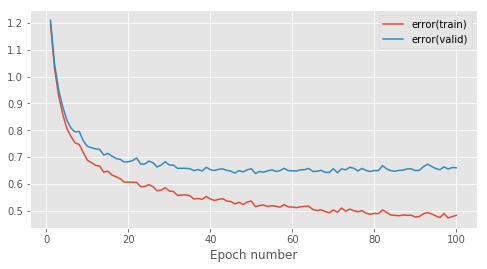

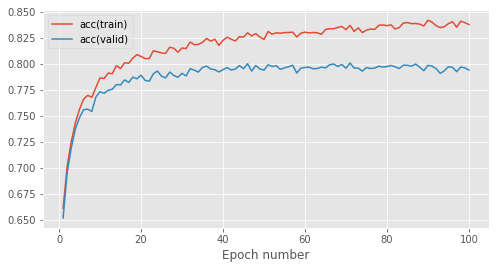

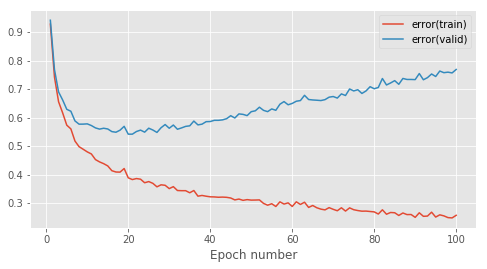

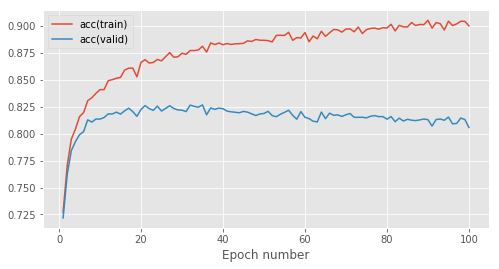

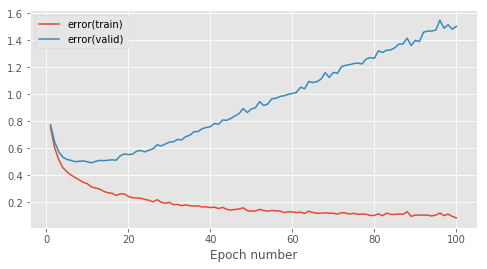

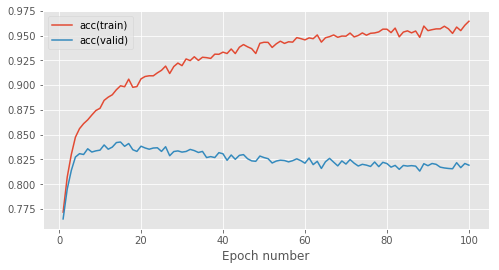

In [85]:
#setup hyperparameters
num_epochs = 100
stats_interval = 1
input_dim, output_dim = 784, 47

hidden_dims = [32, 64, 128]

layer2_stats = defaultdict(tuple)

for hidden_dim in hidden_dims:
    print("******* {} hidden units *******".format(hidden_dim))
    # Reset random number generator and data provider states on each run
    # to ensure reproducibility of results
    rng.seed(seed)
    train_data.reset()
    valid_data.reset()

    # Alter data-provider batch size
    train_data.batch_size = batch_size 
    valid_data.batch_size = batch_size
    
    weights_init = GlorotUniformInit(rng=rng)
    biases_init = ConstantInit(0.)
    model = MultipleLayerModel([
        AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
        ReluLayer(),
        AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
    ])

    error = CrossEntropySoftmaxError()
    # Use a basic gradient descent learning rule
    learning_rule = AdamLearningRule()

    #Remember to use notebook=False when you write a script to be run in a terminal
    stats = train_model_and_plot_stats(
        model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval, notebook=True)
    
    layer2_stats[hidden_dim] = stats

In [86]:
for (num_units, stats) in layer2_stats.items(): 
    print("2 layers, {} hidden units per layer:".format(num_units))
    
    # initialise empty model with the same architecture of the trained model
    best_model = MultipleLayerModel([
        AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
        ReluLayer(),
        AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
    ])

    createBestModelAndCalculateAccuracy(stats[0].model, best_model, stats[0].model.params, stats[0].best_model_params, test_data)
    print()

2 layers, 32 hidden units per layer:
Test set accuracy on best model: 0.7917721518987343

2 layers, 64 hidden units per layer:
Test set accuracy on best model: 0.819620253164557

2 layers, 128 hidden units per layer:
Test set accuracy on best model: 0.8334810126582278



#### 3 layers

******* 32 hidden units *******


Epoch 1: 1.8s to complete
    error(train)=1.18e+00, acc(train)=6.56e-01, error(valid)=1.19e+00, acc(valid)=6.55e-01


Epoch 2: 1.8s to complete
    error(train)=9.79e-01, acc(train)=7.08e-01, error(valid)=9.94e-01, acc(valid)=7.05e-01


Epoch 3: 1.8s to complete
    error(train)=8.91e-01, acc(train)=7.34e-01, error(valid)=9.16e-01, acc(valid)=7.30e-01


Epoch 4: 1.8s to complete
    error(train)=8.28e-01, acc(train)=7.46e-01, error(valid)=8.62e-01, acc(valid)=7.37e-01


Epoch 5: 1.8s to complete
    error(train)=7.80e-01, acc(train)=7.61e-01, error(valid)=8.23e-01, acc(valid)=7.51e-01


Epoch 6: 1.8s to complete
    error(train)=7.58e-01, acc(train)=7.67e-01, error(valid)=8.10e-01, acc(valid)=7.54e-01


Epoch 7: 1.8s to complete
    error(train)=7.19e-01, acc(train)=7.78e-01, error(valid)=7.75e-01, acc(valid)=7.64e-01


Epoch 8: 1.8s to complete
    error(train)=7.18e-01, acc(train)=7.75e-01, error(valid)=7.75e-01, acc(valid)=7.59e-01


Epoch 9: 1.9s to complete
    error(train)=6.81e-01, acc(train)=7.84e-01, error(valid)=7.37e-01, acc(valid)=7.70e-01


Epoch 10: 1.8s to complete
    error(train)=6.79e-01, acc(train)=7.84e-01, error(valid)=7.48e-01, acc(valid)=7.67e-01


Epoch 11: 1.8s to complete
    error(train)=6.40e-01, acc(train)=7.97e-01, error(valid)=7.05e-01, acc(valid)=7.78e-01


Epoch 12: 2.1s to complete
    error(train)=6.53e-01, acc(train)=7.92e-01, error(valid)=7.27e-01, acc(valid)=7.74e-01


Epoch 13: 1.9s to complete
    error(train)=6.19e-01, acc(train)=8.03e-01, error(valid)=6.88e-01, acc(valid)=7.86e-01


Epoch 14: 2.1s to complete
    error(train)=6.14e-01, acc(train)=8.01e-01, error(valid)=6.91e-01, acc(valid)=7.81e-01


Epoch 15: 2.2s to complete
    error(train)=6.24e-01, acc(train)=7.98e-01, error(valid)=6.98e-01, acc(valid)=7.79e-01


Epoch 16: 2.2s to complete
    error(train)=6.03e-01, acc(train)=8.04e-01, error(valid)=6.79e-01, acc(valid)=7.85e-01


Epoch 17: 2.4s to complete
    error(train)=6.01e-01, acc(train)=8.07e-01, error(valid)=6.82e-01, acc(valid)=7.86e-01


Epoch 18: 2.3s to complete
    error(train)=5.94e-01, acc(train)=8.07e-01, error(valid)=6.80e-01, acc(valid)=7.85e-01


Epoch 19: 2.6s to complete
    error(train)=5.82e-01, acc(train)=8.11e-01, error(valid)=6.68e-01, acc(valid)=7.86e-01


Epoch 20: 2.7s to complete
    error(train)=5.74e-01, acc(train)=8.15e-01, error(valid)=6.63e-01, acc(valid)=7.91e-01


Epoch 21: 2.7s to complete
    error(train)=5.76e-01, acc(train)=8.12e-01, error(valid)=6.63e-01, acc(valid)=7.92e-01


Epoch 22: 2.8s to complete
    error(train)=5.50e-01, acc(train)=8.21e-01, error(valid)=6.43e-01, acc(valid)=7.97e-01


Epoch 23: 2.3s to complete
    error(train)=5.65e-01, acc(train)=8.14e-01, error(valid)=6.61e-01, acc(valid)=7.92e-01


Epoch 24: 2.3s to complete
    error(train)=5.52e-01, acc(train)=8.17e-01, error(valid)=6.54e-01, acc(valid)=7.95e-01


Epoch 25: 2.3s to complete
    error(train)=5.49e-01, acc(train)=8.20e-01, error(valid)=6.51e-01, acc(valid)=7.94e-01


Epoch 26: 2.4s to complete
    error(train)=5.53e-01, acc(train)=8.15e-01, error(valid)=6.55e-01, acc(valid)=7.92e-01


Epoch 27: 2.2s to complete
    error(train)=5.57e-01, acc(train)=8.16e-01, error(valid)=6.64e-01, acc(valid)=7.90e-01


Epoch 28: 2.0s to complete
    error(train)=5.40e-01, acc(train)=8.21e-01, error(valid)=6.50e-01, acc(valid)=7.96e-01


Epoch 29: 2.0s to complete
    error(train)=5.38e-01, acc(train)=8.22e-01, error(valid)=6.47e-01, acc(valid)=7.97e-01


Epoch 30: 2.0s to complete
    error(train)=5.30e-01, acc(train)=8.25e-01, error(valid)=6.41e-01, acc(valid)=7.99e-01


Epoch 31: 2.0s to complete
    error(train)=5.37e-01, acc(train)=8.21e-01, error(valid)=6.48e-01, acc(valid)=7.94e-01


Epoch 32: 2.1s to complete
    error(train)=5.27e-01, acc(train)=8.24e-01, error(valid)=6.45e-01, acc(valid)=7.95e-01


Epoch 33: 2.0s to complete
    error(train)=5.34e-01, acc(train)=8.22e-01, error(valid)=6.54e-01, acc(valid)=7.96e-01


Epoch 34: 2.1s to complete
    error(train)=5.20e-01, acc(train)=8.26e-01, error(valid)=6.38e-01, acc(valid)=7.97e-01


Epoch 35: 2.0s to complete
    error(train)=5.26e-01, acc(train)=8.26e-01, error(valid)=6.48e-01, acc(valid)=8.00e-01


Epoch 36: 1.9s to complete
    error(train)=5.24e-01, acc(train)=8.27e-01, error(valid)=6.46e-01, acc(valid)=7.97e-01


Epoch 37: 1.9s to complete
    error(train)=5.12e-01, acc(train)=8.28e-01, error(valid)=6.37e-01, acc(valid)=7.99e-01


Epoch 38: 1.9s to complete
    error(train)=5.28e-01, acc(train)=8.24e-01, error(valid)=6.49e-01, acc(valid)=7.95e-01


Epoch 39: 1.9s to complete
    error(train)=5.13e-01, acc(train)=8.28e-01, error(valid)=6.41e-01, acc(valid)=8.00e-01


Epoch 40: 2.1s to complete
    error(train)=5.07e-01, acc(train)=8.30e-01, error(valid)=6.39e-01, acc(valid)=7.99e-01


Epoch 41: 2.0s to complete
    error(train)=5.09e-01, acc(train)=8.29e-01, error(valid)=6.40e-01, acc(valid)=7.98e-01


Epoch 42: 2.1s to complete
    error(train)=5.08e-01, acc(train)=8.28e-01, error(valid)=6.38e-01, acc(valid)=8.00e-01


Epoch 43: 2.3s to complete
    error(train)=5.02e-01, acc(train)=8.31e-01, error(valid)=6.31e-01, acc(valid)=7.98e-01


Epoch 44: 2.0s to complete
    error(train)=4.99e-01, acc(train)=8.31e-01, error(valid)=6.35e-01, acc(valid)=7.98e-01


Epoch 45: 2.1s to complete
    error(train)=4.99e-01, acc(train)=8.31e-01, error(valid)=6.35e-01, acc(valid)=7.99e-01


Epoch 46: 2.0s to complete
    error(train)=5.06e-01, acc(train)=8.30e-01, error(valid)=6.40e-01, acc(valid)=8.01e-01


Epoch 47: 2.0s to complete
    error(train)=4.99e-01, acc(train)=8.33e-01, error(valid)=6.37e-01, acc(valid)=8.01e-01


Epoch 48: 2.0s to complete
    error(train)=5.09e-01, acc(train)=8.30e-01, error(valid)=6.42e-01, acc(valid)=7.99e-01


Epoch 49: 2.0s to complete
    error(train)=4.98e-01, acc(train)=8.32e-01, error(valid)=6.41e-01, acc(valid)=7.98e-01


Epoch 50: 1.9s to complete
    error(train)=4.95e-01, acc(train)=8.34e-01, error(valid)=6.42e-01, acc(valid)=7.98e-01


Epoch 51: 2.4s to complete
    error(train)=5.01e-01, acc(train)=8.30e-01, error(valid)=6.49e-01, acc(valid)=7.96e-01


Epoch 52: 2.0s to complete
    error(train)=5.00e-01, acc(train)=8.32e-01, error(valid)=6.46e-01, acc(valid)=7.98e-01


Epoch 53: 2.0s to complete
    error(train)=4.86e-01, acc(train)=8.36e-01, error(valid)=6.33e-01, acc(valid)=8.02e-01


Epoch 54: 2.1s to complete
    error(train)=4.90e-01, acc(train)=8.35e-01, error(valid)=6.36e-01, acc(valid)=7.99e-01


Epoch 55: 2.0s to complete
    error(train)=4.93e-01, acc(train)=8.31e-01, error(valid)=6.42e-01, acc(valid)=8.01e-01


Epoch 56: 2.0s to complete
    error(train)=4.77e-01, acc(train)=8.38e-01, error(valid)=6.31e-01, acc(valid)=8.04e-01


Epoch 57: 2.1s to complete
    error(train)=4.79e-01, acc(train)=8.39e-01, error(valid)=6.29e-01, acc(valid)=8.05e-01


Epoch 58: 1.9s to complete
    error(train)=4.90e-01, acc(train)=8.35e-01, error(valid)=6.44e-01, acc(valid)=8.00e-01


Epoch 59: 1.9s to complete
    error(train)=4.79e-01, acc(train)=8.36e-01, error(valid)=6.36e-01, acc(valid)=8.01e-01


Epoch 60: 2.0s to complete
    error(train)=4.98e-01, acc(train)=8.30e-01, error(valid)=6.59e-01, acc(valid)=7.92e-01


Epoch 61: 2.0s to complete
    error(train)=4.77e-01, acc(train)=8.38e-01, error(valid)=6.37e-01, acc(valid)=8.01e-01


Epoch 62: 2.0s to complete
    error(train)=4.90e-01, acc(train)=8.32e-01, error(valid)=6.50e-01, acc(valid)=7.94e-01


Epoch 63: 2.0s to complete
    error(train)=4.78e-01, acc(train)=8.39e-01, error(valid)=6.36e-01, acc(valid)=8.00e-01


Epoch 64: 2.0s to complete
    error(train)=4.81e-01, acc(train)=8.38e-01, error(valid)=6.39e-01, acc(valid)=8.00e-01


Epoch 65: 2.0s to complete
    error(train)=4.72e-01, acc(train)=8.41e-01, error(valid)=6.39e-01, acc(valid)=8.01e-01


Epoch 66: 2.0s to complete
    error(train)=4.82e-01, acc(train)=8.36e-01, error(valid)=6.45e-01, acc(valid)=7.99e-01


Epoch 67: 2.1s to complete
    error(train)=4.79e-01, acc(train)=8.37e-01, error(valid)=6.44e-01, acc(valid)=7.98e-01


Epoch 68: 2.1s to complete
    error(train)=4.71e-01, acc(train)=8.40e-01, error(valid)=6.35e-01, acc(valid)=8.02e-01


Epoch 69: 2.0s to complete
    error(train)=4.77e-01, acc(train)=8.36e-01, error(valid)=6.46e-01, acc(valid)=7.96e-01


Epoch 70: 2.0s to complete
    error(train)=4.68e-01, acc(train)=8.41e-01, error(valid)=6.34e-01, acc(valid)=8.03e-01


Epoch 71: 2.0s to complete
    error(train)=4.70e-01, acc(train)=8.39e-01, error(valid)=6.38e-01, acc(valid)=8.03e-01


Epoch 72: 2.0s to complete
    error(train)=4.91e-01, acc(train)=8.35e-01, error(valid)=6.69e-01, acc(valid)=7.93e-01


Epoch 73: 2.1s to complete
    error(train)=4.74e-01, acc(train)=8.39e-01, error(valid)=6.46e-01, acc(valid)=8.00e-01


Epoch 74: 2.0s to complete
    error(train)=4.70e-01, acc(train)=8.40e-01, error(valid)=6.41e-01, acc(valid)=7.98e-01


Epoch 75: 2.1s to complete
    error(train)=4.64e-01, acc(train)=8.42e-01, error(valid)=6.32e-01, acc(valid)=8.01e-01


Epoch 76: 2.1s to complete
    error(train)=4.64e-01, acc(train)=8.42e-01, error(valid)=6.36e-01, acc(valid)=8.02e-01


Epoch 77: 2.0s to complete
    error(train)=4.75e-01, acc(train)=8.39e-01, error(valid)=6.52e-01, acc(valid)=8.00e-01


Epoch 78: 2.0s to complete
    error(train)=4.69e-01, acc(train)=8.39e-01, error(valid)=6.48e-01, acc(valid)=7.97e-01


Epoch 79: 1.9s to complete
    error(train)=4.64e-01, acc(train)=8.43e-01, error(valid)=6.37e-01, acc(valid)=8.06e-01


Epoch 80: 2.4s to complete
    error(train)=4.73e-01, acc(train)=8.39e-01, error(valid)=6.51e-01, acc(valid)=7.99e-01


Epoch 81: 2.4s to complete
    error(train)=4.64e-01, acc(train)=8.41e-01, error(valid)=6.42e-01, acc(valid)=8.02e-01


Epoch 82: 2.2s to complete
    error(train)=4.64e-01, acc(train)=8.42e-01, error(valid)=6.45e-01, acc(valid)=8.01e-01


Epoch 83: 2.2s to complete
    error(train)=4.58e-01, acc(train)=8.44e-01, error(valid)=6.37e-01, acc(valid)=8.03e-01


Epoch 84: 2.2s to complete
    error(train)=4.60e-01, acc(train)=8.43e-01, error(valid)=6.46e-01, acc(valid)=8.01e-01


Epoch 85: 2.3s to complete
    error(train)=4.53e-01, acc(train)=8.46e-01, error(valid)=6.33e-01, acc(valid)=8.03e-01


Epoch 86: 2.2s to complete
    error(train)=4.62e-01, acc(train)=8.42e-01, error(valid)=6.47e-01, acc(valid)=7.99e-01


Epoch 87: 2.0s to complete
    error(train)=4.62e-01, acc(train)=8.44e-01, error(valid)=6.52e-01, acc(valid)=7.97e-01


Epoch 88: 2.0s to complete
    error(train)=4.64e-01, acc(train)=8.42e-01, error(valid)=6.47e-01, acc(valid)=8.00e-01


Epoch 89: 2.0s to complete
    error(train)=4.68e-01, acc(train)=8.41e-01, error(valid)=6.59e-01, acc(valid)=7.98e-01


Epoch 90: 2.0s to complete
    error(train)=4.68e-01, acc(train)=8.42e-01, error(valid)=6.50e-01, acc(valid)=8.01e-01


Epoch 91: 2.0s to complete
    error(train)=4.57e-01, acc(train)=8.43e-01, error(valid)=6.52e-01, acc(valid)=8.00e-01


Epoch 92: 2.6s to complete
    error(train)=4.66e-01, acc(train)=8.42e-01, error(valid)=6.51e-01, acc(valid)=7.99e-01


Epoch 93: 2.6s to complete
    error(train)=4.67e-01, acc(train)=8.39e-01, error(valid)=6.56e-01, acc(valid)=7.95e-01


Epoch 94: 2.0s to complete
    error(train)=4.59e-01, acc(train)=8.43e-01, error(valid)=6.53e-01, acc(valid)=8.02e-01


Epoch 95: 2.1s to complete
    error(train)=4.89e-01, acc(train)=8.33e-01, error(valid)=6.78e-01, acc(valid)=7.92e-01


Epoch 96: 1.8s to complete
    error(train)=4.63e-01, acc(train)=8.41e-01, error(valid)=6.53e-01, acc(valid)=7.99e-01


Epoch 97: 2.1s to complete
    error(train)=4.61e-01, acc(train)=8.43e-01, error(valid)=6.56e-01, acc(valid)=7.99e-01


Epoch 98: 2.0s to complete
    error(train)=4.54e-01, acc(train)=8.44e-01, error(valid)=6.50e-01, acc(valid)=8.01e-01


Epoch 99: 1.9s to complete
    error(train)=4.51e-01, acc(train)=8.46e-01, error(valid)=6.41e-01, acc(valid)=8.04e-01


Epoch 100: 1.9s to complete
    error(train)=4.63e-01, acc(train)=8.40e-01, error(valid)=6.59e-01, acc(valid)=7.95e-01



******* 64 hidden units *******


Epoch 1: 2.3s to complete
    error(train)=8.85e-01, acc(train)=7.34e-01, error(valid)=9.08e-01, acc(valid)=7.26e-01


Epoch 2: 2.5s to complete
    error(train)=7.26e-01, acc(train)=7.75e-01, error(valid)=7.63e-01, acc(valid)=7.63e-01


Epoch 3: 3.2s to complete
    error(train)=6.44e-01, acc(train)=7.96e-01, error(valid)=6.92e-01, acc(valid)=7.84e-01


Epoch 4: 2.9s to complete
    error(train)=5.92e-01, acc(train)=8.10e-01, error(valid)=6.46e-01, acc(valid)=7.93e-01


Epoch 5: 2.6s to complete
    error(train)=5.44e-01, acc(train)=8.22e-01, error(valid)=6.06e-01, acc(valid)=8.04e-01


Epoch 6: 2.6s to complete
    error(train)=5.32e-01, acc(train)=8.24e-01, error(valid)=5.97e-01, acc(valid)=8.07e-01


Epoch 7: 3.6s to complete
    error(train)=5.04e-01, acc(train)=8.27e-01, error(valid)=5.77e-01, acc(valid)=8.06e-01


Epoch 8: 2.6s to complete
    error(train)=4.93e-01, acc(train)=8.34e-01, error(valid)=5.81e-01, acc(valid)=8.09e-01


Epoch 9: 2.8s to complete
    error(train)=4.66e-01, acc(train)=8.43e-01, error(valid)=5.62e-01, acc(valid)=8.16e-01


Epoch 10: 2.7s to complete
    error(train)=4.44e-01, acc(train)=8.49e-01, error(valid)=5.47e-01, acc(valid)=8.22e-01


Epoch 11: 2.4s to complete
    error(train)=4.33e-01, acc(train)=8.53e-01, error(valid)=5.47e-01, acc(valid)=8.22e-01


Epoch 12: 2.9s to complete
    error(train)=4.44e-01, acc(train)=8.48e-01, error(valid)=5.51e-01, acc(valid)=8.17e-01


Epoch 13: 2.8s to complete
    error(train)=4.30e-01, acc(train)=8.51e-01, error(valid)=5.47e-01, acc(valid)=8.22e-01


Epoch 14: 3.0s to complete
    error(train)=4.01e-01, acc(train)=8.61e-01, error(valid)=5.35e-01, acc(valid)=8.27e-01


Epoch 15: 3.0s to complete
    error(train)=4.08e-01, acc(train)=8.59e-01, error(valid)=5.48e-01, acc(valid)=8.25e-01


Epoch 16: 2.8s to complete
    error(train)=3.93e-01, acc(train)=8.62e-01, error(valid)=5.38e-01, acc(valid)=8.25e-01


Epoch 17: 2.4s to complete
    error(train)=3.87e-01, acc(train)=8.62e-01, error(valid)=5.43e-01, acc(valid)=8.21e-01


Epoch 18: 2.4s to complete
    error(train)=3.72e-01, acc(train)=8.69e-01, error(valid)=5.34e-01, acc(valid)=8.26e-01


Epoch 19: 2.4s to complete
    error(train)=3.83e-01, acc(train)=8.64e-01, error(valid)=5.48e-01, acc(valid)=8.25e-01


Epoch 20: 2.9s to complete
    error(train)=3.76e-01, acc(train)=8.67e-01, error(valid)=5.49e-01, acc(valid)=8.27e-01


Epoch 21: 3.6s to complete
    error(train)=3.66e-01, acc(train)=8.69e-01, error(valid)=5.51e-01, acc(valid)=8.23e-01


Epoch 22: 3.0s to complete
    error(train)=3.51e-01, acc(train)=8.73e-01, error(valid)=5.42e-01, acc(valid)=8.27e-01


Epoch 23: 3.0s to complete
    error(train)=3.59e-01, acc(train)=8.70e-01, error(valid)=5.50e-01, acc(valid)=8.22e-01


Epoch 24: 2.7s to complete
    error(train)=3.47e-01, acc(train)=8.74e-01, error(valid)=5.46e-01, acc(valid)=8.25e-01


Epoch 25: 2.9s to complete
    error(train)=3.51e-01, acc(train)=8.74e-01, error(valid)=5.63e-01, acc(valid)=8.27e-01


Epoch 26: 2.5s to complete
    error(train)=3.41e-01, acc(train)=8.75e-01, error(valid)=5.50e-01, acc(valid)=8.27e-01


Epoch 27: 2.4s to complete
    error(train)=3.65e-01, acc(train)=8.67e-01, error(valid)=5.85e-01, acc(valid)=8.17e-01


Epoch 28: 2.7s to complete
    error(train)=3.34e-01, acc(train)=8.79e-01, error(valid)=5.59e-01, acc(valid)=8.28e-01


Epoch 29: 2.5s to complete
    error(train)=3.30e-01, acc(train)=8.81e-01, error(valid)=5.68e-01, acc(valid)=8.25e-01


Epoch 30: 2.4s to complete
    error(train)=3.25e-01, acc(train)=8.82e-01, error(valid)=5.64e-01, acc(valid)=8.29e-01


Epoch 31: 2.3s to complete
    error(train)=3.19e-01, acc(train)=8.84e-01, error(valid)=5.53e-01, acc(valid)=8.30e-01


Epoch 32: 2.5s to complete
    error(train)=3.17e-01, acc(train)=8.83e-01, error(valid)=5.69e-01, acc(valid)=8.30e-01


Epoch 33: 2.9s to complete
    error(train)=3.09e-01, acc(train)=8.85e-01, error(valid)=5.65e-01, acc(valid)=8.26e-01


Epoch 34: 2.5s to complete
    error(train)=3.14e-01, acc(train)=8.85e-01, error(valid)=5.83e-01, acc(valid)=8.25e-01


Epoch 35: 2.5s to complete
    error(train)=3.11e-01, acc(train)=8.84e-01, error(valid)=5.88e-01, acc(valid)=8.26e-01


Epoch 36: 2.4s to complete
    error(train)=3.06e-01, acc(train)=8.87e-01, error(valid)=5.82e-01, acc(valid)=8.28e-01


Epoch 37: 2.4s to complete
    error(train)=3.16e-01, acc(train)=8.82e-01, error(valid)=5.99e-01, acc(valid)=8.23e-01


Epoch 38: 2.9s to complete
    error(train)=3.01e-01, acc(train)=8.86e-01, error(valid)=5.98e-01, acc(valid)=8.26e-01


Epoch 39: 2.5s to complete
    error(train)=3.12e-01, acc(train)=8.84e-01, error(valid)=6.09e-01, acc(valid)=8.22e-01


Epoch 40: 2.3s to complete
    error(train)=3.04e-01, acc(train)=8.87e-01, error(valid)=6.12e-01, acc(valid)=8.22e-01


Epoch 41: 2.4s to complete
    error(train)=2.95e-01, acc(train)=8.90e-01, error(valid)=6.14e-01, acc(valid)=8.22e-01


Epoch 42: 2.4s to complete
    error(train)=2.93e-01, acc(train)=8.90e-01, error(valid)=6.10e-01, acc(valid)=8.21e-01


Epoch 43: 2.7s to complete
    error(train)=2.96e-01, acc(train)=8.88e-01, error(valid)=6.28e-01, acc(valid)=8.20e-01


Epoch 44: 2.4s to complete
    error(train)=2.89e-01, acc(train)=8.90e-01, error(valid)=6.20e-01, acc(valid)=8.21e-01


Epoch 45: 2.5s to complete
    error(train)=3.06e-01, acc(train)=8.84e-01, error(valid)=6.42e-01, acc(valid)=8.16e-01


Epoch 46: 2.4s to complete
    error(train)=2.92e-01, acc(train)=8.90e-01, error(valid)=6.32e-01, acc(valid)=8.20e-01


Epoch 47: 2.4s to complete
    error(train)=2.72e-01, acc(train)=8.98e-01, error(valid)=6.20e-01, acc(valid)=8.26e-01


Epoch 48: 2.4s to complete
    error(train)=2.96e-01, acc(train)=8.87e-01, error(valid)=6.47e-01, acc(valid)=8.17e-01


Epoch 49: 3.1s to complete
    error(train)=2.87e-01, acc(train)=8.92e-01, error(valid)=6.42e-01, acc(valid)=8.21e-01


Epoch 50: 3.0s to complete
    error(train)=2.77e-01, acc(train)=8.96e-01, error(valid)=6.45e-01, acc(valid)=8.21e-01


Epoch 51: 3.8s to complete
    error(train)=2.75e-01, acc(train)=8.94e-01, error(valid)=6.53e-01, acc(valid)=8.20e-01


Epoch 52: 3.2s to complete
    error(train)=2.66e-01, acc(train)=8.97e-01, error(valid)=6.42e-01, acc(valid)=8.24e-01


Epoch 53: 3.3s to complete
    error(train)=2.68e-01, acc(train)=8.97e-01, error(valid)=6.53e-01, acc(valid)=8.21e-01


Epoch 54: 3.3s to complete
    error(train)=2.79e-01, acc(train)=8.93e-01, error(valid)=6.67e-01, acc(valid)=8.19e-01


Epoch 55: 2.9s to complete
    error(train)=2.78e-01, acc(train)=8.94e-01, error(valid)=6.67e-01, acc(valid)=8.22e-01


Epoch 56: 3.6s to complete
    error(train)=2.71e-01, acc(train)=8.96e-01, error(valid)=6.79e-01, acc(valid)=8.19e-01


Epoch 57: 2.7s to complete
    error(train)=2.63e-01, acc(train)=9.00e-01, error(valid)=6.64e-01, acc(valid)=8.21e-01


Epoch 58: 2.5s to complete
    error(train)=2.70e-01, acc(train)=8.96e-01, error(valid)=6.76e-01, acc(valid)=8.21e-01


Epoch 59: 2.8s to complete
    error(train)=2.76e-01, acc(train)=8.94e-01, error(valid)=7.05e-01, acc(valid)=8.15e-01


Epoch 60: 2.8s to complete
    error(train)=2.64e-01, acc(train)=9.00e-01, error(valid)=6.88e-01, acc(valid)=8.19e-01


Epoch 61: 3.0s to complete
    error(train)=2.57e-01, acc(train)=9.01e-01, error(valid)=6.78e-01, acc(valid)=8.20e-01


Epoch 62: 2.8s to complete
    error(train)=2.52e-01, acc(train)=9.03e-01, error(valid)=6.93e-01, acc(valid)=8.20e-01


Epoch 63: 2.8s to complete
    error(train)=2.59e-01, acc(train)=8.99e-01, error(valid)=7.02e-01, acc(valid)=8.18e-01


Epoch 64: 3.1s to complete
    error(train)=2.53e-01, acc(train)=9.03e-01, error(valid)=7.08e-01, acc(valid)=8.19e-01


Epoch 65: 2.7s to complete
    error(train)=2.58e-01, acc(train)=9.00e-01, error(valid)=7.05e-01, acc(valid)=8.18e-01


Epoch 66: 2.7s to complete
    error(train)=2.53e-01, acc(train)=9.01e-01, error(valid)=7.18e-01, acc(valid)=8.17e-01


Epoch 67: 2.6s to complete
    error(train)=2.55e-01, acc(train)=9.01e-01, error(valid)=7.21e-01, acc(valid)=8.17e-01


Epoch 68: 2.7s to complete
    error(train)=2.67e-01, acc(train)=8.96e-01, error(valid)=7.43e-01, acc(valid)=8.16e-01


Epoch 69: 3.0s to complete
    error(train)=2.53e-01, acc(train)=9.02e-01, error(valid)=7.23e-01, acc(valid)=8.18e-01


Epoch 70: 3.1s to complete
    error(train)=2.44e-01, acc(train)=9.05e-01, error(valid)=7.26e-01, acc(valid)=8.15e-01


Epoch 71: 3.5s to complete
    error(train)=2.55e-01, acc(train)=9.00e-01, error(valid)=7.42e-01, acc(valid)=8.17e-01


Epoch 72: 3.5s to complete
    error(train)=2.63e-01, acc(train)=8.98e-01, error(valid)=7.71e-01, acc(valid)=8.17e-01


Epoch 73: 3.5s to complete
    error(train)=2.55e-01, acc(train)=9.00e-01, error(valid)=7.56e-01, acc(valid)=8.16e-01


Epoch 74: 3.6s to complete
    error(train)=2.58e-01, acc(train)=8.98e-01, error(valid)=7.51e-01, acc(valid)=8.14e-01


Epoch 75: 3.5s to complete
    error(train)=2.62e-01, acc(train)=8.97e-01, error(valid)=7.73e-01, acc(valid)=8.09e-01


Epoch 76: 4.2s to complete
    error(train)=2.46e-01, acc(train)=9.04e-01, error(valid)=7.59e-01, acc(valid)=8.15e-01


Epoch 77: 3.7s to complete
    error(train)=2.35e-01, acc(train)=9.08e-01, error(valid)=7.57e-01, acc(valid)=8.17e-01


Epoch 78: 3.8s to complete
    error(train)=2.52e-01, acc(train)=9.01e-01, error(valid)=7.79e-01, acc(valid)=8.14e-01


Epoch 79: 3.6s to complete
    error(train)=2.37e-01, acc(train)=9.07e-01, error(valid)=7.78e-01, acc(valid)=8.18e-01


Epoch 80: 3.3s to complete
    error(train)=2.44e-01, acc(train)=9.05e-01, error(valid)=7.88e-01, acc(valid)=8.17e-01


Epoch 81: 3.3s to complete
    error(train)=2.38e-01, acc(train)=9.05e-01, error(valid)=7.78e-01, acc(valid)=8.13e-01


Epoch 82: 3.0s to complete
    error(train)=2.40e-01, acc(train)=9.06e-01, error(valid)=7.80e-01, acc(valid)=8.12e-01


Epoch 83: 3.0s to complete
    error(train)=2.36e-01, acc(train)=9.07e-01, error(valid)=8.02e-01, acc(valid)=8.13e-01


Epoch 84: 2.5s to complete
    error(train)=2.60e-01, acc(train)=8.97e-01, error(valid)=8.24e-01, acc(valid)=8.07e-01


Epoch 85: 3.3s to complete
    error(train)=2.48e-01, acc(train)=9.03e-01, error(valid)=8.01e-01, acc(valid)=8.15e-01


Epoch 86: 2.8s to complete
    error(train)=2.33e-01, acc(train)=9.08e-01, error(valid)=7.95e-01, acc(valid)=8.11e-01


Epoch 87: 3.0s to complete
    error(train)=2.51e-01, acc(train)=9.03e-01, error(valid)=8.22e-01, acc(valid)=8.11e-01


Epoch 88: 2.7s to complete
    error(train)=2.44e-01, acc(train)=9.06e-01, error(valid)=8.50e-01, acc(valid)=8.14e-01


Epoch 89: 2.5s to complete
    error(train)=2.33e-01, acc(train)=9.07e-01, error(valid)=8.19e-01, acc(valid)=8.13e-01


Epoch 90: 2.8s to complete
    error(train)=2.43e-01, acc(train)=9.04e-01, error(valid)=8.46e-01, acc(valid)=8.09e-01


Epoch 91: 2.4s to complete
    error(train)=2.22e-01, acc(train)=9.12e-01, error(valid)=8.19e-01, acc(valid)=8.14e-01


Epoch 92: 2.4s to complete
    error(train)=2.27e-01, acc(train)=9.11e-01, error(valid)=8.30e-01, acc(valid)=8.12e-01


Epoch 93: 2.4s to complete
    error(train)=2.34e-01, acc(train)=9.08e-01, error(valid)=8.42e-01, acc(valid)=8.16e-01


Epoch 94: 2.5s to complete
    error(train)=2.44e-01, acc(train)=9.03e-01, error(valid)=8.45e-01, acc(valid)=8.09e-01


Epoch 95: 2.5s to complete
    error(train)=2.23e-01, acc(train)=9.10e-01, error(valid)=8.36e-01, acc(valid)=8.15e-01


Epoch 96: 2.5s to complete
    error(train)=2.46e-01, acc(train)=9.03e-01, error(valid)=8.75e-01, acc(valid)=8.07e-01


Epoch 97: 2.4s to complete
    error(train)=2.43e-01, acc(train)=9.04e-01, error(valid)=8.71e-01, acc(valid)=8.11e-01


Epoch 98: 3.0s to complete
    error(train)=2.41e-01, acc(train)=9.06e-01, error(valid)=8.88e-01, acc(valid)=8.10e-01


Epoch 99: 2.3s to complete
    error(train)=2.15e-01, acc(train)=9.15e-01, error(valid)=8.57e-01, acc(valid)=8.11e-01


Epoch 100: 2.4s to complete
    error(train)=2.30e-01, acc(train)=9.10e-01, error(valid)=8.85e-01, acc(valid)=8.10e-01



******* 128 hidden units *******


Epoch 1: 4.0s to complete
    error(train)=7.16e-01, acc(train)=7.71e-01, error(valid)=7.35e-01, acc(valid)=7.69e-01


Epoch 2: 4.6s to complete
    error(train)=5.46e-01, acc(train)=8.20e-01, error(valid)=5.84e-01, acc(valid)=8.13e-01


Epoch 3: 4.0s to complete
    error(train)=4.78e-01, acc(train)=8.39e-01, error(valid)=5.44e-01, acc(valid)=8.20e-01


Epoch 4: 4.3s to complete
    error(train)=4.35e-01, acc(train)=8.48e-01, error(valid)=5.16e-01, acc(valid)=8.25e-01


Epoch 5: 4.3s to complete
    error(train)=4.09e-01, acc(train)=8.57e-01, error(valid)=5.10e-01, acc(valid)=8.31e-01


Epoch 6: 4.9s to complete
    error(train)=3.86e-01, acc(train)=8.65e-01, error(valid)=5.03e-01, acc(valid)=8.34e-01


Epoch 7: 4.3s to complete
    error(train)=3.55e-01, acc(train)=8.73e-01, error(valid)=4.88e-01, acc(valid)=8.38e-01


Epoch 8: 4.2s to complete
    error(train)=3.48e-01, acc(train)=8.74e-01, error(valid)=4.94e-01, acc(valid)=8.38e-01


Epoch 9: 4.7s to complete
    error(train)=3.32e-01, acc(train)=8.79e-01, error(valid)=5.06e-01, acc(valid)=8.37e-01


Epoch 10: 4.4s to complete
    error(train)=3.05e-01, acc(train)=8.86e-01, error(valid)=4.98e-01, acc(valid)=8.40e-01


Epoch 11: 4.6s to complete
    error(train)=2.91e-01, acc(train)=8.91e-01, error(valid)=4.95e-01, acc(valid)=8.41e-01


Epoch 12: 5.4s to complete
    error(train)=2.92e-01, acc(train)=8.89e-01, error(valid)=5.13e-01, acc(valid)=8.39e-01


Epoch 13: 4.4s to complete
    error(train)=2.68e-01, acc(train)=8.98e-01, error(valid)=5.06e-01, acc(valid)=8.44e-01


Epoch 14: 4.4s to complete
    error(train)=2.76e-01, acc(train)=8.93e-01, error(valid)=5.28e-01, acc(valid)=8.36e-01


Epoch 15: 4.7s to complete
    error(train)=2.63e-01, acc(train)=8.98e-01, error(valid)=5.47e-01, acc(valid)=8.35e-01


Epoch 16: 5.2s to complete
    error(train)=2.52e-01, acc(train)=9.02e-01, error(valid)=5.42e-01, acc(valid)=8.38e-01


Epoch 17: 4.7s to complete
    error(train)=2.32e-01, acc(train)=9.09e-01, error(valid)=5.30e-01, acc(valid)=8.41e-01


Epoch 18: 4.2s to complete
    error(train)=2.39e-01, acc(train)=9.04e-01, error(valid)=5.62e-01, acc(valid)=8.35e-01


Epoch 19: 4.2s to complete
    error(train)=2.25e-01, acc(train)=9.11e-01, error(valid)=5.74e-01, acc(valid)=8.38e-01


Epoch 20: 5.2s to complete
    error(train)=2.22e-01, acc(train)=9.11e-01, error(valid)=5.94e-01, acc(valid)=8.36e-01


Epoch 21: 5.0s to complete
    error(train)=2.17e-01, acc(train)=9.12e-01, error(valid)=5.94e-01, acc(valid)=8.38e-01


Epoch 22: 5.2s to complete
    error(train)=2.15e-01, acc(train)=9.15e-01, error(valid)=6.07e-01, acc(valid)=8.29e-01


Epoch 23: 5.1s to complete
    error(train)=2.01e-01, acc(train)=9.18e-01, error(valid)=6.15e-01, acc(valid)=8.36e-01


Epoch 24: 5.2s to complete
    error(train)=2.06e-01, acc(train)=9.17e-01, error(valid)=6.39e-01, acc(valid)=8.31e-01


Epoch 25: 4.7s to complete
    error(train)=2.00e-01, acc(train)=9.19e-01, error(valid)=6.63e-01, acc(valid)=8.31e-01


Epoch 26: 5.0s to complete
    error(train)=1.93e-01, acc(train)=9.21e-01, error(valid)=6.64e-01, acc(valid)=8.34e-01


Epoch 27: 5.5s to complete
    error(train)=1.91e-01, acc(train)=9.22e-01, error(valid)=6.82e-01, acc(valid)=8.36e-01


Epoch 28: 4.6s to complete
    error(train)=1.83e-01, acc(train)=9.25e-01, error(valid)=6.92e-01, acc(valid)=8.34e-01


Epoch 29: 4.3s to complete
    error(train)=1.86e-01, acc(train)=9.24e-01, error(valid)=7.08e-01, acc(valid)=8.31e-01


Epoch 30: 4.5s to complete
    error(train)=1.99e-01, acc(train)=9.18e-01, error(valid)=7.36e-01, acc(valid)=8.24e-01


Epoch 31: 5.7s to complete
    error(train)=1.79e-01, acc(train)=9.26e-01, error(valid)=7.32e-01, acc(valid)=8.33e-01


Epoch 32: 4.6s to complete
    error(train)=1.89e-01, acc(train)=9.23e-01, error(valid)=7.67e-01, acc(valid)=8.29e-01


Epoch 33: 4.4s to complete
    error(train)=1.84e-01, acc(train)=9.24e-01, error(valid)=7.82e-01, acc(valid)=8.26e-01


Epoch 34: 5.0s to complete
    error(train)=1.67e-01, acc(train)=9.31e-01, error(valid)=7.55e-01, acc(valid)=8.31e-01


Epoch 35: 5.6s to complete
    error(train)=1.71e-01, acc(train)=9.29e-01, error(valid)=8.10e-01, acc(valid)=8.30e-01


Epoch 36: 5.8s to complete
    error(train)=1.69e-01, acc(train)=9.30e-01, error(valid)=8.09e-01, acc(valid)=8.33e-01


Epoch 37: 5.6s to complete
    error(train)=1.80e-01, acc(train)=9.27e-01, error(valid)=8.43e-01, acc(valid)=8.26e-01


Epoch 38: 5.4s to complete
    error(train)=1.53e-01, acc(train)=9.36e-01, error(valid)=8.19e-01, acc(valid)=8.32e-01


Epoch 39: 5.7s to complete
    error(train)=1.44e-01, acc(train)=9.40e-01, error(valid)=8.30e-01, acc(valid)=8.35e-01


Epoch 40: 5.6s to complete
    error(train)=1.82e-01, acc(train)=9.28e-01, error(valid)=9.23e-01, acc(valid)=8.28e-01


Epoch 41: 5.7s to complete
    error(train)=1.59e-01, acc(train)=9.34e-01, error(valid)=8.95e-01, acc(valid)=8.26e-01


Epoch 42: 5.6s to complete
    error(train)=1.51e-01, acc(train)=9.38e-01, error(valid)=9.05e-01, acc(valid)=8.27e-01


Epoch 43: 5.7s to complete
    error(train)=1.42e-01, acc(train)=9.42e-01, error(valid)=9.17e-01, acc(valid)=8.31e-01


Epoch 44: 5.8s to complete
    error(train)=1.62e-01, acc(train)=9.34e-01, error(valid)=9.45e-01, acc(valid)=8.22e-01


Epoch 45: 5.4s to complete
    error(train)=1.52e-01, acc(train)=9.37e-01, error(valid)=9.62e-01, acc(valid)=8.28e-01


Epoch 46: 5.3s to complete
    error(train)=1.48e-01, acc(train)=9.39e-01, error(valid)=9.71e-01, acc(valid)=8.29e-01


Epoch 47: 6.3s to complete
    error(train)=1.44e-01, acc(train)=9.40e-01, error(valid)=9.97e-01, acc(valid)=8.25e-01


Epoch 48: 5.3s to complete
    error(train)=1.64e-01, acc(train)=9.35e-01, error(valid)=9.90e-01, acc(valid)=8.24e-01


Epoch 49: 5.5s to complete
    error(train)=1.38e-01, acc(train)=9.44e-01, error(valid)=9.87e-01, acc(valid)=8.29e-01


Epoch 50: 5.4s to complete
    error(train)=1.43e-01, acc(train)=9.43e-01, error(valid)=9.94e-01, acc(valid)=8.26e-01


Epoch 51: 5.9s to complete
    error(train)=1.39e-01, acc(train)=9.43e-01, error(valid)=1.02e+00, acc(valid)=8.26e-01


Epoch 52: 5.6s to complete
    error(train)=1.48e-01, acc(train)=9.40e-01, error(valid)=1.06e+00, acc(valid)=8.25e-01


Epoch 53: 5.5s to complete
    error(train)=1.45e-01, acc(train)=9.42e-01, error(valid)=1.06e+00, acc(valid)=8.23e-01


Epoch 54: 5.6s to complete
    error(train)=1.46e-01, acc(train)=9.42e-01, error(valid)=1.08e+00, acc(valid)=8.26e-01


Epoch 55: 5.6s to complete
    error(train)=1.55e-01, acc(train)=9.39e-01, error(valid)=1.13e+00, acc(valid)=8.21e-01


Epoch 56: 5.8s to complete
    error(train)=1.33e-01, acc(train)=9.46e-01, error(valid)=1.11e+00, acc(valid)=8.22e-01


Epoch 57: 6.2s to complete
    error(train)=1.39e-01, acc(train)=9.43e-01, error(valid)=1.14e+00, acc(valid)=8.27e-01


Epoch 58: 5.8s to complete
    error(train)=1.40e-01, acc(train)=9.44e-01, error(valid)=1.14e+00, acc(valid)=8.23e-01


Epoch 59: 6.0s to complete
    error(train)=1.33e-01, acc(train)=9.46e-01, error(valid)=1.15e+00, acc(valid)=8.25e-01


Epoch 60: 5.6s to complete
    error(train)=1.22e-01, acc(train)=9.50e-01, error(valid)=1.13e+00, acc(valid)=8.28e-01


Epoch 61: 5.7s to complete
    error(train)=1.42e-01, acc(train)=9.43e-01, error(valid)=1.19e+00, acc(valid)=8.23e-01


Epoch 62: 5.7s to complete
    error(train)=1.34e-01, acc(train)=9.46e-01, error(valid)=1.18e+00, acc(valid)=8.26e-01


Epoch 63: 5.8s to complete
    error(train)=1.37e-01, acc(train)=9.45e-01, error(valid)=1.23e+00, acc(valid)=8.26e-01


Epoch 64: 5.8s to complete
    error(train)=1.34e-01, acc(train)=9.46e-01, error(valid)=1.20e+00, acc(valid)=8.22e-01


Epoch 65: 6.0s to complete
    error(train)=1.20e-01, acc(train)=9.50e-01, error(valid)=1.21e+00, acc(valid)=8.24e-01


Epoch 66: 6.1s to complete
    error(train)=1.34e-01, acc(train)=9.46e-01, error(valid)=1.23e+00, acc(valid)=8.20e-01


Epoch 67: 6.1s to complete
    error(train)=1.30e-01, acc(train)=9.48e-01, error(valid)=1.24e+00, acc(valid)=8.21e-01


Epoch 68: 5.6s to complete
    error(train)=1.19e-01, acc(train)=9.51e-01, error(valid)=1.24e+00, acc(valid)=8.23e-01


Epoch 69: 5.6s to complete
    error(train)=1.22e-01, acc(train)=9.51e-01, error(valid)=1.25e+00, acc(valid)=8.23e-01


Epoch 70: 6.0s to complete
    error(train)=1.38e-01, acc(train)=9.45e-01, error(valid)=1.34e+00, acc(valid)=8.19e-01


Epoch 71: 5.5s to complete
    error(train)=1.25e-01, acc(train)=9.49e-01, error(valid)=1.30e+00, acc(valid)=8.23e-01


Epoch 72: 5.8s to complete
    error(train)=1.34e-01, acc(train)=9.47e-01, error(valid)=1.40e+00, acc(valid)=8.19e-01


Epoch 73: 6.2s to complete
    error(train)=1.20e-01, acc(train)=9.52e-01, error(valid)=1.34e+00, acc(valid)=8.25e-01


Epoch 74: 6.0s to complete
    error(train)=1.13e-01, acc(train)=9.54e-01, error(valid)=1.31e+00, acc(valid)=8.22e-01


Epoch 75: 6.1s to complete
    error(train)=1.13e-01, acc(train)=9.55e-01, error(valid)=1.36e+00, acc(valid)=8.22e-01


Epoch 76: 6.1s to complete
    error(train)=1.18e-01, acc(train)=9.53e-01, error(valid)=1.35e+00, acc(valid)=8.26e-01


Epoch 77: 5.4s to complete
    error(train)=1.09e-01, acc(train)=9.56e-01, error(valid)=1.37e+00, acc(valid)=8.25e-01


Epoch 78: 5.6s to complete
    error(train)=1.47e-01, acc(train)=9.44e-01, error(valid)=1.46e+00, acc(valid)=8.18e-01


Epoch 79: 5.8s to complete
    error(train)=1.24e-01, acc(train)=9.51e-01, error(valid)=1.40e+00, acc(valid)=8.20e-01


Epoch 80: 5.5s to complete
    error(train)=1.12e-01, acc(train)=9.56e-01, error(valid)=1.41e+00, acc(valid)=8.23e-01


Epoch 81: 5.5s to complete
    error(train)=1.09e-01, acc(train)=9.56e-01, error(valid)=1.41e+00, acc(valid)=8.26e-01


Epoch 82: 5.4s to complete
    error(train)=1.20e-01, acc(train)=9.53e-01, error(valid)=1.47e+00, acc(valid)=8.22e-01


Epoch 83: 5.4s to complete
    error(train)=1.19e-01, acc(train)=9.54e-01, error(valid)=1.50e+00, acc(valid)=8.21e-01


Epoch 84: 6.0s to complete
    error(train)=1.25e-01, acc(train)=9.52e-01, error(valid)=1.54e+00, acc(valid)=8.20e-01


Epoch 85: 6.3s to complete
    error(train)=1.13e-01, acc(train)=9.55e-01, error(valid)=1.51e+00, acc(valid)=8.22e-01


Epoch 86: 6.4s to complete
    error(train)=1.44e-01, acc(train)=9.46e-01, error(valid)=1.57e+00, acc(valid)=8.20e-01


Epoch 87: 6.2s to complete
    error(train)=1.05e-01, acc(train)=9.58e-01, error(valid)=1.52e+00, acc(valid)=8.21e-01


Epoch 88: 6.0s to complete
    error(train)=1.15e-01, acc(train)=9.54e-01, error(valid)=1.55e+00, acc(valid)=8.23e-01


Epoch 89: 5.7s to complete
    error(train)=1.22e-01, acc(train)=9.54e-01, error(valid)=1.58e+00, acc(valid)=8.21e-01


Epoch 90: 5.7s to complete
    error(train)=1.07e-01, acc(train)=9.58e-01, error(valid)=1.57e+00, acc(valid)=8.23e-01


Epoch 91: 5.8s to complete
    error(train)=1.09e-01, acc(train)=9.57e-01, error(valid)=1.57e+00, acc(valid)=8.20e-01


Epoch 92: 6.0s to complete
    error(train)=1.23e-01, acc(train)=9.53e-01, error(valid)=1.57e+00, acc(valid)=8.17e-01


Epoch 93: 6.3s to complete
    error(train)=1.20e-01, acc(train)=9.54e-01, error(valid)=1.63e+00, acc(valid)=8.23e-01


Epoch 94: 6.7s to complete
    error(train)=1.26e-01, acc(train)=9.52e-01, error(valid)=1.59e+00, acc(valid)=8.19e-01


Epoch 95: 6.2s to complete
    error(train)=1.11e-01, acc(train)=9.56e-01, error(valid)=1.61e+00, acc(valid)=8.22e-01


Epoch 96: 6.0s to complete
    error(train)=1.23e-01, acc(train)=9.54e-01, error(valid)=1.68e+00, acc(valid)=8.20e-01


Epoch 97: 6.0s to complete
    error(train)=1.30e-01, acc(train)=9.51e-01, error(valid)=1.67e+00, acc(valid)=8.16e-01


Epoch 98: 6.2s to complete
    error(train)=1.24e-01, acc(train)=9.53e-01, error(valid)=1.70e+00, acc(valid)=8.16e-01


Epoch 99: 6.0s to complete
    error(train)=1.12e-01, acc(train)=9.56e-01, error(valid)=1.68e+00, acc(valid)=8.19e-01


Epoch 100: 6.1s to complete
    error(train)=1.11e-01, acc(train)=9.58e-01, error(valid)=1.71e+00, acc(valid)=8.24e-01


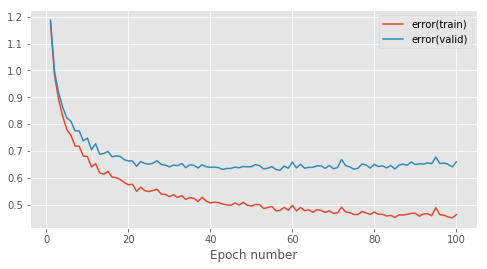

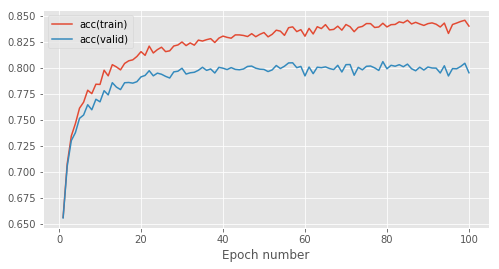

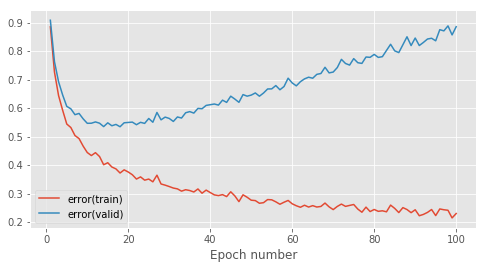

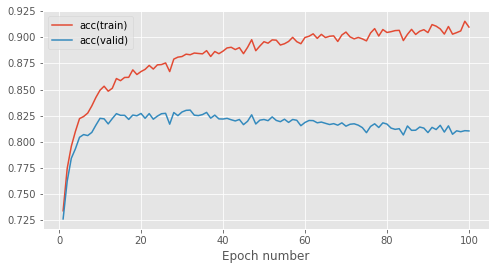

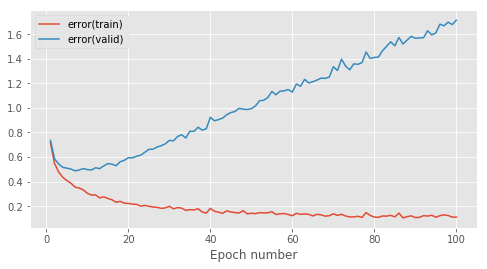

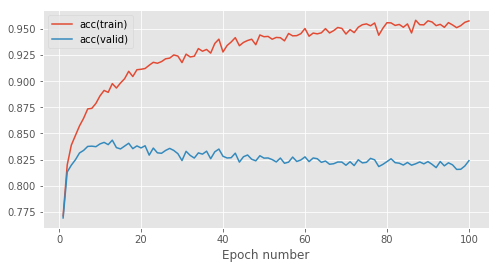

In [87]:
#setup hyperparameters
num_epochs = 100
stats_interval = 1
input_dim, output_dim = 784, 47

hidden_dims = [32, 64, 128]

layer3_stats = defaultdict(tuple)

for hidden_dim in hidden_dims:
    print("******* {} hidden units *******".format(hidden_dim))
    # Reset random number generator and data provider states on each run
    # to ensure reproducibility of results
    rng.seed(seed)
    train_data.reset()
    valid_data.reset()

    # Alter data-provider batch size
    train_data.batch_size = batch_size 
    valid_data.batch_size = batch_size
    
    weights_init = GlorotUniformInit(rng=rng)
    biases_init = ConstantInit(0.)
    model = MultipleLayerModel([
        AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
        ReluLayer(),
        AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
    ])

    error = CrossEntropySoftmaxError()
    # Use a basic gradient descent learning rule
    learning_rule = AdamLearningRule()

    #Remember to use notebook=False when you write a script to be run in a terminal
    stats = train_model_and_plot_stats(
        model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval, notebook=True)
    
    layer3_stats[hidden_dim] = stats
    

In [88]:
for (num_units, stats) in layer3_stats.items(): 
    print("3 layers, {} hidden units per layer:".format(num_units))
    
    # initialise empty model with the same architecture of the trained model
    best_model = MultipleLayerModel([
        AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
        ReluLayer(),
        AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
    ])

    createBestModelAndCalculateAccuracy(stats[0].model, best_model, stats[0].model.params, stats[0].best_model_params, test_data)
    print()

3 layers, 32 hidden units per layer:
Test set accuracy on best model: 0.7950632911392406

3 layers, 64 hidden units per layer:
Test set accuracy on best model: 0.8169620253164556

3 layers, 128 hidden units per layer:
Test set accuracy on best model: 0.8339873417721518



## 4.3 EMINST Experiments

How to choose a networks hyperparameters (from Nielsen): http://neuralnetworksanddeeplearning.com/chap3.html#how_to_choose_a_neural_network's_hyper-parameters

#### 2A: Comparing activation functions

Parameters:

- Batch size
- Learning rate
- Activation function

#### Load data and set initial hyper-parameters 

In [12]:
input_dim, output_dim, hidden_dim = 784, 47, 128
numHiddenLayers = 3

# changing batch size (and number of batches for smaller sets)
seed = 11102019 
rng = np.random.RandomState(seed)

batch_size = 100
max_num_batches_train = 100
max_num_batches_valid = 10

# defaults: batch_size=100, max_num_batches=-1

train_data_100 = EMNISTDataProvider('train', batch_size=batch_size, max_num_batches=max_num_batches_train, rng=rng)
valid_data_10 = EMNISTDataProvider('valid', batch_size=batch_size, max_num_batches=max_num_batches_valid, rng=rng)

KeysView(<numpy.lib.npyio.NpzFile object at 0x11f4ea978>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11f42ea20>)


In [13]:
def createMultiLayerModel(numHiddenLayers, hiddenLayerType, input_dim, hidden_dim, output_dim, rng):
    weights_init = GlorotUniformInit(rng=rng)
    biases_init = ConstantInit(0.)

    model_layers = [
        AffineLayer(input_dim, hidden_dim, weights_init, biases_init)
    ]

    for i in range(numHiddenLayers):
        if hiddenLayerType is not None:
            model_layers.append(hiddenLayerType)

        if i == numHiddenLayers - 1:
            # final numHiddenLayers
            model_layers.append(AffineLayer(hidden_dim, output_dim, weights_init, biases_init))
        else:
            model_layers.append(AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init))

    return MultipleLayerModel(model_layers)

In [14]:
# code common to all models
def trainModel(model,
               train_data,
               valid_data,
               learning_rate = 0.01,
               num_epochs = 100,
               stats_interval = 1,
               batch_size = 100,
               hidden_dim = 128,
               early_stopping = None):

    input_dim, output_dim = 784, 47

    # reset data providers
    train_data.reset()
    valid_data.reset()

    train_data.batch_size = batch_size
    valid_data.batch_size = batch_size

    # set error function and learning rule
    error = CrossEntropySoftmaxError()
    learning_rule = AdamLearningRule()
    
    # train model
    model_stats = train_model_and_plot_stats(
        model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval, notebook=True, early_stopping=early_stopping
    )
    
    return model_stats

#### Leaky ReLU

In [10]:
from mlp.layers import LeakyReluLayer

def createMultiLayerLReLUModel(numHiddenLayers, alpha, input_dim, hidden_dim, output_dim, batch_size, rng):
    # initialise hyperparameters
    leakiness = np.ones((batch_size, hidden_dim)) * alpha

    hiddenLayerType = LeakyReluLayer(alpha=leakiness)
    
    return createMultiLayerModel(numHiddenLayers, hiddenLayerType, input_dim, hidden_dim, output_dim, rng)
    

In [11]:
def gatherLRELUSamples(numSamples, alpha, num_epochs, train_data, valid_data, test_data=None, early_stopping=None):
    lrelu_valid_accs = []
    
    if test_data is not None:
        lrelu_test_accs = []
    
    for i in range(0, numSamples):
        print("*********** Sample {} ***********".format(i+1))
        # reset rng
        rng.seed(i)

        # create model (3 layers)
        lrelu_model = createMultiLayerLReLUModel(numHiddenLayers, alpha, input_dim, hidden_dim, output_dim, batch_size, rng)

        leaky_relu_stats = trainModel(lrelu_model, train_data, valid_data,
                                       learning_rate = 0.01,
                                       num_epochs = num_epochs,
                                       stats_interval = 1,
                                       batch_size = 100,
                                       hidden_dim = 128,
                                       early_stopping = early_stopping)

        # create empty "best model"
        best_lrelu_model = createMultiLayerLReLUModel(numHiddenLayers, alpha, input_dim, hidden_dim, output_dim, batch_size, rng)

        # report best model validation set accuracy
        lrelu_valid_acc = createBestModelAndCalculateAccuracy(leaky_relu_stats[0].model, best_lrelu_model, leaky_relu_stats[0].model.params, leaky_relu_stats[0].best_model_params, valid_data, 'Validation')

        lrelu_valid_accs.append(lrelu_valid_acc)
        
        if test_data is not None: 
            lrelu_test_acc = createBestModelAndCalculateAccuracy(leaky_relu_stats[0].model, best_lrelu_model, leaky_relu_stats[0].model.params, leaky_relu_stats[0].best_model_params, test_data, 'Test')
            lrelu_test_accs.append(lrelu_test_acc)
    
    mean = np.array(lrelu_valid_accs).mean()
    sd = np.array(lrelu_valid_accs).std()
    
    if test_data is not None:
        mean_test = np.array(lrelu_test_accs).mean()
        sd_test = np.array(lrelu_test_accs).std()

        return mean, sd, mean_test, sd_test

    return mean, sd


*********** LRELU 0.001 ***********
*********** Sample 1 ***********


Epoch 1: 0.3s to complete
    error(train)=3.68e+00, acc(train)=1.16e-01, error(valid)=3.71e+00, acc(valid)=9.00e-02
Epoch 2: 0.2s to complete
    error(train)=3.38e+00, acc(train)=1.53e-01, error(valid)=3.52e+00, acc(valid)=9.00e-02
Epoch 3: 0.2s to complete
    error(train)=2.98e+00, acc(train)=2.57e-01, error(valid)=2.93e+00, acc(valid)=2.90e-01
Epoch 4: 0.2s to complete
    error(train)=2.46e+00, acc(train)=3.59e-01, error(valid)=2.24e+00, acc(valid)=4.00e-01
Epoch 5: 0.2s to complete
    error(train)=2.10e+00, acc(train)=4.34e-01, error(valid)=2.36e+00, acc(valid)=3.70e-01
Epoch 6: 0.3s to complete
    error(train)=2.00e+00, acc(train)=4.42e-01, error(valid)=1.90e+00, acc(valid)=4.80e-01
Epoch 7: 0.3s to complete
    error(train)=1.83e+00, acc(train)=5.01e-01, error(valid)=1.56e+00, acc(valid)=6.00e-01
Epoch 8: 0.2s to complete
    error(train)=1.71e+00, acc(train)=5.25e-01, error(valid)=1.80e+00, acc(valid)=5.10e-01
Epoch 9: 0.2s to complete
    error(train)=1.66e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=7.69e-01, acc(train)=7.62e-01, error(valid)=6.81e-01, acc(valid)=7.70e-01
Epoch 72: 0.2s to complete
    error(train)=8.18e-01, acc(train)=7.51e-01, error(valid)=6.58e-01, acc(valid)=8.00e-01
Epoch 73: 0.2s to complete
    error(train)=8.46e-01, acc(train)=7.41e-01, error(valid)=6.09e-01, acc(valid)=8.60e-01
Epoch 74: 0.2s to complete
    error(train)=8.09e-01, acc(train)=7.62e-01, error(valid)=9.88e-01, acc(valid)=6.70e-01
Epoch 75: 0.2s to complete
    error(train)=7.61e-01, acc(train)=7.58e-01, error(valid)=8.00e-01, acc(valid)=7.20e-01
Epoch 76: 0.2s to complete
    error(train)=6.94e-01, acc(train)=7.82e-01, error(valid)=9.01e-01, acc(valid)=7.60e-01
Epoch 77: 0.2s to complete
    error(train)=7.68e-01, acc(train)=7.58e-01, error(valid)=9.12e-01, acc(valid)=7.00e-01
Epoch 78: 0.2s to complete
    error(train)=7.58e-01, acc(train)=7.64e-01, error(valid)=8.08e-01, acc(valid)=7.30e-01
Epoch 79: 0.2s to complete
    error(train)=7.45e-01, ac


Validation set accuracy on best model: 0.69
*********** Sample 2 ***********


Epoch 1: 0.3s to complete
    error(train)=3.72e+00, acc(train)=9.20e-02, error(valid)=3.70e+00, acc(valid)=1.00e-01
Epoch 2: 0.3s to complete
    error(train)=3.44e+00, acc(train)=1.44e-01, error(valid)=3.36e+00, acc(valid)=1.90e-01
Epoch 3: 0.3s to complete
    error(train)=2.99e+00, acc(train)=2.83e-01, error(valid)=3.02e+00, acc(valid)=2.70e-01
Epoch 4: 0.2s to complete
    error(train)=2.63e+00, acc(train)=3.26e-01, error(valid)=2.48e+00, acc(valid)=3.80e-01
Epoch 5: 0.3s to complete
    error(train)=2.23e+00, acc(train)=3.90e-01, error(valid)=2.11e+00, acc(valid)=4.10e-01
Epoch 6: 0.2s to complete
    error(train)=2.02e+00, acc(train)=4.33e-01, error(valid)=2.05e+00, acc(valid)=4.40e-01
Epoch 7: 0.2s to complete
    error(train)=1.88e+00, acc(train)=5.00e-01, error(valid)=1.87e+00, acc(valid)=4.50e-01
Epoch 8: 0.2s to complete
    error(train)=1.69e+00, acc(train)=5.14e-01, error(valid)=1.59e+00, acc(valid)=5.40e-01
Epoch 9: 0.2s to complete
    error(train)=1.68e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=8.27e-01, acc(train)=7.43e-01, error(valid)=9.71e-01, acc(valid)=7.00e-01
Epoch 72: 0.2s to complete
    error(train)=7.88e-01, acc(train)=7.63e-01, error(valid)=8.55e-01, acc(valid)=7.10e-01
Epoch 73: 0.2s to complete
    error(train)=7.64e-01, acc(train)=7.64e-01, error(valid)=8.46e-01, acc(valid)=7.40e-01
Epoch 74: 0.3s to complete
    error(train)=7.76e-01, acc(train)=7.55e-01, error(valid)=9.20e-01, acc(valid)=7.10e-01
Epoch 75: 0.2s to complete
    error(train)=8.52e-01, acc(train)=7.24e-01, error(valid)=7.08e-01, acc(valid)=7.80e-01
Epoch 76: 0.2s to complete
    error(train)=7.60e-01, acc(train)=7.58e-01, error(valid)=7.83e-01, acc(valid)=7.30e-01
Epoch 77: 0.3s to complete
    error(train)=8.73e-01, acc(train)=7.27e-01, error(valid)=8.01e-01, acc(valid)=7.40e-01
Epoch 78: 0.3s to complete
    error(train)=7.26e-01, acc(train)=7.68e-01, error(valid)=7.60e-01, acc(valid)=7.70e-01
Epoch 79: 0.3s to complete
    error(train)=7.97e-01, ac


Validation set accuracy on best model: 0.83
*********** Sample 3 ***********


Epoch 1: 0.2s to complete
    error(train)=3.73e+00, acc(train)=1.09e-01, error(valid)=3.73e+00, acc(valid)=1.10e-01
Epoch 2: 0.2s to complete
    error(train)=3.51e+00, acc(train)=1.54e-01, error(valid)=3.48e+00, acc(valid)=1.70e-01
Epoch 3: 0.2s to complete
    error(train)=3.07e+00, acc(train)=2.44e-01, error(valid)=3.05e+00, acc(valid)=2.40e-01
Epoch 4: 0.2s to complete
    error(train)=2.67e+00, acc(train)=3.26e-01, error(valid)=2.58e+00, acc(valid)=3.50e-01
Epoch 5: 0.2s to complete
    error(train)=2.33e+00, acc(train)=3.67e-01, error(valid)=2.34e+00, acc(valid)=3.10e-01
Epoch 6: 0.2s to complete
    error(train)=2.09e+00, acc(train)=4.38e-01, error(valid)=2.25e+00, acc(valid)=3.40e-01
Epoch 7: 0.2s to complete
    error(train)=1.88e+00, acc(train)=4.70e-01, error(valid)=1.89e+00, acc(valid)=4.10e-01
Epoch 8: 0.3s to complete
    error(train)=1.78e+00, acc(train)=5.00e-01, error(valid)=1.88e+00, acc(valid)=4.20e-01
Epoch 9: 0.2s to complete
    error(train)=1.71e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=8.35e-01, acc(train)=7.41e-01, error(valid)=4.65e-01, acc(valid)=8.60e-01
Epoch 72: 0.2s to complete
    error(train)=7.61e-01, acc(train)=7.58e-01, error(valid)=8.57e-01, acc(valid)=7.50e-01
Epoch 73: 0.2s to complete
    error(train)=8.13e-01, acc(train)=7.62e-01, error(valid)=9.34e-01, acc(valid)=7.50e-01
Epoch 74: 0.2s to complete
    error(train)=8.31e-01, acc(train)=7.57e-01, error(valid)=7.15e-01, acc(valid)=7.90e-01
Epoch 75: 0.2s to complete
    error(train)=8.81e-01, acc(train)=7.30e-01, error(valid)=8.27e-01, acc(valid)=7.60e-01
Epoch 76: 0.2s to complete
    error(train)=8.06e-01, acc(train)=7.36e-01, error(valid)=1.05e+00, acc(valid)=7.40e-01
Epoch 77: 0.2s to complete
    error(train)=7.73e-01, acc(train)=7.57e-01, error(valid)=5.49e-01, acc(valid)=7.90e-01
Epoch 78: 0.2s to complete
    error(train)=7.91e-01, acc(train)=7.50e-01, error(valid)=1.06e+00, acc(valid)=6.60e-01
Epoch 79: 0.2s to complete
    error(train)=7.43e-01, ac


Validation set accuracy on best model: 0.78
*********** Sample 4 ***********


Epoch 1: 0.2s to complete
    error(train)=3.73e+00, acc(train)=9.10e-02, error(valid)=3.68e+00, acc(valid)=1.50e-01
Epoch 2: 0.2s to complete
    error(train)=3.48e+00, acc(train)=1.56e-01, error(valid)=3.48e+00, acc(valid)=1.90e-01
Epoch 3: 0.2s to complete
    error(train)=3.09e+00, acc(train)=2.10e-01, error(valid)=3.20e+00, acc(valid)=2.10e-01
Epoch 4: 0.2s to complete
    error(train)=2.71e+00, acc(train)=3.29e-01, error(valid)=2.69e+00, acc(valid)=3.10e-01
Epoch 5: 0.2s to complete
    error(train)=2.31e+00, acc(train)=4.04e-01, error(valid)=2.39e+00, acc(valid)=3.70e-01
Epoch 6: 0.2s to complete
    error(train)=1.91e+00, acc(train)=4.78e-01, error(valid)=2.14e+00, acc(valid)=4.10e-01
Epoch 7: 0.2s to complete
    error(train)=1.83e+00, acc(train)=4.79e-01, error(valid)=1.81e+00, acc(valid)=5.20e-01
Epoch 8: 0.2s to complete
    error(train)=1.84e+00, acc(train)=4.88e-01, error(valid)=1.94e+00, acc(valid)=4.20e-01
Epoch 9: 0.2s to complete
    error(train)=1.76e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=7.74e-01, acc(train)=7.59e-01, error(valid)=7.38e-01, acc(valid)=7.70e-01
Epoch 72: 0.2s to complete
    error(train)=7.92e-01, acc(train)=7.61e-01, error(valid)=7.18e-01, acc(valid)=7.30e-01
Epoch 73: 0.2s to complete
    error(train)=8.45e-01, acc(train)=7.53e-01, error(valid)=7.71e-01, acc(valid)=7.60e-01
Epoch 74: 0.2s to complete
    error(train)=7.90e-01, acc(train)=7.57e-01, error(valid)=6.24e-01, acc(valid)=8.10e-01
Epoch 75: 0.2s to complete
    error(train)=7.77e-01, acc(train)=7.65e-01, error(valid)=1.07e+00, acc(valid)=7.00e-01
Epoch 76: 0.2s to complete
    error(train)=8.04e-01, acc(train)=7.57e-01, error(valid)=1.04e+00, acc(valid)=7.30e-01
Epoch 77: 0.2s to complete
    error(train)=7.61e-01, acc(train)=7.58e-01, error(valid)=8.44e-01, acc(valid)=7.40e-01
Epoch 78: 0.2s to complete
    error(train)=7.58e-01, acc(train)=7.65e-01, error(valid)=1.01e+00, acc(valid)=7.00e-01
Epoch 79: 0.2s to complete
    error(train)=7.89e-01, ac


Validation set accuracy on best model: 0.78
*********** Sample 5 ***********


Epoch 1: 0.2s to complete
    error(train)=3.69e+00, acc(train)=1.00e-01, error(valid)=3.72e+00, acc(valid)=5.00e-02
Epoch 2: 0.2s to complete
    error(train)=3.40e+00, acc(train)=1.95e-01, error(valid)=3.37e+00, acc(valid)=1.60e-01
Epoch 3: 0.2s to complete
    error(train)=3.00e+00, acc(train)=2.54e-01, error(valid)=3.00e+00, acc(valid)=2.50e-01
Epoch 4: 0.2s to complete
    error(train)=2.56e+00, acc(train)=3.57e-01, error(valid)=2.64e+00, acc(valid)=2.60e-01
Epoch 5: 0.2s to complete
    error(train)=2.29e+00, acc(train)=3.94e-01, error(valid)=2.30e+00, acc(valid)=3.20e-01
Epoch 6: 0.2s to complete
    error(train)=2.09e+00, acc(train)=4.30e-01, error(valid)=2.15e+00, acc(valid)=4.20e-01
Epoch 7: 0.2s to complete
    error(train)=1.82e+00, acc(train)=4.96e-01, error(valid)=2.21e+00, acc(valid)=4.00e-01
Epoch 8: 0.2s to complete
    error(train)=1.76e+00, acc(train)=5.13e-01, error(valid)=1.78e+00, acc(valid)=4.90e-01
Epoch 9: 0.2s to complete
    error(train)=1.64e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=7.30e-01, acc(train)=7.72e-01, error(valid)=9.48e-01, acc(valid)=7.20e-01
Epoch 72: 0.2s to complete
    error(train)=8.19e-01, acc(train)=7.50e-01, error(valid)=9.81e-01, acc(valid)=7.30e-01
Epoch 73: 0.2s to complete
    error(train)=7.65e-01, acc(train)=7.56e-01, error(valid)=6.51e-01, acc(valid)=8.60e-01
Epoch 74: 0.2s to complete
    error(train)=8.07e-01, acc(train)=7.56e-01, error(valid)=7.90e-01, acc(valid)=7.60e-01
Epoch 75: 0.2s to complete
    error(train)=8.25e-01, acc(train)=7.49e-01, error(valid)=7.74e-01, acc(valid)=7.80e-01
Epoch 76: 0.2s to complete
    error(train)=7.81e-01, acc(train)=7.60e-01, error(valid)=7.53e-01, acc(valid)=7.30e-01
Epoch 77: 0.2s to complete
    error(train)=8.05e-01, acc(train)=7.45e-01, error(valid)=9.30e-01, acc(valid)=6.80e-01
Epoch 78: 0.2s to complete
    error(train)=8.30e-01, acc(train)=7.49e-01, error(valid)=9.57e-01, acc(valid)=7.00e-01
Epoch 79: 0.2s to complete
    error(train)=7.60e-01, ac


Validation set accuracy on best model: 0.77
*********** Sample 6 ***********


Epoch 1: 0.3s to complete
    error(train)=3.71e+00, acc(train)=6.50e-02, error(valid)=3.75e+00, acc(valid)=5.00e-02
Epoch 2: 0.2s to complete
    error(train)=3.46e+00, acc(train)=1.21e-01, error(valid)=3.39e+00, acc(valid)=1.10e-01
Epoch 3: 0.2s to complete
    error(train)=3.07e+00, acc(train)=2.22e-01, error(valid)=3.22e+00, acc(valid)=1.60e-01
Epoch 4: 0.2s to complete
    error(train)=2.68e+00, acc(train)=2.91e-01, error(valid)=2.60e+00, acc(valid)=3.30e-01
Epoch 5: 0.2s to complete
    error(train)=2.41e+00, acc(train)=3.55e-01, error(valid)=2.35e+00, acc(valid)=3.90e-01
Epoch 6: 0.2s to complete
    error(train)=2.09e+00, acc(train)=4.08e-01, error(valid)=2.02e+00, acc(valid)=4.30e-01
Epoch 7: 0.2s to complete
    error(train)=1.94e+00, acc(train)=4.69e-01, error(valid)=2.08e+00, acc(valid)=3.70e-01
Epoch 8: 0.2s to complete
    error(train)=1.80e+00, acc(train)=4.69e-01, error(valid)=1.67e+00, acc(valid)=5.40e-01
Epoch 9: 0.2s to complete
    error(train)=1.75e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=7.81e-01, acc(train)=7.55e-01, error(valid)=5.92e-01, acc(valid)=7.50e-01
Epoch 72: 0.2s to complete
    error(train)=7.28e-01, acc(train)=7.63e-01, error(valid)=1.02e+00, acc(valid)=7.40e-01
Epoch 73: 0.2s to complete
    error(train)=7.84e-01, acc(train)=7.52e-01, error(valid)=7.83e-01, acc(valid)=7.60e-01
Epoch 74: 0.2s to complete
    error(train)=8.17e-01, acc(train)=7.55e-01, error(valid)=8.58e-01, acc(valid)=7.40e-01
Epoch 75: 0.2s to complete
    error(train)=7.47e-01, acc(train)=7.64e-01, error(valid)=9.45e-01, acc(valid)=7.50e-01
Epoch 76: 0.2s to complete
    error(train)=7.30e-01, acc(train)=7.64e-01, error(valid)=6.34e-01, acc(valid)=7.90e-01
Epoch 77: 0.2s to complete
    error(train)=6.92e-01, acc(train)=7.84e-01, error(valid)=7.26e-01, acc(valid)=7.50e-01
Epoch 78: 0.2s to complete
    error(train)=7.17e-01, acc(train)=7.80e-01, error(valid)=6.76e-01, acc(valid)=7.70e-01
Epoch 79: 0.2s to complete
    error(train)=7.58e-01, ac


Validation set accuracy on best model: 0.76
*********** Sample 7 ***********


Epoch 1: 0.2s to complete
    error(train)=3.71e+00, acc(train)=9.90e-02, error(valid)=3.69e+00, acc(valid)=1.00e-01
Epoch 2: 0.2s to complete
    error(train)=3.40e+00, acc(train)=1.87e-01, error(valid)=3.36e+00, acc(valid)=2.20e-01
Epoch 3: 0.2s to complete
    error(train)=3.01e+00, acc(train)=2.38e-01, error(valid)=2.99e+00, acc(valid)=2.70e-01
Epoch 4: 0.2s to complete
    error(train)=2.60e+00, acc(train)=3.20e-01, error(valid)=2.63e+00, acc(valid)=3.50e-01
Epoch 5: 0.2s to complete
    error(train)=2.29e+00, acc(train)=4.04e-01, error(valid)=2.36e+00, acc(valid)=3.80e-01
Epoch 6: 0.2s to complete
    error(train)=2.07e+00, acc(train)=4.44e-01, error(valid)=2.09e+00, acc(valid)=3.40e-01
Epoch 7: 0.2s to complete
    error(train)=1.86e+00, acc(train)=4.74e-01, error(valid)=1.67e+00, acc(valid)=5.60e-01
Epoch 8: 0.2s to complete
    error(train)=1.74e+00, acc(train)=5.12e-01, error(valid)=1.66e+00, acc(valid)=4.90e-01
Epoch 9: 0.2s to complete
    error(train)=1.72e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=7.99e-01, acc(train)=7.50e-01, error(valid)=6.57e-01, acc(valid)=7.80e-01
Epoch 72: 0.2s to complete
    error(train)=7.99e-01, acc(train)=7.51e-01, error(valid)=8.39e-01, acc(valid)=7.00e-01
Epoch 73: 0.2s to complete
    error(train)=7.42e-01, acc(train)=7.50e-01, error(valid)=7.76e-01, acc(valid)=8.00e-01
Epoch 74: 0.2s to complete
    error(train)=7.51e-01, acc(train)=7.62e-01, error(valid)=8.73e-01, acc(valid)=7.70e-01
Epoch 75: 0.2s to complete
    error(train)=7.80e-01, acc(train)=7.49e-01, error(valid)=6.98e-01, acc(valid)=7.60e-01
Epoch 76: 0.2s to complete
    error(train)=7.54e-01, acc(train)=7.57e-01, error(valid)=6.59e-01, acc(valid)=7.60e-01
Epoch 77: 0.2s to complete
    error(train)=7.10e-01, acc(train)=7.91e-01, error(valid)=7.61e-01, acc(valid)=8.30e-01
Epoch 78: 0.2s to complete
    error(train)=7.59e-01, acc(train)=7.55e-01, error(valid)=8.40e-01, acc(valid)=7.30e-01
Epoch 79: 0.2s to complete
    error(train)=7.92e-01, ac


Validation set accuracy on best model: 0.74
*********** Sample 8 ***********


Epoch 1: 0.2s to complete
    error(train)=3.69e+00, acc(train)=1.27e-01, error(valid)=3.73e+00, acc(valid)=7.00e-02
Epoch 2: 0.2s to complete
    error(train)=3.38e+00, acc(train)=1.77e-01, error(valid)=3.52e+00, acc(valid)=1.00e-01
Epoch 3: 0.2s to complete
    error(train)=2.94e+00, acc(train)=2.88e-01, error(valid)=3.06e+00, acc(valid)=1.70e-01
Epoch 4: 0.2s to complete
    error(train)=2.46e+00, acc(train)=3.84e-01, error(valid)=2.31e+00, acc(valid)=4.30e-01
Epoch 5: 0.3s to complete
    error(train)=2.22e+00, acc(train)=4.01e-01, error(valid)=2.29e+00, acc(valid)=4.00e-01
Epoch 6: 0.3s to complete
    error(train)=2.01e+00, acc(train)=4.09e-01, error(valid)=1.97e+00, acc(valid)=4.00e-01
Epoch 7: 0.2s to complete
    error(train)=1.78e+00, acc(train)=5.00e-01, error(valid)=1.58e+00, acc(valid)=5.20e-01
Epoch 8: 0.3s to complete
    error(train)=1.71e+00, acc(train)=5.02e-01, error(valid)=1.60e+00, acc(valid)=5.20e-01
Epoch 9: 0.2s to complete
    error(train)=1.60e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=7.82e-01, acc(train)=7.48e-01, error(valid)=6.85e-01, acc(valid)=8.40e-01
Epoch 72: 0.2s to complete
    error(train)=7.87e-01, acc(train)=7.43e-01, error(valid)=7.25e-01, acc(valid)=7.90e-01
Epoch 73: 0.2s to complete
    error(train)=8.02e-01, acc(train)=7.44e-01, error(valid)=7.15e-01, acc(valid)=7.80e-01
Epoch 74: 0.2s to complete
    error(train)=8.01e-01, acc(train)=7.47e-01, error(valid)=7.21e-01, acc(valid)=7.80e-01
Epoch 75: 0.3s to complete
    error(train)=7.90e-01, acc(train)=7.60e-01, error(valid)=1.22e+00, acc(valid)=6.80e-01
Epoch 76: 0.2s to complete
    error(train)=7.51e-01, acc(train)=7.62e-01, error(valid)=9.70e-01, acc(valid)=7.10e-01
Epoch 77: 0.2s to complete
    error(train)=7.67e-01, acc(train)=7.60e-01, error(valid)=8.35e-01, acc(valid)=7.10e-01
Epoch 78: 0.2s to complete
    error(train)=8.11e-01, acc(train)=7.47e-01, error(valid)=1.01e+00, acc(valid)=7.40e-01
Epoch 79: 0.2s to complete
    error(train)=7.93e-01, ac


Validation set accuracy on best model: 0.76
*********** Sample 9 ***********


Epoch 1: 0.2s to complete
    error(train)=3.70e+00, acc(train)=9.50e-02, error(valid)=3.70e+00, acc(valid)=7.00e-02
Epoch 2: 0.2s to complete
    error(train)=3.41e+00, acc(train)=1.83e-01, error(valid)=3.33e+00, acc(valid)=2.10e-01
Epoch 3: 0.2s to complete
    error(train)=3.04e+00, acc(train)=2.08e-01, error(valid)=3.09e+00, acc(valid)=2.10e-01
Epoch 4: 0.2s to complete
    error(train)=2.57e+00, acc(train)=3.26e-01, error(valid)=2.49e+00, acc(valid)=3.60e-01
Epoch 5: 0.2s to complete
    error(train)=2.26e+00, acc(train)=3.96e-01, error(valid)=2.19e+00, acc(valid)=3.80e-01
Epoch 6: 0.2s to complete
    error(train)=2.05e+00, acc(train)=4.33e-01, error(valid)=2.06e+00, acc(valid)=5.10e-01
Epoch 7: 0.2s to complete
    error(train)=1.85e+00, acc(train)=4.80e-01, error(valid)=1.94e+00, acc(valid)=5.20e-01
Epoch 8: 0.2s to complete
    error(train)=1.73e+00, acc(train)=5.11e-01, error(valid)=1.60e+00, acc(valid)=5.50e-01
Epoch 9: 0.2s to complete
    error(train)=1.63e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=7.59e-01, acc(train)=7.54e-01, error(valid)=8.94e-01, acc(valid)=7.00e-01
Epoch 72: 0.2s to complete
    error(train)=6.95e-01, acc(train)=7.86e-01, error(valid)=9.54e-01, acc(valid)=7.30e-01
Epoch 73: 0.2s to complete
    error(train)=7.16e-01, acc(train)=7.62e-01, error(valid)=5.39e-01, acc(valid)=7.70e-01
Epoch 74: 0.2s to complete
    error(train)=7.27e-01, acc(train)=7.67e-01, error(valid)=8.98e-01, acc(valid)=7.80e-01
Epoch 75: 0.2s to complete
    error(train)=7.45e-01, acc(train)=7.54e-01, error(valid)=9.64e-01, acc(valid)=6.90e-01
Epoch 76: 0.2s to complete
    error(train)=7.99e-01, acc(train)=7.38e-01, error(valid)=6.09e-01, acc(valid)=7.70e-01
Epoch 77: 0.2s to complete
    error(train)=7.48e-01, acc(train)=7.66e-01, error(valid)=6.23e-01, acc(valid)=8.10e-01
Epoch 78: 0.2s to complete
    error(train)=7.05e-01, acc(train)=7.81e-01, error(valid)=7.84e-01, acc(valid)=7.10e-01
Epoch 79: 0.2s to complete
    error(train)=7.76e-01, ac


Validation set accuracy on best model: 0.75
*********** Sample 10 ***********


Epoch 1: 0.2s to complete
    error(train)=3.70e+00, acc(train)=8.50e-02, error(valid)=3.68e+00, acc(valid)=6.00e-02
Epoch 2: 0.3s to complete
    error(train)=3.41e+00, acc(train)=1.57e-01, error(valid)=3.42e+00, acc(valid)=1.60e-01
Epoch 3: 0.2s to complete
    error(train)=3.04e+00, acc(train)=2.58e-01, error(valid)=2.99e+00, acc(valid)=2.70e-01
Epoch 4: 0.2s to complete
    error(train)=2.59e+00, acc(train)=3.29e-01, error(valid)=2.59e+00, acc(valid)=3.20e-01
Epoch 5: 0.2s to complete
    error(train)=2.33e+00, acc(train)=3.95e-01, error(valid)=2.26e+00, acc(valid)=3.90e-01
Epoch 6: 0.2s to complete
    error(train)=1.98e+00, acc(train)=4.52e-01, error(valid)=2.21e+00, acc(valid)=3.70e-01
Epoch 7: 0.2s to complete
    error(train)=1.89e+00, acc(train)=4.71e-01, error(valid)=1.89e+00, acc(valid)=4.60e-01
Epoch 8: 0.2s to complete
    error(train)=1.80e+00, acc(train)=4.96e-01, error(valid)=1.64e+00, acc(valid)=5.80e-01
Epoch 9: 0.2s to complete
    error(train)=1.69e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=7.39e-01, acc(train)=7.70e-01, error(valid)=8.32e-01, acc(valid)=7.30e-01
Epoch 72: 0.2s to complete
    error(train)=7.84e-01, acc(train)=7.45e-01, error(valid)=8.39e-01, acc(valid)=6.90e-01
Epoch 73: 0.2s to complete
    error(train)=7.78e-01, acc(train)=7.55e-01, error(valid)=9.77e-01, acc(valid)=6.60e-01
Epoch 74: 0.2s to complete
    error(train)=8.15e-01, acc(train)=7.46e-01, error(valid)=7.84e-01, acc(valid)=7.70e-01
Epoch 75: 0.2s to complete
    error(train)=7.87e-01, acc(train)=7.68e-01, error(valid)=8.90e-01, acc(valid)=7.50e-01
Epoch 76: 0.2s to complete
    error(train)=8.13e-01, acc(train)=7.69e-01, error(valid)=1.04e+00, acc(valid)=7.00e-01
Epoch 77: 0.2s to complete
    error(train)=7.18e-01, acc(train)=7.61e-01, error(valid)=8.36e-01, acc(valid)=7.50e-01
Epoch 78: 0.2s to complete
    error(train)=8.15e-01, acc(train)=7.44e-01, error(valid)=1.12e+00, acc(valid)=6.70e-01
Epoch 79: 0.2s to complete
    error(train)=6.72e-01, ac


Validation set accuracy on best model: 0.69
*********** LRELU 0.01 ***********
*********** Sample 1 ***********


Epoch 1: 0.2s to complete
    error(train)=3.68e+00, acc(train)=9.20e-02, error(valid)=3.71e+00, acc(valid)=8.00e-02
Epoch 2: 0.2s to complete
    error(train)=3.42e+00, acc(train)=1.62e-01, error(valid)=3.52e+00, acc(valid)=9.00e-02
Epoch 3: 0.2s to complete
    error(train)=2.95e+00, acc(train)=2.64e-01, error(valid)=2.93e+00, acc(valid)=2.90e-01
Epoch 4: 0.2s to complete
    error(train)=2.57e+00, acc(train)=3.42e-01, error(valid)=2.75e+00, acc(valid)=2.90e-01
Epoch 5: 0.2s to complete
    error(train)=2.15e+00, acc(train)=4.40e-01, error(valid)=2.30e+00, acc(valid)=4.00e-01
Epoch 6: 0.2s to complete
    error(train)=2.02e+00, acc(train)=4.42e-01, error(valid)=2.07e+00, acc(valid)=4.30e-01
Epoch 7: 0.2s to complete
    error(train)=1.95e+00, acc(train)=4.61e-01, error(valid)=1.67e+00, acc(valid)=5.20e-01
Epoch 8: 0.2s to complete
    error(train)=1.80e+00, acc(train)=5.05e-01, error(valid)=1.88e+00, acc(valid)=5.00e-01
Epoch 9: 0.2s to complete
    error(train)=1.72e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=8.04e-01, acc(train)=7.45e-01, error(valid)=1.11e+00, acc(valid)=6.70e-01
Epoch 72: 0.3s to complete
    error(train)=7.75e-01, acc(train)=7.48e-01, error(valid)=7.49e-01, acc(valid)=7.70e-01
Epoch 73: 0.4s to complete
    error(train)=8.27e-01, acc(train)=7.52e-01, error(valid)=5.78e-01, acc(valid)=8.00e-01
Epoch 74: 0.3s to complete
    error(train)=7.54e-01, acc(train)=7.50e-01, error(valid)=1.09e+00, acc(valid)=7.20e-01
Epoch 75: 0.4s to complete
    error(train)=6.70e-01, acc(train)=7.90e-01, error(valid)=9.25e-01, acc(valid)=7.40e-01
Epoch 76: 0.2s to complete
    error(train)=7.28e-01, acc(train)=7.89e-01, error(valid)=8.75e-01, acc(valid)=7.10e-01
Epoch 77: 0.3s to complete
    error(train)=7.55e-01, acc(train)=7.59e-01, error(valid)=8.34e-01, acc(valid)=7.40e-01
Epoch 78: 0.3s to complete
    error(train)=7.81e-01, acc(train)=7.49e-01, error(valid)=6.55e-01, acc(valid)=7.60e-01
Epoch 79: 0.3s to complete
    error(train)=7.99e-01, ac


Validation set accuracy on best model: 0.72
*********** Sample 2 ***********


Epoch 1: 0.3s to complete
    error(train)=3.69e+00, acc(train)=6.40e-02, error(valid)=3.68e+00, acc(valid)=5.00e-02
Epoch 2: 0.2s to complete
    error(train)=3.41e+00, acc(train)=1.63e-01, error(valid)=3.39e+00, acc(valid)=1.70e-01
Epoch 3: 0.2s to complete
    error(train)=2.99e+00, acc(train)=2.33e-01, error(valid)=2.92e+00, acc(valid)=2.90e-01
Epoch 4: 0.2s to complete
    error(train)=2.52e+00, acc(train)=3.30e-01, error(valid)=2.59e+00, acc(valid)=2.90e-01
Epoch 5: 0.3s to complete
    error(train)=2.17e+00, acc(train)=4.02e-01, error(valid)=2.18e+00, acc(valid)=4.20e-01
Epoch 6: 0.2s to complete
    error(train)=2.00e+00, acc(train)=4.53e-01, error(valid)=1.97e+00, acc(valid)=4.80e-01
Epoch 7: 0.2s to complete
    error(train)=1.85e+00, acc(train)=4.71e-01, error(valid)=1.85e+00, acc(valid)=4.80e-01
Epoch 8: 0.2s to complete
    error(train)=1.70e+00, acc(train)=5.13e-01, error(valid)=1.79e+00, acc(valid)=4.90e-01
Epoch 9: 0.2s to complete
    error(train)=1.57e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=7.87e-01, acc(train)=7.55e-01, error(valid)=1.16e+00, acc(valid)=6.50e-01
Epoch 72: 0.2s to complete
    error(train)=7.46e-01, acc(train)=7.72e-01, error(valid)=7.72e-01, acc(valid)=8.10e-01
Epoch 73: 0.2s to complete
    error(train)=7.66e-01, acc(train)=7.44e-01, error(valid)=9.14e-01, acc(valid)=7.30e-01
Epoch 74: 0.2s to complete
    error(train)=8.44e-01, acc(train)=7.43e-01, error(valid)=7.90e-01, acc(valid)=7.50e-01
Epoch 75: 0.2s to complete
    error(train)=7.63e-01, acc(train)=7.54e-01, error(valid)=7.95e-01, acc(valid)=7.30e-01
Epoch 76: 0.2s to complete
    error(train)=7.81e-01, acc(train)=7.86e-01, error(valid)=5.63e-01, acc(valid)=7.80e-01
Epoch 77: 0.2s to complete
    error(train)=7.21e-01, acc(train)=7.89e-01, error(valid)=1.07e+00, acc(valid)=6.80e-01
Epoch 78: 0.2s to complete
    error(train)=7.61e-01, acc(train)=7.63e-01, error(valid)=8.43e-01, acc(valid)=7.50e-01
Epoch 79: 0.2s to complete
    error(train)=7.02e-01, ac


Validation set accuracy on best model: 0.8
*********** Sample 3 ***********


Epoch 1: 0.2s to complete
    error(train)=3.71e+00, acc(train)=1.26e-01, error(valid)=3.74e+00, acc(valid)=1.10e-01
Epoch 2: 0.2s to complete
    error(train)=3.46e+00, acc(train)=2.00e-01, error(valid)=3.47e+00, acc(valid)=1.80e-01
Epoch 3: 0.2s to complete
    error(train)=3.01e+00, acc(train)=2.65e-01, error(valid)=3.02e+00, acc(valid)=3.10e-01
Epoch 4: 0.2s to complete
    error(train)=2.61e+00, acc(train)=3.24e-01, error(valid)=2.58e+00, acc(valid)=3.40e-01
Epoch 5: 0.2s to complete
    error(train)=2.21e+00, acc(train)=4.14e-01, error(valid)=2.23e+00, acc(valid)=4.00e-01
Epoch 6: 0.2s to complete
    error(train)=2.08e+00, acc(train)=4.31e-01, error(valid)=1.91e+00, acc(valid)=5.20e-01
Epoch 7: 0.2s to complete
    error(train)=1.83e+00, acc(train)=4.78e-01, error(valid)=2.19e+00, acc(valid)=4.00e-01
Epoch 8: 0.2s to complete
    error(train)=1.70e+00, acc(train)=5.11e-01, error(valid)=1.72e+00, acc(valid)=5.20e-01
Epoch 9: 0.2s to complete
    error(train)=1.63e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=8.07e-01, acc(train)=7.45e-01, error(valid)=7.87e-01, acc(valid)=7.50e-01
Epoch 72: 0.2s to complete
    error(train)=8.24e-01, acc(train)=7.44e-01, error(valid)=7.13e-01, acc(valid)=7.80e-01
Epoch 73: 0.2s to complete
    error(train)=7.65e-01, acc(train)=7.50e-01, error(valid)=7.90e-01, acc(valid)=7.30e-01
Epoch 74: 0.2s to complete
    error(train)=7.57e-01, acc(train)=7.41e-01, error(valid)=7.12e-01, acc(valid)=7.90e-01
Epoch 75: 0.2s to complete
    error(train)=8.41e-01, acc(train)=7.45e-01, error(valid)=7.49e-01, acc(valid)=7.60e-01
Epoch 76: 0.2s to complete
    error(train)=7.68e-01, acc(train)=7.64e-01, error(valid)=8.99e-01, acc(valid)=7.80e-01
Epoch 77: 0.2s to complete
    error(train)=7.41e-01, acc(train)=7.66e-01, error(valid)=8.31e-01, acc(valid)=7.40e-01
Epoch 78: 0.2s to complete
    error(train)=7.81e-01, acc(train)=7.55e-01, error(valid)=9.76e-01, acc(valid)=7.60e-01
Epoch 79: 0.2s to complete
    error(train)=7.98e-01, ac


Validation set accuracy on best model: 0.72
*********** Sample 4 ***********


Epoch 1: 0.2s to complete
    error(train)=3.68e+00, acc(train)=1.02e-01, error(valid)=3.69e+00, acc(valid)=8.00e-02
Epoch 2: 0.2s to complete
    error(train)=3.44e+00, acc(train)=1.38e-01, error(valid)=3.38e+00, acc(valid)=1.60e-01
Epoch 3: 0.2s to complete
    error(train)=3.04e+00, acc(train)=2.30e-01, error(valid)=3.14e+00, acc(valid)=2.10e-01
Epoch 4: 0.2s to complete
    error(train)=2.51e+00, acc(train)=3.73e-01, error(valid)=2.51e+00, acc(valid)=3.30e-01
Epoch 5: 0.2s to complete
    error(train)=2.23e+00, acc(train)=4.18e-01, error(valid)=2.12e+00, acc(valid)=4.70e-01
Epoch 6: 0.2s to complete
    error(train)=2.08e+00, acc(train)=4.06e-01, error(valid)=1.95e+00, acc(valid)=4.00e-01
Epoch 7: 0.2s to complete
    error(train)=1.91e+00, acc(train)=4.67e-01, error(valid)=2.02e+00, acc(valid)=5.40e-01
Epoch 8: 0.2s to complete
    error(train)=1.75e+00, acc(train)=5.12e-01, error(valid)=1.88e+00, acc(valid)=5.20e-01
Epoch 9: 0.2s to complete
    error(train)=1.65e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=8.69e-01, acc(train)=7.22e-01, error(valid)=8.74e-01, acc(valid)=7.30e-01
Epoch 72: 0.2s to complete
    error(train)=6.73e-01, acc(train)=7.94e-01, error(valid)=8.13e-01, acc(valid)=7.60e-01
Epoch 73: 0.2s to complete
    error(train)=8.19e-01, acc(train)=7.54e-01, error(valid)=7.73e-01, acc(valid)=7.70e-01
Epoch 74: 0.2s to complete
    error(train)=6.73e-01, acc(train)=7.84e-01, error(valid)=7.00e-01, acc(valid)=7.70e-01
Epoch 75: 0.2s to complete
    error(train)=7.45e-01, acc(train)=7.67e-01, error(valid)=6.98e-01, acc(valid)=7.70e-01
Epoch 76: 0.2s to complete
    error(train)=7.98e-01, acc(train)=7.41e-01, error(valid)=8.86e-01, acc(valid)=7.50e-01
Epoch 77: 0.2s to complete
    error(train)=7.32e-01, acc(train)=7.64e-01, error(valid)=5.89e-01, acc(valid)=8.10e-01
Epoch 78: 0.2s to complete
    error(train)=8.09e-01, acc(train)=7.47e-01, error(valid)=7.14e-01, acc(valid)=7.40e-01
Epoch 79: 0.2s to complete
    error(train)=7.06e-01, ac


Validation set accuracy on best model: 0.79
*********** Sample 5 ***********


Epoch 1: 0.2s to complete
    error(train)=3.69e+00, acc(train)=8.90e-02, error(valid)=3.71e+00, acc(valid)=6.00e-02
Epoch 2: 0.2s to complete
    error(train)=3.40e+00, acc(train)=1.70e-01, error(valid)=3.43e+00, acc(valid)=1.50e-01
Epoch 3: 0.3s to complete
    error(train)=2.98e+00, acc(train)=2.24e-01, error(valid)=2.89e+00, acc(valid)=2.70e-01
Epoch 4: 0.2s to complete
    error(train)=2.50e+00, acc(train)=3.66e-01, error(valid)=2.44e+00, acc(valid)=3.90e-01
Epoch 5: 0.3s to complete
    error(train)=2.16e+00, acc(train)=3.91e-01, error(valid)=2.12e+00, acc(valid)=4.40e-01
Epoch 6: 0.2s to complete
    error(train)=1.99e+00, acc(train)=4.43e-01, error(valid)=2.13e+00, acc(valid)=3.90e-01
Epoch 7: 0.2s to complete
    error(train)=1.77e+00, acc(train)=5.02e-01, error(valid)=1.80e+00, acc(valid)=4.70e-01
Epoch 8: 0.2s to complete
    error(train)=1.74e+00, acc(train)=5.16e-01, error(valid)=1.86e+00, acc(valid)=4.70e-01
Epoch 9: 0.2s to complete
    error(train)=1.64e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=7.47e-01, acc(train)=7.58e-01, error(valid)=9.93e-01, acc(valid)=7.10e-01
Epoch 72: 0.2s to complete
    error(train)=8.15e-01, acc(train)=7.50e-01, error(valid)=7.61e-01, acc(valid)=7.20e-01
Epoch 73: 0.2s to complete
    error(train)=8.23e-01, acc(train)=7.58e-01, error(valid)=7.11e-01, acc(valid)=8.00e-01
Epoch 74: 0.2s to complete
    error(train)=7.08e-01, acc(train)=7.57e-01, error(valid)=7.02e-01, acc(valid)=7.70e-01
Epoch 75: 0.2s to complete
    error(train)=7.63e-01, acc(train)=7.60e-01, error(valid)=6.92e-01, acc(valid)=7.90e-01
Epoch 76: 0.3s to complete
    error(train)=7.91e-01, acc(train)=7.51e-01, error(valid)=6.53e-01, acc(valid)=7.90e-01
Epoch 77: 0.2s to complete
    error(train)=8.22e-01, acc(train)=7.57e-01, error(valid)=6.13e-01, acc(valid)=8.30e-01
Epoch 78: 0.3s to complete
    error(train)=7.61e-01, acc(train)=7.59e-01, error(valid)=1.19e+00, acc(valid)=6.60e-01
Epoch 79: 0.2s to complete
    error(train)=6.92e-01, ac


Validation set accuracy on best model: 0.68
*********** Sample 6 ***********


Epoch 1: 0.3s to complete
    error(train)=3.72e+00, acc(train)=7.40e-02, error(valid)=3.74e+00, acc(valid)=8.00e-02
Epoch 2: 0.2s to complete
    error(train)=3.49e+00, acc(train)=1.36e-01, error(valid)=3.45e+00, acc(valid)=1.70e-01
Epoch 3: 0.2s to complete
    error(train)=3.05e+00, acc(train)=2.10e-01, error(valid)=3.09e+00, acc(valid)=2.20e-01
Epoch 4: 0.2s to complete
    error(train)=2.64e+00, acc(train)=3.37e-01, error(valid)=2.63e+00, acc(valid)=3.10e-01
Epoch 5: 0.2s to complete
    error(train)=2.30e+00, acc(train)=4.05e-01, error(valid)=2.37e+00, acc(valid)=3.60e-01
Epoch 6: 0.2s to complete
    error(train)=2.11e+00, acc(train)=4.41e-01, error(valid)=2.12e+00, acc(valid)=4.10e-01
Epoch 7: 0.2s to complete
    error(train)=1.92e+00, acc(train)=4.87e-01, error(valid)=2.00e+00, acc(valid)=4.90e-01
Epoch 8: 0.3s to complete
    error(train)=1.79e+00, acc(train)=5.07e-01, error(valid)=1.81e+00, acc(valid)=4.60e-01
Epoch 9: 0.2s to complete
    error(train)=1.75e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=8.05e-01, acc(train)=7.74e-01, error(valid)=7.99e-01, acc(valid)=7.40e-01
Epoch 72: 0.2s to complete
    error(train)=8.40e-01, acc(train)=7.49e-01, error(valid)=8.58e-01, acc(valid)=7.30e-01
Epoch 73: 0.3s to complete
    error(train)=7.46e-01, acc(train)=7.66e-01, error(valid)=8.33e-01, acc(valid)=7.60e-01
Epoch 74: 0.3s to complete
    error(train)=7.86e-01, acc(train)=7.50e-01, error(valid)=7.77e-01, acc(valid)=7.10e-01
Epoch 75: 0.2s to complete
    error(train)=8.20e-01, acc(train)=7.51e-01, error(valid)=7.98e-01, acc(valid)=7.30e-01
Epoch 76: 0.2s to complete
    error(train)=7.33e-01, acc(train)=7.79e-01, error(valid)=9.00e-01, acc(valid)=7.60e-01
Epoch 77: 0.2s to complete
    error(train)=7.07e-01, acc(train)=7.80e-01, error(valid)=9.15e-01, acc(valid)=7.30e-01
Epoch 78: 0.2s to complete
    error(train)=7.71e-01, acc(train)=7.43e-01, error(valid)=7.63e-01, acc(valid)=7.70e-01
Epoch 79: 0.2s to complete
    error(train)=7.82e-01, ac


Validation set accuracy on best model: 0.67
*********** Sample 7 ***********


Epoch 1: 0.3s to complete
    error(train)=3.70e+00, acc(train)=5.20e-02, error(valid)=3.71e+00, acc(valid)=4.00e-02
Epoch 2: 0.2s to complete
    error(train)=3.42e+00, acc(train)=1.44e-01, error(valid)=3.40e+00, acc(valid)=1.20e-01
Epoch 3: 0.2s to complete
    error(train)=3.03e+00, acc(train)=2.25e-01, error(valid)=2.88e+00, acc(valid)=2.80e-01
Epoch 4: 0.2s to complete
    error(train)=2.56e+00, acc(train)=3.34e-01, error(valid)=2.77e+00, acc(valid)=2.70e-01
Epoch 5: 0.2s to complete
    error(train)=2.34e+00, acc(train)=3.78e-01, error(valid)=2.28e+00, acc(valid)=3.40e-01
Epoch 6: 0.2s to complete
    error(train)=2.03e+00, acc(train)=4.29e-01, error(valid)=2.05e+00, acc(valid)=4.40e-01
Epoch 7: 0.2s to complete
    error(train)=1.95e+00, acc(train)=4.60e-01, error(valid)=1.98e+00, acc(valid)=4.90e-01
Epoch 8: 0.3s to complete
    error(train)=1.73e+00, acc(train)=5.13e-01, error(valid)=1.94e+00, acc(valid)=4.90e-01
Epoch 9: 0.3s to complete
    error(train)=1.76e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=8.35e-01, acc(train)=7.43e-01, error(valid)=7.36e-01, acc(valid)=7.30e-01
Epoch 72: 0.2s to complete
    error(train)=7.52e-01, acc(train)=7.51e-01, error(valid)=7.72e-01, acc(valid)=7.40e-01
Epoch 73: 0.2s to complete
    error(train)=7.78e-01, acc(train)=7.61e-01, error(valid)=9.31e-01, acc(valid)=7.30e-01
Epoch 74: 0.2s to complete
    error(train)=7.62e-01, acc(train)=7.54e-01, error(valid)=8.32e-01, acc(valid)=7.20e-01
Epoch 75: 0.2s to complete
    error(train)=7.88e-01, acc(train)=7.52e-01, error(valid)=6.25e-01, acc(valid)=8.30e-01
Epoch 76: 0.2s to complete
    error(train)=7.75e-01, acc(train)=7.58e-01, error(valid)=1.02e+00, acc(valid)=7.10e-01
Epoch 77: 0.2s to complete
    error(train)=8.68e-01, acc(train)=7.33e-01, error(valid)=5.77e-01, acc(valid)=7.80e-01
Epoch 78: 0.2s to complete
    error(train)=7.36e-01, acc(train)=7.69e-01, error(valid)=7.20e-01, acc(valid)=7.70e-01
Epoch 79: 0.2s to complete
    error(train)=7.26e-01, ac


Validation set accuracy on best model: 0.86
*********** Sample 8 ***********


Epoch 1: 0.2s to complete
    error(train)=3.69e+00, acc(train)=1.32e-01, error(valid)=3.70e+00, acc(valid)=1.00e-01
Epoch 2: 0.2s to complete
    error(train)=3.40e+00, acc(train)=1.81e-01, error(valid)=3.37e+00, acc(valid)=1.70e-01
Epoch 3: 0.2s to complete
    error(train)=2.89e+00, acc(train)=2.46e-01, error(valid)=2.88e+00, acc(valid)=2.30e-01
Epoch 4: 0.2s to complete
    error(train)=2.42e+00, acc(train)=3.75e-01, error(valid)=2.43e+00, acc(valid)=3.00e-01
Epoch 5: 0.2s to complete
    error(train)=2.14e+00, acc(train)=4.08e-01, error(valid)=1.92e+00, acc(valid)=4.30e-01
Epoch 6: 0.2s to complete
    error(train)=1.89e+00, acc(train)=4.87e-01, error(valid)=1.96e+00, acc(valid)=4.70e-01
Epoch 7: 0.2s to complete
    error(train)=1.75e+00, acc(train)=4.95e-01, error(valid)=1.78e+00, acc(valid)=5.20e-01
Epoch 8: 0.2s to complete
    error(train)=1.74e+00, acc(train)=5.04e-01, error(valid)=1.76e+00, acc(valid)=5.20e-01
Epoch 9: 0.2s to complete
    error(train)=1.56e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=8.29e-01, acc(train)=7.34e-01, error(valid)=8.88e-01, acc(valid)=7.50e-01
Epoch 72: 0.2s to complete
    error(train)=8.21e-01, acc(train)=7.25e-01, error(valid)=8.40e-01, acc(valid)=7.50e-01
Epoch 73: 0.2s to complete
    error(train)=7.63e-01, acc(train)=7.58e-01, error(valid)=7.46e-01, acc(valid)=7.50e-01
Epoch 74: 0.2s to complete
    error(train)=7.81e-01, acc(train)=7.54e-01, error(valid)=9.02e-01, acc(valid)=7.50e-01
Epoch 75: 0.2s to complete
    error(train)=7.18e-01, acc(train)=7.55e-01, error(valid)=8.30e-01, acc(valid)=7.50e-01
Epoch 76: 0.2s to complete
    error(train)=8.01e-01, acc(train)=7.41e-01, error(valid)=8.31e-01, acc(valid)=7.20e-01
Epoch 77: 0.2s to complete
    error(train)=7.79e-01, acc(train)=7.50e-01, error(valid)=9.21e-01, acc(valid)=7.20e-01
Epoch 78: 0.2s to complete
    error(train)=8.01e-01, acc(train)=7.37e-01, error(valid)=7.99e-01, acc(valid)=7.50e-01
Epoch 79: 0.2s to complete
    error(train)=8.23e-01, ac


Validation set accuracy on best model: 0.78
*********** Sample 9 ***********


Epoch 1: 0.3s to complete
    error(train)=3.71e+00, acc(train)=9.20e-02, error(valid)=3.75e+00, acc(valid)=7.00e-02
Epoch 2: 0.2s to complete
    error(train)=3.43e+00, acc(train)=1.76e-01, error(valid)=3.50e+00, acc(valid)=1.30e-01
Epoch 3: 0.2s to complete
    error(train)=2.97e+00, acc(train)=2.75e-01, error(valid)=2.90e+00, acc(valid)=3.00e-01
Epoch 4: 0.2s to complete
    error(train)=2.51e+00, acc(train)=3.54e-01, error(valid)=2.37e+00, acc(valid)=4.70e-01
Epoch 5: 0.2s to complete
    error(train)=2.25e+00, acc(train)=4.22e-01, error(valid)=2.19e+00, acc(valid)=4.90e-01
Epoch 6: 0.2s to complete
    error(train)=1.84e+00, acc(train)=5.02e-01, error(valid)=1.99e+00, acc(valid)=4.00e-01
Epoch 7: 0.2s to complete
    error(train)=1.80e+00, acc(train)=5.16e-01, error(valid)=1.78e+00, acc(valid)=4.70e-01
Epoch 8: 0.2s to complete
    error(train)=1.76e+00, acc(train)=5.27e-01, error(valid)=1.73e+00, acc(valid)=5.10e-01
Epoch 9: 0.2s to complete
    error(train)=1.66e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=7.71e-01, acc(train)=7.64e-01, error(valid)=7.71e-01, acc(valid)=7.60e-01
Epoch 72: 0.2s to complete
    error(train)=8.16e-01, acc(train)=7.57e-01, error(valid)=8.95e-01, acc(valid)=7.60e-01
Epoch 73: 0.2s to complete
    error(train)=7.09e-01, acc(train)=7.87e-01, error(valid)=8.24e-01, acc(valid)=7.60e-01
Epoch 74: 0.2s to complete
    error(train)=7.01e-01, acc(train)=7.87e-01, error(valid)=9.36e-01, acc(valid)=7.30e-01
Epoch 75: 0.2s to complete
    error(train)=6.95e-01, acc(train)=7.83e-01, error(valid)=8.42e-01, acc(valid)=7.70e-01
Epoch 76: 0.2s to complete
    error(train)=8.53e-01, acc(train)=7.41e-01, error(valid)=6.53e-01, acc(valid)=7.30e-01
Epoch 77: 0.2s to complete
    error(train)=7.55e-01, acc(train)=7.77e-01, error(valid)=8.38e-01, acc(valid)=7.20e-01
Epoch 78: 0.2s to complete
    error(train)=8.02e-01, acc(train)=7.45e-01, error(valid)=7.74e-01, acc(valid)=7.80e-01
Epoch 79: 0.2s to complete
    error(train)=8.02e-01, ac


Validation set accuracy on best model: 0.86
*********** Sample 10 ***********


Epoch 1: 0.2s to complete
    error(train)=3.70e+00, acc(train)=7.80e-02, error(valid)=3.74e+00, acc(valid)=4.00e-02
Epoch 2: 0.2s to complete
    error(train)=3.49e+00, acc(train)=1.19e-01, error(valid)=3.46e+00, acc(valid)=1.50e-01
Epoch 3: 0.2s to complete
    error(train)=3.03e+00, acc(train)=2.68e-01, error(valid)=3.01e+00, acc(valid)=2.50e-01
Epoch 4: 0.3s to complete
    error(train)=2.59e+00, acc(train)=3.42e-01, error(valid)=2.60e+00, acc(valid)=4.10e-01
Epoch 5: 0.2s to complete
    error(train)=2.32e+00, acc(train)=3.78e-01, error(valid)=2.32e+00, acc(valid)=3.80e-01
Epoch 6: 0.2s to complete
    error(train)=1.96e+00, acc(train)=4.75e-01, error(valid)=2.23e+00, acc(valid)=3.40e-01
Epoch 7: 0.2s to complete
    error(train)=1.90e+00, acc(train)=4.66e-01, error(valid)=1.98e+00, acc(valid)=4.60e-01
Epoch 8: 0.2s to complete
    error(train)=1.82e+00, acc(train)=4.65e-01, error(valid)=1.71e+00, acc(valid)=5.10e-01
Epoch 9: 0.2s to complete
    error(train)=1.70e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=6.91e-01, acc(train)=7.81e-01, error(valid)=7.87e-01, acc(valid)=7.20e-01
Epoch 72: 0.2s to complete
    error(train)=7.97e-01, acc(train)=7.66e-01, error(valid)=8.30e-01, acc(valid)=7.20e-01
Epoch 73: 0.2s to complete
    error(train)=7.65e-01, acc(train)=7.57e-01, error(valid)=8.03e-01, acc(valid)=7.30e-01
Epoch 74: 0.2s to complete
    error(train)=7.93e-01, acc(train)=7.51e-01, error(valid)=7.62e-01, acc(valid)=7.50e-01
Epoch 75: 0.2s to complete
    error(train)=7.91e-01, acc(train)=7.58e-01, error(valid)=9.29e-01, acc(valid)=7.60e-01
Epoch 76: 0.2s to complete
    error(train)=7.89e-01, acc(train)=7.52e-01, error(valid)=7.67e-01, acc(valid)=7.50e-01
Epoch 77: 0.2s to complete
    error(train)=8.01e-01, acc(train)=7.60e-01, error(valid)=8.63e-01, acc(valid)=7.40e-01
Epoch 78: 0.2s to complete
    error(train)=7.78e-01, acc(train)=7.59e-01, error(valid)=7.92e-01, acc(valid)=7.40e-01
Epoch 79: 0.2s to complete
    error(train)=7.80e-01, ac


Validation set accuracy on best model: 0.74
*********** LRELU 0.1 ***********
*********** Sample 1 ***********


Epoch 1: 0.2s to complete
    error(train)=3.66e+00, acc(train)=7.90e-02, error(valid)=3.68e+00, acc(valid)=7.00e-02
Epoch 2: 0.2s to complete
    error(train)=3.30e+00, acc(train)=1.60e-01, error(valid)=3.33e+00, acc(valid)=2.00e-01
Epoch 3: 0.2s to complete
    error(train)=2.83e+00, acc(train)=2.89e-01, error(valid)=2.92e+00, acc(valid)=3.00e-01
Epoch 4: 0.2s to complete
    error(train)=2.37e+00, acc(train)=3.79e-01, error(valid)=2.52e+00, acc(valid)=3.50e-01
Epoch 5: 0.2s to complete
    error(train)=2.15e+00, acc(train)=4.05e-01, error(valid)=2.11e+00, acc(valid)=4.50e-01
Epoch 6: 0.2s to complete
    error(train)=1.97e+00, acc(train)=4.58e-01, error(valid)=2.19e+00, acc(valid)=3.80e-01
Epoch 7: 0.2s to complete
    error(train)=1.81e+00, acc(train)=4.89e-01, error(valid)=2.02e+00, acc(valid)=4.20e-01
Epoch 8: 0.2s to complete
    error(train)=1.70e+00, acc(train)=5.47e-01, error(valid)=1.40e+00, acc(valid)=6.70e-01
Epoch 9: 0.2s to complete
    error(train)=1.66e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=8.33e-01, acc(train)=7.44e-01, error(valid)=8.21e-01, acc(valid)=7.50e-01
Epoch 72: 0.2s to complete
    error(train)=8.74e-01, acc(train)=7.40e-01, error(valid)=8.64e-01, acc(valid)=7.30e-01
Epoch 73: 0.2s to complete
    error(train)=7.77e-01, acc(train)=7.55e-01, error(valid)=9.73e-01, acc(valid)=7.70e-01
Epoch 74: 0.2s to complete
    error(train)=8.38e-01, acc(train)=7.35e-01, error(valid)=7.24e-01, acc(valid)=7.60e-01
Epoch 75: 0.2s to complete
    error(train)=8.03e-01, acc(train)=7.38e-01, error(valid)=7.75e-01, acc(valid)=7.90e-01
Epoch 76: 0.2s to complete
    error(train)=8.72e-01, acc(train)=7.38e-01, error(valid)=9.27e-01, acc(valid)=6.90e-01
Epoch 77: 0.2s to complete
    error(train)=7.45e-01, acc(train)=7.62e-01, error(valid)=8.00e-01, acc(valid)=7.80e-01
Epoch 78: 0.2s to complete
    error(train)=7.94e-01, acc(train)=7.55e-01, error(valid)=9.89e-01, acc(valid)=7.70e-01
Epoch 79: 0.2s to complete
    error(train)=8.71e-01, ac


Validation set accuracy on best model: 0.81
*********** Sample 2 ***********


Epoch 1: 0.3s to complete
    error(train)=3.67e+00, acc(train)=9.00e-02, error(valid)=3.66e+00, acc(valid)=1.00e-01
Epoch 2: 0.2s to complete
    error(train)=3.31e+00, acc(train)=2.17e-01, error(valid)=3.27e+00, acc(valid)=2.10e-01
Epoch 3: 0.2s to complete
    error(train)=2.87e+00, acc(train)=2.71e-01, error(valid)=2.62e+00, acc(valid)=3.40e-01
Epoch 4: 0.2s to complete
    error(train)=2.47e+00, acc(train)=3.72e-01, error(valid)=2.51e+00, acc(valid)=3.70e-01
Epoch 5: 0.2s to complete
    error(train)=2.21e+00, acc(train)=3.88e-01, error(valid)=2.20e+00, acc(valid)=4.50e-01
Epoch 6: 0.2s to complete
    error(train)=1.95e+00, acc(train)=4.76e-01, error(valid)=1.89e+00, acc(valid)=4.60e-01
Epoch 7: 0.2s to complete
    error(train)=1.75e+00, acc(train)=5.02e-01, error(valid)=1.70e+00, acc(valid)=5.60e-01
Epoch 8: 0.2s to complete
    error(train)=1.63e+00, acc(train)=5.36e-01, error(valid)=1.49e+00, acc(valid)=5.80e-01
Epoch 9: 0.2s to complete
    error(train)=1.61e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=8.83e-01, acc(train)=7.53e-01, error(valid)=9.43e-01, acc(valid)=7.40e-01
Epoch 72: 0.3s to complete
    error(train)=7.85e-01, acc(train)=7.48e-01, error(valid)=7.91e-01, acc(valid)=7.40e-01
Epoch 73: 0.2s to complete
    error(train)=8.54e-01, acc(train)=7.42e-01, error(valid)=7.29e-01, acc(valid)=8.10e-01
Epoch 74: 0.3s to complete
    error(train)=8.09e-01, acc(train)=7.42e-01, error(valid)=9.90e-01, acc(valid)=6.90e-01
Epoch 75: 0.2s to complete
    error(train)=8.01e-01, acc(train)=7.69e-01, error(valid)=7.57e-01, acc(valid)=7.30e-01
Epoch 76: 0.2s to complete
    error(train)=8.59e-01, acc(train)=7.33e-01, error(valid)=7.81e-01, acc(valid)=7.60e-01
Epoch 77: 0.3s to complete
    error(train)=7.01e-01, acc(train)=7.73e-01, error(valid)=6.65e-01, acc(valid)=8.10e-01
Epoch 78: 0.2s to complete
    error(train)=8.25e-01, acc(train)=7.50e-01, error(valid)=7.40e-01, acc(valid)=7.70e-01
Epoch 79: 0.3s to complete
    error(train)=7.91e-01, ac


Validation set accuracy on best model: 0.73
*********** Sample 3 ***********


Epoch 1: 0.3s to complete
    error(train)=3.70e+00, acc(train)=9.40e-02, error(valid)=3.70e+00, acc(valid)=8.00e-02
Epoch 2: 0.2s to complete
    error(train)=3.34e+00, acc(train)=2.06e-01, error(valid)=3.40e+00, acc(valid)=2.30e-01
Epoch 3: 0.2s to complete
    error(train)=2.93e+00, acc(train)=2.64e-01, error(valid)=2.80e+00, acc(valid)=3.10e-01
Epoch 4: 0.3s to complete
    error(train)=2.36e+00, acc(train)=3.71e-01, error(valid)=2.41e+00, acc(valid)=3.90e-01
Epoch 5: 0.2s to complete
    error(train)=2.12e+00, acc(train)=4.29e-01, error(valid)=2.03e+00, acc(valid)=5.00e-01
Epoch 6: 0.2s to complete
    error(train)=1.92e+00, acc(train)=4.85e-01, error(valid)=1.69e+00, acc(valid)=5.30e-01
Epoch 7: 0.2s to complete
    error(train)=1.78e+00, acc(train)=5.15e-01, error(valid)=1.84e+00, acc(valid)=4.60e-01
Epoch 8: 0.2s to complete
    error(train)=1.69e+00, acc(train)=5.29e-01, error(valid)=1.81e+00, acc(valid)=4.90e-01
Epoch 9: 0.3s to complete
    error(train)=1.59e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=8.34e-01, acc(train)=7.47e-01, error(valid)=8.03e-01, acc(valid)=8.00e-01
Epoch 72: 0.2s to complete
    error(train)=8.22e-01, acc(train)=7.51e-01, error(valid)=6.11e-01, acc(valid)=7.80e-01
Epoch 73: 0.2s to complete
    error(train)=7.69e-01, acc(train)=7.51e-01, error(valid)=6.40e-01, acc(valid)=7.20e-01
Epoch 74: 0.2s to complete
    error(train)=7.10e-01, acc(train)=7.78e-01, error(valid)=8.34e-01, acc(valid)=7.00e-01
Epoch 75: 0.2s to complete
    error(train)=7.75e-01, acc(train)=7.64e-01, error(valid)=8.24e-01, acc(valid)=7.70e-01
Epoch 76: 0.2s to complete
    error(train)=7.86e-01, acc(train)=7.59e-01, error(valid)=7.95e-01, acc(valid)=7.20e-01
Epoch 77: 0.2s to complete
    error(train)=8.01e-01, acc(train)=7.71e-01, error(valid)=9.90e-01, acc(valid)=7.20e-01
Epoch 78: 0.2s to complete
    error(train)=7.28e-01, acc(train)=7.69e-01, error(valid)=7.10e-01, acc(valid)=7.70e-01
Epoch 79: 0.3s to complete
    error(train)=7.91e-01, ac


Validation set accuracy on best model: 0.78
*********** Sample 4 ***********


Epoch 1: 0.3s to complete
    error(train)=3.67e+00, acc(train)=1.43e-01, error(valid)=3.67e+00, acc(valid)=1.70e-01
Epoch 2: 0.2s to complete
    error(train)=3.40e+00, acc(train)=1.58e-01, error(valid)=3.39e+00, acc(valid)=1.50e-01
Epoch 3: 0.3s to complete
    error(train)=2.96e+00, acc(train)=2.27e-01, error(valid)=2.91e+00, acc(valid)=2.70e-01
Epoch 4: 0.3s to complete
    error(train)=2.48e+00, acc(train)=3.22e-01, error(valid)=2.51e+00, acc(valid)=3.70e-01
Epoch 5: 0.2s to complete
    error(train)=2.16e+00, acc(train)=4.14e-01, error(valid)=2.09e+00, acc(valid)=4.60e-01
Epoch 6: 0.2s to complete
    error(train)=1.92e+00, acc(train)=4.56e-01, error(valid)=2.09e+00, acc(valid)=3.90e-01
Epoch 7: 0.2s to complete
    error(train)=1.87e+00, acc(train)=4.62e-01, error(valid)=1.69e+00, acc(valid)=5.60e-01
Epoch 8: 0.2s to complete
    error(train)=1.79e+00, acc(train)=4.71e-01, error(valid)=1.66e+00, acc(valid)=5.60e-01
Epoch 9: 0.2s to complete
    error(train)=1.64e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=8.03e-01, acc(train)=7.55e-01, error(valid)=9.26e-01, acc(valid)=6.90e-01
Epoch 72: 0.2s to complete
    error(train)=7.74e-01, acc(train)=7.66e-01, error(valid)=8.13e-01, acc(valid)=7.90e-01
Epoch 73: 0.2s to complete
    error(train)=7.74e-01, acc(train)=7.70e-01, error(valid)=8.95e-01, acc(valid)=7.30e-01
Epoch 74: 0.2s to complete
    error(train)=7.98e-01, acc(train)=7.51e-01, error(valid)=1.09e+00, acc(valid)=7.00e-01
Epoch 75: 0.3s to complete
    error(train)=7.94e-01, acc(train)=7.45e-01, error(valid)=7.39e-01, acc(valid)=7.70e-01
Epoch 76: 0.2s to complete
    error(train)=7.65e-01, acc(train)=7.67e-01, error(valid)=8.16e-01, acc(valid)=7.30e-01
Epoch 77: 0.2s to complete
    error(train)=7.76e-01, acc(train)=7.68e-01, error(valid)=9.73e-01, acc(valid)=7.30e-01
Epoch 78: 0.2s to complete
    error(train)=7.66e-01, acc(train)=7.80e-01, error(valid)=7.28e-01, acc(valid)=7.50e-01
Epoch 79: 0.3s to complete
    error(train)=7.66e-01, ac


Validation set accuracy on best model: 0.71
*********** Sample 5 ***********


Epoch 1: 0.2s to complete
    error(train)=3.65e+00, acc(train)=1.23e-01, error(valid)=3.61e+00, acc(valid)=1.10e-01
Epoch 2: 0.2s to complete
    error(train)=3.35e+00, acc(train)=1.81e-01, error(valid)=3.35e+00, acc(valid)=1.40e-01
Epoch 3: 0.2s to complete
    error(train)=2.80e+00, acc(train)=2.65e-01, error(valid)=2.88e+00, acc(valid)=2.30e-01
Epoch 4: 0.2s to complete
    error(train)=2.37e+00, acc(train)=3.80e-01, error(valid)=2.43e+00, acc(valid)=3.20e-01
Epoch 5: 0.2s to complete
    error(train)=2.12e+00, acc(train)=4.02e-01, error(valid)=2.09e+00, acc(valid)=4.50e-01
Epoch 6: 0.2s to complete
    error(train)=2.04e+00, acc(train)=4.29e-01, error(valid)=1.97e+00, acc(valid)=4.40e-01
Epoch 7: 0.2s to complete
    error(train)=1.82e+00, acc(train)=4.81e-01, error(valid)=1.80e+00, acc(valid)=5.20e-01
Epoch 8: 0.2s to complete
    error(train)=1.77e+00, acc(train)=4.98e-01, error(valid)=1.71e+00, acc(valid)=4.80e-01
Epoch 9: 0.2s to complete
    error(train)=1.68e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=7.92e-01, acc(train)=7.56e-01, error(valid)=9.69e-01, acc(valid)=6.90e-01
Epoch 72: 0.2s to complete
    error(train)=8.01e-01, acc(train)=7.39e-01, error(valid)=8.33e-01, acc(valid)=7.30e-01
Epoch 73: 0.2s to complete
    error(train)=7.57e-01, acc(train)=7.59e-01, error(valid)=9.75e-01, acc(valid)=7.50e-01
Epoch 74: 0.2s to complete
    error(train)=7.24e-01, acc(train)=7.70e-01, error(valid)=8.93e-01, acc(valid)=7.40e-01
Epoch 75: 0.2s to complete
    error(train)=7.58e-01, acc(train)=7.59e-01, error(valid)=7.95e-01, acc(valid)=7.50e-01
Epoch 76: 0.2s to complete
    error(train)=7.76e-01, acc(train)=7.70e-01, error(valid)=9.29e-01, acc(valid)=7.60e-01
Epoch 77: 0.2s to complete
    error(train)=7.21e-01, acc(train)=7.74e-01, error(valid)=7.14e-01, acc(valid)=8.20e-01
Epoch 78: 0.2s to complete
    error(train)=8.24e-01, acc(train)=7.43e-01, error(valid)=1.02e+00, acc(valid)=7.10e-01
Epoch 79: 0.2s to complete
    error(train)=8.32e-01, ac


Validation set accuracy on best model: 0.8
*********** Sample 6 ***********


Epoch 1: 0.3s to complete
    error(train)=3.70e+00, acc(train)=1.14e-01, error(valid)=3.73e+00, acc(valid)=1.00e-01
Epoch 2: 0.2s to complete
    error(train)=3.43e+00, acc(train)=1.61e-01, error(valid)=3.49e+00, acc(valid)=1.50e-01
Epoch 3: 0.3s to complete
    error(train)=2.96e+00, acc(train)=2.69e-01, error(valid)=3.02e+00, acc(valid)=2.60e-01
Epoch 4: 0.2s to complete
    error(train)=2.58e+00, acc(train)=3.23e-01, error(valid)=2.63e+00, acc(valid)=2.60e-01
Epoch 5: 0.2s to complete
    error(train)=2.23e+00, acc(train)=3.91e-01, error(valid)=2.27e+00, acc(valid)=3.20e-01
Epoch 6: 0.4s to complete
    error(train)=2.05e+00, acc(train)=4.10e-01, error(valid)=2.05e+00, acc(valid)=4.30e-01
Epoch 7: 0.3s to complete
    error(train)=1.83e+00, acc(train)=4.73e-01, error(valid)=1.93e+00, acc(valid)=4.40e-01
Epoch 8: 0.2s to complete
    error(train)=1.76e+00, acc(train)=5.01e-01, error(valid)=1.89e+00, acc(valid)=4.70e-01
Epoch 9: 0.3s to complete
    error(train)=1.67e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=7.45e-01, acc(train)=7.68e-01, error(valid)=9.53e-01, acc(valid)=7.20e-01
Epoch 72: 0.3s to complete
    error(train)=8.22e-01, acc(train)=7.44e-01, error(valid)=7.69e-01, acc(valid)=7.60e-01
Epoch 73: 0.2s to complete
    error(train)=8.14e-01, acc(train)=7.59e-01, error(valid)=7.88e-01, acc(valid)=7.40e-01
Epoch 74: 0.2s to complete
    error(train)=8.57e-01, acc(train)=7.43e-01, error(valid)=7.58e-01, acc(valid)=7.80e-01
Epoch 75: 0.2s to complete
    error(train)=8.53e-01, acc(train)=7.41e-01, error(valid)=1.17e+00, acc(valid)=6.50e-01
Epoch 76: 0.2s to complete
    error(train)=7.95e-01, acc(train)=7.62e-01, error(valid)=6.36e-01, acc(valid)=7.60e-01
Epoch 77: 0.3s to complete
    error(train)=7.32e-01, acc(train)=7.76e-01, error(valid)=8.08e-01, acc(valid)=7.30e-01
Epoch 78: 0.2s to complete
    error(train)=8.13e-01, acc(train)=7.54e-01, error(valid)=8.74e-01, acc(valid)=6.90e-01
Epoch 79: 0.2s to complete
    error(train)=8.03e-01, ac


Validation set accuracy on best model: 0.82
*********** Sample 7 ***********


Epoch 1: 0.2s to complete
    error(train)=3.67e+00, acc(train)=6.90e-02, error(valid)=3.69e+00, acc(valid)=1.00e-01
Epoch 2: 0.2s to complete
    error(train)=3.29e+00, acc(train)=1.41e-01, error(valid)=3.30e+00, acc(valid)=1.40e-01
Epoch 3: 0.2s to complete
    error(train)=2.85e+00, acc(train)=2.62e-01, error(valid)=2.75e+00, acc(valid)=2.70e-01
Epoch 4: 0.2s to complete
    error(train)=2.35e+00, acc(train)=3.76e-01, error(valid)=2.47e+00, acc(valid)=3.00e-01
Epoch 5: 0.2s to complete
    error(train)=2.13e+00, acc(train)=4.11e-01, error(valid)=2.14e+00, acc(valid)=4.30e-01
Epoch 6: 0.2s to complete
    error(train)=1.86e+00, acc(train)=4.81e-01, error(valid)=2.02e+00, acc(valid)=4.80e-01
Epoch 7: 0.2s to complete
    error(train)=1.76e+00, acc(train)=5.16e-01, error(valid)=1.88e+00, acc(valid)=4.90e-01
Epoch 8: 0.2s to complete
    error(train)=1.70e+00, acc(train)=5.27e-01, error(valid)=1.71e+00, acc(valid)=5.40e-01
Epoch 9: 0.2s to complete
    error(train)=1.55e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=7.60e-01, acc(train)=7.76e-01, error(valid)=7.78e-01, acc(valid)=7.50e-01
Epoch 72: 0.2s to complete
    error(train)=8.34e-01, acc(train)=7.38e-01, error(valid)=1.04e+00, acc(valid)=6.50e-01
Epoch 73: 0.2s to complete
    error(train)=8.37e-01, acc(train)=7.31e-01, error(valid)=7.70e-01, acc(valid)=8.10e-01
Epoch 74: 0.3s to complete
    error(train)=7.86e-01, acc(train)=7.42e-01, error(valid)=7.16e-01, acc(valid)=7.20e-01
Epoch 75: 0.2s to complete
    error(train)=7.40e-01, acc(train)=7.86e-01, error(valid)=8.66e-01, acc(valid)=7.20e-01
Epoch 76: 0.2s to complete
    error(train)=8.15e-01, acc(train)=7.44e-01, error(valid)=7.32e-01, acc(valid)=7.30e-01
Epoch 77: 0.3s to complete
    error(train)=8.43e-01, acc(train)=7.46e-01, error(valid)=9.01e-01, acc(valid)=7.10e-01
Epoch 78: 0.3s to complete
    error(train)=7.98e-01, acc(train)=7.41e-01, error(valid)=7.91e-01, acc(valid)=6.70e-01
Epoch 79: 0.2s to complete
    error(train)=7.09e-01, ac


Validation set accuracy on best model: 0.73
*********** Sample 8 ***********


Epoch 1: 0.3s to complete
    error(train)=3.68e+00, acc(train)=1.59e-01, error(valid)=3.62e+00, acc(valid)=1.90e-01
Epoch 2: 0.2s to complete
    error(train)=3.29e+00, acc(train)=2.22e-01, error(valid)=3.28e+00, acc(valid)=2.10e-01
Epoch 3: 0.2s to complete
    error(train)=2.73e+00, acc(train)=3.30e-01, error(valid)=2.62e+00, acc(valid)=3.30e-01
Epoch 4: 0.2s to complete
    error(train)=2.31e+00, acc(train)=3.89e-01, error(valid)=2.24e+00, acc(valid)=4.10e-01
Epoch 5: 0.3s to complete
    error(train)=2.06e+00, acc(train)=4.17e-01, error(valid)=1.90e+00, acc(valid)=5.10e-01
Epoch 6: 0.3s to complete
    error(train)=1.82e+00, acc(train)=5.12e-01, error(valid)=1.60e+00, acc(valid)=5.60e-01
Epoch 7: 0.2s to complete
    error(train)=1.72e+00, acc(train)=5.14e-01, error(valid)=1.43e+00, acc(valid)=5.70e-01
Epoch 8: 0.2s to complete
    error(train)=1.64e+00, acc(train)=5.59e-01, error(valid)=1.94e+00, acc(valid)=4.20e-01
Epoch 9: 0.2s to complete
    error(train)=1.50e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=8.23e-01, acc(train)=7.42e-01, error(valid)=6.95e-01, acc(valid)=7.60e-01
Epoch 72: 0.3s to complete
    error(train)=8.23e-01, acc(train)=7.51e-01, error(valid)=6.52e-01, acc(valid)=8.50e-01
Epoch 73: 0.3s to complete
    error(train)=8.02e-01, acc(train)=7.50e-01, error(valid)=9.13e-01, acc(valid)=6.70e-01
Epoch 74: 0.3s to complete
    error(train)=7.74e-01, acc(train)=7.70e-01, error(valid)=1.02e+00, acc(valid)=7.40e-01
Epoch 75: 0.3s to complete
    error(train)=7.64e-01, acc(train)=7.70e-01, error(valid)=7.77e-01, acc(valid)=8.00e-01
Epoch 76: 0.2s to complete
    error(train)=7.46e-01, acc(train)=7.65e-01, error(valid)=8.12e-01, acc(valid)=7.10e-01
Epoch 77: 0.2s to complete
    error(train)=7.59e-01, acc(train)=7.48e-01, error(valid)=7.31e-01, acc(valid)=7.10e-01
Epoch 78: 0.3s to complete
    error(train)=8.50e-01, acc(train)=7.45e-01, error(valid)=7.13e-01, acc(valid)=7.70e-01
Epoch 79: 0.2s to complete
    error(train)=7.31e-01, ac


Validation set accuracy on best model: 0.67
*********** Sample 9 ***********


Epoch 1: 0.3s to complete
    error(train)=3.66e+00, acc(train)=1.08e-01, error(valid)=3.67e+00, acc(valid)=9.00e-02
Epoch 2: 0.2s to complete
    error(train)=3.30e+00, acc(train)=1.96e-01, error(valid)=3.35e+00, acc(valid)=2.30e-01
Epoch 3: 0.2s to complete
    error(train)=2.75e+00, acc(train)=2.93e-01, error(valid)=2.71e+00, acc(valid)=2.90e-01
Epoch 4: 0.3s to complete
    error(train)=2.30e+00, acc(train)=3.84e-01, error(valid)=2.38e+00, acc(valid)=3.30e-01
Epoch 5: 0.2s to complete
    error(train)=2.08e+00, acc(train)=4.24e-01, error(valid)=2.24e+00, acc(valid)=3.60e-01
Epoch 6: 0.2s to complete
    error(train)=1.82e+00, acc(train)=5.02e-01, error(valid)=1.58e+00, acc(valid)=6.10e-01
Epoch 7: 0.2s to complete
    error(train)=1.74e+00, acc(train)=5.07e-01, error(valid)=2.08e+00, acc(valid)=4.70e-01
Epoch 8: 0.2s to complete
    error(train)=1.70e+00, acc(train)=5.22e-01, error(valid)=1.61e+00, acc(valid)=6.00e-01
Epoch 9: 0.3s to complete
    error(train)=1.58e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=7.75e-01, acc(train)=7.61e-01, error(valid)=8.98e-01, acc(valid)=7.20e-01
Epoch 72: 0.2s to complete
    error(train)=8.47e-01, acc(train)=7.27e-01, error(valid)=1.05e+00, acc(valid)=6.70e-01
Epoch 73: 0.2s to complete
    error(train)=7.71e-01, acc(train)=7.68e-01, error(valid)=7.29e-01, acc(valid)=7.90e-01
Epoch 74: 0.2s to complete
    error(train)=7.54e-01, acc(train)=7.58e-01, error(valid)=6.57e-01, acc(valid)=7.70e-01
Epoch 75: 0.2s to complete
    error(train)=7.51e-01, acc(train)=7.67e-01, error(valid)=6.58e-01, acc(valid)=8.00e-01
Epoch 76: 0.3s to complete
    error(train)=7.88e-01, acc(train)=7.64e-01, error(valid)=6.28e-01, acc(valid)=8.20e-01
Epoch 77: 0.2s to complete
    error(train)=7.63e-01, acc(train)=7.57e-01, error(valid)=6.92e-01, acc(valid)=7.90e-01
Epoch 78: 0.2s to complete
    error(train)=8.12e-01, acc(train)=7.35e-01, error(valid)=8.11e-01, acc(valid)=7.70e-01
Epoch 79: 0.2s to complete
    error(train)=8.43e-01, ac


Validation set accuracy on best model: 0.79
*********** Sample 10 ***********


Epoch 1: 0.3s to complete
    error(train)=3.67e+00, acc(train)=1.02e-01, error(valid)=3.71e+00, acc(valid)=1.00e-01
Epoch 2: 0.2s to complete
    error(train)=3.40e+00, acc(train)=1.53e-01, error(valid)=3.26e+00, acc(valid)=2.00e-01
Epoch 3: 0.2s to complete
    error(train)=2.96e+00, acc(train)=2.65e-01, error(valid)=3.01e+00, acc(valid)=1.90e-01
Epoch 4: 0.2s to complete
    error(train)=2.57e+00, acc(train)=3.50e-01, error(valid)=2.58e+00, acc(valid)=3.60e-01
Epoch 5: 0.2s to complete
    error(train)=2.10e+00, acc(train)=4.45e-01, error(valid)=2.26e+00, acc(valid)=3.40e-01
Epoch 6: 0.2s to complete
    error(train)=1.90e+00, acc(train)=4.74e-01, error(valid)=1.73e+00, acc(valid)=4.70e-01
Epoch 7: 0.2s to complete
    error(train)=1.76e+00, acc(train)=5.15e-01, error(valid)=1.95e+00, acc(valid)=4.80e-01
Epoch 8: 0.2s to complete
    error(train)=1.76e+00, acc(train)=5.00e-01, error(valid)=1.71e+00, acc(valid)=4.60e-01
Epoch 9: 0.2s to complete
    error(train)=1.63e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=8.47e-01, acc(train)=7.35e-01, error(valid)=7.43e-01, acc(valid)=7.80e-01
Epoch 72: 0.3s to complete
    error(train)=7.65e-01, acc(train)=7.52e-01, error(valid)=8.19e-01, acc(valid)=7.70e-01
Epoch 73: 0.3s to complete
    error(train)=7.34e-01, acc(train)=7.62e-01, error(valid)=7.69e-01, acc(valid)=7.50e-01
Epoch 74: 0.3s to complete
    error(train)=7.70e-01, acc(train)=7.51e-01, error(valid)=6.88e-01, acc(valid)=8.10e-01
Epoch 75: 0.3s to complete
    error(train)=8.14e-01, acc(train)=7.46e-01, error(valid)=7.59e-01, acc(valid)=7.40e-01
Epoch 76: 0.3s to complete
    error(train)=7.87e-01, acc(train)=7.61e-01, error(valid)=9.26e-01, acc(valid)=7.40e-01
Epoch 77: 0.2s to complete
    error(train)=7.71e-01, acc(train)=7.58e-01, error(valid)=8.65e-01, acc(valid)=7.30e-01
Epoch 78: 0.2s to complete
    error(train)=8.16e-01, acc(train)=7.60e-01, error(valid)=8.02e-01, acc(valid)=7.90e-01
Epoch 79: 0.2s to complete
    error(train)=8.58e-01, ac


Validation set accuracy on best model: 0.79
*********** LRELU 1.0 ***********
*********** Sample 1 ***********


Epoch 1: 0.2s to complete
    error(train)=3.17e+00, acc(train)=1.89e-01, error(valid)=3.25e+00, acc(valid)=1.80e-01
Epoch 2: 0.3s to complete
    error(train)=2.57e+00, acc(train)=3.21e-01, error(valid)=2.77e+00, acc(valid)=2.60e-01
Epoch 3: 0.2s to complete
    error(train)=2.16e+00, acc(train)=4.11e-01, error(valid)=2.18e+00, acc(valid)=3.70e-01
Epoch 4: 0.3s to complete
    error(train)=1.93e+00, acc(train)=4.72e-01, error(valid)=2.25e+00, acc(valid)=3.90e-01
Epoch 5: 0.3s to complete
    error(train)=1.72e+00, acc(train)=5.23e-01, error(valid)=2.00e+00, acc(valid)=4.40e-01
Epoch 6: 0.3s to complete
    error(train)=1.60e+00, acc(train)=5.55e-01, error(valid)=1.64e+00, acc(valid)=5.50e-01
Epoch 7: 0.2s to complete
    error(train)=1.52e+00, acc(train)=5.82e-01, error(valid)=1.68e+00, acc(valid)=5.20e-01
Epoch 8: 0.3s to complete
    error(train)=1.61e+00, acc(train)=5.60e-01, error(valid)=1.72e+00, acc(valid)=5.20e-01
Epoch 9: 0.3s to complete
    error(train)=1.53e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=1.26e+00, acc(train)=6.50e-01, error(valid)=1.31e+00, acc(valid)=5.80e-01
Epoch 72: 0.3s to complete
    error(train)=1.29e+00, acc(train)=6.47e-01, error(valid)=1.60e+00, acc(valid)=5.40e-01
Epoch 73: 0.2s to complete
    error(train)=1.28e+00, acc(train)=6.50e-01, error(valid)=1.11e+00, acc(valid)=6.40e-01
Epoch 74: 0.2s to complete
    error(train)=1.20e+00, acc(train)=6.64e-01, error(valid)=1.37e+00, acc(valid)=6.60e-01
Epoch 75: 0.2s to complete
    error(train)=1.24e+00, acc(train)=6.35e-01, error(valid)=1.27e+00, acc(valid)=6.80e-01
Epoch 76: 0.2s to complete
    error(train)=1.27e+00, acc(train)=6.71e-01, error(valid)=1.37e+00, acc(valid)=6.10e-01
Epoch 77: 0.2s to complete
    error(train)=1.35e+00, acc(train)=6.29e-01, error(valid)=1.21e+00, acc(valid)=6.70e-01
Epoch 78: 0.2s to complete
    error(train)=1.25e+00, acc(train)=6.46e-01, error(valid)=9.59e-01, acc(valid)=7.40e-01
Epoch 79: 0.2s to complete
    error(train)=1.25e+00, ac


Validation set accuracy on best model: 0.63
*********** Sample 2 ***********


Epoch 1: 0.2s to complete
    error(train)=3.11e+00, acc(train)=2.48e-01, error(valid)=3.07e+00, acc(valid)=2.70e-01
Epoch 2: 0.2s to complete
    error(train)=2.54e+00, acc(train)=3.58e-01, error(valid)=2.45e+00, acc(valid)=3.10e-01
Epoch 3: 0.2s to complete
    error(train)=2.16e+00, acc(train)=4.10e-01, error(valid)=2.07e+00, acc(valid)=4.90e-01
Epoch 4: 0.2s to complete
    error(train)=1.93e+00, acc(train)=4.59e-01, error(valid)=2.02e+00, acc(valid)=4.50e-01
Epoch 5: 0.2s to complete
    error(train)=1.77e+00, acc(train)=5.00e-01, error(valid)=1.71e+00, acc(valid)=4.90e-01
Epoch 6: 0.2s to complete
    error(train)=1.64e+00, acc(train)=5.49e-01, error(valid)=1.68e+00, acc(valid)=5.60e-01
Epoch 7: 0.2s to complete
    error(train)=1.56e+00, acc(train)=5.72e-01, error(valid)=1.78e+00, acc(valid)=5.10e-01
Epoch 8: 0.2s to complete
    error(train)=1.58e+00, acc(train)=5.58e-01, error(valid)=1.74e+00, acc(valid)=4.70e-01
Epoch 9: 0.2s to complete
    error(train)=1.56e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=1.29e+00, acc(train)=6.54e-01, error(valid)=1.46e+00, acc(valid)=6.40e-01
Epoch 72: 0.2s to complete
    error(train)=1.30e+00, acc(train)=6.21e-01, error(valid)=1.37e+00, acc(valid)=5.60e-01
Epoch 73: 0.2s to complete
    error(train)=1.22e+00, acc(train)=6.59e-01, error(valid)=1.19e+00, acc(valid)=6.80e-01
Epoch 74: 0.2s to complete
    error(train)=1.38e+00, acc(train)=6.11e-01, error(valid)=1.28e+00, acc(valid)=6.50e-01
Epoch 75: 0.2s to complete
    error(train)=1.27e+00, acc(train)=6.22e-01, error(valid)=1.21e+00, acc(valid)=6.60e-01
Epoch 76: 0.2s to complete
    error(train)=1.28e+00, acc(train)=6.31e-01, error(valid)=1.27e+00, acc(valid)=6.60e-01
Epoch 77: 0.2s to complete
    error(train)=1.16e+00, acc(train)=6.57e-01, error(valid)=1.47e+00, acc(valid)=5.90e-01
Epoch 78: 0.2s to complete
    error(train)=1.21e+00, acc(train)=6.81e-01, error(valid)=1.29e+00, acc(valid)=6.50e-01
Epoch 79: 0.2s to complete
    error(train)=1.24e+00, ac


Validation set accuracy on best model: 0.68
*********** Sample 3 ***********


Epoch 1: 0.3s to complete
    error(train)=3.28e+00, acc(train)=1.74e-01, error(valid)=3.36e+00, acc(valid)=1.70e-01
Epoch 2: 0.2s to complete
    error(train)=2.63e+00, acc(train)=3.15e-01, error(valid)=2.61e+00, acc(valid)=2.40e-01
Epoch 3: 0.3s to complete
    error(train)=2.18e+00, acc(train)=4.05e-01, error(valid)=2.14e+00, acc(valid)=3.90e-01
Epoch 4: 0.2s to complete
    error(train)=1.97e+00, acc(train)=4.71e-01, error(valid)=1.92e+00, acc(valid)=5.50e-01
Epoch 5: 0.2s to complete
    error(train)=1.81e+00, acc(train)=5.08e-01, error(valid)=2.00e+00, acc(valid)=4.90e-01
Epoch 6: 0.2s to complete
    error(train)=1.65e+00, acc(train)=5.45e-01, error(valid)=1.46e+00, acc(valid)=6.10e-01
Epoch 7: 0.2s to complete
    error(train)=1.59e+00, acc(train)=5.63e-01, error(valid)=1.58e+00, acc(valid)=5.80e-01
Epoch 8: 0.2s to complete
    error(train)=1.45e+00, acc(train)=5.81e-01, error(valid)=1.84e+00, acc(valid)=4.90e-01
Epoch 9: 0.2s to complete
    error(train)=1.52e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=1.23e+00, acc(train)=6.41e-01, error(valid)=1.12e+00, acc(valid)=6.70e-01
Epoch 72: 0.2s to complete
    error(train)=1.27e+00, acc(train)=6.37e-01, error(valid)=1.30e+00, acc(valid)=6.70e-01
Epoch 73: 0.2s to complete
    error(train)=1.20e+00, acc(train)=6.71e-01, error(valid)=1.19e+00, acc(valid)=6.40e-01
Epoch 74: 0.3s to complete
    error(train)=1.32e+00, acc(train)=6.39e-01, error(valid)=1.65e+00, acc(valid)=6.10e-01
Epoch 75: 0.2s to complete
    error(train)=1.12e+00, acc(train)=6.81e-01, error(valid)=1.22e+00, acc(valid)=6.40e-01
Epoch 76: 0.2s to complete
    error(train)=1.18e+00, acc(train)=6.56e-01, error(valid)=1.18e+00, acc(valid)=6.80e-01
Epoch 77: 0.2s to complete
    error(train)=1.27e+00, acc(train)=6.38e-01, error(valid)=1.15e+00, acc(valid)=6.70e-01
Epoch 78: 0.3s to complete
    error(train)=1.28e+00, acc(train)=6.52e-01, error(valid)=1.07e+00, acc(valid)=7.10e-01
Epoch 79: 0.3s to complete
    error(train)=1.24e+00, ac


Validation set accuracy on best model: 0.65
*********** Sample 4 ***********


Epoch 1: 0.3s to complete
    error(train)=3.18e+00, acc(train)=1.96e-01, error(valid)=3.05e+00, acc(valid)=2.10e-01
Epoch 2: 0.2s to complete
    error(train)=2.58e+00, acc(train)=3.33e-01, error(valid)=2.70e+00, acc(valid)=2.70e-01
Epoch 3: 0.2s to complete
    error(train)=2.18e+00, acc(train)=4.23e-01, error(valid)=1.99e+00, acc(valid)=5.60e-01
Epoch 4: 0.2s to complete
    error(train)=1.83e+00, acc(train)=4.99e-01, error(valid)=1.76e+00, acc(valid)=5.40e-01
Epoch 5: 0.2s to complete
    error(train)=1.76e+00, acc(train)=5.38e-01, error(valid)=1.61e+00, acc(valid)=5.40e-01
Epoch 6: 0.2s to complete
    error(train)=1.64e+00, acc(train)=5.41e-01, error(valid)=1.31e+00, acc(valid)=5.90e-01
Epoch 7: 0.2s to complete
    error(train)=1.49e+00, acc(train)=5.82e-01, error(valid)=1.64e+00, acc(valid)=4.80e-01
Epoch 8: 0.2s to complete
    error(train)=1.53e+00, acc(train)=5.69e-01, error(valid)=1.31e+00, acc(valid)=5.90e-01
Epoch 9: 0.2s to complete
    error(train)=1.59e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.60e-01, error(valid)=1.40e+00, acc(valid)=6.00e-01
Epoch 72: 0.3s to complete
    error(train)=1.20e+00, acc(train)=6.71e-01, error(valid)=1.36e+00, acc(valid)=6.60e-01
Epoch 73: 0.2s to complete
    error(train)=1.31e+00, acc(train)=6.58e-01, error(valid)=1.25e+00, acc(valid)=6.70e-01
Epoch 74: 0.2s to complete
    error(train)=1.19e+00, acc(train)=6.69e-01, error(valid)=1.25e+00, acc(valid)=6.20e-01
Epoch 75: 0.2s to complete
    error(train)=1.25e+00, acc(train)=6.50e-01, error(valid)=1.31e+00, acc(valid)=6.40e-01
Epoch 76: 0.4s to complete
    error(train)=1.18e+00, acc(train)=6.66e-01, error(valid)=1.12e+00, acc(valid)=6.80e-01
Epoch 77: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.34e-01, error(valid)=1.25e+00, acc(valid)=7.00e-01
Epoch 78: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.68e-01, error(valid)=1.18e+00, acc(valid)=6.40e-01
Epoch 79: 0.3s to complete
    error(train)=1.21e+00, ac


Validation set accuracy on best model: 0.64
*********** Sample 5 ***********


Epoch 1: 0.3s to complete
    error(train)=3.16e+00, acc(train)=1.95e-01, error(valid)=3.03e+00, acc(valid)=2.60e-01
Epoch 2: 0.2s to complete
    error(train)=2.58e+00, acc(train)=3.45e-01, error(valid)=2.46e+00, acc(valid)=4.40e-01
Epoch 3: 0.2s to complete
    error(train)=2.10e+00, acc(train)=4.34e-01, error(valid)=2.04e+00, acc(valid)=4.70e-01
Epoch 4: 0.2s to complete
    error(train)=1.95e+00, acc(train)=4.69e-01, error(valid)=2.00e+00, acc(valid)=4.90e-01
Epoch 5: 0.2s to complete
    error(train)=1.76e+00, acc(train)=4.97e-01, error(valid)=1.70e+00, acc(valid)=5.60e-01
Epoch 6: 0.3s to complete
    error(train)=1.73e+00, acc(train)=5.14e-01, error(valid)=1.60e+00, acc(valid)=4.70e-01
Epoch 7: 0.2s to complete
    error(train)=1.64e+00, acc(train)=5.32e-01, error(valid)=1.67e+00, acc(valid)=4.80e-01
Epoch 8: 0.2s to complete
    error(train)=1.57e+00, acc(train)=5.53e-01, error(valid)=1.71e+00, acc(valid)=5.10e-01
Epoch 9: 0.2s to complete
    error(train)=1.59e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=1.27e+00, acc(train)=6.53e-01, error(valid)=1.69e+00, acc(valid)=6.30e-01
Epoch 72: 0.3s to complete
    error(train)=1.27e+00, acc(train)=6.32e-01, error(valid)=1.47e+00, acc(valid)=5.80e-01
Epoch 73: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.43e-01, error(valid)=1.69e+00, acc(valid)=5.10e-01
Epoch 74: 0.2s to complete
    error(train)=1.27e+00, acc(train)=6.59e-01, error(valid)=1.20e+00, acc(valid)=6.70e-01
Epoch 75: 0.3s to complete
    error(train)=1.22e+00, acc(train)=6.36e-01, error(valid)=1.37e+00, acc(valid)=6.50e-01
Epoch 76: 0.3s to complete
    error(train)=1.30e+00, acc(train)=6.50e-01, error(valid)=9.79e-01, acc(valid)=7.40e-01
Epoch 77: 0.3s to complete
    error(train)=1.44e+00, acc(train)=6.25e-01, error(valid)=1.35e+00, acc(valid)=6.10e-01
Epoch 78: 0.3s to complete
    error(train)=1.27e+00, acc(train)=6.31e-01, error(valid)=1.25e+00, acc(valid)=6.80e-01
Epoch 79: 0.2s to complete
    error(train)=1.21e+00, ac


Validation set accuracy on best model: 0.6
*********** Sample 6 ***********


Epoch 1: 0.3s to complete
    error(train)=3.27e+00, acc(train)=1.70e-01, error(valid)=3.14e+00, acc(valid)=2.10e-01
Epoch 2: 0.2s to complete
    error(train)=2.71e+00, acc(train)=3.26e-01, error(valid)=2.66e+00, acc(valid)=2.70e-01
Epoch 3: 0.2s to complete
    error(train)=2.26e+00, acc(train)=3.77e-01, error(valid)=2.35e+00, acc(valid)=3.80e-01
Epoch 4: 0.2s to complete
    error(train)=1.89e+00, acc(train)=4.86e-01, error(valid)=2.05e+00, acc(valid)=4.00e-01
Epoch 5: 0.2s to complete
    error(train)=1.77e+00, acc(train)=4.93e-01, error(valid)=1.42e+00, acc(valid)=5.90e-01
Epoch 6: 0.2s to complete
    error(train)=1.71e+00, acc(train)=5.25e-01, error(valid)=1.46e+00, acc(valid)=5.80e-01
Epoch 7: 0.2s to complete
    error(train)=1.68e+00, acc(train)=5.39e-01, error(valid)=1.61e+00, acc(valid)=5.20e-01
Epoch 8: 0.2s to complete
    error(train)=1.57e+00, acc(train)=5.75e-01, error(valid)=1.43e+00, acc(valid)=6.50e-01
Epoch 9: 0.2s to complete
    error(train)=1.49e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=1.23e+00, acc(train)=6.51e-01, error(valid)=1.29e+00, acc(valid)=5.70e-01
Epoch 72: 0.2s to complete
    error(train)=1.20e+00, acc(train)=6.57e-01, error(valid)=1.26e+00, acc(valid)=6.20e-01
Epoch 73: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.27e-01, error(valid)=1.20e+00, acc(valid)=6.20e-01
Epoch 74: 0.2s to complete
    error(train)=1.23e+00, acc(train)=6.50e-01, error(valid)=1.45e+00, acc(valid)=6.30e-01
Epoch 75: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.67e-01, error(valid)=1.36e+00, acc(valid)=6.60e-01
Epoch 76: 0.2s to complete
    error(train)=1.26e+00, acc(train)=6.26e-01, error(valid)=1.63e+00, acc(valid)=5.70e-01
Epoch 77: 0.2s to complete
    error(train)=1.23e+00, acc(train)=6.49e-01, error(valid)=1.36e+00, acc(valid)=5.70e-01
Epoch 78: 0.3s to complete
    error(train)=1.29e+00, acc(train)=6.60e-01, error(valid)=1.26e+00, acc(valid)=6.60e-01
Epoch 79: 0.2s to complete
    error(train)=1.26e+00, ac


Validation set accuracy on best model: 0.57
*********** Sample 7 ***********


Epoch 1: 0.3s to complete
    error(train)=3.15e+00, acc(train)=1.83e-01, error(valid)=3.29e+00, acc(valid)=1.70e-01
Epoch 2: 0.2s to complete
    error(train)=2.60e+00, acc(train)=3.37e-01, error(valid)=2.48e+00, acc(valid)=3.90e-01
Epoch 3: 0.3s to complete
    error(train)=2.25e+00, acc(train)=3.96e-01, error(valid)=2.04e+00, acc(valid)=4.90e-01
Epoch 4: 0.2s to complete
    error(train)=1.95e+00, acc(train)=4.82e-01, error(valid)=1.83e+00, acc(valid)=5.40e-01
Epoch 5: 0.2s to complete
    error(train)=1.78e+00, acc(train)=4.79e-01, error(valid)=1.67e+00, acc(valid)=5.40e-01
Epoch 6: 0.2s to complete
    error(train)=1.69e+00, acc(train)=5.25e-01, error(valid)=1.73e+00, acc(valid)=5.80e-01
Epoch 7: 0.2s to complete
    error(train)=1.58e+00, acc(train)=5.32e-01, error(valid)=1.31e+00, acc(valid)=6.20e-01
Epoch 8: 0.2s to complete
    error(train)=1.55e+00, acc(train)=5.85e-01, error(valid)=1.55e+00, acc(valid)=5.50e-01
Epoch 9: 0.3s to complete
    error(train)=1.51e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=1.29e+00, acc(train)=6.67e-01, error(valid)=1.39e+00, acc(valid)=5.50e-01
Epoch 72: 0.2s to complete
    error(train)=1.21e+00, acc(train)=6.54e-01, error(valid)=1.06e+00, acc(valid)=7.50e-01
Epoch 73: 0.2s to complete
    error(train)=1.25e+00, acc(train)=6.57e-01, error(valid)=1.54e+00, acc(valid)=6.20e-01
Epoch 74: 0.3s to complete
    error(train)=1.19e+00, acc(train)=6.78e-01, error(valid)=1.46e+00, acc(valid)=5.70e-01
Epoch 75: 0.2s to complete
    error(train)=1.23e+00, acc(train)=6.50e-01, error(valid)=1.07e+00, acc(valid)=6.80e-01
Epoch 76: 0.2s to complete
    error(train)=1.19e+00, acc(train)=6.74e-01, error(valid)=1.32e+00, acc(valid)=6.70e-01
Epoch 77: 0.2s to complete
    error(train)=1.29e+00, acc(train)=6.67e-01, error(valid)=1.03e+00, acc(valid)=6.70e-01
Epoch 78: 0.2s to complete
    error(train)=1.33e+00, acc(train)=6.41e-01, error(valid)=1.66e+00, acc(valid)=5.40e-01
Epoch 79: 0.2s to complete
    error(train)=1.27e+00, ac


Validation set accuracy on best model: 0.62
*********** Sample 8 ***********


Epoch 1: 0.3s to complete
    error(train)=3.20e+00, acc(train)=2.01e-01, error(valid)=3.34e+00, acc(valid)=1.80e-01
Epoch 2: 0.3s to complete
    error(train)=2.56e+00, acc(train)=3.16e-01, error(valid)=2.42e+00, acc(valid)=4.10e-01
Epoch 3: 0.2s to complete
    error(train)=2.04e+00, acc(train)=4.53e-01, error(valid)=2.01e+00, acc(valid)=4.10e-01
Epoch 4: 0.2s to complete
    error(train)=1.88e+00, acc(train)=4.80e-01, error(valid)=1.94e+00, acc(valid)=4.40e-01
Epoch 5: 0.3s to complete
    error(train)=1.71e+00, acc(train)=5.27e-01, error(valid)=1.88e+00, acc(valid)=4.70e-01
Epoch 6: 0.2s to complete
    error(train)=1.63e+00, acc(train)=5.45e-01, error(valid)=1.69e+00, acc(valid)=5.50e-01
Epoch 7: 0.3s to complete
    error(train)=1.44e+00, acc(train)=5.91e-01, error(valid)=1.43e+00, acc(valid)=5.30e-01
Epoch 8: 0.2s to complete
    error(train)=1.53e+00, acc(train)=5.86e-01, error(valid)=1.81e+00, acc(valid)=4.90e-01
Epoch 9: 0.3s to complete
    error(train)=1.46e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=1.27e+00, acc(train)=6.67e-01, error(valid)=1.16e+00, acc(valid)=6.60e-01
Epoch 72: 0.3s to complete
    error(train)=1.20e+00, acc(train)=6.46e-01, error(valid)=8.54e-01, acc(valid)=7.50e-01
Epoch 73: 0.2s to complete
    error(train)=1.25e+00, acc(train)=6.67e-01, error(valid)=1.30e+00, acc(valid)=6.30e-01
Epoch 74: 0.2s to complete
    error(train)=1.31e+00, acc(train)=6.29e-01, error(valid)=1.29e+00, acc(valid)=6.30e-01
Epoch 75: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.71e-01, error(valid)=1.51e+00, acc(valid)=5.80e-01
Epoch 76: 0.2s to complete
    error(train)=1.28e+00, acc(train)=6.52e-01, error(valid)=9.59e-01, acc(valid)=6.90e-01
Epoch 77: 0.3s to complete
    error(train)=1.25e+00, acc(train)=6.54e-01, error(valid)=1.31e+00, acc(valid)=6.80e-01
Epoch 78: 0.2s to complete
    error(train)=1.18e+00, acc(train)=6.40e-01, error(valid)=1.11e+00, acc(valid)=6.50e-01
Epoch 79: 0.2s to complete
    error(train)=1.21e+00, ac


Validation set accuracy on best model: 0.65
*********** Sample 9 ***********


Epoch 1: 0.3s to complete
    error(train)=3.21e+00, acc(train)=2.07e-01, error(valid)=3.08e+00, acc(valid)=2.30e-01
Epoch 2: 0.3s to complete
    error(train)=2.51e+00, acc(train)=3.41e-01, error(valid)=2.46e+00, acc(valid)=3.20e-01
Epoch 3: 0.2s to complete
    error(train)=2.18e+00, acc(train)=4.10e-01, error(valid)=1.98e+00, acc(valid)=4.80e-01
Epoch 4: 0.3s to complete
    error(train)=1.81e+00, acc(train)=5.12e-01, error(valid)=1.77e+00, acc(valid)=5.40e-01
Epoch 5: 0.3s to complete
    error(train)=1.71e+00, acc(train)=5.27e-01, error(valid)=1.72e+00, acc(valid)=4.80e-01
Epoch 6: 0.2s to complete
    error(train)=1.59e+00, acc(train)=5.45e-01, error(valid)=1.69e+00, acc(valid)=5.20e-01
Epoch 7: 0.2s to complete
    error(train)=1.63e+00, acc(train)=5.52e-01, error(valid)=1.79e+00, acc(valid)=5.40e-01
Epoch 8: 0.2s to complete
    error(train)=1.56e+00, acc(train)=5.73e-01, error(valid)=1.60e+00, acc(valid)=5.40e-01
Epoch 9: 0.2s to complete
    error(train)=1.51e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=1.19e+00, acc(train)=6.57e-01, error(valid)=1.16e+00, acc(valid)=6.50e-01
Epoch 72: 0.2s to complete
    error(train)=1.31e+00, acc(train)=6.17e-01, error(valid)=1.16e+00, acc(valid)=6.40e-01
Epoch 73: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.36e-01, error(valid)=1.13e+00, acc(valid)=7.00e-01
Epoch 74: 0.3s to complete
    error(train)=1.15e+00, acc(train)=6.58e-01, error(valid)=1.16e+00, acc(valid)=6.60e-01
Epoch 75: 0.3s to complete
    error(train)=1.22e+00, acc(train)=6.53e-01, error(valid)=1.25e+00, acc(valid)=6.20e-01
Epoch 76: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.57e-01, error(valid)=1.28e+00, acc(valid)=6.30e-01
Epoch 77: 0.3s to complete
    error(train)=1.25e+00, acc(train)=6.63e-01, error(valid)=1.64e+00, acc(valid)=5.10e-01
Epoch 78: 0.2s to complete
    error(train)=1.22e+00, acc(train)=6.48e-01, error(valid)=1.31e+00, acc(valid)=6.60e-01
Epoch 79: 0.3s to complete
    error(train)=1.29e+00, ac


Validation set accuracy on best model: 0.7
*********** Sample 10 ***********


Epoch 1: 0.3s to complete
    error(train)=3.18e+00, acc(train)=2.11e-01, error(valid)=3.12e+00, acc(valid)=2.10e-01
Epoch 2: 0.2s to complete
    error(train)=2.49e+00, acc(train)=3.42e-01, error(valid)=2.69e+00, acc(valid)=2.80e-01
Epoch 3: 0.2s to complete
    error(train)=2.11e+00, acc(train)=4.18e-01, error(valid)=2.14e+00, acc(valid)=4.00e-01
Epoch 4: 0.2s to complete
    error(train)=1.84e+00, acc(train)=4.76e-01, error(valid)=2.18e+00, acc(valid)=4.00e-01
Epoch 5: 0.2s to complete
    error(train)=1.81e+00, acc(train)=5.03e-01, error(valid)=1.61e+00, acc(valid)=5.90e-01
Epoch 6: 0.2s to complete
    error(train)=1.56e+00, acc(train)=5.64e-01, error(valid)=1.81e+00, acc(valid)=4.90e-01
Epoch 7: 0.3s to complete
    error(train)=1.67e+00, acc(train)=5.31e-01, error(valid)=1.30e+00, acc(valid)=5.90e-01
Epoch 8: 0.3s to complete
    error(train)=1.52e+00, acc(train)=5.73e-01, error(valid)=1.31e+00, acc(valid)=6.20e-01
Epoch 9: 0.2s to complete
    error(train)=1.65e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=1.18e+00, acc(train)=6.68e-01, error(valid)=1.32e+00, acc(valid)=6.20e-01
Epoch 72: 0.2s to complete
    error(train)=1.18e+00, acc(train)=6.69e-01, error(valid)=1.14e+00, acc(valid)=7.30e-01
Epoch 73: 0.2s to complete
    error(train)=1.24e+00, acc(train)=6.60e-01, error(valid)=1.24e+00, acc(valid)=6.40e-01
Epoch 74: 0.2s to complete
    error(train)=1.31e+00, acc(train)=6.35e-01, error(valid)=1.25e+00, acc(valid)=5.80e-01
Epoch 75: 0.2s to complete
    error(train)=1.34e+00, acc(train)=6.32e-01, error(valid)=1.47e+00, acc(valid)=6.10e-01
Epoch 76: 0.2s to complete
    error(train)=1.33e+00, acc(train)=6.34e-01, error(valid)=1.49e+00, acc(valid)=6.60e-01
Epoch 77: 0.3s to complete
    error(train)=1.35e+00, acc(train)=6.18e-01, error(valid)=1.19e+00, acc(valid)=6.60e-01
Epoch 78: 0.2s to complete
    error(train)=1.33e+00, acc(train)=6.51e-01, error(valid)=1.16e+00, acc(valid)=6.60e-01
Epoch 79: 0.2s to complete
    error(train)=1.19e+00, ac


Validation set accuracy on best model: 0.69
*********** LRELU 10.0 ***********
*********** Sample 1 ***********


Epoch 1: 0.3s to complete
    error(train)=9.20e+01, acc(train)=8.50e-02, error(valid)=9.85e+01, acc(valid)=8.00e-02
Epoch 2: 0.2s to complete
    error(train)=4.24e+01, acc(train)=1.24e-01, error(valid)=4.19e+01, acc(valid)=1.70e-01
Epoch 3: 0.3s to complete
    error(train)=2.79e+01, acc(train)=1.48e-01, error(valid)=2.71e+01, acc(valid)=1.70e-01
Epoch 4: 0.3s to complete
    error(train)=1.95e+01, acc(train)=1.77e-01, error(valid)=2.04e+01, acc(valid)=1.50e-01
Epoch 5: 0.2s to complete
    error(train)=1.47e+01, acc(train)=1.79e-01, error(valid)=1.38e+01, acc(valid)=2.40e-01
Epoch 6: 0.2s to complete
    error(train)=1.06e+01, acc(train)=1.87e-01, error(valid)=1.18e+01, acc(valid)=1.50e-01
Epoch 7: 0.2s to complete
    error(train)=8.66e+00, acc(train)=2.17e-01, error(valid)=9.85e+00, acc(valid)=1.90e-01
Epoch 8: 0.2s to complete
    error(train)=7.48e+00, acc(train)=1.85e-01, error(valid)=8.16e+00, acc(valid)=1.50e-01
Epoch 9: 0.2s to complete
    error(train)=5.80e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.56e+00, acc(train)=5.52e-01, error(valid)=1.93e+00, acc(valid)=5.60e-01
Epoch 72: 0.3s to complete
    error(train)=1.68e+00, acc(train)=5.29e-01, error(valid)=1.48e+00, acc(valid)=5.50e-01
Epoch 73: 0.3s to complete
    error(train)=1.65e+00, acc(train)=5.36e-01, error(valid)=1.81e+00, acc(valid)=5.10e-01
Epoch 74: 0.2s to complete
    error(train)=1.51e+00, acc(train)=5.70e-01, error(valid)=1.54e+00, acc(valid)=5.90e-01
Epoch 75: 0.2s to complete
    error(train)=1.64e+00, acc(train)=5.45e-01, error(valid)=1.79e+00, acc(valid)=5.60e-01
Epoch 76: 0.2s to complete
    error(train)=1.65e+00, acc(train)=5.58e-01, error(valid)=2.06e+00, acc(valid)=4.70e-01
Epoch 77: 0.3s to complete
    error(train)=1.65e+00, acc(train)=5.40e-01, error(valid)=1.95e+00, acc(valid)=4.90e-01
Epoch 78: 0.3s to complete
    error(train)=1.57e+00, acc(train)=5.62e-01, error(valid)=1.81e+00, acc(valid)=5.50e-01
Epoch 79: 0.2s to complete
    error(train)=1.54e+00, ac


Validation set accuracy on best model: 0.64
*********** Sample 2 ***********


Epoch 1: 0.3s to complete
    error(train)=8.98e+01, acc(train)=5.00e-02, error(valid)=8.93e+01, acc(valid)=7.00e-02
Epoch 2: 0.3s to complete
    error(train)=4.25e+01, acc(train)=8.50e-02, error(valid)=3.92e+01, acc(valid)=7.00e-02
Epoch 3: 0.2s to complete
    error(train)=2.67e+01, acc(train)=1.19e-01, error(valid)=3.32e+01, acc(valid)=6.00e-02
Epoch 4: 0.2s to complete
    error(train)=1.88e+01, acc(train)=1.43e-01, error(valid)=2.27e+01, acc(valid)=6.00e-02
Epoch 5: 0.3s to complete
    error(train)=1.38e+01, acc(train)=1.32e-01, error(valid)=1.35e+01, acc(valid)=8.00e-02
Epoch 6: 0.3s to complete
    error(train)=1.09e+01, acc(train)=1.34e-01, error(valid)=1.16e+01, acc(valid)=9.00e-02
Epoch 7: 0.2s to complete
    error(train)=8.49e+00, acc(train)=1.38e-01, error(valid)=9.29e+00, acc(valid)=1.50e-01
Epoch 8: 0.2s to complete
    error(train)=6.65e+00, acc(train)=1.39e-01, error(valid)=5.67e+00, acc(valid)=1.40e-01
Epoch 9: 0.2s to complete
    error(train)=5.44e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.70e+00, acc(train)=5.25e-01, error(valid)=1.66e+00, acc(valid)=6.10e-01
Epoch 72: 0.2s to complete
    error(train)=1.70e+00, acc(train)=5.48e-01, error(valid)=1.80e+00, acc(valid)=5.40e-01
Epoch 73: 0.2s to complete
    error(train)=1.64e+00, acc(train)=5.43e-01, error(valid)=1.68e+00, acc(valid)=5.30e-01
Epoch 74: 0.3s to complete
    error(train)=1.66e+00, acc(train)=5.43e-01, error(valid)=1.65e+00, acc(valid)=4.90e-01
Epoch 75: 0.3s to complete
    error(train)=1.69e+00, acc(train)=5.26e-01, error(valid)=1.78e+00, acc(valid)=5.10e-01
Epoch 76: 0.2s to complete
    error(train)=1.81e+00, acc(train)=5.19e-01, error(valid)=1.64e+00, acc(valid)=5.90e-01
Epoch 77: 0.3s to complete
    error(train)=1.69e+00, acc(train)=5.32e-01, error(valid)=1.48e+00, acc(valid)=6.10e-01
Epoch 78: 0.2s to complete
    error(train)=1.69e+00, acc(train)=5.29e-01, error(valid)=1.61e+00, acc(valid)=5.50e-01
Epoch 79: 0.3s to complete
    error(train)=1.64e+00, ac


Validation set accuracy on best model: 0.5
*********** Sample 3 ***********


Epoch 1: 0.3s to complete
    error(train)=8.84e+01, acc(train)=5.70e-02, error(valid)=8.62e+01, acc(valid)=3.00e-02
Epoch 2: 0.2s to complete
    error(train)=4.78e+01, acc(train)=1.11e-01, error(valid)=5.35e+01, acc(valid)=1.00e-01
Epoch 3: 0.3s to complete
    error(train)=3.06e+01, acc(train)=1.36e-01, error(valid)=3.57e+01, acc(valid)=8.00e-02
Epoch 4: 0.2s to complete
    error(train)=2.21e+01, acc(train)=1.44e-01, error(valid)=2.06e+01, acc(valid)=2.20e-01
Epoch 5: 0.3s to complete
    error(train)=1.57e+01, acc(train)=1.49e-01, error(valid)=1.73e+01, acc(valid)=1.70e-01
Epoch 6: 0.2s to complete
    error(train)=1.22e+01, acc(train)=1.48e-01, error(valid)=1.31e+01, acc(valid)=9.00e-02
Epoch 7: 0.2s to complete
    error(train)=8.62e+00, acc(train)=1.54e-01, error(valid)=8.59e+00, acc(valid)=1.20e-01
Epoch 8: 0.2s to complete
    error(train)=6.54e+00, acc(train)=1.59e-01, error(valid)=6.60e+00, acc(valid)=2.40e-01
Epoch 9: 0.2s to complete
    error(train)=5.23e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=1.69e+00, acc(train)=5.24e-01, error(valid)=1.53e+00, acc(valid)=5.50e-01
Epoch 72: 0.2s to complete
    error(train)=1.73e+00, acc(train)=5.09e-01, error(valid)=1.97e+00, acc(valid)=4.20e-01
Epoch 73: 0.2s to complete
    error(train)=1.64e+00, acc(train)=5.32e-01, error(valid)=1.61e+00, acc(valid)=5.50e-01
Epoch 74: 0.2s to complete
    error(train)=1.73e+00, acc(train)=5.20e-01, error(valid)=1.79e+00, acc(valid)=4.70e-01
Epoch 75: 0.2s to complete
    error(train)=1.59e+00, acc(train)=5.45e-01, error(valid)=1.51e+00, acc(valid)=5.70e-01
Epoch 76: 0.2s to complete
    error(train)=1.64e+00, acc(train)=5.31e-01, error(valid)=1.75e+00, acc(valid)=5.30e-01
Epoch 77: 0.2s to complete
    error(train)=1.56e+00, acc(train)=5.71e-01, error(valid)=1.69e+00, acc(valid)=5.10e-01
Epoch 78: 0.2s to complete
    error(train)=1.52e+00, acc(train)=5.58e-01, error(valid)=1.57e+00, acc(valid)=4.80e-01
Epoch 79: 0.2s to complete
    error(train)=1.60e+00, ac


Validation set accuracy on best model: 0.55
*********** Sample 4 ***********


Epoch 1: 0.2s to complete
    error(train)=8.42e+01, acc(train)=6.30e-02, error(valid)=9.10e+01, acc(valid)=8.00e-02
Epoch 2: 0.2s to complete
    error(train)=4.61e+01, acc(train)=1.20e-01, error(valid)=4.76e+01, acc(valid)=1.00e-01
Epoch 3: 0.2s to complete
    error(train)=2.96e+01, acc(train)=1.46e-01, error(valid)=2.77e+01, acc(valid)=2.00e-01
Epoch 4: 0.2s to complete
    error(train)=2.13e+01, acc(train)=1.58e-01, error(valid)=2.16e+01, acc(valid)=1.50e-01
Epoch 5: 0.2s to complete
    error(train)=1.58e+01, acc(train)=2.01e-01, error(valid)=1.66e+01, acc(valid)=1.70e-01
Epoch 6: 0.2s to complete
    error(train)=1.35e+01, acc(train)=1.87e-01, error(valid)=1.36e+01, acc(valid)=1.70e-01
Epoch 7: 0.2s to complete
    error(train)=1.06e+01, acc(train)=1.77e-01, error(valid)=1.07e+01, acc(valid)=2.40e-01
Epoch 8: 0.3s to complete
    error(train)=8.61e+00, acc(train)=1.84e-01, error(valid)=7.98e+00, acc(valid)=2.00e-01
Epoch 9: 0.2s to complete
    error(train)=7.14e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=1.69e+00, acc(train)=5.34e-01, error(valid)=1.54e+00, acc(valid)=5.70e-01
Epoch 72: 0.2s to complete
    error(train)=1.72e+00, acc(train)=5.09e-01, error(valid)=1.53e+00, acc(valid)=5.80e-01
Epoch 73: 0.2s to complete
    error(train)=1.80e+00, acc(train)=5.35e-01, error(valid)=1.33e+00, acc(valid)=6.00e-01
Epoch 74: 0.2s to complete
    error(train)=1.61e+00, acc(train)=5.66e-01, error(valid)=1.46e+00, acc(valid)=6.20e-01
Epoch 75: 0.2s to complete
    error(train)=1.58e+00, acc(train)=5.79e-01, error(valid)=1.32e+00, acc(valid)=5.50e-01
Epoch 76: 0.2s to complete
    error(train)=1.66e+00, acc(train)=5.40e-01, error(valid)=1.78e+00, acc(valid)=5.20e-01
Epoch 77: 0.2s to complete
    error(train)=1.51e+00, acc(train)=5.59e-01, error(valid)=1.61e+00, acc(valid)=5.90e-01
Epoch 78: 0.2s to complete
    error(train)=1.53e+00, acc(train)=5.57e-01, error(valid)=1.61e+00, acc(valid)=5.00e-01
Epoch 79: 0.2s to complete
    error(train)=1.54e+00, ac


Validation set accuracy on best model: 0.6
*********** Sample 5 ***********


Epoch 1: 0.3s to complete
    error(train)=8.92e+01, acc(train)=5.90e-02, error(valid)=1.08e+02, acc(valid)=6.00e-02
Epoch 2: 0.2s to complete
    error(train)=5.15e+01, acc(train)=1.30e-01, error(valid)=5.63e+01, acc(valid)=1.30e-01
Epoch 3: 0.2s to complete
    error(train)=3.31e+01, acc(train)=1.45e-01, error(valid)=3.34e+01, acc(valid)=1.20e-01
Epoch 4: 0.2s to complete
    error(train)=2.31e+01, acc(train)=1.49e-01, error(valid)=2.83e+01, acc(valid)=1.20e-01
Epoch 5: 0.2s to complete
    error(train)=1.65e+01, acc(train)=1.94e-01, error(valid)=1.84e+01, acc(valid)=2.00e-01
Epoch 6: 0.2s to complete
    error(train)=1.20e+01, acc(train)=2.00e-01, error(valid)=1.21e+01, acc(valid)=2.80e-01
Epoch 7: 0.3s to complete
    error(train)=1.00e+01, acc(train)=1.91e-01, error(valid)=9.46e+00, acc(valid)=1.90e-01
Epoch 8: 0.2s to complete
    error(train)=7.65e+00, acc(train)=1.98e-01, error(valid)=7.52e+00, acc(valid)=2.40e-01
Epoch 9: 0.3s to complete
    error(train)=6.10e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=1.80e+00, acc(train)=5.21e-01, error(valid)=1.68e+00, acc(valid)=4.60e-01
Epoch 72: 0.2s to complete
    error(train)=1.65e+00, acc(train)=5.48e-01, error(valid)=1.99e+00, acc(valid)=5.20e-01
Epoch 73: 0.2s to complete
    error(train)=1.69e+00, acc(train)=5.24e-01, error(valid)=1.12e+00, acc(valid)=6.30e-01
Epoch 74: 0.2s to complete
    error(train)=1.62e+00, acc(train)=5.38e-01, error(valid)=1.69e+00, acc(valid)=5.60e-01
Epoch 75: 0.2s to complete
    error(train)=1.60e+00, acc(train)=5.65e-01, error(valid)=1.72e+00, acc(valid)=5.50e-01
Epoch 76: 0.2s to complete
    error(train)=1.58e+00, acc(train)=5.46e-01, error(valid)=1.59e+00, acc(valid)=5.70e-01
Epoch 77: 0.2s to complete
    error(train)=1.57e+00, acc(train)=5.53e-01, error(valid)=1.62e+00, acc(valid)=5.40e-01
Epoch 78: 0.2s to complete
    error(train)=1.58e+00, acc(train)=5.50e-01, error(valid)=1.53e+00, acc(valid)=5.40e-01
Epoch 79: 0.2s to complete
    error(train)=1.58e+00, ac


Validation set accuracy on best model: 0.53
*********** Sample 6 ***********


Epoch 1: 0.2s to complete
    error(train)=8.22e+01, acc(train)=5.70e-02, error(valid)=8.48e+01, acc(valid)=2.00e-02
Epoch 2: 0.2s to complete
    error(train)=4.35e+01, acc(train)=9.80e-02, error(valid)=4.11e+01, acc(valid)=1.30e-01
Epoch 3: 0.2s to complete
    error(train)=2.79e+01, acc(train)=1.25e-01, error(valid)=2.99e+01, acc(valid)=1.50e-01
Epoch 4: 0.2s to complete
    error(train)=2.04e+01, acc(train)=1.50e-01, error(valid)=2.44e+01, acc(valid)=1.10e-01
Epoch 5: 0.2s to complete
    error(train)=1.51e+01, acc(train)=1.57e-01, error(valid)=1.55e+01, acc(valid)=1.40e-01
Epoch 6: 0.2s to complete
    error(train)=1.14e+01, acc(train)=1.44e-01, error(valid)=1.20e+01, acc(valid)=1.90e-01
Epoch 7: 0.2s to complete
    error(train)=9.18e+00, acc(train)=1.45e-01, error(valid)=8.93e+00, acc(valid)=6.00e-02
Epoch 8: 0.2s to complete
    error(train)=6.72e+00, acc(train)=1.60e-01, error(valid)=7.82e+00, acc(valid)=1.10e-01
Epoch 9: 0.2s to complete
    error(train)=5.65e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=1.64e+00, acc(train)=5.36e-01, error(valid)=1.53e+00, acc(valid)=5.30e-01
Epoch 72: 0.2s to complete
    error(train)=1.77e+00, acc(train)=4.99e-01, error(valid)=1.43e+00, acc(valid)=5.70e-01
Epoch 73: 0.2s to complete
    error(train)=1.76e+00, acc(train)=5.02e-01, error(valid)=1.71e+00, acc(valid)=5.30e-01
Epoch 74: 0.2s to complete
    error(train)=1.72e+00, acc(train)=5.20e-01, error(valid)=1.65e+00, acc(valid)=5.10e-01
Epoch 75: 0.2s to complete
    error(train)=1.74e+00, acc(train)=5.10e-01, error(valid)=1.45e+00, acc(valid)=5.90e-01
Epoch 76: 0.2s to complete
    error(train)=1.69e+00, acc(train)=5.21e-01, error(valid)=1.66e+00, acc(valid)=5.40e-01
Epoch 77: 0.2s to complete
    error(train)=1.73e+00, acc(train)=5.33e-01, error(valid)=1.60e+00, acc(valid)=5.60e-01
Epoch 78: 0.2s to complete
    error(train)=1.70e+00, acc(train)=5.12e-01, error(valid)=1.52e+00, acc(valid)=5.70e-01
Epoch 79: 0.2s to complete
    error(train)=1.61e+00, ac


Validation set accuracy on best model: 0.49
*********** Sample 7 ***********


Epoch 1: 0.2s to complete
    error(train)=1.06e+02, acc(train)=8.30e-02, error(valid)=1.06e+02, acc(valid)=6.00e-02
Epoch 2: 0.2s to complete
    error(train)=5.79e+01, acc(train)=9.00e-02, error(valid)=6.11e+01, acc(valid)=1.00e-01
Epoch 3: 0.2s to complete
    error(train)=3.46e+01, acc(train)=1.31e-01, error(valid)=4.01e+01, acc(valid)=1.00e-01
Epoch 4: 0.2s to complete
    error(train)=2.62e+01, acc(train)=1.25e-01, error(valid)=2.54e+01, acc(valid)=2.00e-01
Epoch 5: 0.2s to complete
    error(train)=1.81e+01, acc(train)=1.50e-01, error(valid)=1.97e+01, acc(valid)=1.30e-01
Epoch 6: 0.2s to complete
    error(train)=1.48e+01, acc(train)=1.32e-01, error(valid)=1.49e+01, acc(valid)=1.50e-01
Epoch 7: 0.2s to complete
    error(train)=1.08e+01, acc(train)=1.53e-01, error(valid)=1.11e+01, acc(valid)=1.20e-01
Epoch 8: 0.2s to complete
    error(train)=8.69e+00, acc(train)=1.73e-01, error(valid)=8.11e+00, acc(valid)=1.70e-01
Epoch 9: 0.2s to complete
    error(train)=7.02e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=1.66e+00, acc(train)=5.24e-01, error(valid)=2.02e+00, acc(valid)=4.40e-01
Epoch 72: 0.2s to complete
    error(train)=1.61e+00, acc(train)=5.61e-01, error(valid)=1.75e+00, acc(valid)=5.20e-01
Epoch 73: 0.2s to complete
    error(train)=1.69e+00, acc(train)=5.40e-01, error(valid)=1.70e+00, acc(valid)=5.60e-01
Epoch 74: 0.2s to complete
    error(train)=1.70e+00, acc(train)=5.21e-01, error(valid)=1.81e+00, acc(valid)=5.00e-01
Epoch 75: 0.2s to complete
    error(train)=1.73e+00, acc(train)=4.93e-01, error(valid)=1.57e+00, acc(valid)=6.00e-01
Epoch 76: 0.2s to complete
    error(train)=1.70e+00, acc(train)=5.34e-01, error(valid)=1.90e+00, acc(valid)=4.70e-01
Epoch 77: 0.2s to complete
    error(train)=1.66e+00, acc(train)=5.21e-01, error(valid)=1.64e+00, acc(valid)=5.60e-01
Epoch 78: 0.2s to complete
    error(train)=1.72e+00, acc(train)=5.45e-01, error(valid)=1.89e+00, acc(valid)=4.80e-01
Epoch 79: 0.2s to complete
    error(train)=1.51e+00, ac


Validation set accuracy on best model: 0.54
*********** Sample 8 ***********


Epoch 1: 0.2s to complete
    error(train)=8.75e+01, acc(train)=6.30e-02, error(valid)=8.98e+01, acc(valid)=1.10e-01
Epoch 2: 0.2s to complete
    error(train)=4.76e+01, acc(train)=1.08e-01, error(valid)=4.65e+01, acc(valid)=1.10e-01
Epoch 3: 0.2s to complete
    error(train)=2.88e+01, acc(train)=1.64e-01, error(valid)=2.53e+01, acc(valid)=1.90e-01
Epoch 4: 0.2s to complete
    error(train)=2.18e+01, acc(train)=1.71e-01, error(valid)=2.03e+01, acc(valid)=1.80e-01
Epoch 5: 0.2s to complete
    error(train)=1.66e+01, acc(train)=1.79e-01, error(valid)=1.63e+01, acc(valid)=2.00e-01
Epoch 6: 0.2s to complete
    error(train)=1.23e+01, acc(train)=1.99e-01, error(valid)=1.21e+01, acc(valid)=2.30e-01
Epoch 7: 0.2s to complete
    error(train)=1.02e+01, acc(train)=1.80e-01, error(valid)=9.53e+00, acc(valid)=2.10e-01
Epoch 8: 0.2s to complete
    error(train)=8.21e+00, acc(train)=1.89e-01, error(valid)=8.11e+00, acc(valid)=2.10e-01
Epoch 9: 0.2s to complete
    error(train)=7.05e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=1.68e+00, acc(train)=5.24e-01, error(valid)=1.78e+00, acc(valid)=5.40e-01
Epoch 72: 0.2s to complete
    error(train)=1.74e+00, acc(train)=5.24e-01, error(valid)=2.10e+00, acc(valid)=5.00e-01
Epoch 73: 0.2s to complete
    error(train)=1.70e+00, acc(train)=5.42e-01, error(valid)=1.55e+00, acc(valid)=6.00e-01
Epoch 74: 0.2s to complete
    error(train)=1.73e+00, acc(train)=5.11e-01, error(valid)=1.70e+00, acc(valid)=5.80e-01
Epoch 75: 0.2s to complete
    error(train)=1.75e+00, acc(train)=5.09e-01, error(valid)=2.02e+00, acc(valid)=5.30e-01
Epoch 76: 0.2s to complete
    error(train)=1.66e+00, acc(train)=5.33e-01, error(valid)=1.74e+00, acc(valid)=4.80e-01
Epoch 77: 0.2s to complete
    error(train)=1.70e+00, acc(train)=5.06e-01, error(valid)=1.65e+00, acc(valid)=5.40e-01
Epoch 78: 0.2s to complete
    error(train)=1.61e+00, acc(train)=5.50e-01, error(valid)=1.84e+00, acc(valid)=4.30e-01
Epoch 79: 0.2s to complete
    error(train)=1.53e+00, ac


Validation set accuracy on best model: 0.67
*********** Sample 9 ***********


Epoch 1: 0.2s to complete
    error(train)=8.72e+01, acc(train)=4.00e-02, error(valid)=1.00e+02, acc(valid)=5.00e-02
Epoch 2: 0.2s to complete
    error(train)=4.90e+01, acc(train)=1.33e-01, error(valid)=4.37e+01, acc(valid)=1.40e-01
Epoch 3: 0.2s to complete
    error(train)=3.17e+01, acc(train)=1.61e-01, error(valid)=2.61e+01, acc(valid)=2.00e-01
Epoch 4: 0.2s to complete
    error(train)=2.48e+01, acc(train)=1.48e-01, error(valid)=2.48e+01, acc(valid)=1.40e-01
Epoch 5: 0.2s to complete
    error(train)=1.81e+01, acc(train)=1.76e-01, error(valid)=1.60e+01, acc(valid)=2.70e-01
Epoch 6: 0.2s to complete
    error(train)=1.49e+01, acc(train)=1.94e-01, error(valid)=1.38e+01, acc(valid)=1.60e-01
Epoch 7: 0.2s to complete
    error(train)=1.14e+01, acc(train)=2.03e-01, error(valid)=1.20e+01, acc(valid)=2.30e-01
Epoch 8: 0.2s to complete
    error(train)=9.36e+00, acc(train)=2.00e-01, error(valid)=7.93e+00, acc(valid)=2.70e-01
Epoch 9: 0.2s to complete
    error(train)=7.22e+00, acc(train)=

Epoch 71: 0.2s to complete
    error(train)=1.57e+00, acc(train)=5.57e-01, error(valid)=1.59e+00, acc(valid)=5.30e-01
Epoch 72: 0.2s to complete
    error(train)=1.57e+00, acc(train)=5.33e-01, error(valid)=1.62e+00, acc(valid)=5.60e-01
Epoch 73: 0.2s to complete
    error(train)=1.74e+00, acc(train)=5.43e-01, error(valid)=1.55e+00, acc(valid)=5.90e-01
Epoch 74: 0.2s to complete
    error(train)=1.65e+00, acc(train)=5.38e-01, error(valid)=1.62e+00, acc(valid)=5.20e-01
Epoch 75: 0.3s to complete
    error(train)=1.67e+00, acc(train)=5.70e-01, error(valid)=1.71e+00, acc(valid)=5.20e-01
Epoch 76: 0.3s to complete
    error(train)=1.60e+00, acc(train)=5.35e-01, error(valid)=1.34e+00, acc(valid)=5.80e-01
Epoch 77: 0.2s to complete
    error(train)=1.60e+00, acc(train)=5.72e-01, error(valid)=1.83e+00, acc(valid)=4.50e-01
Epoch 78: 0.2s to complete
    error(train)=1.44e+00, acc(train)=5.78e-01, error(valid)=1.64e+00, acc(valid)=5.50e-01
Epoch 79: 0.2s to complete
    error(train)=1.54e+00, ac


Validation set accuracy on best model: 0.51
*********** Sample 10 ***********


Epoch 1: 0.2s to complete
    error(train)=8.17e+01, acc(train)=8.70e-02, error(valid)=8.40e+01, acc(valid)=7.00e-02
Epoch 2: 0.2s to complete
    error(train)=4.74e+01, acc(train)=1.02e-01, error(valid)=4.02e+01, acc(valid)=1.00e-01
Epoch 3: 0.2s to complete
    error(train)=2.79e+01, acc(train)=1.38e-01, error(valid)=2.77e+01, acc(valid)=2.00e-01
Epoch 4: 0.2s to complete
    error(train)=1.89e+01, acc(train)=1.60e-01, error(valid)=1.84e+01, acc(valid)=1.50e-01
Epoch 5: 0.2s to complete
    error(train)=1.50e+01, acc(train)=1.84e-01, error(valid)=9.92e+00, acc(valid)=3.20e-01
Epoch 6: 0.2s to complete
    error(train)=1.11e+01, acc(train)=2.09e-01, error(valid)=1.16e+01, acc(valid)=2.10e-01
Epoch 7: 0.2s to complete
    error(train)=9.73e+00, acc(train)=1.84e-01, error(valid)=8.81e+00, acc(valid)=2.10e-01
Epoch 8: 0.2s to complete
    error(train)=7.10e+00, acc(train)=1.94e-01, error(valid)=7.75e+00, acc(valid)=2.20e-01
Epoch 9: 0.2s to complete
    error(train)=6.35e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.68e+00, acc(train)=5.35e-01, error(valid)=1.45e+00, acc(valid)=5.60e-01
Epoch 72: 0.2s to complete
    error(train)=1.55e+00, acc(train)=5.58e-01, error(valid)=1.57e+00, acc(valid)=5.50e-01
Epoch 73: 0.2s to complete
    error(train)=1.67e+00, acc(train)=5.21e-01, error(valid)=1.95e+00, acc(valid)=5.00e-01
Epoch 74: 0.3s to complete
    error(train)=1.72e+00, acc(train)=5.07e-01, error(valid)=1.68e+00, acc(valid)=5.60e-01
Epoch 75: 0.2s to complete
    error(train)=1.52e+00, acc(train)=5.74e-01, error(valid)=1.84e+00, acc(valid)=4.90e-01
Epoch 76: 0.2s to complete
    error(train)=1.67e+00, acc(train)=5.32e-01, error(valid)=1.82e+00, acc(valid)=5.20e-01
Epoch 77: 0.2s to complete
    error(train)=1.65e+00, acc(train)=5.59e-01, error(valid)=1.99e+00, acc(valid)=4.80e-01
Epoch 78: 0.2s to complete
    error(train)=1.63e+00, acc(train)=5.47e-01, error(valid)=1.84e+00, acc(valid)=3.90e-01
Epoch 79: 0.3s to complete
    error(train)=1.63e+00, ac


Validation set accuracy on best model: 0.57


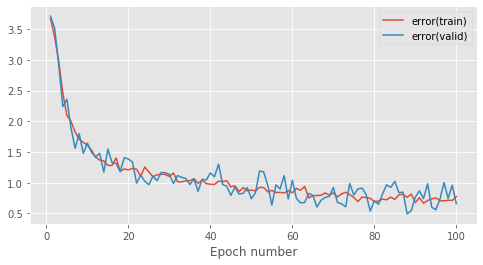

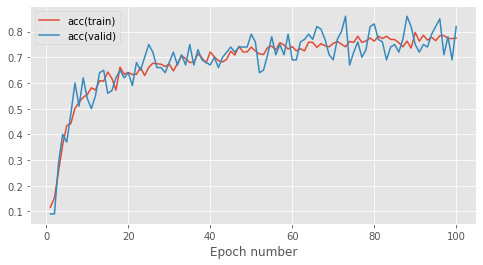

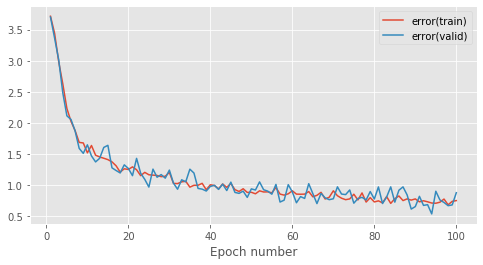

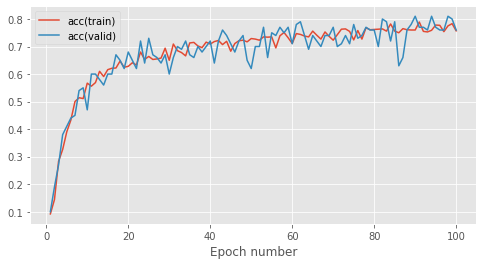

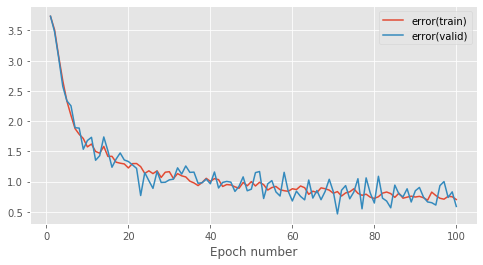

...

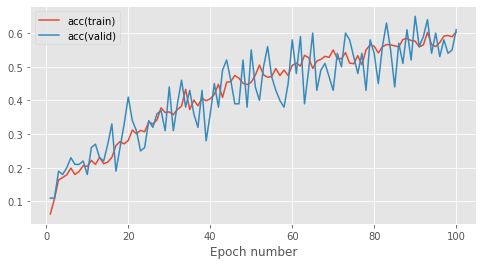

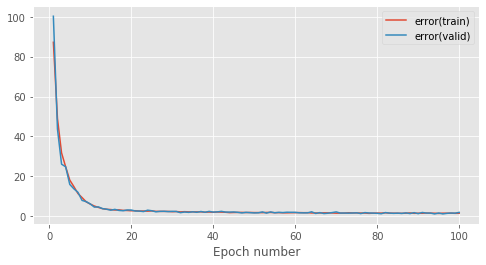

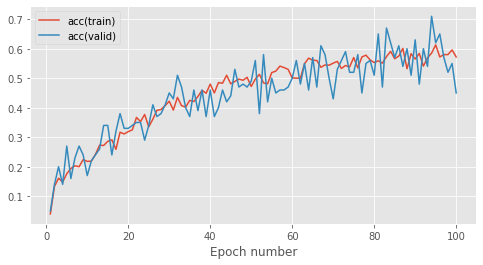

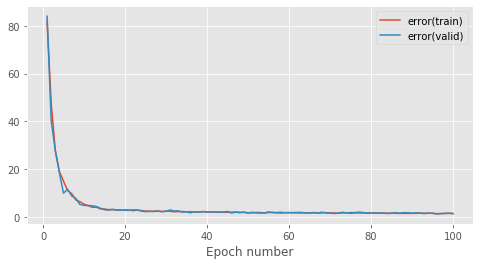

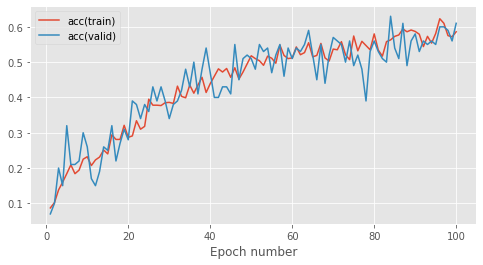

In [27]:
numSamples = 10
num_epochs = 100

lrelu_accs = defaultdict(list)
for alpha in [0.001, 0.01, 0.1, 1.0, 10.0]:
    print("*********** LRELU {} ***********".format(alpha))
    mean, sd = gatherLRELUSamples(numSamples, alpha, num_epochs, train_data_100, valid_data_10)
    lrelu_accs[alpha] = [mean, sd]


In [33]:
for (alpha, stats) in lrelu_accs.items():
    print("LRELU Validation set accuracy ({} samples, {} epochs, {} training batches, alpha={}): {} ± {}".format(10, num_epochs, 100, alpha, stats[0], stats[1]))

LRELU Validation set accuracy (10 samples, 100 epochs, 100 training batches, alpha=0.001): 0.7550000000000001 ± 0.039812058474788775
LRELU Validation set accuracy (10 samples, 100 epochs, 100 training batches, alpha=0.01): 0.7620000000000001 ± 0.06399999999999999
LRELU Validation set accuracy (10 samples, 100 epochs, 100 training batches, alpha=0.1): 0.7630000000000001 ± 0.047127486671792715
LRELU Validation set accuracy (10 samples, 100 epochs, 100 training batches, alpha=1.0): 0.643 ± 0.03848376280978772
LRELU Validation set accuracy (10 samples, 100 epochs, 100 training batches, alpha=10.0): 0.5599999999999999 ± 0.05709640969448079


#### PReLU

In [12]:
from mlp.layers import ParametricReluLayer

def createMultiLayerPReLUModel(numHiddenLayers, alpha_init, input_dim, hidden_dim, output_dim, batch_size, rng):
    # initialise hyperparameters
    alpha = np.ones((batch_size, hidden_dim)) * alpha_init
    
    hiddenLayerType = ParametricReluLayer(alpha)
    
    return createMultiLayerModel(numHiddenLayers, hiddenLayerType, input_dim, hidden_dim, output_dim, rng)
    

In [13]:
def gatherPRELUSamples(numSamples, alpha, num_epochs, train_data, valid_data, test_data=None, early_stopping=None):
    prelu_valid_accs = []

    if test_data is not None:
        prelu_test_accs = []
    
    for i in range(0, numSamples):
        print("*********** Sample {} ***********".format(i+1))
        # reset rng
        rng.seed(i)

        # create model (3 layers)
        prelu_model = createMultiLayerPReLUModel(numHiddenLayers, alpha_init, input_dim, hidden_dim, output_dim, batch_size, rng)

        prelu_stats = trainModel(prelu_model, train_data, valid_data,
                                   learning_rate = 0.01,
                                   num_epochs = num_epochs,
                                   stats_interval = 1,
                                   batch_size = 100,
                                   hidden_dim = 128, early_stopping=early_stopping)

        # create empty "best model"
        best_prelu_model = createMultiLayerPReLUModel(numHiddenLayers, leakiness, input_dim, hidden_dim, output_dim, batch_size, rng)

        # report best model validation set accuracy
        prelu_valid_acc = createBestModelAndCalculateAccuracy(prelu_stats[0].model, best_prelu_model, prelu_stats[0].model.params, prelu_stats[0].best_model_params, valid_data, 'Validation', 'PReLU')

        prelu_valid_accs.append(prelu_valid_acc)
        
        if test_data is not None: 
            prelu_test_acc = createBestModelAndCalculateAccuracy(prelu_stats[0].model, best_prelu_model, prelu_stats[0].model.params, prelu_stats[0].best_model_params, test_data, 'Test') 
            prelu_test_accs.append(prelu_test_acc)
    
    mean = np.array(prelu_valid_accs).mean()
    sd = np.array(prelu_valid_accs).std()
    
    if test_data is not None:
        mean_test = np.array(prelu_test_accs).mean()
        sd_test = np.array(prelu_test_accs).std()

        return mean, sd, mean_test, sd_test
    
    return mean, sd


*********** PRELU 0.001 ***********
*********** Sample 1 ***********


Epoch 1: 0.4s to complete
    error(train)=3.15e+00, acc(train)=1.93e-01, error(valid)=3.00e+00, acc(valid)=2.00e-01
Epoch 2: 0.4s to complete
    error(train)=2.42e+00, acc(train)=3.71e-01, error(valid)=2.72e+00, acc(valid)=3.50e-01
Epoch 3: 0.4s to complete
    error(train)=2.00e+00, acc(train)=4.82e-01, error(valid)=2.04e+00, acc(valid)=4.80e-01
Epoch 4: 0.3s to complete
    error(train)=1.85e+00, acc(train)=4.86e-01, error(valid)=1.83e+00, acc(valid)=4.80e-01
Epoch 5: 0.3s to complete
    error(train)=1.63e+00, acc(train)=5.34e-01, error(valid)=1.63e+00, acc(valid)=6.10e-01
Epoch 6: 0.3s to complete
    error(train)=1.64e+00, acc(train)=5.41e-01, error(valid)=1.31e+00, acc(valid)=6.10e-01
Epoch 7: 0.3s to complete
    error(train)=1.52e+00, acc(train)=5.63e-01, error(valid)=1.06e+00, acc(valid)=7.00e-01
Epoch 8: 0.3s to complete
    error(train)=1.51e+00, acc(train)=5.83e-01, error(valid)=2.03e+00, acc(valid)=5.20e-01
Epoch 9: 0.3s to complete
    error(train)=1.48e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.32e+00, acc(train)=6.46e-01, error(valid)=1.33e+00, acc(valid)=5.80e-01
Epoch 72: 0.3s to complete
    error(train)=1.25e+00, acc(train)=6.61e-01, error(valid)=1.45e+00, acc(valid)=5.70e-01
Epoch 73: 0.4s to complete
    error(train)=1.25e+00, acc(train)=6.41e-01, error(valid)=1.19e+00, acc(valid)=6.70e-01
Epoch 74: 0.3s to complete
    error(train)=1.14e+00, acc(train)=6.64e-01, error(valid)=1.57e+00, acc(valid)=5.80e-01
Epoch 75: 0.3s to complete
    error(train)=1.32e+00, acc(train)=6.52e-01, error(valid)=1.21e+00, acc(valid)=6.80e-01
Epoch 76: 0.4s to complete
    error(train)=1.32e+00, acc(train)=6.39e-01, error(valid)=1.19e+00, acc(valid)=6.30e-01
Epoch 77: 0.3s to complete
    error(train)=1.20e+00, acc(train)=6.51e-01, error(valid)=1.25e+00, acc(valid)=5.90e-01
Epoch 78: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.62e-01, error(valid)=1.10e+00, acc(valid)=6.90e-01
Epoch 79: 0.4s to complete
    error(train)=1.25e+00, ac


Validation set accuracy on best model: 0.66
*********** Sample 2 ***********


Epoch 1: 0.3s to complete
    error(train)=3.21e+00, acc(train)=2.11e-01, error(valid)=3.20e+00, acc(valid)=1.80e-01
Epoch 2: 0.3s to complete
    error(train)=2.52e+00, acc(train)=3.48e-01, error(valid)=2.57e+00, acc(valid)=2.90e-01
Epoch 3: 0.3s to complete
    error(train)=2.10e+00, acc(train)=4.24e-01, error(valid)=2.10e+00, acc(valid)=4.60e-01
Epoch 4: 0.3s to complete
    error(train)=1.91e+00, acc(train)=4.45e-01, error(valid)=1.89e+00, acc(valid)=3.60e-01
Epoch 5: 0.3s to complete
    error(train)=1.64e+00, acc(train)=5.35e-01, error(valid)=2.15e+00, acc(valid)=4.60e-01
Epoch 6: 0.3s to complete
    error(train)=1.67e+00, acc(train)=5.33e-01, error(valid)=1.58e+00, acc(valid)=4.80e-01
Epoch 7: 0.3s to complete
    error(train)=1.52e+00, acc(train)=5.66e-01, error(valid)=1.28e+00, acc(valid)=6.20e-01
Epoch 8: 0.3s to complete
    error(train)=1.58e+00, acc(train)=5.43e-01, error(valid)=1.59e+00, acc(valid)=5.40e-01
Epoch 9: 0.3s to complete
    error(train)=1.52e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.24e-01, error(valid)=1.19e+00, acc(valid)=6.50e-01
Epoch 72: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.46e-01, error(valid)=1.27e+00, acc(valid)=6.50e-01
Epoch 73: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.62e-01, error(valid)=1.02e+00, acc(valid)=7.20e-01
Epoch 74: 0.3s to complete
    error(train)=1.20e+00, acc(train)=6.60e-01, error(valid)=1.27e+00, acc(valid)=6.90e-01
Epoch 75: 0.3s to complete
    error(train)=1.22e+00, acc(train)=6.64e-01, error(valid)=1.24e+00, acc(valid)=6.60e-01
Epoch 76: 0.3s to complete
    error(train)=1.27e+00, acc(train)=6.51e-01, error(valid)=1.14e+00, acc(valid)=7.30e-01
Epoch 77: 0.3s to complete
    error(train)=1.25e+00, acc(train)=6.53e-01, error(valid)=1.14e+00, acc(valid)=6.90e-01
Epoch 78: 0.3s to complete
    error(train)=1.31e+00, acc(train)=6.43e-01, error(valid)=1.38e+00, acc(valid)=6.70e-01
Epoch 79: 0.3s to complete
    error(train)=1.25e+00, ac


Validation set accuracy on best model: 0.73
*********** Sample 3 ***********


Epoch 1: 0.4s to complete
    error(train)=3.24e+00, acc(train)=1.86e-01, error(valid)=3.22e+00, acc(valid)=2.20e-01
Epoch 2: 0.3s to complete
    error(train)=2.61e+00, acc(train)=3.25e-01, error(valid)=2.78e+00, acc(valid)=3.10e-01
Epoch 3: 0.3s to complete
    error(train)=2.13e+00, acc(train)=4.04e-01, error(valid)=2.23e+00, acc(valid)=3.80e-01
Epoch 4: 0.3s to complete
    error(train)=1.93e+00, acc(train)=4.62e-01, error(valid)=1.82e+00, acc(valid)=4.90e-01
Epoch 5: 0.3s to complete
    error(train)=1.74e+00, acc(train)=5.25e-01, error(valid)=1.90e+00, acc(valid)=4.40e-01
Epoch 6: 0.3s to complete
    error(train)=1.68e+00, acc(train)=5.30e-01, error(valid)=1.60e+00, acc(valid)=5.60e-01
Epoch 7: 0.3s to complete
    error(train)=1.60e+00, acc(train)=5.72e-01, error(valid)=1.51e+00, acc(valid)=5.50e-01
Epoch 8: 0.4s to complete
    error(train)=1.54e+00, acc(train)=5.67e-01, error(valid)=1.54e+00, acc(valid)=6.10e-01
Epoch 9: 0.3s to complete
    error(train)=1.48e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.15e+00, acc(train)=6.90e-01, error(valid)=1.30e+00, acc(valid)=6.50e-01
Epoch 72: 0.3s to complete
    error(train)=1.25e+00, acc(train)=6.62e-01, error(valid)=1.11e+00, acc(valid)=6.60e-01
Epoch 73: 0.3s to complete
    error(train)=1.20e+00, acc(train)=6.65e-01, error(valid)=1.20e+00, acc(valid)=6.00e-01
Epoch 74: 0.3s to complete
    error(train)=1.25e+00, acc(train)=6.42e-01, error(valid)=9.69e-01, acc(valid)=7.00e-01
Epoch 75: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.49e-01, error(valid)=1.20e+00, acc(valid)=6.40e-01
Epoch 76: 0.4s to complete
    error(train)=1.14e+00, acc(train)=6.95e-01, error(valid)=1.11e+00, acc(valid)=6.40e-01
Epoch 77: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.58e-01, error(valid)=1.39e+00, acc(valid)=6.70e-01
Epoch 78: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.75e-01, error(valid)=1.29e+00, acc(valid)=6.90e-01
Epoch 79: 0.3s to complete
    error(train)=1.18e+00, ac


Validation set accuracy on best model: 0.73
*********** Sample 4 ***********


Epoch 1: 0.3s to complete
    error(train)=3.18e+00, acc(train)=1.91e-01, error(valid)=3.23e+00, acc(valid)=1.90e-01
Epoch 2: 0.4s to complete
    error(train)=2.58e+00, acc(train)=3.33e-01, error(valid)=2.78e+00, acc(valid)=2.80e-01
Epoch 3: 0.3s to complete
    error(train)=2.17e+00, acc(train)=4.35e-01, error(valid)=2.02e+00, acc(valid)=4.60e-01
Epoch 4: 0.4s to complete
    error(train)=1.88e+00, acc(train)=4.91e-01, error(valid)=2.24e+00, acc(valid)=3.70e-01
Epoch 5: 0.4s to complete
    error(train)=1.78e+00, acc(train)=5.27e-01, error(valid)=1.79e+00, acc(valid)=5.20e-01
Epoch 6: 0.3s to complete
    error(train)=1.72e+00, acc(train)=5.43e-01, error(valid)=1.67e+00, acc(valid)=4.90e-01
Epoch 7: 0.4s to complete
    error(train)=1.63e+00, acc(train)=5.73e-01, error(valid)=1.63e+00, acc(valid)=5.50e-01
Epoch 8: 0.3s to complete
    error(train)=1.59e+00, acc(train)=5.66e-01, error(valid)=1.55e+00, acc(valid)=5.50e-01
Epoch 9: 0.3s to complete
    error(train)=1.51e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.35e+00, acc(train)=6.26e-01, error(valid)=1.54e+00, acc(valid)=5.80e-01
Epoch 72: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.68e-01, error(valid)=8.91e-01, acc(valid)=7.30e-01
Epoch 73: 0.3s to complete
    error(train)=1.27e+00, acc(train)=6.58e-01, error(valid)=1.32e+00, acc(valid)=6.40e-01
Epoch 74: 0.3s to complete
    error(train)=1.28e+00, acc(train)=6.39e-01, error(valid)=1.30e+00, acc(valid)=5.50e-01
Epoch 75: 0.3s to complete
    error(train)=1.20e+00, acc(train)=6.63e-01, error(valid)=9.02e-01, acc(valid)=7.30e-01
Epoch 76: 0.3s to complete
    error(train)=1.18e+00, acc(train)=6.83e-01, error(valid)=1.45e+00, acc(valid)=6.20e-01
Epoch 77: 0.3s to complete
    error(train)=1.29e+00, acc(train)=6.50e-01, error(valid)=1.26e+00, acc(valid)=6.70e-01
Epoch 78: 0.3s to complete
    error(train)=1.30e+00, acc(train)=6.26e-01, error(valid)=1.03e+00, acc(valid)=6.80e-01
Epoch 79: 0.3s to complete
    error(train)=1.35e+00, ac


Validation set accuracy on best model: 0.61
*********** Sample 5 ***********


Epoch 1: 0.3s to complete
    error(train)=3.19e+00, acc(train)=2.24e-01, error(valid)=3.21e+00, acc(valid)=2.00e-01
Epoch 2: 0.3s to complete
    error(train)=2.48e+00, acc(train)=3.55e-01, error(valid)=2.69e+00, acc(valid)=3.40e-01
Epoch 3: 0.3s to complete
    error(train)=2.07e+00, acc(train)=4.42e-01, error(valid)=1.98e+00, acc(valid)=4.70e-01
Epoch 4: 0.3s to complete
    error(train)=1.88e+00, acc(train)=4.75e-01, error(valid)=1.80e+00, acc(valid)=5.10e-01
Epoch 5: 0.3s to complete
    error(train)=1.72e+00, acc(train)=5.48e-01, error(valid)=1.61e+00, acc(valid)=6.00e-01
Epoch 6: 0.3s to complete
    error(train)=1.62e+00, acc(train)=5.43e-01, error(valid)=1.65e+00, acc(valid)=5.50e-01
Epoch 7: 0.3s to complete
    error(train)=1.49e+00, acc(train)=5.60e-01, error(valid)=1.27e+00, acc(valid)=6.00e-01
Epoch 8: 0.3s to complete
    error(train)=1.45e+00, acc(train)=5.88e-01, error(valid)=1.60e+00, acc(valid)=5.20e-01
Epoch 9: 0.4s to complete
    error(train)=1.45e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.22e+00, acc(train)=6.45e-01, error(valid)=1.23e+00, acc(valid)=6.10e-01
Epoch 72: 0.3s to complete
    error(train)=1.19e+00, acc(train)=6.64e-01, error(valid)=1.11e+00, acc(valid)=7.10e-01
Epoch 73: 0.3s to complete
    error(train)=1.25e+00, acc(train)=6.46e-01, error(valid)=1.35e+00, acc(valid)=6.20e-01
Epoch 74: 0.3s to complete
    error(train)=1.19e+00, acc(train)=6.60e-01, error(valid)=1.36e+00, acc(valid)=6.60e-01
Epoch 75: 0.3s to complete
    error(train)=1.19e+00, acc(train)=6.80e-01, error(valid)=1.16e+00, acc(valid)=6.20e-01
Epoch 76: 0.3s to complete
    error(train)=1.33e+00, acc(train)=6.35e-01, error(valid)=1.40e+00, acc(valid)=6.30e-01
Epoch 77: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.63e-01, error(valid)=1.41e+00, acc(valid)=6.30e-01
Epoch 78: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.62e-01, error(valid)=1.42e+00, acc(valid)=6.30e-01
Epoch 79: 0.3s to complete
    error(train)=1.15e+00, ac


Validation set accuracy on best model: 0.61
*********** Sample 6 ***********


Epoch 1: 0.3s to complete
    error(train)=3.20e+00, acc(train)=1.85e-01, error(valid)=3.13e+00, acc(valid)=2.00e-01
Epoch 2: 0.3s to complete
    error(train)=2.58e+00, acc(train)=3.61e-01, error(valid)=2.59e+00, acc(valid)=3.40e-01
Epoch 3: 0.3s to complete
    error(train)=2.10e+00, acc(train)=4.44e-01, error(valid)=2.53e+00, acc(valid)=3.90e-01
Epoch 4: 0.3s to complete
    error(train)=1.83e+00, acc(train)=4.88e-01, error(valid)=1.80e+00, acc(valid)=4.90e-01
Epoch 5: 0.3s to complete
    error(train)=1.64e+00, acc(train)=5.35e-01, error(valid)=1.73e+00, acc(valid)=5.20e-01
Epoch 6: 0.3s to complete
    error(train)=1.64e+00, acc(train)=5.36e-01, error(valid)=1.55e+00, acc(valid)=5.50e-01
Epoch 7: 0.4s to complete
    error(train)=1.58e+00, acc(train)=5.52e-01, error(valid)=1.70e+00, acc(valid)=5.10e-01
Epoch 8: 0.3s to complete
    error(train)=1.57e+00, acc(train)=5.57e-01, error(valid)=1.43e+00, acc(valid)=5.90e-01
Epoch 9: 0.4s to complete
    error(train)=1.51e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.65e-01, error(valid)=1.53e+00, acc(valid)=6.10e-01
Epoch 72: 0.4s to complete
    error(train)=1.24e+00, acc(train)=6.63e-01, error(valid)=1.22e+00, acc(valid)=6.40e-01
Epoch 73: 0.4s to complete
    error(train)=1.23e+00, acc(train)=6.61e-01, error(valid)=1.26e+00, acc(valid)=6.20e-01
Epoch 74: 0.4s to complete
    error(train)=1.41e+00, acc(train)=6.50e-01, error(valid)=1.34e+00, acc(valid)=6.10e-01
Epoch 75: 0.3s to complete
    error(train)=1.28e+00, acc(train)=6.31e-01, error(valid)=1.17e+00, acc(valid)=6.60e-01
Epoch 76: 0.3s to complete
    error(train)=1.30e+00, acc(train)=6.37e-01, error(valid)=1.13e+00, acc(valid)=6.70e-01
Epoch 77: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.47e-01, error(valid)=1.49e+00, acc(valid)=5.30e-01
Epoch 78: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.59e-01, error(valid)=9.24e-01, acc(valid)=7.10e-01
Epoch 79: 0.3s to complete
    error(train)=1.23e+00, ac


Validation set accuracy on best model: 0.58
*********** Sample 7 ***********


Epoch 1: 0.3s to complete
    error(train)=3.17e+00, acc(train)=1.94e-01, error(valid)=3.37e+00, acc(valid)=8.00e-02
Epoch 2: 0.3s to complete
    error(train)=2.61e+00, acc(train)=3.02e-01, error(valid)=2.62e+00, acc(valid)=3.60e-01
Epoch 3: 0.3s to complete
    error(train)=2.14e+00, acc(train)=4.07e-01, error(valid)=2.39e+00, acc(valid)=2.70e-01
Epoch 4: 0.3s to complete
    error(train)=1.93e+00, acc(train)=4.62e-01, error(valid)=2.02e+00, acc(valid)=4.40e-01
Epoch 5: 0.3s to complete
    error(train)=1.74e+00, acc(train)=5.32e-01, error(valid)=1.89e+00, acc(valid)=4.50e-01
Epoch 6: 0.3s to complete
    error(train)=1.67e+00, acc(train)=5.27e-01, error(valid)=1.38e+00, acc(valid)=5.90e-01
Epoch 7: 0.3s to complete
    error(train)=1.67e+00, acc(train)=5.14e-01, error(valid)=1.75e+00, acc(valid)=5.50e-01
Epoch 8: 0.3s to complete
    error(train)=1.58e+00, acc(train)=5.47e-01, error(valid)=1.48e+00, acc(valid)=6.10e-01
Epoch 9: 0.3s to complete
    error(train)=1.45e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.19e+00, acc(train)=6.53e-01, error(valid)=1.19e+00, acc(valid)=6.60e-01
Epoch 72: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.41e-01, error(valid)=9.72e-01, acc(valid)=7.80e-01
Epoch 73: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.40e-01, error(valid)=1.21e+00, acc(valid)=6.60e-01
Epoch 74: 0.3s to complete
    error(train)=1.22e+00, acc(train)=6.64e-01, error(valid)=1.27e+00, acc(valid)=5.80e-01
Epoch 75: 0.3s to complete
    error(train)=1.20e+00, acc(train)=6.82e-01, error(valid)=1.28e+00, acc(valid)=6.70e-01
Epoch 76: 0.3s to complete
    error(train)=1.19e+00, acc(train)=6.72e-01, error(valid)=1.53e+00, acc(valid)=5.60e-01
Epoch 77: 0.3s to complete
    error(train)=1.30e+00, acc(train)=6.41e-01, error(valid)=1.37e+00, acc(valid)=6.70e-01
Epoch 78: 0.3s to complete
    error(train)=1.20e+00, acc(train)=6.76e-01, error(valid)=1.32e+00, acc(valid)=6.40e-01
Epoch 79: 0.3s to complete
    error(train)=1.21e+00, ac


Validation set accuracy on best model: 0.58
*********** Sample 8 ***********


Epoch 1: 0.3s to complete
    error(train)=3.22e+00, acc(train)=1.96e-01, error(valid)=3.25e+00, acc(valid)=2.10e-01
Epoch 2: 0.3s to complete
    error(train)=2.52e+00, acc(train)=3.67e-01, error(valid)=2.47e+00, acc(valid)=4.30e-01
Epoch 3: 0.3s to complete
    error(train)=2.08e+00, acc(train)=4.37e-01, error(valid)=2.10e+00, acc(valid)=4.00e-01
Epoch 4: 0.3s to complete
    error(train)=1.82e+00, acc(train)=4.92e-01, error(valid)=1.63e+00, acc(valid)=5.70e-01
Epoch 5: 0.3s to complete
    error(train)=1.66e+00, acc(train)=5.29e-01, error(valid)=1.98e+00, acc(valid)=4.50e-01
Epoch 6: 0.3s to complete
    error(train)=1.57e+00, acc(train)=5.55e-01, error(valid)=1.52e+00, acc(valid)=5.30e-01
Epoch 7: 0.4s to complete
    error(train)=1.58e+00, acc(train)=5.38e-01, error(valid)=1.87e+00, acc(valid)=5.10e-01
Epoch 8: 0.3s to complete
    error(train)=1.45e+00, acc(train)=5.89e-01, error(valid)=1.37e+00, acc(valid)=5.80e-01
Epoch 9: 0.4s to complete
    error(train)=1.45e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.18e+00, acc(train)=6.69e-01, error(valid)=1.28e+00, acc(valid)=6.20e-01
Epoch 72: 0.4s to complete
    error(train)=1.32e+00, acc(train)=6.32e-01, error(valid)=1.27e+00, acc(valid)=6.90e-01
Epoch 73: 0.4s to complete
    error(train)=1.32e+00, acc(train)=6.35e-01, error(valid)=1.32e+00, acc(valid)=6.30e-01
Epoch 74: 0.4s to complete
    error(train)=1.25e+00, acc(train)=6.59e-01, error(valid)=1.31e+00, acc(valid)=6.90e-01
Epoch 75: 0.4s to complete
    error(train)=1.31e+00, acc(train)=6.46e-01, error(valid)=1.49e+00, acc(valid)=6.10e-01
Epoch 76: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.52e-01, error(valid)=1.25e+00, acc(valid)=6.00e-01
Epoch 77: 0.3s to complete
    error(train)=1.27e+00, acc(train)=6.37e-01, error(valid)=1.16e+00, acc(valid)=6.90e-01
Epoch 78: 0.4s to complete
    error(train)=1.23e+00, acc(train)=6.52e-01, error(valid)=1.27e+00, acc(valid)=6.10e-01
Epoch 79: 0.3s to complete
    error(train)=1.34e+00, ac


Validation set accuracy on best model: 0.66
*********** Sample 9 ***********


Epoch 1: 0.3s to complete
    error(train)=3.30e+00, acc(train)=1.76e-01, error(valid)=3.31e+00, acc(valid)=1.90e-01
Epoch 2: 0.3s to complete
    error(train)=2.63e+00, acc(train)=3.44e-01, error(valid)=2.48e+00, acc(valid)=3.60e-01
Epoch 3: 0.3s to complete
    error(train)=2.18e+00, acc(train)=4.38e-01, error(valid)=2.07e+00, acc(valid)=4.00e-01
Epoch 4: 0.3s to complete
    error(train)=1.80e+00, acc(train)=5.07e-01, error(valid)=1.89e+00, acc(valid)=5.20e-01
Epoch 5: 0.3s to complete
    error(train)=1.70e+00, acc(train)=5.21e-01, error(valid)=1.71e+00, acc(valid)=5.10e-01
Epoch 6: 0.4s to complete
    error(train)=1.65e+00, acc(train)=5.62e-01, error(valid)=1.36e+00, acc(valid)=6.30e-01
Epoch 7: 0.4s to complete
    error(train)=1.60e+00, acc(train)=5.58e-01, error(valid)=1.73e+00, acc(valid)=5.40e-01
Epoch 8: 0.3s to complete
    error(train)=1.52e+00, acc(train)=5.75e-01, error(valid)=1.51e+00, acc(valid)=5.40e-01
Epoch 9: 0.4s to complete
    error(train)=1.59e+00, acc(train)=

Epoch 71: 0.6s to complete
    error(train)=1.33e+00, acc(train)=6.27e-01, error(valid)=1.11e+00, acc(valid)=6.70e-01
Epoch 72: 0.5s to complete
    error(train)=1.27e+00, acc(train)=6.57e-01, error(valid)=1.19e+00, acc(valid)=7.10e-01
Epoch 73: 0.4s to complete
    error(train)=1.28e+00, acc(train)=6.43e-01, error(valid)=1.24e+00, acc(valid)=7.20e-01
Epoch 74: 0.4s to complete
    error(train)=1.23e+00, acc(train)=6.52e-01, error(valid)=1.32e+00, acc(valid)=6.00e-01
Epoch 75: 0.4s to complete
    error(train)=1.25e+00, acc(train)=6.66e-01, error(valid)=1.31e+00, acc(valid)=6.10e-01
Epoch 76: 0.4s to complete
    error(train)=1.17e+00, acc(train)=6.62e-01, error(valid)=1.29e+00, acc(valid)=6.30e-01
Epoch 77: 0.5s to complete
    error(train)=1.25e+00, acc(train)=6.40e-01, error(valid)=1.33e+00, acc(valid)=6.20e-01
Epoch 78: 0.5s to complete
    error(train)=1.30e+00, acc(train)=6.36e-01, error(valid)=1.19e+00, acc(valid)=6.50e-01
Epoch 79: 0.5s to complete
    error(train)=1.15e+00, ac


Validation set accuracy on best model: 0.62
*********** Sample 10 ***********


Epoch 1: 0.3s to complete
    error(train)=3.25e+00, acc(train)=2.05e-01, error(valid)=3.16e+00, acc(valid)=1.50e-01
Epoch 2: 0.3s to complete
    error(train)=2.59e+00, acc(train)=3.22e-01, error(valid)=2.54e+00, acc(valid)=3.70e-01
Epoch 3: 0.3s to complete
    error(train)=2.14e+00, acc(train)=4.43e-01, error(valid)=2.12e+00, acc(valid)=4.70e-01
Epoch 4: 0.3s to complete
    error(train)=1.84e+00, acc(train)=4.89e-01, error(valid)=2.14e+00, acc(valid)=4.40e-01
Epoch 5: 0.3s to complete
    error(train)=1.84e+00, acc(train)=5.03e-01, error(valid)=1.81e+00, acc(valid)=4.90e-01
Epoch 6: 0.4s to complete
    error(train)=1.62e+00, acc(train)=5.53e-01, error(valid)=1.91e+00, acc(valid)=4.70e-01
Epoch 7: 0.3s to complete
    error(train)=1.70e+00, acc(train)=5.27e-01, error(valid)=1.68e+00, acc(valid)=5.70e-01
Epoch 8: 0.3s to complete
    error(train)=1.50e+00, acc(train)=5.97e-01, error(valid)=1.64e+00, acc(valid)=5.30e-01
Epoch 9: 0.3s to complete
    error(train)=1.52e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.62e-01, error(valid)=1.12e+00, acc(valid)=6.80e-01
Epoch 72: 0.3s to complete
    error(train)=1.20e+00, acc(train)=6.61e-01, error(valid)=1.20e+00, acc(valid)=6.40e-01
Epoch 73: 0.3s to complete
    error(train)=1.15e+00, acc(train)=6.84e-01, error(valid)=1.12e+00, acc(valid)=6.60e-01
Epoch 74: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.46e-01, error(valid)=1.18e+00, acc(valid)=5.60e-01
Epoch 75: 0.3s to complete
    error(train)=1.27e+00, acc(train)=6.40e-01, error(valid)=1.15e+00, acc(valid)=6.40e-01
Epoch 76: 0.3s to complete
    error(train)=1.39e+00, acc(train)=6.21e-01, error(valid)=1.07e+00, acc(valid)=7.00e-01
Epoch 77: 0.3s to complete
    error(train)=1.30e+00, acc(train)=6.29e-01, error(valid)=1.21e+00, acc(valid)=6.40e-01
Epoch 78: 0.3s to complete
    error(train)=1.37e+00, acc(train)=6.39e-01, error(valid)=1.26e+00, acc(valid)=6.60e-01
Epoch 79: 0.3s to complete
    error(train)=1.27e+00, ac


Validation set accuracy on best model: 0.63
*********** PRELU 0.01 ***********
*********** Sample 1 ***********


Epoch 1: 0.3s to complete
    error(train)=3.18e+00, acc(train)=1.94e-01, error(valid)=3.23e+00, acc(valid)=1.60e-01
Epoch 2: 0.3s to complete
    error(train)=2.51e+00, acc(train)=3.57e-01, error(valid)=2.58e+00, acc(valid)=3.00e-01
Epoch 3: 0.3s to complete
    error(train)=2.06e+00, acc(train)=4.34e-01, error(valid)=1.96e+00, acc(valid)=4.90e-01
Epoch 4: 0.3s to complete
    error(train)=1.75e+00, acc(train)=5.32e-01, error(valid)=1.93e+00, acc(valid)=4.50e-01
Epoch 5: 0.3s to complete
    error(train)=1.63e+00, acc(train)=5.44e-01, error(valid)=1.61e+00, acc(valid)=5.60e-01
Epoch 6: 0.3s to complete
    error(train)=1.66e+00, acc(train)=5.29e-01, error(valid)=2.05e+00, acc(valid)=4.40e-01
Epoch 7: 0.3s to complete
    error(train)=1.50e+00, acc(train)=5.72e-01, error(valid)=1.57e+00, acc(valid)=5.70e-01
Epoch 8: 0.3s to complete
    error(train)=1.51e+00, acc(train)=5.70e-01, error(valid)=1.61e+00, acc(valid)=4.90e-01
Epoch 9: 0.3s to complete
    error(train)=1.58e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.56e-01, error(valid)=1.33e+00, acc(valid)=5.80e-01
Epoch 72: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.67e-01, error(valid)=1.19e+00, acc(valid)=6.90e-01
Epoch 73: 0.4s to complete
    error(train)=1.28e+00, acc(train)=6.55e-01, error(valid)=1.54e+00, acc(valid)=6.10e-01
Epoch 74: 0.4s to complete
    error(train)=1.26e+00, acc(train)=6.50e-01, error(valid)=1.23e+00, acc(valid)=6.50e-01
Epoch 75: 0.4s to complete
    error(train)=1.26e+00, acc(train)=6.45e-01, error(valid)=1.38e+00, acc(valid)=5.70e-01
Epoch 76: 0.3s to complete
    error(train)=1.38e+00, acc(train)=6.36e-01, error(valid)=7.98e-01, acc(valid)=7.60e-01
Epoch 77: 0.3s to complete
    error(train)=1.32e+00, acc(train)=6.46e-01, error(valid)=1.37e+00, acc(valid)=6.60e-01
Epoch 78: 0.3s to complete
    error(train)=1.33e+00, acc(train)=6.29e-01, error(valid)=1.20e+00, acc(valid)=7.10e-01
Epoch 79: 0.4s to complete
    error(train)=1.20e+00, ac


Validation set accuracy on best model: 0.66
*********** Sample 2 ***********


Epoch 1: 0.3s to complete
    error(train)=3.16e+00, acc(train)=2.29e-01, error(valid)=3.21e+00, acc(valid)=1.70e-01
Epoch 2: 0.3s to complete
    error(train)=2.52e+00, acc(train)=3.41e-01, error(valid)=2.48e+00, acc(valid)=3.40e-01
Epoch 3: 0.4s to complete
    error(train)=2.19e+00, acc(train)=3.83e-01, error(valid)=2.16e+00, acc(valid)=4.00e-01
Epoch 4: 0.3s to complete
    error(train)=1.71e+00, acc(train)=5.45e-01, error(valid)=1.65e+00, acc(valid)=4.70e-01
Epoch 5: 0.4s to complete
    error(train)=1.68e+00, acc(train)=5.31e-01, error(valid)=1.84e+00, acc(valid)=4.60e-01
Epoch 6: 0.4s to complete
    error(train)=1.70e+00, acc(train)=5.35e-01, error(valid)=1.50e+00, acc(valid)=6.20e-01
Epoch 7: 0.4s to complete
    error(train)=1.52e+00, acc(train)=5.82e-01, error(valid)=1.67e+00, acc(valid)=5.10e-01
Epoch 8: 0.4s to complete
    error(train)=1.60e+00, acc(train)=5.54e-01, error(valid)=1.45e+00, acc(valid)=6.60e-01
Epoch 9: 0.4s to complete
    error(train)=1.49e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=1.25e+00, acc(train)=6.70e-01, error(valid)=1.12e+00, acc(valid)=7.00e-01
Epoch 72: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.41e-01, error(valid)=1.16e+00, acc(valid)=6.40e-01
Epoch 73: 0.3s to complete
    error(train)=1.28e+00, acc(train)=6.57e-01, error(valid)=1.45e+00, acc(valid)=6.10e-01
Epoch 74: 0.3s to complete
    error(train)=1.31e+00, acc(train)=6.59e-01, error(valid)=1.28e+00, acc(valid)=6.70e-01
Epoch 75: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.53e-01, error(valid)=1.44e+00, acc(valid)=6.50e-01
Epoch 76: 0.4s to complete
    error(train)=1.26e+00, acc(train)=6.75e-01, error(valid)=1.34e+00, acc(valid)=6.10e-01
Epoch 77: 0.3s to complete
    error(train)=1.27e+00, acc(train)=6.44e-01, error(valid)=1.03e+00, acc(valid)=6.80e-01
Epoch 78: 0.3s to complete
    error(train)=1.25e+00, acc(train)=6.48e-01, error(valid)=1.46e+00, acc(valid)=6.10e-01
Epoch 79: 0.3s to complete
    error(train)=1.23e+00, ac


Validation set accuracy on best model: 0.65
*********** Sample 3 ***********


Epoch 1: 0.4s to complete
    error(train)=3.21e+00, acc(train)=2.15e-01, error(valid)=3.24e+00, acc(valid)=2.00e-01
Epoch 2: 0.4s to complete
    error(train)=2.64e+00, acc(train)=2.95e-01, error(valid)=2.68e+00, acc(valid)=3.20e-01
Epoch 3: 0.3s to complete
    error(train)=2.15e+00, acc(train)=4.22e-01, error(valid)=1.94e+00, acc(valid)=4.90e-01
Epoch 4: 0.4s to complete
    error(train)=1.83e+00, acc(train)=4.96e-01, error(valid)=1.78e+00, acc(valid)=5.20e-01
Epoch 5: 0.4s to complete
    error(train)=1.78e+00, acc(train)=5.02e-01, error(valid)=1.90e+00, acc(valid)=4.50e-01
Epoch 6: 0.3s to complete
    error(train)=1.61e+00, acc(train)=5.34e-01, error(valid)=1.70e+00, acc(valid)=4.80e-01
Epoch 7: 0.3s to complete
    error(train)=1.63e+00, acc(train)=5.46e-01, error(valid)=1.64e+00, acc(valid)=6.10e-01
Epoch 8: 0.4s to complete
    error(train)=1.55e+00, acc(train)=5.68e-01, error(valid)=1.66e+00, acc(valid)=5.70e-01
Epoch 9: 0.4s to complete
    error(train)=1.59e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.32e+00, acc(train)=6.31e-01, error(valid)=1.52e+00, acc(valid)=6.30e-01
Epoch 72: 0.3s to complete
    error(train)=1.29e+00, acc(train)=6.40e-01, error(valid)=1.38e+00, acc(valid)=6.60e-01
Epoch 73: 0.3s to complete
    error(train)=1.35e+00, acc(train)=6.34e-01, error(valid)=1.27e+00, acc(valid)=6.70e-01
Epoch 74: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.31e-01, error(valid)=1.12e+00, acc(valid)=6.50e-01
Epoch 75: 0.3s to complete
    error(train)=1.22e+00, acc(train)=6.45e-01, error(valid)=1.28e+00, acc(valid)=6.40e-01
Epoch 76: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.64e-01, error(valid)=1.44e+00, acc(valid)=5.90e-01
Epoch 77: 0.3s to complete
    error(train)=1.27e+00, acc(train)=6.52e-01, error(valid)=1.24e+00, acc(valid)=6.70e-01
Epoch 78: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.67e-01, error(valid)=1.16e+00, acc(valid)=6.60e-01
Epoch 79: 0.3s to complete
    error(train)=1.25e+00, ac


Validation set accuracy on best model: 0.67
*********** Sample 4 ***********


Epoch 1: 0.3s to complete
    error(train)=3.20e+00, acc(train)=2.04e-01, error(valid)=3.13e+00, acc(valid)=2.40e-01
Epoch 2: 0.4s to complete
    error(train)=2.62e+00, acc(train)=3.26e-01, error(valid)=2.64e+00, acc(valid)=3.40e-01
Epoch 3: 0.3s to complete
    error(train)=2.14e+00, acc(train)=4.37e-01, error(valid)=1.91e+00, acc(valid)=4.20e-01
Epoch 4: 0.3s to complete
    error(train)=1.82e+00, acc(train)=4.90e-01, error(valid)=1.77e+00, acc(valid)=5.60e-01
Epoch 5: 0.4s to complete
    error(train)=1.73e+00, acc(train)=5.36e-01, error(valid)=1.71e+00, acc(valid)=5.20e-01
Epoch 6: 0.4s to complete
    error(train)=1.66e+00, acc(train)=5.32e-01, error(valid)=1.64e+00, acc(valid)=5.40e-01
Epoch 7: 0.3s to complete
    error(train)=1.61e+00, acc(train)=5.31e-01, error(valid)=1.27e+00, acc(valid)=6.30e-01
Epoch 8: 0.3s to complete
    error(train)=1.59e+00, acc(train)=5.48e-01, error(valid)=1.28e+00, acc(valid)=6.30e-01
Epoch 9: 0.4s to complete
    error(train)=1.51e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=1.23e+00, acc(train)=6.60e-01, error(valid)=1.22e+00, acc(valid)=6.40e-01
Epoch 72: 0.3s to complete
    error(train)=1.35e+00, acc(train)=6.51e-01, error(valid)=1.26e+00, acc(valid)=6.40e-01
Epoch 73: 0.3s to complete
    error(train)=1.33e+00, acc(train)=6.31e-01, error(valid)=1.20e+00, acc(valid)=6.90e-01
Epoch 74: 0.4s to complete
    error(train)=1.21e+00, acc(train)=6.66e-01, error(valid)=1.24e+00, acc(valid)=6.40e-01
Epoch 75: 0.4s to complete
    error(train)=1.22e+00, acc(train)=6.50e-01, error(valid)=1.07e+00, acc(valid)=7.00e-01
Epoch 76: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.53e-01, error(valid)=1.24e+00, acc(valid)=6.20e-01
Epoch 77: 0.3s to complete
    error(train)=1.33e+00, acc(train)=6.21e-01, error(valid)=1.42e+00, acc(valid)=6.20e-01
Epoch 78: 0.3s to complete
    error(train)=1.20e+00, acc(train)=6.60e-01, error(valid)=1.39e+00, acc(valid)=6.30e-01
Epoch 79: 0.4s to complete
    error(train)=1.34e+00, ac


Validation set accuracy on best model: 0.63
*********** Sample 5 ***********


Epoch 1: 0.4s to complete
    error(train)=3.18e+00, acc(train)=2.04e-01, error(valid)=3.13e+00, acc(valid)=2.30e-01
Epoch 2: 0.3s to complete
    error(train)=2.58e+00, acc(train)=3.42e-01, error(valid)=2.77e+00, acc(valid)=2.60e-01
Epoch 3: 0.3s to complete
    error(train)=2.17e+00, acc(train)=4.00e-01, error(valid)=2.20e+00, acc(valid)=4.30e-01
Epoch 4: 0.3s to complete
    error(train)=1.89e+00, acc(train)=4.80e-01, error(valid)=1.84e+00, acc(valid)=4.00e-01
Epoch 5: 0.3s to complete
    error(train)=1.80e+00, acc(train)=4.87e-01, error(valid)=1.81e+00, acc(valid)=4.70e-01
Epoch 6: 0.4s to complete
    error(train)=1.67e+00, acc(train)=5.27e-01, error(valid)=1.55e+00, acc(valid)=5.90e-01
Epoch 7: 0.5s to complete
    error(train)=1.61e+00, acc(train)=5.66e-01, error(valid)=1.63e+00, acc(valid)=6.10e-01
Epoch 8: 0.4s to complete
    error(train)=1.52e+00, acc(train)=5.72e-01, error(valid)=1.51e+00, acc(valid)=6.00e-01
Epoch 9: 0.4s to complete
    error(train)=1.55e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.16e+00, acc(train)=6.83e-01, error(valid)=1.37e+00, acc(valid)=6.40e-01
Epoch 72: 0.3s to complete
    error(train)=1.28e+00, acc(train)=6.53e-01, error(valid)=1.24e+00, acc(valid)=6.30e-01
Epoch 73: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.30e-01, error(valid)=1.41e+00, acc(valid)=5.80e-01
Epoch 74: 0.3s to complete
    error(train)=1.32e+00, acc(train)=6.35e-01, error(valid)=1.19e+00, acc(valid)=6.90e-01
Epoch 75: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.73e-01, error(valid)=1.24e+00, acc(valid)=6.40e-01
Epoch 76: 0.3s to complete
    error(train)=1.30e+00, acc(train)=6.50e-01, error(valid)=1.12e+00, acc(valid)=7.30e-01
Epoch 77: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.53e-01, error(valid)=1.23e+00, acc(valid)=6.60e-01
Epoch 78: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.57e-01, error(valid)=1.28e+00, acc(valid)=6.20e-01
Epoch 79: 0.3s to complete
    error(train)=1.20e+00, ac


Validation set accuracy on best model: 0.71
*********** Sample 6 ***********


Epoch 1: 0.4s to complete
    error(train)=3.26e+00, acc(train)=1.55e-01, error(valid)=3.44e+00, acc(valid)=1.60e-01
Epoch 2: 0.3s to complete
    error(train)=2.62e+00, acc(train)=3.40e-01, error(valid)=2.54e+00, acc(valid)=3.10e-01
Epoch 3: 0.4s to complete
    error(train)=2.25e+00, acc(train)=3.91e-01, error(valid)=2.15e+00, acc(valid)=4.30e-01
Epoch 4: 0.3s to complete
    error(train)=1.93e+00, acc(train)=4.64e-01, error(valid)=1.70e+00, acc(valid)=5.40e-01
Epoch 5: 0.3s to complete
    error(train)=1.82e+00, acc(train)=4.99e-01, error(valid)=1.55e+00, acc(valid)=5.50e-01
Epoch 6: 0.3s to complete
    error(train)=1.77e+00, acc(train)=5.23e-01, error(valid)=1.65e+00, acc(valid)=5.20e-01
Epoch 7: 0.4s to complete
    error(train)=1.62e+00, acc(train)=5.55e-01, error(valid)=1.85e+00, acc(valid)=5.30e-01
Epoch 8: 0.4s to complete
    error(train)=1.48e+00, acc(train)=5.93e-01, error(valid)=1.37e+00, acc(valid)=6.30e-01
Epoch 9: 0.3s to complete
    error(train)=1.40e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.16e+00, acc(train)=6.69e-01, error(valid)=1.30e+00, acc(valid)=5.90e-01
Epoch 72: 0.3s to complete
    error(train)=1.16e+00, acc(train)=6.88e-01, error(valid)=1.33e+00, acc(valid)=6.70e-01
Epoch 73: 0.3s to complete
    error(train)=1.22e+00, acc(train)=6.51e-01, error(valid)=1.24e+00, acc(valid)=6.80e-01
Epoch 74: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.51e-01, error(valid)=1.52e+00, acc(valid)=6.10e-01
Epoch 75: 0.4s to complete
    error(train)=1.22e+00, acc(train)=6.67e-01, error(valid)=1.56e+00, acc(valid)=5.30e-01
Epoch 76: 0.4s to complete
    error(train)=1.30e+00, acc(train)=6.13e-01, error(valid)=9.88e-01, acc(valid)=7.30e-01
Epoch 77: 0.4s to complete
    error(train)=1.25e+00, acc(train)=6.42e-01, error(valid)=1.15e+00, acc(valid)=6.90e-01
Epoch 78: 0.4s to complete
    error(train)=1.23e+00, acc(train)=6.46e-01, error(valid)=1.22e+00, acc(valid)=6.60e-01
Epoch 79: 0.4s to complete
    error(train)=1.28e+00, ac


Validation set accuracy on best model: 0.6
*********** Sample 7 ***********


Epoch 1: 0.4s to complete
    error(train)=3.21e+00, acc(train)=1.74e-01, error(valid)=3.25e+00, acc(valid)=1.60e-01
Epoch 2: 0.4s to complete
    error(train)=2.56e+00, acc(train)=3.18e-01, error(valid)=2.75e+00, acc(valid)=2.70e-01
Epoch 3: 0.3s to complete
    error(train)=2.14e+00, acc(train)=4.23e-01, error(valid)=2.29e+00, acc(valid)=3.60e-01
Epoch 4: 0.3s to complete
    error(train)=2.02e+00, acc(train)=4.57e-01, error(valid)=2.21e+00, acc(valid)=3.90e-01
Epoch 5: 0.3s to complete
    error(train)=1.74e+00, acc(train)=5.27e-01, error(valid)=1.47e+00, acc(valid)=5.40e-01
Epoch 6: 0.3s to complete
    error(train)=1.72e+00, acc(train)=5.40e-01, error(valid)=1.48e+00, acc(valid)=5.90e-01
Epoch 7: 0.3s to complete
    error(train)=1.57e+00, acc(train)=5.46e-01, error(valid)=1.52e+00, acc(valid)=5.50e-01
Epoch 8: 0.3s to complete
    error(train)=1.54e+00, acc(train)=5.70e-01, error(valid)=1.46e+00, acc(valid)=5.80e-01
Epoch 9: 0.3s to complete
    error(train)=1.56e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.31e+00, acc(train)=6.44e-01, error(valid)=1.32e+00, acc(valid)=6.40e-01
Epoch 72: 0.3s to complete
    error(train)=1.35e+00, acc(train)=6.28e-01, error(valid)=1.34e+00, acc(valid)=6.30e-01
Epoch 73: 0.3s to complete
    error(train)=1.36e+00, acc(train)=6.20e-01, error(valid)=9.38e-01, acc(valid)=7.00e-01
Epoch 74: 0.3s to complete
    error(train)=1.20e+00, acc(train)=6.61e-01, error(valid)=1.22e+00, acc(valid)=6.50e-01
Epoch 75: 0.3s to complete
    error(train)=1.33e+00, acc(train)=6.34e-01, error(valid)=1.40e+00, acc(valid)=6.20e-01
Epoch 76: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.35e-01, error(valid)=1.51e+00, acc(valid)=5.90e-01
Epoch 77: 0.3s to complete
    error(train)=1.31e+00, acc(train)=6.25e-01, error(valid)=1.36e+00, acc(valid)=5.50e-01
Epoch 78: 0.3s to complete
    error(train)=1.22e+00, acc(train)=6.58e-01, error(valid)=9.13e-01, acc(valid)=7.20e-01
Epoch 79: 0.4s to complete
    error(train)=1.19e+00, ac


Validation set accuracy on best model: 0.65
*********** Sample 8 ***********


Epoch 1: 0.4s to complete
    error(train)=3.23e+00, acc(train)=1.99e-01, error(valid)=3.18e+00, acc(valid)=2.10e-01
Epoch 2: 0.4s to complete
    error(train)=2.49e+00, acc(train)=3.66e-01, error(valid)=2.68e+00, acc(valid)=3.40e-01
Epoch 3: 0.4s to complete
    error(train)=2.12e+00, acc(train)=4.25e-01, error(valid)=2.20e+00, acc(valid)=4.20e-01
Epoch 4: 0.4s to complete
    error(train)=1.86e+00, acc(train)=4.71e-01, error(valid)=1.92e+00, acc(valid)=4.90e-01
Epoch 5: 0.3s to complete
    error(train)=1.76e+00, acc(train)=5.01e-01, error(valid)=1.76e+00, acc(valid)=5.40e-01
Epoch 6: 0.3s to complete
    error(train)=1.60e+00, acc(train)=5.60e-01, error(valid)=1.69e+00, acc(valid)=5.20e-01
Epoch 7: 0.3s to complete
    error(train)=1.64e+00, acc(train)=5.33e-01, error(valid)=1.62e+00, acc(valid)=5.80e-01
Epoch 8: 0.3s to complete
    error(train)=1.53e+00, acc(train)=5.71e-01, error(valid)=1.66e+00, acc(valid)=5.10e-01
Epoch 9: 0.4s to complete
    error(train)=1.50e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.20e+00, acc(train)=6.58e-01, error(valid)=1.07e+00, acc(valid)=7.30e-01
Epoch 72: 0.4s to complete
    error(train)=1.24e+00, acc(train)=6.27e-01, error(valid)=1.53e+00, acc(valid)=5.90e-01
Epoch 73: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.45e-01, error(valid)=1.33e+00, acc(valid)=6.30e-01
Epoch 74: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.78e-01, error(valid)=1.32e+00, acc(valid)=6.70e-01
Epoch 75: 0.4s to complete
    error(train)=1.27e+00, acc(train)=6.48e-01, error(valid)=1.21e+00, acc(valid)=6.80e-01
Epoch 76: 0.4s to complete
    error(train)=1.31e+00, acc(train)=6.27e-01, error(valid)=1.57e+00, acc(valid)=5.80e-01
Epoch 77: 0.3s to complete
    error(train)=1.28e+00, acc(train)=6.53e-01, error(valid)=1.45e+00, acc(valid)=6.40e-01
Epoch 78: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.59e-01, error(valid)=1.06e+00, acc(valid)=7.50e-01
Epoch 79: 0.3s to complete
    error(train)=1.27e+00, ac


Validation set accuracy on best model: 0.65
*********** Sample 9 ***********


Epoch 1: 0.3s to complete
    error(train)=3.21e+00, acc(train)=2.23e-01, error(valid)=3.17e+00, acc(valid)=2.20e-01
Epoch 2: 0.3s to complete
    error(train)=2.59e+00, acc(train)=3.44e-01, error(valid)=2.49e+00, acc(valid)=3.80e-01
Epoch 3: 0.3s to complete
    error(train)=2.03e+00, acc(train)=4.33e-01, error(valid)=2.01e+00, acc(valid)=4.40e-01
Epoch 4: 0.3s to complete
    error(train)=1.90e+00, acc(train)=4.67e-01, error(valid)=1.92e+00, acc(valid)=4.40e-01
Epoch 5: 0.3s to complete
    error(train)=1.71e+00, acc(train)=4.99e-01, error(valid)=1.54e+00, acc(valid)=5.80e-01
Epoch 6: 0.3s to complete
    error(train)=1.60e+00, acc(train)=5.58e-01, error(valid)=1.64e+00, acc(valid)=5.30e-01
Epoch 7: 0.3s to complete
    error(train)=1.44e+00, acc(train)=5.88e-01, error(valid)=1.35e+00, acc(valid)=5.90e-01
Epoch 8: 0.3s to complete
    error(train)=1.52e+00, acc(train)=5.85e-01, error(valid)=1.62e+00, acc(valid)=5.50e-01
Epoch 9: 0.3s to complete
    error(train)=1.59e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.31e+00, acc(train)=6.50e-01, error(valid)=1.48e+00, acc(valid)=6.30e-01
Epoch 72: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.47e-01, error(valid)=1.16e+00, acc(valid)=6.70e-01
Epoch 73: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.48e-01, error(valid)=1.29e+00, acc(valid)=6.40e-01
Epoch 74: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.55e-01, error(valid)=1.52e+00, acc(valid)=6.60e-01
Epoch 75: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.32e-01, error(valid)=1.45e+00, acc(valid)=6.20e-01
Epoch 76: 0.3s to complete
    error(train)=1.22e+00, acc(train)=6.46e-01, error(valid)=1.36e+00, acc(valid)=5.90e-01
Epoch 77: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.75e-01, error(valid)=1.53e+00, acc(valid)=5.50e-01
Epoch 78: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.70e-01, error(valid)=1.38e+00, acc(valid)=6.20e-01
Epoch 79: 0.3s to complete
    error(train)=1.33e+00, ac


Validation set accuracy on best model: 0.56
*********** Sample 10 ***********


Epoch 1: 0.3s to complete
    error(train)=3.23e+00, acc(train)=1.91e-01, error(valid)=3.30e+00, acc(valid)=1.70e-01
Epoch 2: 0.3s to complete
    error(train)=2.56e+00, acc(train)=3.58e-01, error(valid)=2.69e+00, acc(valid)=3.40e-01
Epoch 3: 0.3s to complete
    error(train)=2.21e+00, acc(train)=3.93e-01, error(valid)=1.98e+00, acc(valid)=5.20e-01
Epoch 4: 0.3s to complete
    error(train)=1.94e+00, acc(train)=4.46e-01, error(valid)=1.99e+00, acc(valid)=3.90e-01
Epoch 5: 0.3s to complete
    error(train)=1.78e+00, acc(train)=5.31e-01, error(valid)=1.75e+00, acc(valid)=5.00e-01
Epoch 6: 0.3s to complete
    error(train)=1.71e+00, acc(train)=5.31e-01, error(valid)=2.00e+00, acc(valid)=5.00e-01
Epoch 7: 0.4s to complete
    error(train)=1.63e+00, acc(train)=5.30e-01, error(valid)=1.60e+00, acc(valid)=5.50e-01
Epoch 8: 0.3s to complete
    error(train)=1.51e+00, acc(train)=5.74e-01, error(valid)=1.48e+00, acc(valid)=6.10e-01
Epoch 9: 0.3s to complete
    error(train)=1.53e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.16e+00, acc(train)=6.53e-01, error(valid)=9.27e-01, acc(valid)=7.00e-01
Epoch 72: 0.3s to complete
    error(train)=1.36e+00, acc(train)=6.48e-01, error(valid)=1.21e+00, acc(valid)=6.70e-01
Epoch 73: 0.3s to complete
    error(train)=1.37e+00, acc(train)=6.08e-01, error(valid)=1.32e+00, acc(valid)=6.90e-01
Epoch 74: 0.3s to complete
    error(train)=1.27e+00, acc(train)=6.44e-01, error(valid)=1.21e+00, acc(valid)=6.30e-01
Epoch 75: 0.3s to complete
    error(train)=1.15e+00, acc(train)=6.80e-01, error(valid)=1.12e+00, acc(valid)=6.30e-01
Epoch 76: 0.3s to complete
    error(train)=1.15e+00, acc(train)=6.48e-01, error(valid)=1.04e+00, acc(valid)=6.90e-01
Epoch 77: 0.3s to complete
    error(train)=1.28e+00, acc(train)=6.33e-01, error(valid)=1.01e+00, acc(valid)=7.00e-01
Epoch 78: 0.3s to complete
    error(train)=1.22e+00, acc(train)=6.61e-01, error(valid)=1.40e+00, acc(valid)=6.10e-01
Epoch 79: 0.3s to complete
    error(train)=1.19e+00, ac


Validation set accuracy on best model: 0.62
*********** PRELU 0.1 ***********
*********** Sample 1 ***********


Epoch 1: 0.3s to complete
    error(train)=3.20e+00, acc(train)=1.98e-01, error(valid)=3.09e+00, acc(valid)=2.00e-01
Epoch 2: 0.3s to complete
    error(train)=2.40e+00, acc(train)=3.85e-01, error(valid)=2.54e+00, acc(valid)=3.40e-01
Epoch 3: 0.3s to complete
    error(train)=2.06e+00, acc(train)=4.54e-01, error(valid)=2.14e+00, acc(valid)=3.90e-01
Epoch 4: 0.3s to complete
    error(train)=1.84e+00, acc(train)=4.95e-01, error(valid)=1.79e+00, acc(valid)=4.50e-01
Epoch 5: 0.3s to complete
    error(train)=1.66e+00, acc(train)=5.41e-01, error(valid)=1.69e+00, acc(valid)=6.00e-01
Epoch 6: 0.3s to complete
    error(train)=1.62e+00, acc(train)=5.41e-01, error(valid)=1.86e+00, acc(valid)=5.00e-01
Epoch 7: 0.3s to complete
    error(train)=1.66e+00, acc(train)=5.45e-01, error(valid)=1.69e+00, acc(valid)=5.30e-01
Epoch 8: 0.3s to complete
    error(train)=1.53e+00, acc(train)=5.83e-01, error(valid)=1.75e+00, acc(valid)=5.20e-01
Epoch 9: 0.3s to complete
    error(train)=1.57e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.46e-01, error(valid)=1.56e+00, acc(valid)=6.70e-01
Epoch 72: 0.3s to complete
    error(train)=1.28e+00, acc(train)=6.60e-01, error(valid)=1.02e+00, acc(valid)=7.10e-01
Epoch 73: 0.3s to complete
    error(train)=1.14e+00, acc(train)=6.74e-01, error(valid)=1.37e+00, acc(valid)=6.30e-01
Epoch 74: 0.3s to complete
    error(train)=1.28e+00, acc(train)=6.54e-01, error(valid)=9.70e-01, acc(valid)=7.50e-01
Epoch 75: 0.3s to complete
    error(train)=1.15e+00, acc(train)=6.60e-01, error(valid)=1.57e+00, acc(valid)=6.20e-01
Epoch 76: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.62e-01, error(valid)=1.25e+00, acc(valid)=6.50e-01
Epoch 77: 0.3s to complete
    error(train)=1.27e+00, acc(train)=6.25e-01, error(valid)=1.21e+00, acc(valid)=6.80e-01
Epoch 78: 0.3s to complete
    error(train)=1.35e+00, acc(train)=6.25e-01, error(valid)=9.95e-01, acc(valid)=6.50e-01
Epoch 79: 0.3s to complete
    error(train)=1.29e+00, ac


Validation set accuracy on best model: 0.7
*********** Sample 2 ***********


Epoch 1: 0.3s to complete
    error(train)=3.14e+00, acc(train)=2.48e-01, error(valid)=3.17e+00, acc(valid)=2.70e-01
Epoch 2: 0.3s to complete
    error(train)=2.55e+00, acc(train)=3.62e-01, error(valid)=2.39e+00, acc(valid)=3.70e-01
Epoch 3: 0.3s to complete
    error(train)=2.07e+00, acc(train)=4.34e-01, error(valid)=2.29e+00, acc(valid)=4.00e-01
Epoch 4: 0.3s to complete
    error(train)=1.86e+00, acc(train)=4.84e-01, error(valid)=2.01e+00, acc(valid)=4.90e-01
Epoch 5: 0.3s to complete
    error(train)=1.68e+00, acc(train)=5.35e-01, error(valid)=1.54e+00, acc(valid)=5.50e-01
Epoch 6: 0.3s to complete
    error(train)=1.59e+00, acc(train)=5.39e-01, error(valid)=1.59e+00, acc(valid)=5.00e-01
Epoch 7: 0.3s to complete
    error(train)=1.58e+00, acc(train)=5.62e-01, error(valid)=1.49e+00, acc(valid)=6.10e-01
Epoch 8: 0.3s to complete
    error(train)=1.57e+00, acc(train)=5.56e-01, error(valid)=1.42e+00, acc(valid)=6.60e-01
Epoch 9: 0.3s to complete
    error(train)=1.49e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.26e-01, error(valid)=1.11e+00, acc(valid)=6.50e-01
Epoch 72: 0.3s to complete
    error(train)=1.36e+00, acc(train)=6.31e-01, error(valid)=1.52e+00, acc(valid)=6.20e-01
Epoch 73: 0.3s to complete
    error(train)=1.31e+00, acc(train)=6.33e-01, error(valid)=1.26e+00, acc(valid)=6.50e-01
Epoch 74: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.66e-01, error(valid)=1.12e+00, acc(valid)=6.70e-01
Epoch 75: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.52e-01, error(valid)=1.05e+00, acc(valid)=6.40e-01
Epoch 76: 0.3s to complete
    error(train)=1.27e+00, acc(train)=6.48e-01, error(valid)=1.16e+00, acc(valid)=5.80e-01
Epoch 77: 0.3s to complete
    error(train)=1.30e+00, acc(train)=6.56e-01, error(valid)=1.05e+00, acc(valid)=6.90e-01
Epoch 78: 0.3s to complete
    error(train)=1.12e+00, acc(train)=6.72e-01, error(valid)=1.07e+00, acc(valid)=6.40e-01
Epoch 79: 0.3s to complete
    error(train)=1.39e+00, ac


Validation set accuracy on best model: 0.75
*********** Sample 3 ***********


Epoch 1: 0.3s to complete
    error(train)=3.19e+00, acc(train)=1.82e-01, error(valid)=3.07e+00, acc(valid)=2.80e-01
Epoch 2: 0.3s to complete
    error(train)=2.64e+00, acc(train)=3.22e-01, error(valid)=2.76e+00, acc(valid)=2.90e-01
Epoch 3: 0.3s to complete
    error(train)=2.15e+00, acc(train)=4.00e-01, error(valid)=2.07e+00, acc(valid)=4.00e-01
Epoch 4: 0.3s to complete
    error(train)=1.94e+00, acc(train)=4.58e-01, error(valid)=2.09e+00, acc(valid)=4.10e-01
Epoch 5: 0.3s to complete
    error(train)=1.70e+00, acc(train)=5.34e-01, error(valid)=1.83e+00, acc(valid)=5.10e-01
Epoch 6: 0.3s to complete
    error(train)=1.76e+00, acc(train)=5.02e-01, error(valid)=2.04e+00, acc(valid)=4.40e-01
Epoch 7: 0.3s to complete
    error(train)=1.48e+00, acc(train)=5.70e-01, error(valid)=1.53e+00, acc(valid)=4.60e-01
Epoch 8: 0.3s to complete
    error(train)=1.58e+00, acc(train)=5.65e-01, error(valid)=1.50e+00, acc(valid)=5.50e-01
Epoch 9: 0.3s to complete
    error(train)=1.58e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.31e+00, acc(train)=6.44e-01, error(valid)=1.35e+00, acc(valid)=5.70e-01
Epoch 72: 0.3s to complete
    error(train)=1.19e+00, acc(train)=6.50e-01, error(valid)=1.06e+00, acc(valid)=7.50e-01
Epoch 73: 0.3s to complete
    error(train)=1.27e+00, acc(train)=6.42e-01, error(valid)=1.13e+00, acc(valid)=6.70e-01
Epoch 74: 0.3s to complete
    error(train)=1.20e+00, acc(train)=6.51e-01, error(valid)=1.12e+00, acc(valid)=6.80e-01
Epoch 75: 0.3s to complete
    error(train)=1.35e+00, acc(train)=6.27e-01, error(valid)=1.28e+00, acc(valid)=6.30e-01
Epoch 76: 0.3s to complete
    error(train)=1.29e+00, acc(train)=6.41e-01, error(valid)=1.56e+00, acc(valid)=5.50e-01
Epoch 77: 0.3s to complete
    error(train)=1.29e+00, acc(train)=6.52e-01, error(valid)=1.16e+00, acc(valid)=6.20e-01
Epoch 78: 0.3s to complete
    error(train)=1.20e+00, acc(train)=6.57e-01, error(valid)=1.32e+00, acc(valid)=6.20e-01
Epoch 79: 0.3s to complete
    error(train)=1.23e+00, ac


Validation set accuracy on best model: 0.62
*********** Sample 4 ***********


Epoch 1: 0.3s to complete
    error(train)=3.22e+00, acc(train)=1.73e-01, error(valid)=3.15e+00, acc(valid)=1.50e-01
Epoch 2: 0.3s to complete
    error(train)=2.64e+00, acc(train)=3.06e-01, error(valid)=2.36e+00, acc(valid)=3.90e-01
Epoch 3: 0.3s to complete
    error(train)=2.04e+00, acc(train)=4.71e-01, error(valid)=2.15e+00, acc(valid)=3.50e-01
Epoch 4: 0.3s to complete
    error(train)=1.85e+00, acc(train)=5.06e-01, error(valid)=1.95e+00, acc(valid)=4.60e-01
Epoch 5: 0.3s to complete
    error(train)=1.70e+00, acc(train)=5.22e-01, error(valid)=1.55e+00, acc(valid)=5.30e-01
Epoch 6: 0.3s to complete
    error(train)=1.67e+00, acc(train)=5.14e-01, error(valid)=1.46e+00, acc(valid)=5.50e-01
Epoch 7: 0.3s to complete
    error(train)=1.75e+00, acc(train)=5.05e-01, error(valid)=1.71e+00, acc(valid)=4.80e-01
Epoch 8: 0.3s to complete
    error(train)=1.64e+00, acc(train)=5.40e-01, error(valid)=1.26e+00, acc(valid)=5.60e-01
Epoch 9: 0.4s to complete
    error(train)=1.54e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.64e-01, error(valid)=1.35e+00, acc(valid)=6.50e-01
Epoch 72: 0.3s to complete
    error(train)=1.33e+00, acc(train)=6.33e-01, error(valid)=1.12e+00, acc(valid)=6.70e-01
Epoch 73: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.60e-01, error(valid)=1.25e+00, acc(valid)=6.10e-01
Epoch 74: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.46e-01, error(valid)=1.18e+00, acc(valid)=7.00e-01
Epoch 75: 0.3s to complete
    error(train)=1.22e+00, acc(train)=6.78e-01, error(valid)=1.17e+00, acc(valid)=6.50e-01
Epoch 76: 0.3s to complete
    error(train)=1.29e+00, acc(train)=6.51e-01, error(valid)=1.19e+00, acc(valid)=6.60e-01
Epoch 77: 0.3s to complete
    error(train)=1.34e+00, acc(train)=6.21e-01, error(valid)=1.09e+00, acc(valid)=6.90e-01
Epoch 78: 0.3s to complete
    error(train)=1.39e+00, acc(train)=6.31e-01, error(valid)=1.32e+00, acc(valid)=6.20e-01
Epoch 79: 0.3s to complete
    error(train)=1.29e+00, ac


Validation set accuracy on best model: 0.78
*********** Sample 5 ***********


Epoch 1: 0.3s to complete
    error(train)=3.16e+00, acc(train)=1.99e-01, error(valid)=3.21e+00, acc(valid)=1.80e-01
Epoch 2: 0.3s to complete
    error(train)=2.64e+00, acc(train)=2.93e-01, error(valid)=2.72e+00, acc(valid)=3.60e-01
Epoch 3: 0.3s to complete
    error(train)=2.09e+00, acc(train)=4.35e-01, error(valid)=1.91e+00, acc(valid)=5.10e-01
Epoch 4: 0.3s to complete
    error(train)=1.93e+00, acc(train)=4.62e-01, error(valid)=2.06e+00, acc(valid)=4.30e-01
Epoch 5: 0.3s to complete
    error(train)=1.61e+00, acc(train)=5.65e-01, error(valid)=1.64e+00, acc(valid)=5.60e-01
Epoch 6: 0.3s to complete
    error(train)=1.68e+00, acc(train)=5.29e-01, error(valid)=1.75e+00, acc(valid)=5.10e-01
Epoch 7: 0.3s to complete
    error(train)=1.56e+00, acc(train)=5.50e-01, error(valid)=1.49e+00, acc(valid)=6.00e-01
Epoch 8: 0.3s to complete
    error(train)=1.55e+00, acc(train)=5.50e-01, error(valid)=1.28e+00, acc(valid)=6.20e-01
Epoch 9: 0.3s to complete
    error(train)=1.49e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.22e+00, acc(train)=6.54e-01, error(valid)=1.49e+00, acc(valid)=6.50e-01
Epoch 72: 0.3s to complete
    error(train)=1.32e+00, acc(train)=6.22e-01, error(valid)=1.28e+00, acc(valid)=6.90e-01
Epoch 73: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.58e-01, error(valid)=1.20e+00, acc(valid)=5.80e-01
Epoch 74: 0.3s to complete
    error(train)=1.17e+00, acc(train)=6.72e-01, error(valid)=1.26e+00, acc(valid)=6.00e-01
Epoch 75: 0.3s to complete
    error(train)=1.18e+00, acc(train)=6.81e-01, error(valid)=1.36e+00, acc(valid)=6.20e-01
Epoch 76: 0.3s to complete
    error(train)=1.13e+00, acc(train)=6.69e-01, error(valid)=1.18e+00, acc(valid)=6.90e-01
Epoch 77: 0.3s to complete
    error(train)=1.30e+00, acc(train)=6.50e-01, error(valid)=1.25e+00, acc(valid)=7.10e-01
Epoch 78: 0.3s to complete
    error(train)=1.20e+00, acc(train)=6.55e-01, error(valid)=1.19e+00, acc(valid)=6.20e-01
Epoch 79: 0.3s to complete
    error(train)=1.29e+00, ac


Validation set accuracy on best model: 0.64
*********** Sample 6 ***********


Epoch 1: 0.3s to complete
    error(train)=3.22e+00, acc(train)=1.87e-01, error(valid)=3.28e+00, acc(valid)=1.70e-01
Epoch 2: 0.3s to complete
    error(train)=2.64e+00, acc(train)=3.35e-01, error(valid)=2.73e+00, acc(valid)=3.00e-01
Epoch 3: 0.3s to complete
    error(train)=2.09e+00, acc(train)=4.43e-01, error(valid)=2.13e+00, acc(valid)=4.40e-01
Epoch 4: 0.3s to complete
    error(train)=1.98e+00, acc(train)=4.36e-01, error(valid)=2.02e+00, acc(valid)=4.40e-01
Epoch 5: 0.3s to complete
    error(train)=1.84e+00, acc(train)=4.92e-01, error(valid)=1.56e+00, acc(valid)=5.60e-01
Epoch 6: 0.3s to complete
    error(train)=1.70e+00, acc(train)=5.23e-01, error(valid)=1.51e+00, acc(valid)=5.50e-01
Epoch 7: 0.3s to complete
    error(train)=1.63e+00, acc(train)=5.64e-01, error(valid)=1.67e+00, acc(valid)=5.30e-01
Epoch 8: 0.3s to complete
    error(train)=1.63e+00, acc(train)=5.47e-01, error(valid)=1.50e+00, acc(valid)=5.60e-01
Epoch 9: 0.3s to complete
    error(train)=1.58e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.36e+00, acc(train)=6.28e-01, error(valid)=1.10e+00, acc(valid)=6.30e-01
Epoch 72: 0.3s to complete
    error(train)=1.22e+00, acc(train)=6.44e-01, error(valid)=1.19e+00, acc(valid)=6.60e-01
Epoch 73: 0.3s to complete
    error(train)=1.25e+00, acc(train)=6.47e-01, error(valid)=1.26e+00, acc(valid)=6.80e-01
Epoch 74: 0.3s to complete
    error(train)=1.25e+00, acc(train)=6.52e-01, error(valid)=1.34e+00, acc(valid)=6.60e-01
Epoch 75: 0.3s to complete
    error(train)=1.27e+00, acc(train)=6.51e-01, error(valid)=1.05e+00, acc(valid)=7.10e-01
Epoch 76: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.45e-01, error(valid)=1.39e+00, acc(valid)=6.40e-01
Epoch 77: 0.3s to complete
    error(train)=1.25e+00, acc(train)=6.59e-01, error(valid)=1.14e+00, acc(valid)=6.70e-01
Epoch 78: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.49e-01, error(valid)=1.56e+00, acc(valid)=6.40e-01
Epoch 79: 0.3s to complete
    error(train)=1.25e+00, ac


Validation set accuracy on best model: 0.54
*********** Sample 7 ***********


Epoch 1: 0.3s to complete
    error(train)=3.14e+00, acc(train)=2.11e-01, error(valid)=3.06e+00, acc(valid)=1.90e-01
Epoch 2: 0.3s to complete
    error(train)=2.54e+00, acc(train)=3.46e-01, error(valid)=2.54e+00, acc(valid)=3.50e-01
Epoch 3: 0.3s to complete
    error(train)=2.21e+00, acc(train)=4.09e-01, error(valid)=2.05e+00, acc(valid)=4.00e-01
Epoch 4: 0.3s to complete
    error(train)=1.92e+00, acc(train)=4.70e-01, error(valid)=2.07e+00, acc(valid)=4.50e-01
Epoch 5: 0.3s to complete
    error(train)=1.78e+00, acc(train)=4.99e-01, error(valid)=1.64e+00, acc(valid)=5.30e-01
Epoch 6: 0.3s to complete
    error(train)=1.65e+00, acc(train)=5.51e-01, error(valid)=1.77e+00, acc(valid)=5.30e-01
Epoch 7: 0.3s to complete
    error(train)=1.57e+00, acc(train)=5.70e-01, error(valid)=1.58e+00, acc(valid)=5.70e-01
Epoch 8: 0.3s to complete
    error(train)=1.54e+00, acc(train)=5.59e-01, error(valid)=1.53e+00, acc(valid)=6.00e-01
Epoch 9: 0.3s to complete
    error(train)=1.43e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.38e-01, error(valid)=1.59e+00, acc(valid)=5.40e-01
Epoch 72: 0.3s to complete
    error(train)=1.27e+00, acc(train)=6.59e-01, error(valid)=1.31e+00, acc(valid)=6.80e-01
Epoch 73: 0.3s to complete
    error(train)=1.29e+00, acc(train)=6.45e-01, error(valid)=1.42e+00, acc(valid)=6.70e-01
Epoch 74: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.66e-01, error(valid)=1.05e+00, acc(valid)=7.40e-01
Epoch 75: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.64e-01, error(valid)=1.51e+00, acc(valid)=5.70e-01
Epoch 76: 0.3s to complete
    error(train)=1.27e+00, acc(train)=6.57e-01, error(valid)=1.19e+00, acc(valid)=6.50e-01
Epoch 77: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.62e-01, error(valid)=1.35e+00, acc(valid)=5.80e-01
Epoch 78: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.68e-01, error(valid)=9.83e-01, acc(valid)=7.10e-01
Epoch 79: 0.3s to complete
    error(train)=1.23e+00, ac


Validation set accuracy on best model: 0.68
*********** Sample 8 ***********


Epoch 1: 0.4s to complete
    error(train)=3.14e+00, acc(train)=2.39e-01, error(valid)=3.14e+00, acc(valid)=2.60e-01
Epoch 2: 0.3s to complete
    error(train)=2.63e+00, acc(train)=3.23e-01, error(valid)=2.31e+00, acc(valid)=4.50e-01
Epoch 3: 0.3s to complete
    error(train)=2.16e+00, acc(train)=4.17e-01, error(valid)=2.05e+00, acc(valid)=4.20e-01
Epoch 4: 0.3s to complete
    error(train)=1.88e+00, acc(train)=4.91e-01, error(valid)=2.32e+00, acc(valid)=3.40e-01
Epoch 5: 0.3s to complete
    error(train)=1.66e+00, acc(train)=5.29e-01, error(valid)=1.75e+00, acc(valid)=5.30e-01
Epoch 6: 0.3s to complete
    error(train)=1.64e+00, acc(train)=5.52e-01, error(valid)=1.58e+00, acc(valid)=5.60e-01
Epoch 7: 0.3s to complete
    error(train)=1.57e+00, acc(train)=5.50e-01, error(valid)=1.53e+00, acc(valid)=5.50e-01
Epoch 8: 0.3s to complete
    error(train)=1.58e+00, acc(train)=5.49e-01, error(valid)=1.35e+00, acc(valid)=5.60e-01
Epoch 9: 0.3s to complete
    error(train)=1.48e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=1.25e+00, acc(train)=6.57e-01, error(valid)=1.05e+00, acc(valid)=7.10e-01
Epoch 72: 0.4s to complete
    error(train)=1.19e+00, acc(train)=6.65e-01, error(valid)=1.17e+00, acc(valid)=6.20e-01
Epoch 73: 0.5s to complete
    error(train)=1.24e+00, acc(train)=6.57e-01, error(valid)=1.41e+00, acc(valid)=6.10e-01
Epoch 74: 0.4s to complete
    error(train)=1.21e+00, acc(train)=6.55e-01, error(valid)=1.20e+00, acc(valid)=7.00e-01
Epoch 75: 0.3s to complete
    error(train)=1.25e+00, acc(train)=6.27e-01, error(valid)=1.37e+00, acc(valid)=6.40e-01
Epoch 76: 0.4s to complete
    error(train)=1.21e+00, acc(train)=6.50e-01, error(valid)=1.27e+00, acc(valid)=6.10e-01
Epoch 77: 0.3s to complete
    error(train)=1.20e+00, acc(train)=6.37e-01, error(valid)=1.42e+00, acc(valid)=5.40e-01
Epoch 78: 0.3s to complete
    error(train)=1.22e+00, acc(train)=6.61e-01, error(valid)=1.18e+00, acc(valid)=6.50e-01
Epoch 79: 0.3s to complete
    error(train)=1.27e+00, ac


Validation set accuracy on best model: 0.67
*********** Sample 9 ***********


Epoch 1: 0.4s to complete
    error(train)=3.23e+00, acc(train)=1.76e-01, error(valid)=3.24e+00, acc(valid)=2.00e-01
Epoch 2: 0.4s to complete
    error(train)=2.68e+00, acc(train)=3.20e-01, error(valid)=2.58e+00, acc(valid)=4.00e-01
Epoch 3: 0.4s to complete
    error(train)=2.08e+00, acc(train)=4.18e-01, error(valid)=2.14e+00, acc(valid)=5.20e-01
Epoch 4: 0.4s to complete
    error(train)=1.83e+00, acc(train)=4.90e-01, error(valid)=1.91e+00, acc(valid)=4.80e-01
Epoch 5: 0.3s to complete
    error(train)=1.67e+00, acc(train)=5.59e-01, error(valid)=1.75e+00, acc(valid)=5.40e-01
Epoch 6: 0.4s to complete
    error(train)=1.53e+00, acc(train)=5.70e-01, error(valid)=1.43e+00, acc(valid)=6.00e-01
Epoch 7: 0.3s to complete
    error(train)=1.53e+00, acc(train)=5.78e-01, error(valid)=1.70e+00, acc(valid)=4.90e-01
Epoch 8: 0.3s to complete
    error(train)=1.47e+00, acc(train)=5.90e-01, error(valid)=1.50e+00, acc(valid)=5.80e-01
Epoch 9: 0.4s to complete
    error(train)=1.46e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.31e+00, acc(train)=6.50e-01, error(valid)=1.30e+00, acc(valid)=5.90e-01
Epoch 72: 0.3s to complete
    error(train)=1.11e+00, acc(train)=6.89e-01, error(valid)=9.84e-01, acc(valid)=6.70e-01
Epoch 73: 0.3s to complete
    error(train)=1.22e+00, acc(train)=6.51e-01, error(valid)=1.19e+00, acc(valid)=5.90e-01
Epoch 74: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.71e-01, error(valid)=1.07e+00, acc(valid)=6.60e-01
Epoch 75: 0.3s to complete
    error(train)=1.22e+00, acc(train)=6.61e-01, error(valid)=1.19e+00, acc(valid)=6.60e-01
Epoch 76: 0.3s to complete
    error(train)=1.11e+00, acc(train)=6.83e-01, error(valid)=1.43e+00, acc(valid)=6.40e-01
Epoch 77: 0.3s to complete
    error(train)=1.27e+00, acc(train)=6.65e-01, error(valid)=1.25e+00, acc(valid)=6.70e-01
Epoch 78: 0.3s to complete
    error(train)=1.16e+00, acc(train)=6.76e-01, error(valid)=1.45e+00, acc(valid)=6.20e-01
Epoch 79: 0.3s to complete
    error(train)=1.31e+00, ac


Validation set accuracy on best model: 0.65
*********** Sample 10 ***********


Epoch 1: 0.3s to complete
    error(train)=3.23e+00, acc(train)=1.89e-01, error(valid)=3.29e+00, acc(valid)=1.60e-01
Epoch 2: 0.3s to complete
    error(train)=2.57e+00, acc(train)=3.36e-01, error(valid)=2.67e+00, acc(valid)=2.50e-01
Epoch 3: 0.3s to complete
    error(train)=2.09e+00, acc(train)=4.47e-01, error(valid)=2.44e+00, acc(valid)=3.70e-01
Epoch 4: 0.3s to complete
    error(train)=1.87e+00, acc(train)=4.89e-01, error(valid)=1.82e+00, acc(valid)=5.00e-01
Epoch 5: 0.3s to complete
    error(train)=1.75e+00, acc(train)=5.14e-01, error(valid)=1.77e+00, acc(valid)=5.10e-01
Epoch 6: 0.3s to complete
    error(train)=1.65e+00, acc(train)=5.47e-01, error(valid)=1.73e+00, acc(valid)=4.60e-01
Epoch 7: 0.3s to complete
    error(train)=1.62e+00, acc(train)=5.60e-01, error(valid)=1.57e+00, acc(valid)=5.50e-01
Epoch 8: 0.3s to complete
    error(train)=1.60e+00, acc(train)=5.43e-01, error(valid)=1.60e+00, acc(valid)=5.80e-01
Epoch 9: 0.3s to complete
    error(train)=1.52e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.20e+00, acc(train)=6.47e-01, error(valid)=9.79e-01, acc(valid)=6.80e-01
Epoch 72: 0.3s to complete
    error(train)=1.27e+00, acc(train)=6.46e-01, error(valid)=1.18e+00, acc(valid)=6.50e-01
Epoch 73: 0.3s to complete
    error(train)=1.27e+00, acc(train)=6.47e-01, error(valid)=1.42e+00, acc(valid)=6.30e-01
Epoch 74: 0.3s to complete
    error(train)=1.15e+00, acc(train)=6.92e-01, error(valid)=1.52e+00, acc(valid)=5.50e-01
Epoch 75: 0.3s to complete
    error(train)=1.27e+00, acc(train)=6.52e-01, error(valid)=1.16e+00, acc(valid)=6.30e-01
Epoch 76: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.35e-01, error(valid)=1.31e+00, acc(valid)=6.50e-01
Epoch 77: 0.3s to complete
    error(train)=1.25e+00, acc(train)=6.52e-01, error(valid)=9.52e-01, acc(valid)=7.40e-01
Epoch 78: 0.4s to complete
    error(train)=1.21e+00, acc(train)=6.61e-01, error(valid)=1.05e+00, acc(valid)=6.80e-01
Epoch 79: 0.7s to complete
    error(train)=1.24e+00, ac


Validation set accuracy on best model: 0.61
*********** PRELU 1.0 ***********
*********** Sample 1 ***********


Epoch 1: 0.4s to complete
    error(train)=3.15e+00, acc(train)=2.18e-01, error(valid)=3.16e+00, acc(valid)=1.90e-01
Epoch 2: 0.4s to complete
    error(train)=2.51e+00, acc(train)=3.57e-01, error(valid)=2.78e+00, acc(valid)=2.60e-01
Epoch 3: 0.4s to complete
    error(train)=2.11e+00, acc(train)=4.39e-01, error(valid)=1.99e+00, acc(valid)=4.80e-01
Epoch 4: 0.4s to complete
    error(train)=1.93e+00, acc(train)=4.72e-01, error(valid)=2.07e+00, acc(valid)=4.90e-01
Epoch 5: 0.3s to complete
    error(train)=1.73e+00, acc(train)=5.28e-01, error(valid)=1.84e+00, acc(valid)=4.50e-01
Epoch 6: 0.3s to complete
    error(train)=1.65e+00, acc(train)=5.34e-01, error(valid)=1.46e+00, acc(valid)=6.00e-01
Epoch 7: 0.5s to complete
    error(train)=1.64e+00, acc(train)=5.29e-01, error(valid)=1.80e+00, acc(valid)=5.10e-01
Epoch 8: 0.3s to complete
    error(train)=1.51e+00, acc(train)=5.78e-01, error(valid)=1.36e+00, acc(valid)=5.70e-01
Epoch 9: 0.3s to complete
    error(train)=1.50e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.27e+00, acc(train)=6.63e-01, error(valid)=1.30e+00, acc(valid)=6.40e-01
Epoch 72: 0.4s to complete
    error(train)=1.21e+00, acc(train)=6.60e-01, error(valid)=1.31e+00, acc(valid)=6.20e-01
Epoch 73: 0.3s to complete
    error(train)=1.25e+00, acc(train)=6.47e-01, error(valid)=1.21e+00, acc(valid)=6.50e-01
Epoch 74: 0.4s to complete
    error(train)=1.25e+00, acc(train)=6.47e-01, error(valid)=1.49e+00, acc(valid)=6.50e-01
Epoch 75: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.56e-01, error(valid)=1.43e+00, acc(valid)=5.80e-01
Epoch 76: 0.3s to complete
    error(train)=1.17e+00, acc(train)=6.72e-01, error(valid)=1.28e+00, acc(valid)=5.60e-01
Epoch 77: 0.4s to complete
    error(train)=1.19e+00, acc(train)=6.72e-01, error(valid)=1.37e+00, acc(valid)=6.50e-01
Epoch 78: 0.3s to complete
    error(train)=1.33e+00, acc(train)=6.30e-01, error(valid)=1.03e+00, acc(valid)=7.20e-01
Epoch 79: 0.3s to complete
    error(train)=1.23e+00, ac


Validation set accuracy on best model: 0.69
*********** Sample 2 ***********


Epoch 1: 0.3s to complete
    error(train)=3.22e+00, acc(train)=2.11e-01, error(valid)=3.22e+00, acc(valid)=2.20e-01
Epoch 2: 0.3s to complete
    error(train)=2.57e+00, acc(train)=3.17e-01, error(valid)=2.34e+00, acc(valid)=4.40e-01
Epoch 3: 0.3s to complete
    error(train)=2.15e+00, acc(train)=4.17e-01, error(valid)=2.22e+00, acc(valid)=4.00e-01
Epoch 4: 0.3s to complete
    error(train)=1.87e+00, acc(train)=4.76e-01, error(valid)=1.88e+00, acc(valid)=4.70e-01
Epoch 5: 0.3s to complete
    error(train)=1.74e+00, acc(train)=4.99e-01, error(valid)=1.58e+00, acc(valid)=4.80e-01
Epoch 6: 0.3s to complete
    error(train)=1.62e+00, acc(train)=5.30e-01, error(valid)=1.59e+00, acc(valid)=5.80e-01
Epoch 7: 0.3s to complete
    error(train)=1.52e+00, acc(train)=5.70e-01, error(valid)=1.39e+00, acc(valid)=6.10e-01
Epoch 8: 0.3s to complete
    error(train)=1.52e+00, acc(train)=5.92e-01, error(valid)=1.84e+00, acc(valid)=4.80e-01
Epoch 9: 0.3s to complete
    error(train)=1.45e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=1.36e+00, acc(train)=6.15e-01, error(valid)=1.21e+00, acc(valid)=6.40e-01
Epoch 72: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.57e-01, error(valid)=1.30e+00, acc(valid)=6.40e-01
Epoch 73: 0.3s to complete
    error(train)=1.18e+00, acc(train)=6.57e-01, error(valid)=1.31e+00, acc(valid)=6.00e-01
Epoch 74: 0.3s to complete
    error(train)=1.17e+00, acc(train)=6.46e-01, error(valid)=1.36e+00, acc(valid)=6.50e-01
Epoch 75: 0.3s to complete
    error(train)=1.32e+00, acc(train)=6.23e-01, error(valid)=1.30e+00, acc(valid)=6.20e-01
Epoch 76: 0.3s to complete
    error(train)=1.14e+00, acc(train)=6.59e-01, error(valid)=1.59e+00, acc(valid)=6.20e-01
Epoch 77: 0.3s to complete
    error(train)=1.17e+00, acc(train)=6.80e-01, error(valid)=1.02e+00, acc(valid)=6.60e-01
Epoch 78: 0.3s to complete
    error(train)=1.25e+00, acc(train)=6.44e-01, error(valid)=1.26e+00, acc(valid)=6.40e-01
Epoch 79: 0.3s to complete
    error(train)=1.28e+00, ac


Validation set accuracy on best model: 0.66
*********** Sample 3 ***********


Epoch 1: 0.3s to complete
    error(train)=3.21e+00, acc(train)=2.14e-01, error(valid)=3.22e+00, acc(valid)=1.70e-01
Epoch 2: 0.3s to complete
    error(train)=2.60e+00, acc(train)=3.26e-01, error(valid)=2.74e+00, acc(valid)=2.50e-01
Epoch 3: 0.3s to complete
    error(train)=2.11e+00, acc(train)=4.26e-01, error(valid)=2.04e+00, acc(valid)=4.10e-01
Epoch 4: 0.3s to complete
    error(train)=1.92e+00, acc(train)=4.86e-01, error(valid)=2.18e+00, acc(valid)=3.70e-01
Epoch 5: 0.3s to complete
    error(train)=1.77e+00, acc(train)=5.20e-01, error(valid)=1.75e+00, acc(valid)=5.30e-01
Epoch 6: 0.3s to complete
    error(train)=1.62e+00, acc(train)=5.31e-01, error(valid)=1.87e+00, acc(valid)=4.40e-01
Epoch 7: 0.3s to complete
    error(train)=1.60e+00, acc(train)=5.56e-01, error(valid)=1.62e+00, acc(valid)=5.70e-01
Epoch 8: 0.3s to complete
    error(train)=1.56e+00, acc(train)=5.51e-01, error(valid)=1.54e+00, acc(valid)=5.90e-01
Epoch 9: 0.3s to complete
    error(train)=1.47e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.60e-01, error(valid)=1.15e+00, acc(valid)=6.60e-01
Epoch 72: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.43e-01, error(valid)=1.31e+00, acc(valid)=6.30e-01
Epoch 73: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.42e-01, error(valid)=1.17e+00, acc(valid)=7.10e-01
Epoch 74: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.48e-01, error(valid)=1.56e+00, acc(valid)=5.90e-01
Epoch 75: 0.3s to complete
    error(train)=1.28e+00, acc(train)=6.47e-01, error(valid)=1.39e+00, acc(valid)=6.10e-01
Epoch 76: 0.3s to complete
    error(train)=1.31e+00, acc(train)=6.58e-01, error(valid)=1.15e+00, acc(valid)=6.90e-01
Epoch 77: 0.3s to complete
    error(train)=1.37e+00, acc(train)=6.31e-01, error(valid)=1.12e+00, acc(valid)=7.00e-01
Epoch 78: 0.3s to complete
    error(train)=1.28e+00, acc(train)=6.27e-01, error(valid)=1.65e+00, acc(valid)=5.30e-01
Epoch 79: 0.3s to complete
    error(train)=1.38e+00, ac


Validation set accuracy on best model: 0.61
*********** Sample 4 ***********


Epoch 1: 0.4s to complete
    error(train)=3.17e+00, acc(train)=1.92e-01, error(valid)=3.15e+00, acc(valid)=2.20e-01
Epoch 2: 0.3s to complete
    error(train)=2.58e+00, acc(train)=3.38e-01, error(valid)=2.64e+00, acc(valid)=2.90e-01
Epoch 3: 0.3s to complete
    error(train)=2.18e+00, acc(train)=4.20e-01, error(valid)=2.38e+00, acc(valid)=3.90e-01
Epoch 4: 0.3s to complete
    error(train)=1.86e+00, acc(train)=5.05e-01, error(valid)=1.88e+00, acc(valid)=5.60e-01
Epoch 5: 0.3s to complete
    error(train)=1.74e+00, acc(train)=5.37e-01, error(valid)=1.82e+00, acc(valid)=5.00e-01
Epoch 6: 0.3s to complete
    error(train)=1.66e+00, acc(train)=5.51e-01, error(valid)=1.39e+00, acc(valid)=6.50e-01
Epoch 7: 0.3s to complete
    error(train)=1.64e+00, acc(train)=5.38e-01, error(valid)=1.56e+00, acc(valid)=5.60e-01
Epoch 8: 0.4s to complete
    error(train)=1.50e+00, acc(train)=5.84e-01, error(valid)=1.32e+00, acc(valid)=5.60e-01
Epoch 9: 0.3s to complete
    error(train)=1.52e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.34e+00, acc(train)=6.43e-01, error(valid)=1.32e+00, acc(valid)=5.80e-01
Epoch 72: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.37e-01, error(valid)=1.11e+00, acc(valid)=6.90e-01
Epoch 73: 0.3s to complete
    error(train)=1.30e+00, acc(train)=6.45e-01, error(valid)=1.27e+00, acc(valid)=6.30e-01
Epoch 74: 0.3s to complete
    error(train)=1.22e+00, acc(train)=6.55e-01, error(valid)=1.67e+00, acc(valid)=5.90e-01
Epoch 75: 0.3s to complete
    error(train)=1.25e+00, acc(train)=6.69e-01, error(valid)=1.47e+00, acc(valid)=6.20e-01
Epoch 76: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.56e-01, error(valid)=1.28e+00, acc(valid)=6.30e-01
Epoch 77: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.53e-01, error(valid)=1.30e+00, acc(valid)=6.50e-01
Epoch 78: 0.3s to complete
    error(train)=1.28e+00, acc(train)=6.44e-01, error(valid)=1.60e+00, acc(valid)=6.10e-01
Epoch 79: 0.4s to complete
    error(train)=1.27e+00, ac


Validation set accuracy on best model: 0.62
*********** Sample 5 ***********


Epoch 1: 0.4s to complete
    error(train)=3.12e+00, acc(train)=2.28e-01, error(valid)=3.09e+00, acc(valid)=2.60e-01
Epoch 2: 0.3s to complete
    error(train)=2.57e+00, acc(train)=3.31e-01, error(valid)=2.59e+00, acc(valid)=3.40e-01
Epoch 3: 0.3s to complete
    error(train)=2.06e+00, acc(train)=4.44e-01, error(valid)=2.15e+00, acc(valid)=4.00e-01
Epoch 4: 0.3s to complete
    error(train)=1.90e+00, acc(train)=4.91e-01, error(valid)=1.98e+00, acc(valid)=4.00e-01
Epoch 5: 0.3s to complete
    error(train)=1.67e+00, acc(train)=5.60e-01, error(valid)=1.85e+00, acc(valid)=5.00e-01
Epoch 6: 0.3s to complete
    error(train)=1.58e+00, acc(train)=5.51e-01, error(valid)=1.65e+00, acc(valid)=5.80e-01
Epoch 7: 0.3s to complete
    error(train)=1.57e+00, acc(train)=5.60e-01, error(valid)=1.68e+00, acc(valid)=6.00e-01
Epoch 8: 0.3s to complete
    error(train)=1.63e+00, acc(train)=5.49e-01, error(valid)=1.40e+00, acc(valid)=6.10e-01
Epoch 9: 0.4s to complete
    error(train)=1.55e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.36e+00, acc(train)=6.23e-01, error(valid)=1.17e+00, acc(valid)=6.50e-01
Epoch 72: 0.3s to complete
    error(train)=1.38e+00, acc(train)=6.28e-01, error(valid)=1.35e+00, acc(valid)=6.20e-01
Epoch 73: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.50e-01, error(valid)=1.29e+00, acc(valid)=7.00e-01
Epoch 74: 0.3s to complete
    error(train)=1.22e+00, acc(train)=6.49e-01, error(valid)=1.24e+00, acc(valid)=7.00e-01
Epoch 75: 0.3s to complete
    error(train)=1.29e+00, acc(train)=6.30e-01, error(valid)=1.14e+00, acc(valid)=6.80e-01
Epoch 76: 0.3s to complete
    error(train)=1.19e+00, acc(train)=6.63e-01, error(valid)=1.29e+00, acc(valid)=6.20e-01
Epoch 77: 0.3s to complete
    error(train)=1.19e+00, acc(train)=6.60e-01, error(valid)=1.05e+00, acc(valid)=6.60e-01
Epoch 78: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.59e-01, error(valid)=1.16e+00, acc(valid)=6.80e-01
Epoch 79: 0.3s to complete
    error(train)=1.31e+00, ac


Validation set accuracy on best model: 0.61
*********** Sample 6 ***********


Epoch 1: 0.3s to complete
    error(train)=3.22e+00, acc(train)=2.01e-01, error(valid)=3.22e+00, acc(valid)=2.00e-01
Epoch 2: 0.4s to complete
    error(train)=2.55e+00, acc(train)=3.25e-01, error(valid)=2.67e+00, acc(valid)=3.20e-01
Epoch 3: 0.3s to complete
    error(train)=2.13e+00, acc(train)=4.16e-01, error(valid)=2.30e+00, acc(valid)=4.50e-01
Epoch 4: 0.3s to complete
    error(train)=1.92e+00, acc(train)=4.67e-01, error(valid)=1.94e+00, acc(valid)=4.90e-01
Epoch 5: 0.3s to complete
    error(train)=1.68e+00, acc(train)=5.27e-01, error(valid)=1.88e+00, acc(valid)=4.80e-01
Epoch 6: 0.3s to complete
    error(train)=1.74e+00, acc(train)=5.23e-01, error(valid)=1.50e+00, acc(valid)=5.90e-01
Epoch 7: 0.3s to complete
    error(train)=1.64e+00, acc(train)=5.34e-01, error(valid)=1.94e+00, acc(valid)=5.20e-01
Epoch 8: 0.3s to complete
    error(train)=1.56e+00, acc(train)=5.66e-01, error(valid)=1.71e+00, acc(valid)=5.20e-01
Epoch 9: 0.3s to complete
    error(train)=1.52e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.14e+00, acc(train)=6.56e-01, error(valid)=1.40e+00, acc(valid)=6.80e-01
Epoch 72: 0.3s to complete
    error(train)=1.27e+00, acc(train)=6.49e-01, error(valid)=1.48e+00, acc(valid)=5.90e-01
Epoch 73: 0.3s to complete
    error(train)=1.27e+00, acc(train)=6.42e-01, error(valid)=1.72e+00, acc(valid)=5.70e-01
Epoch 74: 0.3s to complete
    error(train)=1.35e+00, acc(train)=6.36e-01, error(valid)=1.70e+00, acc(valid)=6.00e-01
Epoch 75: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.41e-01, error(valid)=1.30e+00, acc(valid)=6.40e-01
Epoch 76: 0.3s to complete
    error(train)=1.28e+00, acc(train)=6.57e-01, error(valid)=8.79e-01, acc(valid)=7.10e-01
Epoch 77: 0.4s to complete
    error(train)=1.25e+00, acc(train)=6.19e-01, error(valid)=1.31e+00, acc(valid)=6.40e-01
Epoch 78: 0.5s to complete
    error(train)=1.16e+00, acc(train)=6.76e-01, error(valid)=1.41e+00, acc(valid)=6.10e-01
Epoch 79: 0.3s to complete
    error(train)=1.29e+00, ac


Validation set accuracy on best model: 0.62
*********** Sample 7 ***********


Epoch 1: 0.3s to complete
    error(train)=3.19e+00, acc(train)=1.80e-01, error(valid)=3.14e+00, acc(valid)=1.60e-01
Epoch 2: 0.4s to complete
    error(train)=2.64e+00, acc(train)=3.18e-01, error(valid)=2.64e+00, acc(valid)=3.60e-01
Epoch 3: 0.3s to complete
    error(train)=2.17e+00, acc(train)=4.18e-01, error(valid)=2.26e+00, acc(valid)=4.00e-01
Epoch 4: 0.3s to complete
    error(train)=1.98e+00, acc(train)=4.57e-01, error(valid)=2.10e+00, acc(valid)=5.00e-01
Epoch 5: 0.3s to complete
    error(train)=1.75e+00, acc(train)=5.15e-01, error(valid)=1.86e+00, acc(valid)=4.50e-01
Epoch 6: 0.3s to complete
    error(train)=1.71e+00, acc(train)=5.31e-01, error(valid)=1.67e+00, acc(valid)=5.80e-01
Epoch 7: 0.3s to complete
    error(train)=1.59e+00, acc(train)=5.22e-01, error(valid)=1.58e+00, acc(valid)=5.70e-01
Epoch 8: 0.3s to complete
    error(train)=1.53e+00, acc(train)=5.74e-01, error(valid)=1.53e+00, acc(valid)=5.70e-01
Epoch 9: 0.3s to complete
    error(train)=1.57e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=1.32e+00, acc(train)=6.45e-01, error(valid)=1.27e+00, acc(valid)=6.40e-01
Epoch 72: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.56e-01, error(valid)=1.26e+00, acc(valid)=6.90e-01
Epoch 73: 0.4s to complete
    error(train)=1.30e+00, acc(train)=6.28e-01, error(valid)=1.56e+00, acc(valid)=5.70e-01
Epoch 74: 0.4s to complete
    error(train)=1.31e+00, acc(train)=6.52e-01, error(valid)=1.36e+00, acc(valid)=6.00e-01
Epoch 75: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.66e-01, error(valid)=1.41e+00, acc(valid)=5.70e-01
Epoch 76: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.39e-01, error(valid)=1.38e+00, acc(valid)=6.00e-01
Epoch 77: 0.4s to complete
    error(train)=1.24e+00, acc(train)=6.62e-01, error(valid)=1.34e+00, acc(valid)=6.30e-01
Epoch 78: 0.3s to complete
    error(train)=1.15e+00, acc(train)=6.78e-01, error(valid)=1.61e+00, acc(valid)=5.50e-01
Epoch 79: 0.3s to complete
    error(train)=1.26e+00, ac


Validation set accuracy on best model: 0.65
*********** Sample 8 ***********


Epoch 1: 0.4s to complete
    error(train)=3.16e+00, acc(train)=2.37e-01, error(valid)=2.97e+00, acc(valid)=2.90e-01
Epoch 2: 0.4s to complete
    error(train)=2.46e+00, acc(train)=3.79e-01, error(valid)=2.62e+00, acc(valid)=2.90e-01
Epoch 3: 0.3s to complete
    error(train)=2.09e+00, acc(train)=4.37e-01, error(valid)=2.13e+00, acc(valid)=3.60e-01
Epoch 4: 0.4s to complete
    error(train)=1.82e+00, acc(train)=4.95e-01, error(valid)=1.68e+00, acc(valid)=5.10e-01
Epoch 5: 0.4s to complete
    error(train)=1.71e+00, acc(train)=5.14e-01, error(valid)=1.66e+00, acc(valid)=5.00e-01
Epoch 6: 0.3s to complete
    error(train)=1.66e+00, acc(train)=5.37e-01, error(valid)=1.78e+00, acc(valid)=5.40e-01
Epoch 7: 0.3s to complete
    error(train)=1.70e+00, acc(train)=5.20e-01, error(valid)=1.78e+00, acc(valid)=4.70e-01
Epoch 8: 0.3s to complete
    error(train)=1.67e+00, acc(train)=5.31e-01, error(valid)=1.89e+00, acc(valid)=4.80e-01
Epoch 9: 0.3s to complete
    error(train)=1.58e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.20e+00, acc(train)=6.73e-01, error(valid)=1.41e+00, acc(valid)=5.90e-01
Epoch 72: 0.4s to complete
    error(train)=1.30e+00, acc(train)=6.33e-01, error(valid)=1.45e+00, acc(valid)=6.20e-01
Epoch 73: 0.4s to complete
    error(train)=1.39e+00, acc(train)=6.31e-01, error(valid)=1.59e+00, acc(valid)=6.50e-01
Epoch 74: 0.3s to complete
    error(train)=1.22e+00, acc(train)=6.63e-01, error(valid)=1.09e+00, acc(valid)=7.10e-01
Epoch 75: 0.4s to complete
    error(train)=1.25e+00, acc(train)=6.60e-01, error(valid)=9.40e-01, acc(valid)=6.80e-01
Epoch 76: 0.4s to complete
    error(train)=1.18e+00, acc(train)=6.54e-01, error(valid)=1.21e+00, acc(valid)=6.70e-01
Epoch 77: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.60e-01, error(valid)=1.09e+00, acc(valid)=6.80e-01
Epoch 78: 0.4s to complete
    error(train)=1.24e+00, acc(train)=6.59e-01, error(valid)=1.24e+00, acc(valid)=6.20e-01
Epoch 79: 0.3s to complete
    error(train)=1.30e+00, ac


Validation set accuracy on best model: 0.68
*********** Sample 9 ***********


Epoch 1: 0.3s to complete
    error(train)=3.20e+00, acc(train)=2.33e-01, error(valid)=3.20e+00, acc(valid)=2.60e-01
Epoch 2: 0.3s to complete
    error(train)=2.56e+00, acc(train)=3.42e-01, error(valid)=2.73e+00, acc(valid)=2.70e-01
Epoch 3: 0.3s to complete
    error(train)=2.04e+00, acc(train)=4.42e-01, error(valid)=1.89e+00, acc(valid)=5.30e-01
Epoch 4: 0.3s to complete
    error(train)=1.84e+00, acc(train)=4.94e-01, error(valid)=2.21e+00, acc(valid)=4.30e-01
Epoch 5: 0.3s to complete
    error(train)=1.66e+00, acc(train)=5.18e-01, error(valid)=1.73e+00, acc(valid)=5.60e-01
Epoch 6: 0.3s to complete
    error(train)=1.68e+00, acc(train)=5.61e-01, error(valid)=1.46e+00, acc(valid)=6.20e-01
Epoch 7: 0.3s to complete
    error(train)=1.45e+00, acc(train)=5.78e-01, error(valid)=1.37e+00, acc(valid)=6.20e-01
Epoch 8: 0.3s to complete
    error(train)=1.52e+00, acc(train)=5.71e-01, error(valid)=1.78e+00, acc(valid)=5.20e-01
Epoch 9: 0.3s to complete
    error(train)=1.44e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.14e+00, acc(train)=6.65e-01, error(valid)=1.40e+00, acc(valid)=6.40e-01
Epoch 72: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.53e-01, error(valid)=1.35e+00, acc(valid)=6.70e-01
Epoch 73: 0.4s to complete
    error(train)=1.10e+00, acc(train)=6.87e-01, error(valid)=1.09e+00, acc(valid)=7.00e-01
Epoch 74: 0.3s to complete
    error(train)=1.37e+00, acc(train)=6.20e-01, error(valid)=2.02e+00, acc(valid)=5.00e-01
Epoch 75: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.46e-01, error(valid)=1.33e+00, acc(valid)=6.80e-01
Epoch 76: 0.4s to complete
    error(train)=1.27e+00, acc(train)=6.44e-01, error(valid)=1.14e+00, acc(valid)=6.70e-01
Epoch 77: 0.3s to complete
    error(train)=1.33e+00, acc(train)=6.19e-01, error(valid)=1.18e+00, acc(valid)=6.20e-01
Epoch 78: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.40e-01, error(valid)=1.29e+00, acc(valid)=6.50e-01
Epoch 79: 0.3s to complete
    error(train)=1.26e+00, ac


Validation set accuracy on best model: 0.67
*********** Sample 10 ***********


Epoch 1: 0.4s to complete
    error(train)=3.23e+00, acc(train)=1.89e-01, error(valid)=3.17e+00, acc(valid)=1.70e-01
Epoch 2: 0.3s to complete
    error(train)=2.60e+00, acc(train)=3.23e-01, error(valid)=2.32e+00, acc(valid)=4.20e-01
Epoch 3: 0.3s to complete
    error(train)=2.19e+00, acc(train)=4.13e-01, error(valid)=2.23e+00, acc(valid)=3.50e-01
Epoch 4: 0.3s to complete
    error(train)=1.89e+00, acc(train)=4.83e-01, error(valid)=1.72e+00, acc(valid)=5.30e-01
Epoch 5: 0.3s to complete
    error(train)=1.62e+00, acc(train)=5.58e-01, error(valid)=1.81e+00, acc(valid)=5.40e-01
Epoch 6: 0.4s to complete
    error(train)=1.60e+00, acc(train)=5.30e-01, error(valid)=1.43e+00, acc(valid)=5.20e-01
Epoch 7: 0.4s to complete
    error(train)=1.67e+00, acc(train)=5.34e-01, error(valid)=1.75e+00, acc(valid)=5.20e-01
Epoch 8: 0.3s to complete
    error(train)=1.62e+00, acc(train)=5.57e-01, error(valid)=1.84e+00, acc(valid)=4.50e-01
Epoch 9: 0.4s to complete
    error(train)=1.51e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=1.32e+00, acc(train)=6.39e-01, error(valid)=1.39e+00, acc(valid)=5.80e-01
Epoch 72: 0.4s to complete
    error(train)=1.21e+00, acc(train)=6.65e-01, error(valid)=1.26e+00, acc(valid)=6.50e-01
Epoch 73: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.49e-01, error(valid)=1.16e+00, acc(valid)=7.20e-01
Epoch 74: 0.3s to complete
    error(train)=1.14e+00, acc(train)=6.74e-01, error(valid)=1.12e+00, acc(valid)=6.30e-01
Epoch 75: 0.4s to complete
    error(train)=1.20e+00, acc(train)=6.50e-01, error(valid)=1.29e+00, acc(valid)=6.70e-01
Epoch 76: 0.3s to complete
    error(train)=1.17e+00, acc(train)=6.83e-01, error(valid)=1.15e+00, acc(valid)=7.00e-01
Epoch 77: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.66e-01, error(valid)=1.16e+00, acc(valid)=6.50e-01
Epoch 78: 0.4s to complete
    error(train)=1.27e+00, acc(train)=6.53e-01, error(valid)=1.10e+00, acc(valid)=6.60e-01
Epoch 79: 0.3s to complete
    error(train)=1.29e+00, ac


Validation set accuracy on best model: 0.65
*********** PRELU 10.0 ***********
*********** Sample 1 ***********


Epoch 1: 0.3s to complete
    error(train)=3.12e+00, acc(train)=2.37e-01, error(valid)=3.03e+00, acc(valid)=2.50e-01
Epoch 2: 0.3s to complete
    error(train)=2.41e+00, acc(train)=3.65e-01, error(valid)=2.54e+00, acc(valid)=3.40e-01
Epoch 3: 0.3s to complete
    error(train)=2.13e+00, acc(train)=4.35e-01, error(valid)=2.17e+00, acc(valid)=3.60e-01
Epoch 4: 0.4s to complete
    error(train)=1.92e+00, acc(train)=4.70e-01, error(valid)=1.76e+00, acc(valid)=4.60e-01
Epoch 5: 0.3s to complete
    error(train)=1.65e+00, acc(train)=5.57e-01, error(valid)=1.88e+00, acc(valid)=4.70e-01
Epoch 6: 0.3s to complete
    error(train)=1.74e+00, acc(train)=5.33e-01, error(valid)=1.85e+00, acc(valid)=5.30e-01
Epoch 7: 0.4s to complete
    error(train)=1.52e+00, acc(train)=5.65e-01, error(valid)=1.39e+00, acc(valid)=5.50e-01
Epoch 8: 0.3s to complete
    error(train)=1.52e+00, acc(train)=5.70e-01, error(valid)=1.33e+00, acc(valid)=5.90e-01
Epoch 9: 0.3s to complete
    error(train)=1.43e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.38e-01, error(valid)=1.30e+00, acc(valid)=6.40e-01
Epoch 72: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.56e-01, error(valid)=1.48e+00, acc(valid)=6.20e-01
Epoch 73: 0.4s to complete
    error(train)=1.24e+00, acc(train)=6.40e-01, error(valid)=1.65e+00, acc(valid)=5.70e-01
Epoch 74: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.70e-01, error(valid)=1.19e+00, acc(valid)=6.80e-01
Epoch 75: 0.3s to complete
    error(train)=1.30e+00, acc(train)=6.50e-01, error(valid)=1.36e+00, acc(valid)=6.70e-01
Epoch 76: 0.4s to complete
    error(train)=1.31e+00, acc(train)=6.64e-01, error(valid)=1.16e+00, acc(valid)=6.00e-01
Epoch 77: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.61e-01, error(valid)=1.32e+00, acc(valid)=6.30e-01
Epoch 78: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.59e-01, error(valid)=1.22e+00, acc(valid)=6.70e-01
Epoch 79: 0.3s to complete
    error(train)=1.20e+00, ac


Validation set accuracy on best model: 0.56
*********** Sample 2 ***********


Epoch 1: 0.3s to complete
    error(train)=3.20e+00, acc(train)=1.92e-01, error(valid)=3.05e+00, acc(valid)=2.30e-01
Epoch 2: 0.3s to complete
    error(train)=2.50e+00, acc(train)=3.28e-01, error(valid)=2.51e+00, acc(valid)=2.90e-01
Epoch 3: 0.3s to complete
    error(train)=2.05e+00, acc(train)=4.39e-01, error(valid)=2.25e+00, acc(valid)=3.80e-01
Epoch 4: 0.4s to complete
    error(train)=1.84e+00, acc(train)=4.89e-01, error(valid)=2.24e+00, acc(valid)=5.00e-01
Epoch 5: 0.3s to complete
    error(train)=1.69e+00, acc(train)=5.18e-01, error(valid)=1.47e+00, acc(valid)=5.90e-01
Epoch 6: 0.3s to complete
    error(train)=1.58e+00, acc(train)=5.22e-01, error(valid)=1.96e+00, acc(valid)=5.50e-01
Epoch 7: 0.4s to complete
    error(train)=1.47e+00, acc(train)=5.71e-01, error(valid)=1.47e+00, acc(valid)=5.80e-01
Epoch 8: 0.3s to complete
    error(train)=1.57e+00, acc(train)=5.49e-01, error(valid)=1.44e+00, acc(valid)=5.90e-01
Epoch 9: 0.4s to complete
    error(train)=1.56e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.18e+00, acc(train)=6.51e-01, error(valid)=1.31e+00, acc(valid)=6.10e-01
Epoch 72: 0.4s to complete
    error(train)=1.20e+00, acc(train)=6.54e-01, error(valid)=1.21e+00, acc(valid)=6.30e-01
Epoch 73: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.47e-01, error(valid)=1.44e+00, acc(valid)=6.00e-01
Epoch 74: 0.3s to complete
    error(train)=1.20e+00, acc(train)=6.48e-01, error(valid)=1.31e+00, acc(valid)=6.20e-01
Epoch 75: 0.4s to complete
    error(train)=1.25e+00, acc(train)=6.56e-01, error(valid)=1.24e+00, acc(valid)=6.60e-01
Epoch 76: 0.4s to complete
    error(train)=1.17e+00, acc(train)=6.80e-01, error(valid)=1.45e+00, acc(valid)=5.40e-01
Epoch 77: 0.3s to complete
    error(train)=1.32e+00, acc(train)=6.52e-01, error(valid)=1.36e+00, acc(valid)=6.40e-01
Epoch 78: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.47e-01, error(valid)=9.15e-01, acc(valid)=7.10e-01
Epoch 79: 0.3s to complete
    error(train)=1.24e+00, ac


Validation set accuracy on best model: 0.68
*********** Sample 3 ***********


Epoch 1: 0.3s to complete
    error(train)=3.23e+00, acc(train)=1.71e-01, error(valid)=3.13e+00, acc(valid)=2.00e-01
Epoch 2: 0.3s to complete
    error(train)=2.54e+00, acc(train)=3.27e-01, error(valid)=2.47e+00, acc(valid)=2.90e-01
Epoch 3: 0.3s to complete
    error(train)=2.15e+00, acc(train)=4.16e-01, error(valid)=2.14e+00, acc(valid)=3.90e-01
Epoch 4: 0.3s to complete
    error(train)=1.94e+00, acc(train)=4.47e-01, error(valid)=1.70e+00, acc(valid)=4.80e-01
Epoch 5: 0.3s to complete
    error(train)=1.77e+00, acc(train)=5.25e-01, error(valid)=1.73e+00, acc(valid)=5.30e-01
Epoch 6: 0.4s to complete
    error(train)=1.64e+00, acc(train)=5.42e-01, error(valid)=1.47e+00, acc(valid)=5.80e-01
Epoch 7: 0.3s to complete
    error(train)=1.53e+00, acc(train)=5.78e-01, error(valid)=1.92e+00, acc(valid)=6.00e-01
Epoch 8: 0.3s to complete
    error(train)=1.46e+00, acc(train)=5.80e-01, error(valid)=1.54e+00, acc(valid)=5.50e-01
Epoch 9: 0.3s to complete
    error(train)=1.48e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.65e-01, error(valid)=1.27e+00, acc(valid)=6.70e-01
Epoch 72: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.51e-01, error(valid)=1.21e+00, acc(valid)=6.20e-01
Epoch 73: 0.4s to complete
    error(train)=1.28e+00, acc(train)=6.37e-01, error(valid)=1.28e+00, acc(valid)=6.30e-01
Epoch 74: 0.3s to complete
    error(train)=1.12e+00, acc(train)=7.03e-01, error(valid)=1.35e+00, acc(valid)=6.20e-01
Epoch 75: 0.3s to complete
    error(train)=1.29e+00, acc(train)=6.64e-01, error(valid)=1.02e+00, acc(valid)=7.10e-01
Epoch 76: 0.3s to complete
    error(train)=1.28e+00, acc(train)=6.30e-01, error(valid)=1.01e+00, acc(valid)=7.00e-01
Epoch 77: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.46e-01, error(valid)=9.25e-01, acc(valid)=7.40e-01
Epoch 78: 0.3s to complete
    error(train)=1.28e+00, acc(train)=6.27e-01, error(valid)=1.27e+00, acc(valid)=7.20e-01
Epoch 79: 0.3s to complete
    error(train)=1.30e+00, ac


Validation set accuracy on best model: 0.63
*********** Sample 4 ***********


Epoch 1: 0.3s to complete
    error(train)=3.18e+00, acc(train)=2.11e-01, error(valid)=3.12e+00, acc(valid)=2.20e-01
Epoch 2: 0.3s to complete
    error(train)=2.64e+00, acc(train)=3.34e-01, error(valid)=2.58e+00, acc(valid)=3.40e-01
Epoch 3: 0.3s to complete
    error(train)=2.17e+00, acc(train)=3.91e-01, error(valid)=2.28e+00, acc(valid)=4.20e-01
Epoch 4: 0.3s to complete
    error(train)=1.87e+00, acc(train)=4.95e-01, error(valid)=1.86e+00, acc(valid)=4.70e-01
Epoch 5: 0.4s to complete
    error(train)=1.84e+00, acc(train)=4.81e-01, error(valid)=1.80e+00, acc(valid)=5.00e-01
Epoch 6: 0.3s to complete
    error(train)=1.62e+00, acc(train)=5.51e-01, error(valid)=1.81e+00, acc(valid)=5.20e-01
Epoch 7: 0.3s to complete
    error(train)=1.56e+00, acc(train)=5.67e-01, error(valid)=1.54e+00, acc(valid)=5.70e-01
Epoch 8: 0.3s to complete
    error(train)=1.57e+00, acc(train)=5.62e-01, error(valid)=1.89e+00, acc(valid)=4.90e-01
Epoch 9: 0.3s to complete
    error(train)=1.44e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.28e+00, acc(train)=6.59e-01, error(valid)=1.42e+00, acc(valid)=5.60e-01
Epoch 72: 0.3s to complete
    error(train)=1.32e+00, acc(train)=6.31e-01, error(valid)=1.17e+00, acc(valid)=6.50e-01
Epoch 73: 0.3s to complete
    error(train)=1.20e+00, acc(train)=6.64e-01, error(valid)=1.29e+00, acc(valid)=6.70e-01
Epoch 74: 0.3s to complete
    error(train)=1.18e+00, acc(train)=6.72e-01, error(valid)=1.18e+00, acc(valid)=7.10e-01
Epoch 75: 0.3s to complete
    error(train)=1.28e+00, acc(train)=6.31e-01, error(valid)=1.19e+00, acc(valid)=6.30e-01
Epoch 76: 0.3s to complete
    error(train)=1.35e+00, acc(train)=6.37e-01, error(valid)=1.24e+00, acc(valid)=6.20e-01
Epoch 77: 0.3s to complete
    error(train)=1.16e+00, acc(train)=6.54e-01, error(valid)=1.37e+00, acc(valid)=6.10e-01
Epoch 78: 0.4s to complete
    error(train)=1.16e+00, acc(train)=6.77e-01, error(valid)=1.30e+00, acc(valid)=6.90e-01
Epoch 79: 0.3s to complete
    error(train)=1.21e+00, ac


Validation set accuracy on best model: 0.6
*********** Sample 5 ***********


Epoch 1: 0.3s to complete
    error(train)=3.12e+00, acc(train)=2.01e-01, error(valid)=3.06e+00, acc(valid)=2.40e-01
Epoch 2: 0.3s to complete
    error(train)=2.51e+00, acc(train)=3.21e-01, error(valid)=2.66e+00, acc(valid)=2.20e-01
Epoch 3: 0.3s to complete
    error(train)=2.05e+00, acc(train)=4.49e-01, error(valid)=2.34e+00, acc(valid)=3.50e-01
Epoch 4: 0.3s to complete
    error(train)=1.90e+00, acc(train)=4.65e-01, error(valid)=1.96e+00, acc(valid)=4.20e-01
Epoch 5: 0.3s to complete
    error(train)=1.77e+00, acc(train)=5.17e-01, error(valid)=1.77e+00, acc(valid)=5.70e-01
Epoch 6: 0.3s to complete
    error(train)=1.75e+00, acc(train)=5.41e-01, error(valid)=1.93e+00, acc(valid)=5.10e-01
Epoch 7: 0.4s to complete
    error(train)=1.50e+00, acc(train)=5.73e-01, error(valid)=1.93e+00, acc(valid)=4.30e-01
Epoch 8: 0.3s to complete
    error(train)=1.68e+00, acc(train)=5.29e-01, error(valid)=1.45e+00, acc(valid)=6.00e-01
Epoch 9: 0.4s to complete
    error(train)=1.51e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.52e-01, error(valid)=1.17e+00, acc(valid)=7.00e-01
Epoch 72: 0.3s to complete
    error(train)=1.28e+00, acc(train)=6.60e-01, error(valid)=9.76e-01, acc(valid)=7.40e-01
Epoch 73: 0.3s to complete
    error(train)=1.16e+00, acc(train)=6.80e-01, error(valid)=1.37e+00, acc(valid)=6.00e-01
Epoch 74: 0.3s to complete
    error(train)=1.25e+00, acc(train)=6.35e-01, error(valid)=1.30e+00, acc(valid)=6.00e-01
Epoch 75: 0.4s to complete
    error(train)=1.22e+00, acc(train)=6.61e-01, error(valid)=1.42e+00, acc(valid)=6.90e-01
Epoch 76: 0.3s to complete
    error(train)=1.24e+00, acc(train)=6.49e-01, error(valid)=8.37e-01, acc(valid)=7.60e-01
Epoch 77: 0.3s to complete
    error(train)=1.32e+00, acc(train)=6.37e-01, error(valid)=9.83e-01, acc(valid)=7.40e-01
Epoch 78: 0.3s to complete
    error(train)=1.20e+00, acc(train)=6.48e-01, error(valid)=1.00e+00, acc(valid)=6.60e-01
Epoch 79: 0.4s to complete
    error(train)=1.37e+00, ac


Validation set accuracy on best model: 0.66
*********** Sample 6 ***********


Epoch 1: 0.3s to complete
    error(train)=3.24e+00, acc(train)=1.89e-01, error(valid)=3.29e+00, acc(valid)=1.30e-01
Epoch 2: 0.3s to complete
    error(train)=2.68e+00, acc(train)=3.06e-01, error(valid)=2.69e+00, acc(valid)=3.00e-01
Epoch 3: 0.4s to complete
    error(train)=2.26e+00, acc(train)=3.78e-01, error(valid)=2.11e+00, acc(valid)=4.20e-01
Epoch 4: 0.4s to complete
    error(train)=1.92e+00, acc(train)=4.71e-01, error(valid)=2.08e+00, acc(valid)=4.60e-01
Epoch 5: 0.3s to complete
    error(train)=1.73e+00, acc(train)=5.24e-01, error(valid)=2.06e+00, acc(valid)=4.30e-01
Epoch 6: 0.4s to complete
    error(train)=1.60e+00, acc(train)=5.62e-01, error(valid)=1.51e+00, acc(valid)=5.70e-01
Epoch 7: 0.4s to complete
    error(train)=1.61e+00, acc(train)=5.64e-01, error(valid)=1.30e+00, acc(valid)=5.70e-01
Epoch 8: 0.3s to complete
    error(train)=1.49e+00, acc(train)=5.67e-01, error(valid)=1.45e+00, acc(valid)=6.50e-01
Epoch 9: 0.3s to complete
    error(train)=1.52e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.30e+00, acc(train)=6.38e-01, error(valid)=1.18e+00, acc(valid)=6.30e-01
Epoch 72: 0.4s to complete
    error(train)=1.23e+00, acc(train)=6.60e-01, error(valid)=1.19e+00, acc(valid)=6.70e-01
Epoch 73: 0.3s to complete
    error(train)=1.27e+00, acc(train)=6.37e-01, error(valid)=1.36e+00, acc(valid)=6.00e-01
Epoch 74: 0.4s to complete
    error(train)=1.15e+00, acc(train)=6.54e-01, error(valid)=1.13e+00, acc(valid)=7.00e-01
Epoch 75: 0.4s to complete
    error(train)=1.25e+00, acc(train)=6.57e-01, error(valid)=1.28e+00, acc(valid)=6.20e-01
Epoch 76: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.70e-01, error(valid)=1.40e+00, acc(valid)=6.40e-01
Epoch 77: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.56e-01, error(valid)=1.30e+00, acc(valid)=6.40e-01
Epoch 78: 0.3s to complete
    error(train)=1.20e+00, acc(train)=6.56e-01, error(valid)=1.20e+00, acc(valid)=7.10e-01
Epoch 79: 0.3s to complete
    error(train)=1.26e+00, ac


Validation set accuracy on best model: 0.67
*********** Sample 7 ***********


Epoch 1: 0.3s to complete
    error(train)=3.21e+00, acc(train)=1.92e-01, error(valid)=3.20e+00, acc(valid)=1.60e-01
Epoch 2: 0.3s to complete
    error(train)=2.60e+00, acc(train)=3.32e-01, error(valid)=2.36e+00, acc(valid)=4.40e-01
Epoch 3: 0.4s to complete
    error(train)=2.18e+00, acc(train)=4.03e-01, error(valid)=1.86e+00, acc(valid)=5.10e-01
Epoch 4: 0.3s to complete
    error(train)=1.85e+00, acc(train)=5.04e-01, error(valid)=1.88e+00, acc(valid)=4.90e-01
Epoch 5: 0.3s to complete
    error(train)=1.73e+00, acc(train)=5.25e-01, error(valid)=1.93e+00, acc(valid)=4.60e-01
Epoch 6: 0.4s to complete
    error(train)=1.66e+00, acc(train)=5.27e-01, error(valid)=1.68e+00, acc(valid)=5.10e-01
Epoch 7: 0.3s to complete
    error(train)=1.52e+00, acc(train)=5.75e-01, error(valid)=1.62e+00, acc(valid)=5.50e-01
Epoch 8: 0.3s to complete
    error(train)=1.47e+00, acc(train)=5.85e-01, error(valid)=1.68e+00, acc(valid)=5.30e-01
Epoch 9: 0.3s to complete
    error(train)=1.56e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.21e+00, acc(train)=6.68e-01, error(valid)=1.38e+00, acc(valid)=6.40e-01
Epoch 72: 0.4s to complete
    error(train)=1.19e+00, acc(train)=6.43e-01, error(valid)=1.08e+00, acc(valid)=6.90e-01
Epoch 73: 0.3s to complete
    error(train)=1.25e+00, acc(train)=6.48e-01, error(valid)=1.12e+00, acc(valid)=6.70e-01
Epoch 74: 0.3s to complete
    error(train)=1.18e+00, acc(train)=6.47e-01, error(valid)=1.35e+00, acc(valid)=6.60e-01
Epoch 75: 0.4s to complete
    error(train)=1.24e+00, acc(train)=6.40e-01, error(valid)=1.25e+00, acc(valid)=6.20e-01
Epoch 76: 0.3s to complete
    error(train)=1.35e+00, acc(train)=6.34e-01, error(valid)=1.28e+00, acc(valid)=6.00e-01
Epoch 77: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.45e-01, error(valid)=1.08e+00, acc(valid)=6.70e-01
Epoch 78: 0.4s to complete
    error(train)=1.23e+00, acc(train)=6.61e-01, error(valid)=1.17e+00, acc(valid)=7.00e-01
Epoch 79: 0.3s to complete
    error(train)=1.21e+00, ac


Validation set accuracy on best model: 0.7
*********** Sample 8 ***********


Epoch 1: 0.3s to complete
    error(train)=3.26e+00, acc(train)=1.98e-01, error(valid)=3.21e+00, acc(valid)=1.50e-01
Epoch 2: 0.3s to complete
    error(train)=2.59e+00, acc(train)=3.44e-01, error(valid)=2.56e+00, acc(valid)=3.10e-01
Epoch 3: 0.4s to complete
    error(train)=2.05e+00, acc(train)=4.57e-01, error(valid)=2.23e+00, acc(valid)=3.40e-01
Epoch 4: 0.3s to complete
    error(train)=1.89e+00, acc(train)=4.94e-01, error(valid)=1.64e+00, acc(valid)=5.60e-01
Epoch 5: 0.4s to complete
    error(train)=1.74e+00, acc(train)=5.06e-01, error(valid)=1.80e+00, acc(valid)=4.80e-01
Epoch 6: 0.4s to complete
    error(train)=1.61e+00, acc(train)=5.51e-01, error(valid)=1.86e+00, acc(valid)=5.10e-01
Epoch 7: 0.3s to complete
    error(train)=1.63e+00, acc(train)=5.35e-01, error(valid)=1.47e+00, acc(valid)=6.30e-01
Epoch 8: 0.3s to complete
    error(train)=1.58e+00, acc(train)=5.79e-01, error(valid)=1.67e+00, acc(valid)=5.90e-01
Epoch 9: 0.3s to complete
    error(train)=1.53e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=1.20e+00, acc(train)=6.72e-01, error(valid)=1.46e+00, acc(valid)=6.00e-01
Epoch 72: 0.3s to complete
    error(train)=1.31e+00, acc(train)=6.43e-01, error(valid)=1.35e+00, acc(valid)=5.90e-01
Epoch 73: 0.3s to complete
    error(train)=1.22e+00, acc(train)=6.67e-01, error(valid)=1.77e+00, acc(valid)=5.70e-01
Epoch 74: 0.3s to complete
    error(train)=1.30e+00, acc(train)=6.28e-01, error(valid)=9.82e-01, acc(valid)=7.30e-01
Epoch 75: 0.3s to complete
    error(train)=1.34e+00, acc(train)=6.33e-01, error(valid)=1.42e+00, acc(valid)=6.40e-01
Epoch 76: 0.3s to complete
    error(train)=1.22e+00, acc(train)=6.49e-01, error(valid)=1.47e+00, acc(valid)=6.60e-01
Epoch 77: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.67e-01, error(valid)=1.32e+00, acc(valid)=6.20e-01
Epoch 78: 0.4s to complete
    error(train)=1.23e+00, acc(train)=6.83e-01, error(valid)=1.33e+00, acc(valid)=7.00e-01
Epoch 79: 0.3s to complete
    error(train)=1.37e+00, ac


Validation set accuracy on best model: 0.54
*********** Sample 9 ***********


Epoch 1: 0.3s to complete
    error(train)=3.20e+00, acc(train)=2.13e-01, error(valid)=3.25e+00, acc(valid)=1.70e-01
Epoch 2: 0.3s to complete
    error(train)=2.57e+00, acc(train)=3.46e-01, error(valid)=2.59e+00, acc(valid)=3.60e-01
Epoch 3: 0.4s to complete
    error(train)=2.06e+00, acc(train)=4.52e-01, error(valid)=2.07e+00, acc(valid)=4.40e-01
Epoch 4: 0.3s to complete
    error(train)=1.82e+00, acc(train)=4.99e-01, error(valid)=1.81e+00, acc(valid)=4.40e-01
Epoch 5: 0.3s to complete
    error(train)=1.59e+00, acc(train)=5.54e-01, error(valid)=2.00e+00, acc(valid)=4.50e-01
Epoch 6: 0.4s to complete
    error(train)=1.69e+00, acc(train)=5.17e-01, error(valid)=1.66e+00, acc(valid)=5.70e-01
Epoch 7: 0.3s to complete
    error(train)=1.56e+00, acc(train)=5.54e-01, error(valid)=1.54e+00, acc(valid)=5.50e-01
Epoch 8: 0.3s to complete
    error(train)=1.46e+00, acc(train)=5.73e-01, error(valid)=1.65e+00, acc(valid)=4.90e-01
Epoch 9: 0.3s to complete
    error(train)=1.52e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=1.30e+00, acc(train)=6.47e-01, error(valid)=1.08e+00, acc(valid)=7.10e-01
Epoch 72: 0.3s to complete
    error(train)=1.39e+00, acc(train)=6.18e-01, error(valid)=1.33e+00, acc(valid)=6.40e-01
Epoch 73: 0.3s to complete
    error(train)=1.25e+00, acc(train)=6.26e-01, error(valid)=1.52e+00, acc(valid)=5.60e-01
Epoch 74: 0.3s to complete
    error(train)=1.29e+00, acc(train)=6.52e-01, error(valid)=1.42e+00, acc(valid)=6.20e-01
Epoch 75: 0.4s to complete
    error(train)=1.29e+00, acc(train)=6.44e-01, error(valid)=9.64e-01, acc(valid)=7.30e-01
Epoch 76: 0.3s to complete
    error(train)=1.22e+00, acc(train)=6.72e-01, error(valid)=1.27e+00, acc(valid)=6.00e-01
Epoch 77: 0.4s to complete
    error(train)=1.26e+00, acc(train)=6.45e-01, error(valid)=1.31e+00, acc(valid)=6.30e-01
Epoch 78: 0.4s to complete
    error(train)=1.29e+00, acc(train)=6.53e-01, error(valid)=1.36e+00, acc(valid)=6.20e-01
Epoch 79: 0.3s to complete
    error(train)=1.20e+00, ac


Validation set accuracy on best model: 0.63
*********** Sample 10 ***********


Epoch 1: 0.3s to complete
    error(train)=3.17e+00, acc(train)=1.99e-01, error(valid)=3.17e+00, acc(valid)=2.00e-01
Epoch 2: 0.3s to complete
    error(train)=2.50e+00, acc(train)=3.70e-01, error(valid)=2.72e+00, acc(valid)=2.30e-01
Epoch 3: 0.3s to complete
    error(train)=2.03e+00, acc(train)=4.59e-01, error(valid)=2.35e+00, acc(valid)=4.00e-01
Epoch 4: 0.3s to complete
    error(train)=1.90e+00, acc(train)=4.67e-01, error(valid)=1.68e+00, acc(valid)=5.20e-01
Epoch 5: 0.3s to complete
    error(train)=1.67e+00, acc(train)=5.48e-01, error(valid)=1.77e+00, acc(valid)=5.10e-01
Epoch 6: 0.4s to complete
    error(train)=1.71e+00, acc(train)=5.30e-01, error(valid)=1.60e+00, acc(valid)=5.10e-01
Epoch 7: 0.4s to complete
    error(train)=1.68e+00, acc(train)=5.27e-01, error(valid)=1.66e+00, acc(valid)=5.70e-01
Epoch 8: 0.4s to complete
    error(train)=1.49e+00, acc(train)=5.84e-01, error(valid)=1.54e+00, acc(valid)=6.00e-01
Epoch 9: 0.4s to complete
    error(train)=1.48e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=1.13e+00, acc(train)=6.78e-01, error(valid)=9.59e-01, acc(valid)=7.20e-01
Epoch 72: 0.3s to complete
    error(train)=1.36e+00, acc(train)=6.32e-01, error(valid)=1.40e+00, acc(valid)=5.60e-01
Epoch 73: 0.4s to complete
    error(train)=1.28e+00, acc(train)=6.29e-01, error(valid)=1.11e+00, acc(valid)=7.00e-01
Epoch 74: 0.3s to complete
    error(train)=1.26e+00, acc(train)=6.38e-01, error(valid)=1.05e+00, acc(valid)=6.90e-01
Epoch 75: 0.3s to complete
    error(train)=1.46e+00, acc(train)=6.10e-01, error(valid)=1.26e+00, acc(valid)=6.60e-01
Epoch 76: 0.3s to complete
    error(train)=1.19e+00, acc(train)=6.76e-01, error(valid)=1.46e+00, acc(valid)=6.00e-01
Epoch 77: 0.3s to complete
    error(train)=1.31e+00, acc(train)=6.25e-01, error(valid)=1.04e+00, acc(valid)=7.00e-01
Epoch 78: 0.3s to complete
    error(train)=1.23e+00, acc(train)=6.58e-01, error(valid)=9.26e-01, acc(valid)=7.80e-01
Epoch 79: 0.3s to complete
    error(train)=1.31e+00, ac


Validation set accuracy on best model: 0.74


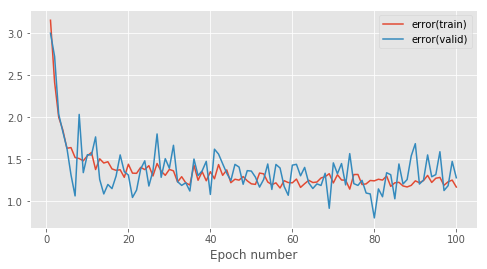

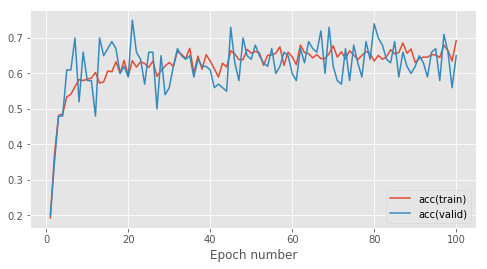

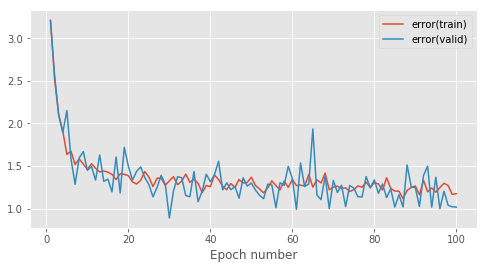

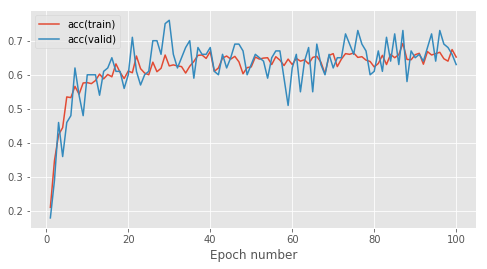

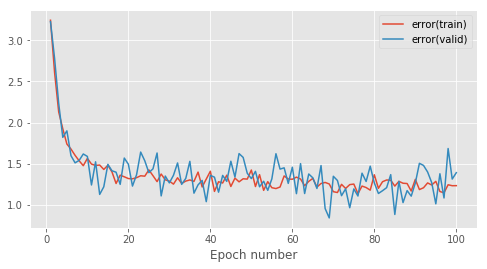

...

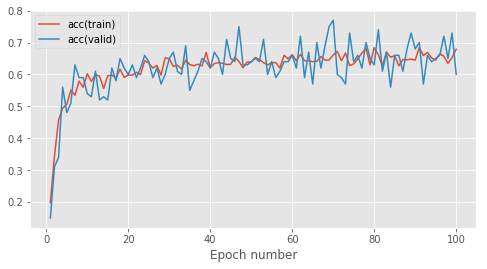

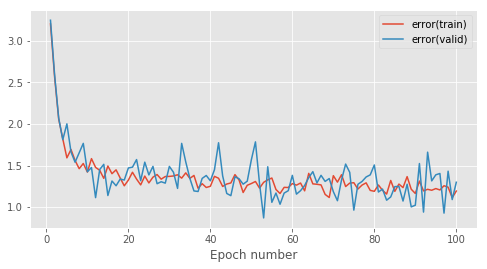

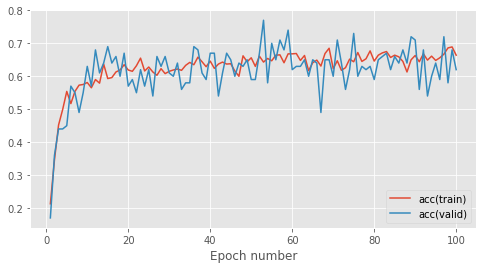

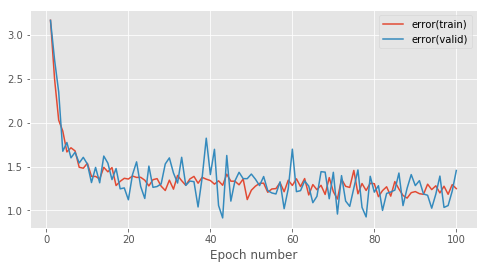

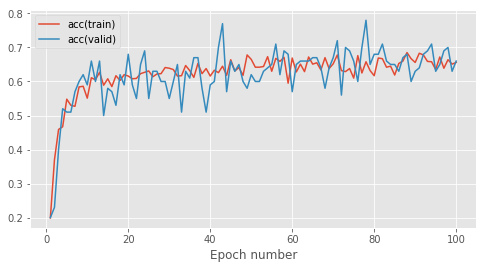

In [250]:
numSamples = 10
num_epochs = 100

prelu_accs = defaultdict(list)
for alpha in [0.001, 0.01, 0.1, 1.0, 10.0]:
    print("*********** PRELU {} ***********".format(alpha))
    mean, sd = gatherPRELUSamples(numSamples, alpha, num_epochs, train_data_100, valid_data_10)
    prelu_accs[alpha] = [mean, sd]
    

In [251]:
for (alpha, stats) in prelu_accs.items():
    print("PRELU Validation set accuracy ({} samples, {} epochs, {} training batches, alpha={}): {} ± {}".format(10, num_epochs, 100, alpha, stats[0], stats[1]))

PRELU Validation set accuracy (10 samples, 100 epochs, 100 training batches, alpha=0.001): 0.641 ± 0.051468436929831086
PRELU Validation set accuracy (10 samples, 100 epochs, 100 training batches, alpha=0.01): 0.6400000000000001 ± 0.03872983346207416
PRELU Validation set accuracy (10 samples, 100 epochs, 100 training batches, alpha=0.1): 0.664 ± 0.06590902821313632
PRELU Validation set accuracy (10 samples, 100 epochs, 100 training batches, alpha=1.0): 0.6460000000000001 ± 0.028000000000000004
PRELU Validation set accuracy (10 samples, 100 epochs, 100 training batches, alpha=10.0): 0.6410000000000001 ± 0.05889821729050888


#### RReLU

In [14]:
from mlp.layers import RandomReluLayer

def createMultiLayerRRELUModel(numHiddenLayers, lower, upper, layer_rng, input_dim, hidden_dim, output_dim, rng):
    # initialise hyperparameters
    hiddenLayerType = RandomReluLayer(rng=layer_rng)
    
    return createMultiLayerModel(numHiddenLayers, hiddenLayerType, input_dim, hidden_dim, output_dim, rng)
    

In [15]:
def gatherRRELUSamples(numSamples, layer_rng, num_epochs, train_data, valid_data, lower=0.125, upper=0.3333333333333333, early_stopping=None):
    rrelu_valid_accs = []
    
    if test_data is not None:
        rrelu_test_accs = []

    for i in range(0, numSamples):
        print("*********** Sample {} ***********".format(i+1))
        # reset rng
        rng.seed(i)

        # create model (3 layers)
        rrelu_model = createMultiLayerRRELUModel(numHiddenLayers, lower, upper, layer_rng, input_dim, hidden_dim, output_dim, rng)

        rrelu_stats = trainModel(rrelu_model, train_data, valid_data,
                                   learning_rate = 0.01,
                                   num_epochs = num_epochs,
                                   stats_interval = 1,
                                   batch_size = 100,
                                   hidden_dim = 128, early_stopping=early_stopping)

        # create empty "best model"
        best_rrelu_model = createMultiLayerRRELUModel(numHiddenLayers, lower, upper, layer_rng, input_dim, hidden_dim, output_dim, rng)

        # report best model validation set accuracy
        rrelu_valid_acc = createBestModelAndCalculateAccuracy(rrelu_stats[0].model, best_rrelu_model, rrelu_stats[0].model.params, rrelu_stats[0].best_model_params, valid_data, 'Validation')

        rrelu_valid_accs.append(rrelu_valid_acc)
        
        if test_data is not None: 
            rrelu_test_acc = createBestModelAndCalculateAccuracy(rrelu_stats[0].model, best_rrelu_model, rrelu_stats[0].model.params, rrelu_stats[0].best_model_params, test_data, 'Test') 
            rrelu_test_accs.append(rrelu_test_acc)
    
    mean = np.array(rrelu_valid_accs).mean()
    sd = np.array(rrelu_valid_accs).std()
    
    if test_data is not None:
        mean_test = np.array(rrelu_test_accs).mean()
        sd_test = np.array(rrelu_test_accs).std()

        return mean, sd, mean_test, sd_test
    
    return mean, sd


*********** RRELU 10 ***********
*********** Sample 1 ***********


Epoch 1: 0.4s to complete
    error(train)=3.56e+00, acc(train)=1.54e-01, error(valid)=3.60e+00, acc(valid)=1.60e-01
Epoch 2: 0.4s to complete
    error(train)=3.12e+00, acc(train)=2.57e-01, error(valid)=3.18e+00, acc(valid)=2.10e-01
Epoch 3: 0.4s to complete
    error(train)=2.58e+00, acc(train)=3.33e-01, error(valid)=2.66e+00, acc(valid)=3.00e-01
Epoch 4: 0.4s to complete
    error(train)=2.18e+00, acc(train)=4.03e-01, error(valid)=2.03e+00, acc(valid)=4.10e-01
Epoch 5: 0.4s to complete
    error(train)=1.95e+00, acc(train)=4.81e-01, error(valid)=1.85e+00, acc(valid)=4.80e-01
Epoch 6: 0.4s to complete
    error(train)=1.90e+00, acc(train)=4.53e-01, error(valid)=1.84e+00, acc(valid)=4.90e-01
Epoch 7: 0.4s to complete
    error(train)=1.74e+00, acc(train)=5.12e-01, error(valid)=1.80e+00, acc(valid)=4.60e-01
Epoch 8: 0.3s to complete
    error(train)=1.59e+00, acc(train)=5.28e-01, error(valid)=1.63e+00, acc(valid)=4.90e-01
Epoch 9: 0.4s to complete
    error(train)=1.56e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=8.10e-01, acc(train)=7.41e-01, error(valid)=9.89e-01, acc(valid)=7.50e-01
Epoch 72: 0.4s to complete
    error(train)=8.90e-01, acc(train)=7.22e-01, error(valid)=7.78e-01, acc(valid)=7.30e-01
Epoch 73: 0.3s to complete
    error(train)=8.42e-01, acc(train)=7.50e-01, error(valid)=1.07e+00, acc(valid)=6.70e-01
Epoch 74: 0.4s to complete
    error(train)=8.22e-01, acc(train)=7.53e-01, error(valid)=8.78e-01, acc(valid)=7.20e-01
Epoch 75: 0.4s to complete
    error(train)=8.55e-01, acc(train)=7.30e-01, error(valid)=9.09e-01, acc(valid)=7.40e-01
Epoch 76: 0.3s to complete
    error(train)=8.01e-01, acc(train)=7.62e-01, error(valid)=7.81e-01, acc(valid)=7.60e-01
Epoch 77: 0.4s to complete
    error(train)=9.04e-01, acc(train)=7.16e-01, error(valid)=9.51e-01, acc(valid)=7.00e-01
Epoch 78: 0.4s to complete
    error(train)=7.98e-01, acc(train)=7.47e-01, error(valid)=7.96e-01, acc(valid)=7.10e-01
Epoch 79: 0.3s to complete
    error(train)=7.92e-01, ac


Validation set accuracy on best model: 0.83
*********** Sample 2 ***********


Epoch 1: 0.3s to complete
    error(train)=3.63e+00, acc(train)=1.16e-01, error(valid)=3.65e+00, acc(valid)=1.30e-01
Epoch 2: 0.3s to complete
    error(train)=3.25e+00, acc(train)=2.29e-01, error(valid)=3.35e+00, acc(valid)=1.80e-01
Epoch 3: 0.4s to complete
    error(train)=2.78e+00, acc(train)=2.93e-01, error(valid)=2.85e+00, acc(valid)=2.70e-01
Epoch 4: 0.4s to complete
    error(train)=2.29e+00, acc(train)=3.79e-01, error(valid)=2.31e+00, acc(valid)=4.60e-01
Epoch 5: 0.3s to complete
    error(train)=2.06e+00, acc(train)=4.38e-01, error(valid)=2.09e+00, acc(valid)=4.20e-01
Epoch 6: 0.4s to complete
    error(train)=1.88e+00, acc(train)=4.60e-01, error(valid)=1.61e+00, acc(valid)=5.70e-01
Epoch 7: 0.4s to complete
    error(train)=1.74e+00, acc(train)=5.03e-01, error(valid)=1.80e+00, acc(valid)=5.20e-01
Epoch 8: 0.4s to complete
    error(train)=1.65e+00, acc(train)=5.34e-01, error(valid)=1.70e+00, acc(valid)=5.40e-01
Epoch 9: 0.3s to complete
    error(train)=1.61e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=8.16e-01, acc(train)=7.73e-01, error(valid)=8.01e-01, acc(valid)=7.70e-01
Epoch 72: 0.4s to complete
    error(train)=7.58e-01, acc(train)=7.67e-01, error(valid)=1.07e+00, acc(valid)=6.90e-01
Epoch 73: 0.3s to complete
    error(train)=8.17e-01, acc(train)=7.48e-01, error(valid)=8.98e-01, acc(valid)=7.30e-01
Epoch 74: 0.3s to complete
    error(train)=8.09e-01, acc(train)=7.30e-01, error(valid)=5.78e-01, acc(valid)=7.50e-01
Epoch 75: 0.4s to complete
    error(train)=8.55e-01, acc(train)=7.39e-01, error(valid)=8.32e-01, acc(valid)=7.20e-01
Epoch 76: 0.3s to complete
    error(train)=7.70e-01, acc(train)=7.73e-01, error(valid)=9.63e-01, acc(valid)=7.10e-01
Epoch 77: 0.3s to complete
    error(train)=8.24e-01, acc(train)=7.48e-01, error(valid)=9.81e-01, acc(valid)=7.80e-01
Epoch 78: 0.3s to complete
    error(train)=7.97e-01, acc(train)=7.51e-01, error(valid)=8.40e-01, acc(valid)=7.40e-01
Epoch 79: 0.4s to complete
    error(train)=7.27e-01, ac


Validation set accuracy on best model: 0.77
*********** Sample 3 ***********


Epoch 1: 0.3s to complete
    error(train)=3.62e+00, acc(train)=1.48e-01, error(valid)=3.57e+00, acc(valid)=2.00e-01
Epoch 2: 0.4s to complete
    error(train)=3.25e+00, acc(train)=2.17e-01, error(valid)=3.34e+00, acc(valid)=1.70e-01
Epoch 3: 0.3s to complete
    error(train)=2.79e+00, acc(train)=2.92e-01, error(valid)=2.81e+00, acc(valid)=3.00e-01
Epoch 4: 0.4s to complete
    error(train)=2.30e+00, acc(train)=3.97e-01, error(valid)=2.44e+00, acc(valid)=4.20e-01
Epoch 5: 0.4s to complete
    error(train)=2.07e+00, acc(train)=4.33e-01, error(valid)=2.08e+00, acc(valid)=4.30e-01
Epoch 6: 0.3s to complete
    error(train)=1.90e+00, acc(train)=4.59e-01, error(valid)=1.80e+00, acc(valid)=4.50e-01
Epoch 7: 0.3s to complete
    error(train)=1.78e+00, acc(train)=4.93e-01, error(valid)=1.74e+00, acc(valid)=4.30e-01
Epoch 8: 0.4s to complete
    error(train)=1.60e+00, acc(train)=5.47e-01, error(valid)=1.65e+00, acc(valid)=5.00e-01
Epoch 9: 0.4s to complete
    error(train)=1.57e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=8.54e-01, acc(train)=7.42e-01, error(valid)=1.01e+00, acc(valid)=7.10e-01
Epoch 72: 0.3s to complete
    error(train)=8.66e-01, acc(train)=7.18e-01, error(valid)=7.98e-01, acc(valid)=7.70e-01
Epoch 73: 0.4s to complete
    error(train)=8.61e-01, acc(train)=7.33e-01, error(valid)=6.80e-01, acc(valid)=7.60e-01
Epoch 74: 0.3s to complete
    error(train)=8.42e-01, acc(train)=7.35e-01, error(valid)=8.43e-01, acc(valid)=7.30e-01
Epoch 75: 0.4s to complete
    error(train)=7.57e-01, acc(train)=7.65e-01, error(valid)=7.45e-01, acc(valid)=7.90e-01
Epoch 76: 0.4s to complete
    error(train)=8.26e-01, acc(train)=7.45e-01, error(valid)=9.01e-01, acc(valid)=7.50e-01
Epoch 77: 0.3s to complete
    error(train)=8.28e-01, acc(train)=7.26e-01, error(valid)=1.01e+00, acc(valid)=7.30e-01
Epoch 78: 0.3s to complete
    error(train)=8.26e-01, acc(train)=7.53e-01, error(valid)=7.58e-01, acc(valid)=8.00e-01
Epoch 79: 0.3s to complete
    error(train)=8.94e-01, ac


Validation set accuracy on best model: 0.74
*********** Sample 4 ***********


Epoch 1: 0.3s to complete
    error(train)=3.62e+00, acc(train)=1.38e-01, error(valid)=3.65e+00, acc(valid)=1.40e-01
Epoch 2: 0.3s to complete
    error(train)=3.27e+00, acc(train)=2.13e-01, error(valid)=3.25e+00, acc(valid)=2.50e-01
Epoch 3: 0.4s to complete
    error(train)=2.82e+00, acc(train)=2.76e-01, error(valid)=2.57e+00, acc(valid)=3.50e-01
Epoch 4: 0.3s to complete
    error(train)=2.33e+00, acc(train)=3.71e-01, error(valid)=2.37e+00, acc(valid)=3.30e-01
Epoch 5: 0.3s to complete
    error(train)=2.06e+00, acc(train)=4.28e-01, error(valid)=2.22e+00, acc(valid)=4.30e-01
Epoch 6: 0.4s to complete
    error(train)=1.90e+00, acc(train)=4.81e-01, error(valid)=1.76e+00, acc(valid)=4.70e-01
Epoch 7: 0.3s to complete
    error(train)=1.68e+00, acc(train)=5.26e-01, error(valid)=1.89e+00, acc(valid)=4.60e-01
Epoch 8: 0.3s to complete
    error(train)=1.59e+00, acc(train)=5.47e-01, error(valid)=1.86e+00, acc(valid)=4.40e-01
Epoch 9: 0.3s to complete
    error(train)=1.63e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=8.80e-01, acc(train)=7.33e-01, error(valid)=9.38e-01, acc(valid)=7.50e-01
Epoch 72: 0.4s to complete
    error(train)=8.84e-01, acc(train)=7.21e-01, error(valid)=6.50e-01, acc(valid)=7.80e-01
Epoch 73: 0.4s to complete
    error(train)=8.50e-01, acc(train)=7.34e-01, error(valid)=9.84e-01, acc(valid)=7.00e-01
Epoch 74: 0.4s to complete
    error(train)=9.00e-01, acc(train)=7.43e-01, error(valid)=8.22e-01, acc(valid)=7.70e-01
Epoch 75: 0.4s to complete
    error(train)=8.16e-01, acc(train)=7.55e-01, error(valid)=9.23e-01, acc(valid)=7.20e-01
Epoch 76: 0.4s to complete
    error(train)=8.13e-01, acc(train)=7.41e-01, error(valid)=7.63e-01, acc(valid)=7.50e-01
Epoch 77: 0.4s to complete
    error(train)=8.72e-01, acc(train)=7.35e-01, error(valid)=1.11e+00, acc(valid)=6.80e-01
Epoch 78: 0.3s to complete
    error(train)=8.54e-01, acc(train)=7.49e-01, error(valid)=7.67e-01, acc(valid)=7.60e-01
Epoch 79: 0.4s to complete
    error(train)=7.47e-01, ac


Validation set accuracy on best model: 0.82
*********** Sample 5 ***********


Epoch 1: 0.3s to complete
    error(train)=3.60e+00, acc(train)=1.52e-01, error(valid)=3.66e+00, acc(valid)=9.00e-02
Epoch 2: 0.4s to complete
    error(train)=3.16e+00, acc(train)=2.44e-01, error(valid)=3.16e+00, acc(valid)=3.10e-01
Epoch 3: 0.4s to complete
    error(train)=2.74e+00, acc(train)=3.01e-01, error(valid)=2.61e+00, acc(valid)=3.00e-01
Epoch 4: 0.4s to complete
    error(train)=2.25e+00, acc(train)=4.04e-01, error(valid)=2.28e+00, acc(valid)=4.30e-01
Epoch 5: 0.4s to complete
    error(train)=2.04e+00, acc(train)=4.49e-01, error(valid)=1.71e+00, acc(valid)=5.10e-01
Epoch 6: 0.3s to complete
    error(train)=1.81e+00, acc(train)=4.77e-01, error(valid)=1.85e+00, acc(valid)=4.90e-01
Epoch 7: 0.3s to complete
    error(train)=1.79e+00, acc(train)=4.97e-01, error(valid)=1.57e+00, acc(valid)=4.90e-01
Epoch 8: 0.3s to complete
    error(train)=1.65e+00, acc(train)=5.37e-01, error(valid)=1.69e+00, acc(valid)=4.90e-01
Epoch 9: 0.3s to complete
    error(train)=1.66e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=8.78e-01, acc(train)=7.27e-01, error(valid)=6.44e-01, acc(valid)=8.40e-01
Epoch 72: 0.3s to complete
    error(train)=9.17e-01, acc(train)=7.28e-01, error(valid)=7.62e-01, acc(valid)=6.90e-01
Epoch 73: 0.4s to complete
    error(train)=8.02e-01, acc(train)=7.35e-01, error(valid)=1.04e+00, acc(valid)=6.70e-01
Epoch 74: 0.4s to complete
    error(train)=7.95e-01, acc(train)=7.64e-01, error(valid)=8.07e-01, acc(valid)=8.10e-01
Epoch 75: 0.4s to complete
    error(train)=8.56e-01, acc(train)=7.40e-01, error(valid)=8.21e-01, acc(valid)=7.40e-01
Epoch 76: 0.3s to complete
    error(train)=7.80e-01, acc(train)=7.65e-01, error(valid)=6.33e-01, acc(valid)=8.10e-01
Epoch 77: 0.4s to complete
    error(train)=8.09e-01, acc(train)=7.29e-01, error(valid)=1.06e+00, acc(valid)=7.40e-01
Epoch 78: 0.4s to complete
    error(train)=8.00e-01, acc(train)=7.40e-01, error(valid)=8.30e-01, acc(valid)=7.60e-01
Epoch 79: 0.3s to complete
    error(train)=8.13e-01, ac


Validation set accuracy on best model: 0.75
*********** Sample 6 ***********


Epoch 1: 0.4s to complete
    error(train)=3.65e+00, acc(train)=1.25e-01, error(valid)=3.69e+00, acc(valid)=1.20e-01
Epoch 2: 0.3s to complete
    error(train)=3.30e+00, acc(train)=1.76e-01, error(valid)=3.35e+00, acc(valid)=1.70e-01
Epoch 3: 0.3s to complete
    error(train)=2.86e+00, acc(train)=2.46e-01, error(valid)=2.80e+00, acc(valid)=2.20e-01
Epoch 4: 0.3s to complete
    error(train)=2.38e+00, acc(train)=3.82e-01, error(valid)=2.36e+00, acc(valid)=3.70e-01
Epoch 5: 0.3s to complete
    error(train)=1.97e+00, acc(train)=4.69e-01, error(valid)=2.02e+00, acc(valid)=4.40e-01
Epoch 6: 0.4s to complete
    error(train)=1.88e+00, acc(train)=4.62e-01, error(valid)=1.95e+00, acc(valid)=4.40e-01
Epoch 7: 0.3s to complete
    error(train)=1.83e+00, acc(train)=4.93e-01, error(valid)=1.69e+00, acc(valid)=5.00e-01
Epoch 8: 0.4s to complete
    error(train)=1.72e+00, acc(train)=5.21e-01, error(valid)=1.54e+00, acc(valid)=5.50e-01
Epoch 9: 0.4s to complete
    error(train)=1.62e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=8.76e-01, acc(train)=7.31e-01, error(valid)=7.43e-01, acc(valid)=7.30e-01
Epoch 72: 0.3s to complete
    error(train)=8.41e-01, acc(train)=7.29e-01, error(valid)=9.68e-01, acc(valid)=7.40e-01
Epoch 73: 0.3s to complete
    error(train)=8.69e-01, acc(train)=7.18e-01, error(valid)=8.14e-01, acc(valid)=7.90e-01
Epoch 74: 0.3s to complete
    error(train)=7.40e-01, acc(train)=7.77e-01, error(valid)=8.88e-01, acc(valid)=7.30e-01
Epoch 75: 0.3s to complete
    error(train)=8.16e-01, acc(train)=7.68e-01, error(valid)=7.26e-01, acc(valid)=7.60e-01
Epoch 76: 0.3s to complete
    error(train)=7.72e-01, acc(train)=7.55e-01, error(valid)=7.84e-01, acc(valid)=7.70e-01
Epoch 77: 0.4s to complete
    error(train)=8.12e-01, acc(train)=7.47e-01, error(valid)=6.74e-01, acc(valid)=7.70e-01
Epoch 78: 0.3s to complete
    error(train)=8.52e-01, acc(train)=7.44e-01, error(valid)=7.29e-01, acc(valid)=7.90e-01
Epoch 79: 0.3s to complete
    error(train)=8.62e-01, ac


Validation set accuracy on best model: 0.78
*********** Sample 7 ***********


Epoch 1: 0.3s to complete
    error(train)=3.59e+00, acc(train)=1.19e-01, error(valid)=3.61e+00, acc(valid)=9.00e-02
Epoch 2: 0.3s to complete
    error(train)=3.19e+00, acc(train)=1.77e-01, error(valid)=3.22e+00, acc(valid)=2.20e-01
Epoch 3: 0.4s to complete
    error(train)=2.73e+00, acc(train)=2.75e-01, error(valid)=2.80e+00, acc(valid)=2.50e-01
Epoch 4: 0.3s to complete
    error(train)=2.34e+00, acc(train)=3.79e-01, error(valid)=2.24e+00, acc(valid)=4.10e-01
Epoch 5: 0.3s to complete
    error(train)=2.03e+00, acc(train)=4.41e-01, error(valid)=2.11e+00, acc(valid)=4.60e-01
Epoch 6: 0.3s to complete
    error(train)=1.91e+00, acc(train)=4.61e-01, error(valid)=1.74e+00, acc(valid)=5.10e-01
Epoch 7: 0.3s to complete
    error(train)=1.78e+00, acc(train)=5.06e-01, error(valid)=1.87e+00, acc(valid)=4.40e-01
Epoch 8: 0.3s to complete
    error(train)=1.76e+00, acc(train)=5.12e-01, error(valid)=1.58e+00, acc(valid)=5.40e-01
Epoch 9: 0.3s to complete
    error(train)=1.59e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=8.29e-01, acc(train)=7.49e-01, error(valid)=8.00e-01, acc(valid)=7.70e-01
Epoch 72: 0.3s to complete
    error(train)=7.55e-01, acc(train)=7.52e-01, error(valid)=8.54e-01, acc(valid)=7.60e-01
Epoch 73: 0.4s to complete
    error(train)=8.39e-01, acc(train)=7.40e-01, error(valid)=7.88e-01, acc(valid)=7.90e-01
Epoch 74: 0.4s to complete
    error(train)=8.76e-01, acc(train)=7.40e-01, error(valid)=8.22e-01, acc(valid)=7.40e-01
Epoch 75: 0.4s to complete
    error(train)=8.11e-01, acc(train)=7.40e-01, error(valid)=6.84e-01, acc(valid)=8.00e-01
Epoch 76: 0.4s to complete
    error(train)=8.12e-01, acc(train)=7.35e-01, error(valid)=9.45e-01, acc(valid)=7.50e-01
Epoch 77: 0.3s to complete
    error(train)=8.20e-01, acc(train)=7.59e-01, error(valid)=1.03e+00, acc(valid)=6.60e-01
Epoch 78: 0.3s to complete
    error(train)=8.31e-01, acc(train)=7.51e-01, error(valid)=9.44e-01, acc(valid)=7.50e-01
Epoch 79: 0.3s to complete
    error(train)=8.77e-01, ac


Validation set accuracy on best model: 0.77
*********** Sample 8 ***********


Epoch 1: 0.3s to complete
    error(train)=3.62e+00, acc(train)=1.30e-01, error(valid)=3.66e+00, acc(valid)=1.40e-01
Epoch 2: 0.3s to complete
    error(train)=3.21e+00, acc(train)=2.06e-01, error(valid)=3.12e+00, acc(valid)=2.80e-01
Epoch 3: 0.3s to complete
    error(train)=2.58e+00, acc(train)=3.63e-01, error(valid)=2.71e+00, acc(valid)=3.40e-01
Epoch 4: 0.3s to complete
    error(train)=2.18e+00, acc(train)=4.25e-01, error(valid)=2.28e+00, acc(valid)=4.20e-01
Epoch 5: 0.3s to complete
    error(train)=1.87e+00, acc(train)=4.71e-01, error(valid)=1.86e+00, acc(valid)=5.20e-01
Epoch 6: 0.3s to complete
    error(train)=1.72e+00, acc(train)=5.44e-01, error(valid)=1.90e+00, acc(valid)=4.30e-01
Epoch 7: 0.3s to complete
    error(train)=1.66e+00, acc(train)=5.10e-01, error(valid)=1.81e+00, acc(valid)=5.40e-01
Epoch 8: 0.3s to complete
    error(train)=1.55e+00, acc(train)=5.37e-01, error(valid)=1.57e+00, acc(valid)=5.70e-01
Epoch 9: 0.3s to complete
    error(train)=1.56e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=8.12e-01, acc(train)=7.43e-01, error(valid)=6.71e-01, acc(valid)=7.80e-01
Epoch 72: 0.4s to complete
    error(train)=8.27e-01, acc(train)=7.37e-01, error(valid)=7.59e-01, acc(valid)=7.10e-01
Epoch 73: 0.4s to complete
    error(train)=7.85e-01, acc(train)=7.60e-01, error(valid)=9.24e-01, acc(valid)=7.50e-01
Epoch 74: 0.3s to complete
    error(train)=8.67e-01, acc(train)=7.32e-01, error(valid)=7.09e-01, acc(valid)=7.80e-01
Epoch 75: 0.3s to complete
    error(train)=8.29e-01, acc(train)=7.30e-01, error(valid)=9.44e-01, acc(valid)=7.30e-01
Epoch 76: 0.3s to complete
    error(train)=7.90e-01, acc(train)=7.69e-01, error(valid)=6.60e-01, acc(valid)=7.90e-01
Epoch 77: 0.3s to complete
    error(train)=8.08e-01, acc(train)=7.51e-01, error(valid)=1.05e+00, acc(valid)=6.30e-01
Epoch 78: 0.3s to complete
    error(train)=7.95e-01, acc(train)=7.62e-01, error(valid)=1.20e+00, acc(valid)=6.80e-01
Epoch 79: 0.4s to complete
    error(train)=8.38e-01, ac


Validation set accuracy on best model: 0.72
*********** Sample 9 ***********


Epoch 1: 0.4s to complete
    error(train)=3.61e+00, acc(train)=1.38e-01, error(valid)=3.61e+00, acc(valid)=1.40e-01
Epoch 2: 0.3s to complete
    error(train)=3.18e+00, acc(train)=2.32e-01, error(valid)=3.12e+00, acc(valid)=2.30e-01
Epoch 3: 0.3s to complete
    error(train)=2.65e+00, acc(train)=3.31e-01, error(valid)=2.65e+00, acc(valid)=3.60e-01
Epoch 4: 0.4s to complete
    error(train)=2.24e+00, acc(train)=4.04e-01, error(valid)=2.14e+00, acc(valid)=4.30e-01
Epoch 5: 0.3s to complete
    error(train)=2.01e+00, acc(train)=4.44e-01, error(valid)=2.05e+00, acc(valid)=4.20e-01
Epoch 6: 0.3s to complete
    error(train)=1.77e+00, acc(train)=4.99e-01, error(valid)=1.81e+00, acc(valid)=4.50e-01
Epoch 7: 0.3s to complete
    error(train)=1.68e+00, acc(train)=5.29e-01, error(valid)=1.89e+00, acc(valid)=4.30e-01
Epoch 8: 0.3s to complete
    error(train)=1.52e+00, acc(train)=5.70e-01, error(valid)=1.79e+00, acc(valid)=5.20e-01
Epoch 9: 0.4s to complete
    error(train)=1.57e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=8.29e-01, acc(train)=7.35e-01, error(valid)=8.43e-01, acc(valid)=7.40e-01
Epoch 72: 0.4s to complete
    error(train)=8.38e-01, acc(train)=7.36e-01, error(valid)=8.95e-01, acc(valid)=7.20e-01
Epoch 73: 0.3s to complete
    error(train)=8.42e-01, acc(train)=7.56e-01, error(valid)=8.00e-01, acc(valid)=7.30e-01
Epoch 74: 0.4s to complete
    error(train)=8.49e-01, acc(train)=7.48e-01, error(valid)=7.37e-01, acc(valid)=7.70e-01
Epoch 75: 0.4s to complete
    error(train)=7.64e-01, acc(train)=7.60e-01, error(valid)=7.37e-01, acc(valid)=7.50e-01
Epoch 76: 0.3s to complete
    error(train)=8.02e-01, acc(train)=7.47e-01, error(valid)=1.13e+00, acc(valid)=6.90e-01
Epoch 77: 0.3s to complete
    error(train)=8.47e-01, acc(train)=7.37e-01, error(valid)=8.30e-01, acc(valid)=7.00e-01
Epoch 78: 0.4s to complete
    error(train)=7.97e-01, acc(train)=7.52e-01, error(valid)=8.98e-01, acc(valid)=7.30e-01
Epoch 79: 0.3s to complete
    error(train)=7.79e-01, ac


Validation set accuracy on best model: 0.75
*********** Sample 10 ***********


Epoch 1: 0.4s to complete
    error(train)=3.64e+00, acc(train)=1.38e-01, error(valid)=3.60e+00, acc(valid)=1.70e-01
Epoch 2: 0.3s to complete
    error(train)=3.25e+00, acc(train)=2.33e-01, error(valid)=3.24e+00, acc(valid)=2.20e-01
Epoch 3: 0.4s to complete
    error(train)=2.72e+00, acc(train)=3.40e-01, error(valid)=2.78e+00, acc(valid)=3.20e-01
Epoch 4: 0.3s to complete
    error(train)=2.32e+00, acc(train)=3.86e-01, error(valid)=2.22e+00, acc(valid)=4.20e-01
Epoch 5: 0.3s to complete
    error(train)=2.12e+00, acc(train)=4.19e-01, error(valid)=2.11e+00, acc(valid)=4.40e-01
Epoch 6: 0.3s to complete
    error(train)=1.89e+00, acc(train)=4.86e-01, error(valid)=1.95e+00, acc(valid)=4.60e-01
Epoch 7: 0.4s to complete
    error(train)=1.82e+00, acc(train)=4.95e-01, error(valid)=1.89e+00, acc(valid)=4.80e-01
Epoch 8: 0.3s to complete
    error(train)=1.63e+00, acc(train)=5.49e-01, error(valid)=1.74e+00, acc(valid)=5.50e-01
Epoch 9: 0.4s to complete
    error(train)=1.65e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=8.12e-01, acc(train)=7.47e-01, error(valid)=1.04e+00, acc(valid)=6.90e-01
Epoch 72: 0.4s to complete
    error(train)=7.98e-01, acc(train)=7.63e-01, error(valid)=8.44e-01, acc(valid)=7.00e-01
Epoch 73: 0.3s to complete
    error(train)=8.11e-01, acc(train)=7.63e-01, error(valid)=8.52e-01, acc(valid)=7.40e-01
Epoch 74: 0.4s to complete
    error(train)=7.47e-01, acc(train)=7.52e-01, error(valid)=7.54e-01, acc(valid)=7.70e-01
Epoch 75: 0.3s to complete
    error(train)=8.19e-01, acc(train)=7.53e-01, error(valid)=9.46e-01, acc(valid)=6.80e-01
Epoch 76: 0.4s to complete
    error(train)=8.01e-01, acc(train)=7.37e-01, error(valid)=7.19e-01, acc(valid)=7.50e-01
Epoch 77: 0.4s to complete
    error(train)=7.74e-01, acc(train)=7.43e-01, error(valid)=8.27e-01, acc(valid)=7.70e-01
Epoch 78: 0.3s to complete
    error(train)=8.50e-01, acc(train)=7.45e-01, error(valid)=9.39e-01, acc(valid)=6.90e-01
Epoch 79: 0.4s to complete
    error(train)=7.64e-01, ac


Validation set accuracy on best model: 0.79
*********** RRELU 20 ***********
*********** Sample 1 ***********


Epoch 1: 0.4s to complete
    error(train)=3.60e+00, acc(train)=1.34e-01, error(valid)=3.59e+00, acc(valid)=1.30e-01
Epoch 2: 0.3s to complete
    error(train)=3.18e+00, acc(train)=2.14e-01, error(valid)=3.11e+00, acc(valid)=2.60e-01
Epoch 3: 0.3s to complete
    error(train)=2.62e+00, acc(train)=3.34e-01, error(valid)=2.75e+00, acc(valid)=2.80e-01
Epoch 4: 0.3s to complete
    error(train)=2.24e+00, acc(train)=3.92e-01, error(valid)=2.30e+00, acc(valid)=3.30e-01
Epoch 5: 0.3s to complete
    error(train)=2.00e+00, acc(train)=4.46e-01, error(valid)=2.09e+00, acc(valid)=4.00e-01
Epoch 6: 0.3s to complete
    error(train)=1.84e+00, acc(train)=4.52e-01, error(valid)=2.00e+00, acc(valid)=3.70e-01
Epoch 7: 0.3s to complete
    error(train)=1.72e+00, acc(train)=5.12e-01, error(valid)=1.90e+00, acc(valid)=4.90e-01
Epoch 8: 0.3s to complete
    error(train)=1.60e+00, acc(train)=5.42e-01, error(valid)=1.73e+00, acc(valid)=4.80e-01
Epoch 9: 0.3s to complete
    error(train)=1.53e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=8.84e-01, acc(train)=7.66e-01, error(valid)=7.55e-01, acc(valid)=7.70e-01
Epoch 72: 0.4s to complete
    error(train)=7.80e-01, acc(train)=7.57e-01, error(valid)=9.09e-01, acc(valid)=6.90e-01
Epoch 73: 0.4s to complete
    error(train)=8.47e-01, acc(train)=7.33e-01, error(valid)=9.82e-01, acc(valid)=7.10e-01
Epoch 74: 0.4s to complete
    error(train)=8.63e-01, acc(train)=7.24e-01, error(valid)=9.70e-01, acc(valid)=7.10e-01
Epoch 75: 0.3s to complete
    error(train)=8.25e-01, acc(train)=7.56e-01, error(valid)=8.56e-01, acc(valid)=7.20e-01
Epoch 76: 0.3s to complete
    error(train)=7.85e-01, acc(train)=7.56e-01, error(valid)=9.46e-01, acc(valid)=6.60e-01
Epoch 77: 0.3s to complete
    error(train)=8.50e-01, acc(train)=7.17e-01, error(valid)=8.04e-01, acc(valid)=7.20e-01
Epoch 78: 0.3s to complete
    error(train)=8.18e-01, acc(train)=7.49e-01, error(valid)=8.51e-01, acc(valid)=7.00e-01
Epoch 79: 0.3s to complete
    error(train)=8.68e-01, ac


Validation set accuracy on best model: 0.62
*********** Sample 2 ***********


Epoch 1: 0.4s to complete
    error(train)=3.61e+00, acc(train)=1.13e-01, error(valid)=3.64e+00, acc(valid)=1.10e-01
Epoch 2: 0.4s to complete
    error(train)=3.22e+00, acc(train)=1.74e-01, error(valid)=3.21e+00, acc(valid)=1.80e-01
Epoch 3: 0.3s to complete
    error(train)=2.79e+00, acc(train)=2.75e-01, error(valid)=2.74e+00, acc(valid)=2.90e-01
Epoch 4: 0.3s to complete
    error(train)=2.31e+00, acc(train)=3.85e-01, error(valid)=2.23e+00, acc(valid)=4.50e-01
Epoch 5: 0.4s to complete
    error(train)=2.13e+00, acc(train)=4.13e-01, error(valid)=1.92e+00, acc(valid)=4.50e-01
Epoch 6: 0.3s to complete
    error(train)=1.92e+00, acc(train)=4.52e-01, error(valid)=1.89e+00, acc(valid)=4.90e-01
Epoch 7: 0.3s to complete
    error(train)=1.74e+00, acc(train)=5.37e-01, error(valid)=1.69e+00, acc(valid)=5.30e-01
Epoch 8: 0.4s to complete
    error(train)=1.73e+00, acc(train)=5.09e-01, error(valid)=1.55e+00, acc(valid)=5.40e-01
Epoch 9: 0.3s to complete
    error(train)=1.66e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=8.44e-01, acc(train)=7.20e-01, error(valid)=7.77e-01, acc(valid)=7.60e-01
Epoch 72: 0.3s to complete
    error(train)=7.76e-01, acc(train)=7.49e-01, error(valid)=9.34e-01, acc(valid)=7.50e-01
Epoch 73: 0.3s to complete
    error(train)=8.29e-01, acc(train)=7.49e-01, error(valid)=1.01e+00, acc(valid)=7.20e-01
Epoch 74: 0.4s to complete
    error(train)=8.94e-01, acc(train)=7.45e-01, error(valid)=8.68e-01, acc(valid)=7.40e-01
Epoch 75: 0.4s to complete
    error(train)=8.00e-01, acc(train)=7.43e-01, error(valid)=7.10e-01, acc(valid)=8.30e-01
Epoch 76: 0.4s to complete
    error(train)=8.82e-01, acc(train)=7.36e-01, error(valid)=8.03e-01, acc(valid)=7.40e-01
Epoch 77: 0.4s to complete
    error(train)=7.77e-01, acc(train)=7.70e-01, error(valid)=9.25e-01, acc(valid)=7.30e-01
Epoch 78: 0.3s to complete
    error(train)=8.52e-01, acc(train)=7.38e-01, error(valid)=7.32e-01, acc(valid)=8.00e-01
Epoch 79: 0.3s to complete
    error(train)=7.39e-01, ac


Validation set accuracy on best model: 0.76
*********** Sample 3 ***********


Epoch 1: 0.4s to complete
    error(train)=3.63e+00, acc(train)=1.37e-01, error(valid)=3.61e+00, acc(valid)=1.10e-01
Epoch 2: 0.4s to complete
    error(train)=3.27e+00, acc(train)=1.99e-01, error(valid)=3.27e+00, acc(valid)=2.20e-01
Epoch 3: 0.3s to complete
    error(train)=2.75e+00, acc(train)=2.81e-01, error(valid)=2.76e+00, acc(valid)=3.10e-01
Epoch 4: 0.4s to complete
    error(train)=2.31e+00, acc(train)=4.09e-01, error(valid)=2.49e+00, acc(valid)=3.30e-01
Epoch 5: 0.4s to complete
    error(train)=2.00e+00, acc(train)=4.48e-01, error(valid)=2.08e+00, acc(valid)=3.80e-01
Epoch 6: 0.3s to complete
    error(train)=1.95e+00, acc(train)=4.71e-01, error(valid)=1.84e+00, acc(valid)=4.60e-01
Epoch 7: 0.4s to complete
    error(train)=1.79e+00, acc(train)=4.84e-01, error(valid)=1.84e+00, acc(valid)=4.40e-01
Epoch 8: 0.3s to complete
    error(train)=1.77e+00, acc(train)=5.05e-01, error(valid)=1.63e+00, acc(valid)=5.50e-01
Epoch 9: 0.3s to complete
    error(train)=1.61e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=8.34e-01, acc(train)=7.36e-01, error(valid)=7.92e-01, acc(valid)=7.30e-01
Epoch 72: 0.4s to complete
    error(train)=8.43e-01, acc(train)=7.38e-01, error(valid)=8.81e-01, acc(valid)=6.90e-01
Epoch 73: 0.3s to complete
    error(train)=8.12e-01, acc(train)=7.71e-01, error(valid)=8.21e-01, acc(valid)=7.30e-01
Epoch 74: 0.3s to complete
    error(train)=7.60e-01, acc(train)=7.78e-01, error(valid)=9.50e-01, acc(valid)=7.50e-01
Epoch 75: 0.3s to complete
    error(train)=8.63e-01, acc(train)=7.52e-01, error(valid)=8.86e-01, acc(valid)=7.30e-01
Epoch 76: 0.3s to complete
    error(train)=7.93e-01, acc(train)=7.53e-01, error(valid)=8.28e-01, acc(valid)=7.20e-01
Epoch 77: 0.4s to complete
    error(train)=8.16e-01, acc(train)=7.65e-01, error(valid)=9.28e-01, acc(valid)=7.20e-01
Epoch 78: 0.4s to complete
    error(train)=8.62e-01, acc(train)=7.40e-01, error(valid)=6.19e-01, acc(valid)=8.20e-01
Epoch 79: 0.3s to complete
    error(train)=7.98e-01, ac


Validation set accuracy on best model: 0.73
*********** Sample 4 ***********


Epoch 1: 0.4s to complete
    error(train)=3.59e+00, acc(train)=1.33e-01, error(valid)=3.64e+00, acc(valid)=1.50e-01
Epoch 2: 0.4s to complete
    error(train)=3.28e+00, acc(train)=1.92e-01, error(valid)=3.30e+00, acc(valid)=2.00e-01
Epoch 3: 0.3s to complete
    error(train)=2.83e+00, acc(train)=2.63e-01, error(valid)=2.80e+00, acc(valid)=2.90e-01
Epoch 4: 0.3s to complete
    error(train)=2.37e+00, acc(train)=3.76e-01, error(valid)=2.42e+00, acc(valid)=2.90e-01
Epoch 5: 0.4s to complete
    error(train)=2.07e+00, acc(train)=4.63e-01, error(valid)=1.91e+00, acc(valid)=4.80e-01
Epoch 6: 0.4s to complete
    error(train)=1.88e+00, acc(train)=4.64e-01, error(valid)=1.82e+00, acc(valid)=4.60e-01
Epoch 7: 0.4s to complete
    error(train)=1.68e+00, acc(train)=5.32e-01, error(valid)=2.06e+00, acc(valid)=4.30e-01
Epoch 8: 0.4s to complete
    error(train)=1.70e+00, acc(train)=5.29e-01, error(valid)=1.74e+00, acc(valid)=4.70e-01
Epoch 9: 0.4s to complete
    error(train)=1.61e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=8.19e-01, acc(train)=7.43e-01, error(valid)=8.65e-01, acc(valid)=7.00e-01
Epoch 72: 0.3s to complete
    error(train)=9.02e-01, acc(train)=7.27e-01, error(valid)=9.90e-01, acc(valid)=6.60e-01
Epoch 73: 0.3s to complete
    error(train)=8.40e-01, acc(train)=7.18e-01, error(valid)=8.25e-01, acc(valid)=7.70e-01
Epoch 74: 0.3s to complete
    error(train)=7.50e-01, acc(train)=7.66e-01, error(valid)=9.53e-01, acc(valid)=6.80e-01
Epoch 75: 0.3s to complete
    error(train)=7.94e-01, acc(train)=7.57e-01, error(valid)=7.24e-01, acc(valid)=7.90e-01
Epoch 76: 0.3s to complete
    error(train)=8.28e-01, acc(train)=7.32e-01, error(valid)=9.42e-01, acc(valid)=6.80e-01
Epoch 77: 0.3s to complete
    error(train)=7.86e-01, acc(train)=7.74e-01, error(valid)=8.01e-01, acc(valid)=7.20e-01
Epoch 78: 0.4s to complete
    error(train)=7.35e-01, acc(train)=7.60e-01, error(valid)=7.50e-01, acc(valid)=7.60e-01
Epoch 79: 0.3s to complete
    error(train)=7.90e-01, ac


Validation set accuracy on best model: 0.83
*********** Sample 5 ***********


Epoch 1: 0.4s to complete
    error(train)=3.59e+00, acc(train)=1.19e-01, error(valid)=3.51e+00, acc(valid)=1.80e-01
Epoch 2: 0.4s to complete
    error(train)=3.23e+00, acc(train)=2.11e-01, error(valid)=3.13e+00, acc(valid)=3.00e-01
Epoch 3: 0.4s to complete
    error(train)=2.70e+00, acc(train)=2.94e-01, error(valid)=2.75e+00, acc(valid)=3.00e-01
Epoch 4: 0.3s to complete
    error(train)=2.34e+00, acc(train)=3.88e-01, error(valid)=2.26e+00, acc(valid)=3.80e-01
Epoch 5: 0.3s to complete
    error(train)=1.96e+00, acc(train)=4.55e-01, error(valid)=1.78e+00, acc(valid)=4.70e-01
Epoch 6: 0.4s to complete
    error(train)=1.86e+00, acc(train)=5.01e-01, error(valid)=1.66e+00, acc(valid)=5.20e-01
Epoch 7: 0.3s to complete
    error(train)=1.69e+00, acc(train)=5.18e-01, error(valid)=1.91e+00, acc(valid)=5.00e-01
Epoch 8: 0.4s to complete
    error(train)=1.69e+00, acc(train)=5.11e-01, error(valid)=1.57e+00, acc(valid)=5.70e-01
Epoch 9: 0.3s to complete
    error(train)=1.57e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=8.52e-01, acc(train)=7.35e-01, error(valid)=1.03e+00, acc(valid)=7.20e-01
Epoch 72: 0.4s to complete
    error(train)=9.23e-01, acc(train)=7.35e-01, error(valid)=8.58e-01, acc(valid)=7.50e-01
Epoch 73: 0.4s to complete
    error(train)=1.01e+00, acc(train)=6.99e-01, error(valid)=9.03e-01, acc(valid)=6.80e-01
Epoch 74: 0.4s to complete
    error(train)=8.80e-01, acc(train)=7.23e-01, error(valid)=9.65e-01, acc(valid)=7.30e-01
Epoch 75: 0.4s to complete
    error(train)=7.73e-01, acc(train)=7.51e-01, error(valid)=6.66e-01, acc(valid)=7.80e-01
Epoch 76: 0.3s to complete
    error(train)=8.40e-01, acc(train)=7.48e-01, error(valid)=7.50e-01, acc(valid)=7.50e-01
Epoch 77: 0.3s to complete
    error(train)=8.44e-01, acc(train)=7.16e-01, error(valid)=8.07e-01, acc(valid)=7.50e-01
Epoch 78: 0.3s to complete
    error(train)=9.06e-01, acc(train)=7.31e-01, error(valid)=1.04e+00, acc(valid)=7.40e-01
Epoch 79: 0.3s to complete
    error(train)=8.41e-01, ac


Validation set accuracy on best model: 0.61
*********** Sample 6 ***********


Epoch 1: 0.4s to complete
    error(train)=3.67e+00, acc(train)=9.20e-02, error(valid)=3.64e+00, acc(valid)=1.40e-01
Epoch 2: 0.4s to complete
    error(train)=3.26e+00, acc(train)=1.73e-01, error(valid)=3.23e+00, acc(valid)=2.20e-01
Epoch 3: 0.3s to complete
    error(train)=2.80e+00, acc(train)=2.76e-01, error(valid)=2.83e+00, acc(valid)=3.20e-01
Epoch 4: 0.4s to complete
    error(train)=2.48e+00, acc(train)=3.54e-01, error(valid)=2.39e+00, acc(valid)=3.80e-01
Epoch 5: 0.3s to complete
    error(train)=2.05e+00, acc(train)=4.52e-01, error(valid)=2.03e+00, acc(valid)=4.10e-01
Epoch 6: 0.3s to complete
    error(train)=1.89e+00, acc(train)=4.70e-01, error(valid)=1.87e+00, acc(valid)=4.60e-01
Epoch 7: 0.3s to complete
    error(train)=1.87e+00, acc(train)=5.04e-01, error(valid)=1.68e+00, acc(valid)=5.70e-01
Epoch 8: 0.3s to complete
    error(train)=1.79e+00, acc(train)=4.92e-01, error(valid)=1.65e+00, acc(valid)=4.90e-01
Epoch 9: 0.3s to complete
    error(train)=1.57e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=8.49e-01, acc(train)=7.41e-01, error(valid)=7.21e-01, acc(valid)=7.70e-01
Epoch 72: 0.4s to complete
    error(train)=9.23e-01, acc(train)=7.22e-01, error(valid)=9.09e-01, acc(valid)=7.50e-01
Epoch 73: 0.3s to complete
    error(train)=8.14e-01, acc(train)=7.43e-01, error(valid)=1.09e+00, acc(valid)=7.60e-01
Epoch 74: 0.3s to complete
    error(train)=8.13e-01, acc(train)=7.52e-01, error(valid)=9.55e-01, acc(valid)=7.00e-01
Epoch 75: 0.3s to complete
    error(train)=8.15e-01, acc(train)=7.29e-01, error(valid)=1.01e+00, acc(valid)=7.00e-01
Epoch 76: 0.4s to complete
    error(train)=7.85e-01, acc(train)=7.67e-01, error(valid)=6.48e-01, acc(valid)=8.30e-01
Epoch 77: 0.4s to complete
    error(train)=8.45e-01, acc(train)=7.26e-01, error(valid)=8.25e-01, acc(valid)=7.30e-01
Epoch 78: 0.4s to complete
    error(train)=7.77e-01, acc(train)=7.49e-01, error(valid)=8.55e-01, acc(valid)=7.70e-01
Epoch 79: 0.4s to complete
    error(train)=8.79e-01, ac


Validation set accuracy on best model: 0.73
*********** Sample 7 ***********


Epoch 1: 0.4s to complete
    error(train)=3.59e+00, acc(train)=1.07e-01, error(valid)=3.58e+00, acc(valid)=1.50e-01
Epoch 2: 0.3s to complete
    error(train)=3.18e+00, acc(train)=1.98e-01, error(valid)=3.22e+00, acc(valid)=2.40e-01
Epoch 3: 0.3s to complete
    error(train)=2.68e+00, acc(train)=3.31e-01, error(valid)=2.80e+00, acc(valid)=2.40e-01
Epoch 4: 0.3s to complete
    error(train)=2.42e+00, acc(train)=3.61e-01, error(valid)=2.21e+00, acc(valid)=3.60e-01
Epoch 5: 0.4s to complete
    error(train)=2.11e+00, acc(train)=4.31e-01, error(valid)=2.05e+00, acc(valid)=4.00e-01
Epoch 6: 0.3s to complete
    error(train)=1.88e+00, acc(train)=4.99e-01, error(valid)=1.82e+00, acc(valid)=4.80e-01
Epoch 7: 0.3s to complete
    error(train)=1.82e+00, acc(train)=4.77e-01, error(valid)=1.92e+00, acc(valid)=3.90e-01
Epoch 8: 0.4s to complete
    error(train)=1.77e+00, acc(train)=5.18e-01, error(valid)=1.53e+00, acc(valid)=5.10e-01
Epoch 9: 0.3s to complete
    error(train)=1.65e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=8.57e-01, acc(train)=7.59e-01, error(valid)=8.68e-01, acc(valid)=7.30e-01
Epoch 72: 0.4s to complete
    error(train)=8.06e-01, acc(train)=7.61e-01, error(valid)=9.15e-01, acc(valid)=7.10e-01
Epoch 73: 0.3s to complete
    error(train)=8.27e-01, acc(train)=7.39e-01, error(valid)=8.18e-01, acc(valid)=7.30e-01
Epoch 74: 0.3s to complete
    error(train)=8.22e-01, acc(train)=7.50e-01, error(valid)=7.78e-01, acc(valid)=7.60e-01
Epoch 75: 0.3s to complete
    error(train)=8.49e-01, acc(train)=7.32e-01, error(valid)=7.35e-01, acc(valid)=7.90e-01
Epoch 76: 0.3s to complete
    error(train)=8.24e-01, acc(train)=7.38e-01, error(valid)=6.99e-01, acc(valid)=7.80e-01
Epoch 77: 0.3s to complete
    error(train)=8.85e-01, acc(train)=7.34e-01, error(valid)=7.64e-01, acc(valid)=7.70e-01
Epoch 78: 0.3s to complete
    error(train)=8.24e-01, acc(train)=7.41e-01, error(valid)=8.55e-01, acc(valid)=7.30e-01
Epoch 79: 0.3s to complete
    error(train)=8.10e-01, ac


Validation set accuracy on best model: 0.74
*********** Sample 8 ***********


Epoch 1: 0.4s to complete
    error(train)=3.62e+00, acc(train)=1.56e-01, error(valid)=3.60e+00, acc(valid)=1.90e-01
Epoch 2: 0.4s to complete
    error(train)=3.15e+00, acc(train)=2.71e-01, error(valid)=3.15e+00, acc(valid)=2.70e-01
Epoch 3: 0.3s to complete
    error(train)=2.66e+00, acc(train)=3.40e-01, error(valid)=2.60e+00, acc(valid)=4.00e-01
Epoch 4: 0.4s to complete
    error(train)=2.23e+00, acc(train)=4.10e-01, error(valid)=2.19e+00, acc(valid)=4.20e-01
Epoch 5: 0.3s to complete
    error(train)=1.94e+00, acc(train)=4.54e-01, error(valid)=1.74e+00, acc(valid)=5.20e-01
Epoch 6: 0.3s to complete
    error(train)=1.74e+00, acc(train)=5.04e-01, error(valid)=1.57e+00, acc(valid)=6.00e-01
Epoch 7: 0.4s to complete
    error(train)=1.62e+00, acc(train)=5.45e-01, error(valid)=1.71e+00, acc(valid)=4.90e-01
Epoch 8: 0.3s to complete
    error(train)=1.66e+00, acc(train)=5.32e-01, error(valid)=1.63e+00, acc(valid)=5.10e-01
Epoch 9: 0.3s to complete
    error(train)=1.56e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=7.68e-01, acc(train)=7.62e-01, error(valid)=7.10e-01, acc(valid)=7.80e-01
Epoch 72: 0.3s to complete
    error(train)=8.88e-01, acc(train)=7.18e-01, error(valid)=1.01e+00, acc(valid)=7.20e-01
Epoch 73: 0.4s to complete
    error(train)=8.08e-01, acc(train)=7.42e-01, error(valid)=9.79e-01, acc(valid)=7.40e-01
Epoch 74: 0.4s to complete
    error(train)=8.82e-01, acc(train)=7.22e-01, error(valid)=5.99e-01, acc(valid)=8.00e-01
Epoch 75: 0.4s to complete
    error(train)=8.03e-01, acc(train)=7.62e-01, error(valid)=9.93e-01, acc(valid)=6.40e-01
Epoch 76: 0.4s to complete
    error(train)=8.41e-01, acc(train)=7.36e-01, error(valid)=8.88e-01, acc(valid)=7.30e-01
Epoch 77: 0.4s to complete
    error(train)=8.69e-01, acc(train)=7.26e-01, error(valid)=1.13e+00, acc(valid)=6.80e-01
Epoch 78: 0.4s to complete
    error(train)=8.33e-01, acc(train)=7.58e-01, error(valid)=7.11e-01, acc(valid)=7.90e-01
Epoch 79: 0.4s to complete
    error(train)=8.71e-01, ac


Validation set accuracy on best model: 0.77
*********** Sample 9 ***********


Epoch 1: 0.3s to complete
    error(train)=3.60e+00, acc(train)=1.55e-01, error(valid)=3.64e+00, acc(valid)=1.00e-01
Epoch 2: 0.3s to complete
    error(train)=3.21e+00, acc(train)=2.18e-01, error(valid)=3.17e+00, acc(valid)=2.40e-01
Epoch 3: 0.4s to complete
    error(train)=2.71e+00, acc(train)=2.99e-01, error(valid)=2.68e+00, acc(valid)=3.60e-01
Epoch 4: 0.4s to complete
    error(train)=2.16e+00, acc(train)=4.59e-01, error(valid)=2.24e+00, acc(valid)=3.30e-01
Epoch 5: 0.3s to complete
    error(train)=2.00e+00, acc(train)=4.63e-01, error(valid)=1.99e+00, acc(valid)=4.40e-01
Epoch 6: 0.4s to complete
    error(train)=1.86e+00, acc(train)=4.69e-01, error(valid)=1.81e+00, acc(valid)=4.60e-01
Epoch 7: 0.4s to complete
    error(train)=1.81e+00, acc(train)=4.96e-01, error(valid)=1.66e+00, acc(valid)=5.40e-01
Epoch 8: 0.3s to complete
    error(train)=1.70e+00, acc(train)=5.24e-01, error(valid)=1.67e+00, acc(valid)=5.50e-01
Epoch 9: 0.4s to complete
    error(train)=1.58e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=8.23e-01, acc(train)=7.49e-01, error(valid)=8.09e-01, acc(valid)=7.10e-01
Epoch 72: 0.3s to complete
    error(train)=7.68e-01, acc(train)=7.56e-01, error(valid)=6.88e-01, acc(valid)=8.20e-01
Epoch 73: 0.3s to complete
    error(train)=8.07e-01, acc(train)=7.40e-01, error(valid)=8.34e-01, acc(valid)=7.90e-01
Epoch 74: 0.3s to complete
    error(train)=8.01e-01, acc(train)=7.49e-01, error(valid)=7.74e-01, acc(valid)=7.80e-01
Epoch 75: 0.3s to complete
    error(train)=8.67e-01, acc(train)=7.42e-01, error(valid)=1.04e+00, acc(valid)=6.90e-01
Epoch 76: 0.3s to complete
    error(train)=7.70e-01, acc(train)=7.64e-01, error(valid)=8.80e-01, acc(valid)=7.80e-01
Epoch 77: 0.3s to complete
    error(train)=8.12e-01, acc(train)=7.63e-01, error(valid)=1.01e+00, acc(valid)=7.10e-01
Epoch 78: 0.4s to complete
    error(train)=8.29e-01, acc(train)=7.41e-01, error(valid)=7.91e-01, acc(valid)=7.50e-01
Epoch 79: 0.4s to complete
    error(train)=8.45e-01, ac


Validation set accuracy on best model: 0.74
*********** Sample 10 ***********


Epoch 1: 0.4s to complete
    error(train)=3.64e+00, acc(train)=1.23e-01, error(valid)=3.61e+00, acc(valid)=2.00e-01
Epoch 2: 0.4s to complete
    error(train)=3.27e+00, acc(train)=2.13e-01, error(valid)=3.23e+00, acc(valid)=2.40e-01
Epoch 3: 0.3s to complete
    error(train)=2.81e+00, acc(train)=2.85e-01, error(valid)=2.85e+00, acc(valid)=2.80e-01
Epoch 4: 0.3s to complete
    error(train)=2.32e+00, acc(train)=4.00e-01, error(valid)=2.26e+00, acc(valid)=4.80e-01
Epoch 5: 0.3s to complete
    error(train)=2.05e+00, acc(train)=4.37e-01, error(valid)=2.01e+00, acc(valid)=4.60e-01
Epoch 6: 0.3s to complete
    error(train)=1.92e+00, acc(train)=4.59e-01, error(valid)=1.85e+00, acc(valid)=4.90e-01
Epoch 7: 0.4s to complete
    error(train)=1.72e+00, acc(train)=5.00e-01, error(valid)=1.69e+00, acc(valid)=5.50e-01
Epoch 8: 0.4s to complete
    error(train)=1.74e+00, acc(train)=5.03e-01, error(valid)=1.85e+00, acc(valid)=4.70e-01
Epoch 9: 0.3s to complete
    error(train)=1.66e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=9.67e-01, acc(train)=7.16e-01, error(valid)=9.08e-01, acc(valid)=7.60e-01
Epoch 72: 0.4s to complete
    error(train)=8.17e-01, acc(train)=7.59e-01, error(valid)=9.54e-01, acc(valid)=7.40e-01
Epoch 73: 0.4s to complete
    error(train)=8.86e-01, acc(train)=7.27e-01, error(valid)=8.04e-01, acc(valid)=7.40e-01
Epoch 74: 0.4s to complete
    error(train)=7.85e-01, acc(train)=7.39e-01, error(valid)=7.24e-01, acc(valid)=7.80e-01
Epoch 75: 0.3s to complete
    error(train)=8.68e-01, acc(train)=7.29e-01, error(valid)=8.98e-01, acc(valid)=7.40e-01
Epoch 76: 0.4s to complete
    error(train)=8.50e-01, acc(train)=7.37e-01, error(valid)=8.77e-01, acc(valid)=7.50e-01
Epoch 77: 0.3s to complete
    error(train)=7.78e-01, acc(train)=7.43e-01, error(valid)=8.43e-01, acc(valid)=7.10e-01
Epoch 78: 0.3s to complete
    error(train)=8.49e-01, acc(train)=7.38e-01, error(valid)=8.86e-01, acc(valid)=6.80e-01
Epoch 79: 0.3s to complete
    error(train)=7.89e-01, ac


Validation set accuracy on best model: 0.69
*********** RRELU 30 ***********
*********** Sample 1 ***********


Epoch 1: 0.3s to complete
    error(train)=3.61e+00, acc(train)=1.05e-01, error(valid)=3.64e+00, acc(valid)=4.00e-02
Epoch 2: 0.3s to complete
    error(train)=3.19e+00, acc(train)=2.00e-01, error(valid)=3.22e+00, acc(valid)=2.20e-01
Epoch 3: 0.4s to complete
    error(train)=2.62e+00, acc(train)=3.21e-01, error(valid)=2.51e+00, acc(valid)=3.60e-01
Epoch 4: 0.3s to complete
    error(train)=2.22e+00, acc(train)=4.27e-01, error(valid)=2.04e+00, acc(valid)=4.90e-01
Epoch 5: 0.3s to complete
    error(train)=1.98e+00, acc(train)=4.32e-01, error(valid)=2.08e+00, acc(valid)=4.80e-01
Epoch 6: 0.4s to complete
    error(train)=1.95e+00, acc(train)=4.53e-01, error(valid)=1.83e+00, acc(valid)=4.70e-01
Epoch 7: 0.4s to complete
    error(train)=1.76e+00, acc(train)=5.15e-01, error(valid)=1.88e+00, acc(valid)=5.10e-01
Epoch 8: 0.3s to complete
    error(train)=1.62e+00, acc(train)=5.38e-01, error(valid)=1.55e+00, acc(valid)=5.50e-01
Epoch 9: 0.4s to complete
    error(train)=1.56e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=9.10e-01, acc(train)=7.34e-01, error(valid)=7.76e-01, acc(valid)=7.90e-01
Epoch 72: 0.3s to complete
    error(train)=8.39e-01, acc(train)=7.47e-01, error(valid)=8.48e-01, acc(valid)=7.00e-01
Epoch 73: 0.3s to complete
    error(train)=8.36e-01, acc(train)=7.48e-01, error(valid)=1.09e+00, acc(valid)=6.30e-01
Epoch 74: 0.3s to complete
    error(train)=8.44e-01, acc(train)=7.34e-01, error(valid)=7.56e-01, acc(valid)=7.50e-01
Epoch 75: 0.3s to complete
    error(train)=8.00e-01, acc(train)=7.50e-01, error(valid)=9.68e-01, acc(valid)=7.20e-01
Epoch 76: 0.3s to complete
    error(train)=7.96e-01, acc(train)=7.60e-01, error(valid)=6.37e-01, acc(valid)=8.10e-01
Epoch 77: 0.3s to complete
    error(train)=8.73e-01, acc(train)=7.34e-01, error(valid)=1.04e+00, acc(valid)=7.50e-01
Epoch 78: 0.3s to complete
    error(train)=8.60e-01, acc(train)=7.34e-01, error(valid)=8.32e-01, acc(valid)=7.60e-01
Epoch 79: 0.4s to complete
    error(train)=8.75e-01, ac


Validation set accuracy on best model: 0.82
*********** Sample 2 ***********


Epoch 1: 0.4s to complete
    error(train)=3.62e+00, acc(train)=1.10e-01, error(valid)=3.60e+00, acc(valid)=1.30e-01
Epoch 2: 0.3s to complete
    error(train)=3.22e+00, acc(train)=1.98e-01, error(valid)=3.32e+00, acc(valid)=1.40e-01
Epoch 3: 0.4s to complete
    error(train)=2.78e+00, acc(train)=2.78e-01, error(valid)=2.87e+00, acc(valid)=2.40e-01
Epoch 4: 0.3s to complete
    error(train)=2.41e+00, acc(train)=3.55e-01, error(valid)=2.50e+00, acc(valid)=3.40e-01
Epoch 5: 0.4s to complete
    error(train)=2.12e+00, acc(train)=4.19e-01, error(valid)=2.11e+00, acc(valid)=4.10e-01
Epoch 6: 0.3s to complete
    error(train)=1.84e+00, acc(train)=5.03e-01, error(valid)=1.65e+00, acc(valid)=5.10e-01
Epoch 7: 0.4s to complete
    error(train)=1.69e+00, acc(train)=5.36e-01, error(valid)=1.77e+00, acc(valid)=4.60e-01
Epoch 8: 0.4s to complete
    error(train)=1.68e+00, acc(train)=5.01e-01, error(valid)=1.91e+00, acc(valid)=4.50e-01
Epoch 9: 0.3s to complete
    error(train)=1.57e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=7.77e-01, acc(train)=7.50e-01, error(valid)=9.42e-01, acc(valid)=7.00e-01
Epoch 72: 0.3s to complete
    error(train)=8.50e-01, acc(train)=7.32e-01, error(valid)=1.03e+00, acc(valid)=7.20e-01
Epoch 73: 0.3s to complete
    error(train)=9.77e-01, acc(train)=6.96e-01, error(valid)=9.57e-01, acc(valid)=7.30e-01
Epoch 74: 0.3s to complete
    error(train)=8.19e-01, acc(train)=7.43e-01, error(valid)=6.52e-01, acc(valid)=7.90e-01
Epoch 75: 0.3s to complete
    error(train)=7.87e-01, acc(train)=7.67e-01, error(valid)=8.95e-01, acc(valid)=7.50e-01
Epoch 76: 0.4s to complete
    error(train)=8.15e-01, acc(train)=7.46e-01, error(valid)=9.13e-01, acc(valid)=7.40e-01
Epoch 77: 0.4s to complete
    error(train)=8.44e-01, acc(train)=7.54e-01, error(valid)=8.01e-01, acc(valid)=7.60e-01
Epoch 78: 0.3s to complete
    error(train)=7.42e-01, acc(train)=7.69e-01, error(valid)=8.57e-01, acc(valid)=6.90e-01
Epoch 79: 0.4s to complete
    error(train)=8.10e-01, ac


Validation set accuracy on best model: 0.7
*********** Sample 3 ***********


Epoch 1: 0.3s to complete
    error(train)=3.65e+00, acc(train)=1.02e-01, error(valid)=3.66e+00, acc(valid)=1.10e-01
Epoch 2: 0.3s to complete
    error(train)=3.28e+00, acc(train)=2.53e-01, error(valid)=3.29e+00, acc(valid)=2.30e-01
Epoch 3: 0.3s to complete
    error(train)=2.77e+00, acc(train)=3.22e-01, error(valid)=2.80e+00, acc(valid)=3.30e-01
Epoch 4: 0.3s to complete
    error(train)=2.38e+00, acc(train)=3.76e-01, error(valid)=2.46e+00, acc(valid)=3.40e-01
Epoch 5: 0.3s to complete
    error(train)=2.05e+00, acc(train)=4.29e-01, error(valid)=2.26e+00, acc(valid)=4.20e-01
Epoch 6: 0.3s to complete
    error(train)=1.94e+00, acc(train)=4.61e-01, error(valid)=1.79e+00, acc(valid)=4.80e-01
Epoch 7: 0.3s to complete
    error(train)=1.62e+00, acc(train)=5.74e-01, error(valid)=1.70e+00, acc(valid)=5.10e-01
Epoch 8: 0.3s to complete
    error(train)=1.63e+00, acc(train)=5.47e-01, error(valid)=1.80e+00, acc(valid)=4.70e-01
Epoch 9: 0.3s to complete
    error(train)=1.51e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=8.45e-01, acc(train)=7.55e-01, error(valid)=8.80e-01, acc(valid)=7.40e-01
Epoch 72: 0.3s to complete
    error(train)=8.65e-01, acc(train)=7.28e-01, error(valid)=1.07e+00, acc(valid)=6.60e-01
Epoch 73: 0.3s to complete
    error(train)=8.13e-01, acc(train)=7.25e-01, error(valid)=8.06e-01, acc(valid)=7.20e-01
Epoch 74: 0.3s to complete
    error(train)=8.46e-01, acc(train)=7.51e-01, error(valid)=1.17e+00, acc(valid)=7.40e-01
Epoch 75: 0.4s to complete
    error(train)=8.54e-01, acc(train)=7.24e-01, error(valid)=7.90e-01, acc(valid)=8.00e-01
Epoch 76: 0.3s to complete
    error(train)=9.48e-01, acc(train)=7.08e-01, error(valid)=7.40e-01, acc(valid)=7.40e-01
Epoch 77: 0.3s to complete
    error(train)=8.11e-01, acc(train)=7.40e-01, error(valid)=8.63e-01, acc(valid)=7.50e-01
Epoch 78: 0.4s to complete
    error(train)=8.08e-01, acc(train)=7.71e-01, error(valid)=8.91e-01, acc(valid)=6.70e-01
Epoch 79: 0.3s to complete
    error(train)=8.10e-01, ac


Validation set accuracy on best model: 0.7
*********** Sample 4 ***********


Epoch 1: 0.3s to complete
    error(train)=3.64e+00, acc(train)=8.50e-02, error(valid)=3.68e+00, acc(valid)=8.00e-02
Epoch 2: 0.4s to complete
    error(train)=3.29e+00, acc(train)=1.44e-01, error(valid)=3.36e+00, acc(valid)=9.00e-02
Epoch 3: 0.3s to complete
    error(train)=2.77e+00, acc(train)=2.98e-01, error(valid)=2.77e+00, acc(valid)=2.50e-01
Epoch 4: 0.3s to complete
    error(train)=2.29e+00, acc(train)=3.98e-01, error(valid)=2.28e+00, acc(valid)=4.60e-01
Epoch 5: 0.4s to complete
    error(train)=2.08e+00, acc(train)=4.44e-01, error(valid)=2.10e+00, acc(valid)=4.50e-01
Epoch 6: 0.3s to complete
    error(train)=1.89e+00, acc(train)=4.70e-01, error(valid)=1.68e+00, acc(valid)=5.40e-01
Epoch 7: 0.3s to complete
    error(train)=1.72e+00, acc(train)=5.07e-01, error(valid)=1.78e+00, acc(valid)=5.20e-01
Epoch 8: 0.4s to complete
    error(train)=1.75e+00, acc(train)=5.20e-01, error(valid)=1.55e+00, acc(valid)=5.00e-01
Epoch 9: 0.3s to complete
    error(train)=1.69e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=7.63e-01, acc(train)=7.72e-01, error(valid)=1.14e+00, acc(valid)=6.70e-01
Epoch 72: 0.4s to complete
    error(train)=8.43e-01, acc(train)=7.55e-01, error(valid)=6.40e-01, acc(valid)=7.70e-01
Epoch 73: 0.4s to complete
    error(train)=9.08e-01, acc(train)=7.36e-01, error(valid)=8.30e-01, acc(valid)=7.70e-01
Epoch 74: 0.4s to complete
    error(train)=7.16e-01, acc(train)=7.75e-01, error(valid)=6.97e-01, acc(valid)=8.00e-01
Epoch 75: 0.3s to complete
    error(train)=8.03e-01, acc(train)=7.60e-01, error(valid)=1.03e+00, acc(valid)=6.80e-01
Epoch 76: 0.3s to complete
    error(train)=8.06e-01, acc(train)=7.48e-01, error(valid)=1.07e+00, acc(valid)=6.70e-01
Epoch 77: 0.4s to complete
    error(train)=8.47e-01, acc(train)=7.46e-01, error(valid)=7.98e-01, acc(valid)=7.20e-01
Epoch 78: 0.3s to complete
    error(train)=8.50e-01, acc(train)=7.45e-01, error(valid)=8.92e-01, acc(valid)=7.00e-01
Epoch 79: 0.4s to complete
    error(train)=8.00e-01, ac


Validation set accuracy on best model: 0.74
*********** Sample 5 ***********


Epoch 1: 0.4s to complete
    error(train)=3.56e+00, acc(train)=1.76e-01, error(valid)=3.53e+00, acc(valid)=1.60e-01
Epoch 2: 0.3s to complete
    error(train)=3.15e+00, acc(train)=2.66e-01, error(valid)=3.20e+00, acc(valid)=2.00e-01
Epoch 3: 0.3s to complete
    error(train)=2.60e+00, acc(train)=3.40e-01, error(valid)=2.76e+00, acc(valid)=2.70e-01
Epoch 4: 0.4s to complete
    error(train)=2.25e+00, acc(train)=3.95e-01, error(valid)=2.30e+00, acc(valid)=3.90e-01
Epoch 5: 0.3s to complete
    error(train)=2.05e+00, acc(train)=4.39e-01, error(valid)=1.84e+00, acc(valid)=5.40e-01
Epoch 6: 0.3s to complete
    error(train)=1.81e+00, acc(train)=5.05e-01, error(valid)=1.97e+00, acc(valid)=5.00e-01
Epoch 7: 0.4s to complete
    error(train)=1.75e+00, acc(train)=5.14e-01, error(valid)=1.60e+00, acc(valid)=5.80e-01
Epoch 8: 0.3s to complete
    error(train)=1.64e+00, acc(train)=5.51e-01, error(valid)=1.61e+00, acc(valid)=5.00e-01
Epoch 9: 0.3s to complete
    error(train)=1.67e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=9.46e-01, acc(train)=6.97e-01, error(valid)=7.30e-01, acc(valid)=8.30e-01
Epoch 72: 0.4s to complete
    error(train)=8.93e-01, acc(train)=7.17e-01, error(valid)=8.99e-01, acc(valid)=7.10e-01
Epoch 73: 0.3s to complete
    error(train)=8.75e-01, acc(train)=7.48e-01, error(valid)=8.23e-01, acc(valid)=7.90e-01
Epoch 74: 0.4s to complete
    error(train)=9.07e-01, acc(train)=7.29e-01, error(valid)=8.90e-01, acc(valid)=7.40e-01
Epoch 75: 0.4s to complete
    error(train)=9.52e-01, acc(train)=7.19e-01, error(valid)=8.24e-01, acc(valid)=7.10e-01
Epoch 76: 0.3s to complete
    error(train)=8.94e-01, acc(train)=7.30e-01, error(valid)=9.21e-01, acc(valid)=6.90e-01
Epoch 77: 0.4s to complete
    error(train)=8.26e-01, acc(train)=7.55e-01, error(valid)=8.86e-01, acc(valid)=7.40e-01
Epoch 78: 0.4s to complete
    error(train)=8.27e-01, acc(train)=7.58e-01, error(valid)=8.92e-01, acc(valid)=8.10e-01
Epoch 79: 0.3s to complete
    error(train)=8.78e-01, ac


Validation set accuracy on best model: 0.77
*********** Sample 6 ***********


Epoch 1: 0.3s to complete
    error(train)=3.66e+00, acc(train)=1.22e-01, error(valid)=3.70e+00, acc(valid)=1.10e-01
Epoch 2: 0.3s to complete
    error(train)=3.34e+00, acc(train)=1.74e-01, error(valid)=3.33e+00, acc(valid)=1.90e-01
Epoch 3: 0.3s to complete
    error(train)=2.82e+00, acc(train)=2.98e-01, error(valid)=2.79e+00, acc(valid)=3.30e-01
Epoch 4: 0.4s to complete
    error(train)=2.38e+00, acc(train)=3.70e-01, error(valid)=2.38e+00, acc(valid)=3.70e-01
Epoch 5: 0.4s to complete
    error(train)=2.14e+00, acc(train)=4.16e-01, error(valid)=1.94e+00, acc(valid)=5.10e-01
Epoch 6: 0.3s to complete
    error(train)=1.95e+00, acc(train)=4.72e-01, error(valid)=1.74e+00, acc(valid)=5.00e-01
Epoch 7: 0.4s to complete
    error(train)=1.71e+00, acc(train)=5.29e-01, error(valid)=1.98e+00, acc(valid)=4.50e-01
Epoch 8: 0.4s to complete
    error(train)=1.64e+00, acc(train)=5.24e-01, error(valid)=1.81e+00, acc(valid)=5.40e-01
Epoch 9: 0.3s to complete
    error(train)=1.52e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=8.35e-01, acc(train)=7.37e-01, error(valid)=7.77e-01, acc(valid)=8.30e-01
Epoch 72: 0.3s to complete
    error(train)=8.48e-01, acc(train)=7.47e-01, error(valid)=9.48e-01, acc(valid)=6.70e-01
Epoch 73: 0.3s to complete
    error(train)=8.28e-01, acc(train)=7.62e-01, error(valid)=7.66e-01, acc(valid)=7.40e-01
Epoch 74: 0.4s to complete
    error(train)=7.74e-01, acc(train)=7.69e-01, error(valid)=9.17e-01, acc(valid)=7.50e-01
Epoch 75: 0.3s to complete
    error(train)=8.25e-01, acc(train)=7.60e-01, error(valid)=7.51e-01, acc(valid)=7.80e-01
Epoch 76: 0.4s to complete
    error(train)=8.15e-01, acc(train)=7.51e-01, error(valid)=8.04e-01, acc(valid)=7.20e-01
Epoch 77: 0.4s to complete
    error(train)=8.30e-01, acc(train)=7.56e-01, error(valid)=8.38e-01, acc(valid)=7.80e-01
Epoch 78: 0.4s to complete
    error(train)=8.35e-01, acc(train)=7.41e-01, error(valid)=9.00e-01, acc(valid)=7.30e-01
Epoch 79: 0.3s to complete
    error(train)=8.17e-01, ac


Validation set accuracy on best model: 0.8
*********** Sample 7 ***********


Epoch 1: 0.4s to complete
    error(train)=3.62e+00, acc(train)=1.05e-01, error(valid)=3.56e+00, acc(valid)=9.00e-02
Epoch 2: 0.3s to complete
    error(train)=3.17e+00, acc(train)=2.23e-01, error(valid)=3.15e+00, acc(valid)=2.60e-01
Epoch 3: 0.3s to complete
    error(train)=2.73e+00, acc(train)=2.84e-01, error(valid)=2.85e+00, acc(valid)=2.60e-01
Epoch 4: 0.3s to complete
    error(train)=2.32e+00, acc(train)=3.63e-01, error(valid)=2.52e+00, acc(valid)=3.20e-01
Epoch 5: 0.3s to complete
    error(train)=2.16e+00, acc(train)=4.22e-01, error(valid)=2.15e+00, acc(valid)=4.40e-01
Epoch 6: 0.3s to complete
    error(train)=1.91e+00, acc(train)=4.71e-01, error(valid)=2.16e+00, acc(valid)=3.80e-01
Epoch 7: 0.4s to complete
    error(train)=1.82e+00, acc(train)=4.73e-01, error(valid)=1.87e+00, acc(valid)=4.60e-01
Epoch 8: 0.3s to complete
    error(train)=1.73e+00, acc(train)=5.21e-01, error(valid)=1.38e+00, acc(valid)=6.40e-01
Epoch 9: 0.4s to complete
    error(train)=1.52e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=8.83e-01, acc(train)=7.36e-01, error(valid)=8.27e-01, acc(valid)=7.40e-01
Epoch 72: 0.4s to complete
    error(train)=8.36e-01, acc(train)=7.53e-01, error(valid)=9.09e-01, acc(valid)=7.30e-01
Epoch 73: 0.3s to complete
    error(train)=8.70e-01, acc(train)=7.34e-01, error(valid)=1.07e+00, acc(valid)=7.10e-01
Epoch 74: 0.3s to complete
    error(train)=8.03e-01, acc(train)=7.74e-01, error(valid)=5.70e-01, acc(valid)=8.40e-01
Epoch 75: 0.4s to complete
    error(train)=8.50e-01, acc(train)=7.38e-01, error(valid)=7.49e-01, acc(valid)=7.40e-01
Epoch 76: 0.4s to complete
    error(train)=7.95e-01, acc(train)=7.48e-01, error(valid)=1.00e+00, acc(valid)=7.20e-01
Epoch 77: 0.3s to complete
    error(train)=8.38e-01, acc(train)=7.33e-01, error(valid)=1.16e+00, acc(valid)=6.50e-01
Epoch 78: 0.3s to complete
    error(train)=8.11e-01, acc(train)=7.32e-01, error(valid)=6.59e-01, acc(valid)=7.20e-01
Epoch 79: 0.4s to complete
    error(train)=8.02e-01, ac


Validation set accuracy on best model: 0.8
*********** Sample 8 ***********


Epoch 1: 0.3s to complete
    error(train)=3.59e+00, acc(train)=1.20e-01, error(valid)=3.60e+00, acc(valid)=1.00e-01
Epoch 2: 0.3s to complete
    error(train)=3.13e+00, acc(train)=2.44e-01, error(valid)=3.16e+00, acc(valid)=2.40e-01
Epoch 3: 0.3s to complete
    error(train)=2.56e+00, acc(train)=3.28e-01, error(valid)=2.56e+00, acc(valid)=3.70e-01
Epoch 4: 0.3s to complete
    error(train)=2.17e+00, acc(train)=4.25e-01, error(valid)=2.26e+00, acc(valid)=3.20e-01
Epoch 5: 0.3s to complete
    error(train)=2.11e+00, acc(train)=4.20e-01, error(valid)=2.11e+00, acc(valid)=4.20e-01
Epoch 6: 0.4s to complete
    error(train)=1.77e+00, acc(train)=4.98e-01, error(valid)=1.79e+00, acc(valid)=5.10e-01
Epoch 7: 0.3s to complete
    error(train)=1.83e+00, acc(train)=4.81e-01, error(valid)=1.84e+00, acc(valid)=4.50e-01
Epoch 8: 0.3s to complete
    error(train)=1.63e+00, acc(train)=5.53e-01, error(valid)=1.64e+00, acc(valid)=5.30e-01
Epoch 9: 0.4s to complete
    error(train)=1.59e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=8.43e-01, acc(train)=7.42e-01, error(valid)=7.97e-01, acc(valid)=7.40e-01
Epoch 72: 0.4s to complete
    error(train)=9.01e-01, acc(train)=7.36e-01, error(valid)=9.66e-01, acc(valid)=7.20e-01
Epoch 73: 0.3s to complete
    error(train)=8.21e-01, acc(train)=7.50e-01, error(valid)=7.77e-01, acc(valid)=7.10e-01
Epoch 74: 0.4s to complete
    error(train)=8.64e-01, acc(train)=7.36e-01, error(valid)=8.33e-01, acc(valid)=7.20e-01
Epoch 75: 0.3s to complete
    error(train)=8.21e-01, acc(train)=7.53e-01, error(valid)=8.54e-01, acc(valid)=7.00e-01
Epoch 76: 0.3s to complete
    error(train)=8.13e-01, acc(train)=7.53e-01, error(valid)=8.55e-01, acc(valid)=7.00e-01
Epoch 77: 0.3s to complete
    error(train)=7.18e-01, acc(train)=7.76e-01, error(valid)=9.42e-01, acc(valid)=7.50e-01
Epoch 78: 0.3s to complete
    error(train)=8.46e-01, acc(train)=7.40e-01, error(valid)=8.26e-01, acc(valid)=7.40e-01
Epoch 79: 0.4s to complete
    error(train)=7.74e-01, ac


Validation set accuracy on best model: 0.73
*********** Sample 9 ***********


Epoch 1: 0.4s to complete
    error(train)=3.61e+00, acc(train)=1.12e-01, error(valid)=3.53e+00, acc(valid)=1.40e-01
Epoch 2: 0.3s to complete
    error(train)=3.14e+00, acc(train)=2.36e-01, error(valid)=3.17e+00, acc(valid)=2.10e-01
Epoch 3: 0.4s to complete
    error(train)=2.67e+00, acc(train)=3.19e-01, error(valid)=2.59e+00, acc(valid)=3.70e-01
Epoch 4: 0.3s to complete
    error(train)=2.11e+00, acc(train)=4.62e-01, error(valid)=2.17e+00, acc(valid)=4.30e-01
Epoch 5: 0.4s to complete
    error(train)=1.97e+00, acc(train)=4.56e-01, error(valid)=1.93e+00, acc(valid)=4.90e-01
Epoch 6: 0.3s to complete
    error(train)=1.80e+00, acc(train)=5.29e-01, error(valid)=1.86e+00, acc(valid)=4.50e-01
Epoch 7: 0.3s to complete
    error(train)=1.78e+00, acc(train)=4.79e-01, error(valid)=1.80e+00, acc(valid)=5.00e-01
Epoch 8: 0.3s to complete
    error(train)=1.72e+00, acc(train)=5.14e-01, error(valid)=1.72e+00, acc(valid)=5.40e-01
Epoch 9: 0.3s to complete
    error(train)=1.56e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=8.93e-01, acc(train)=7.33e-01, error(valid)=1.05e+00, acc(valid)=7.20e-01
Epoch 72: 0.3s to complete
    error(train)=8.09e-01, acc(train)=7.59e-01, error(valid)=8.53e-01, acc(valid)=6.60e-01
Epoch 73: 0.4s to complete
    error(train)=8.06e-01, acc(train)=7.49e-01, error(valid)=1.02e+00, acc(valid)=7.00e-01
Epoch 74: 0.4s to complete
    error(train)=8.35e-01, acc(train)=7.45e-01, error(valid)=8.61e-01, acc(valid)=7.10e-01
Epoch 75: 0.3s to complete
    error(train)=8.21e-01, acc(train)=7.47e-01, error(valid)=9.63e-01, acc(valid)=7.50e-01
Epoch 76: 0.4s to complete
    error(train)=8.29e-01, acc(train)=7.60e-01, error(valid)=7.47e-01, acc(valid)=7.70e-01
Epoch 77: 0.4s to complete
    error(train)=8.09e-01, acc(train)=7.56e-01, error(valid)=6.76e-01, acc(valid)=7.80e-01
Epoch 78: 0.3s to complete
    error(train)=8.63e-01, acc(train)=7.46e-01, error(valid)=9.19e-01, acc(valid)=6.90e-01
Epoch 79: 0.4s to complete
    error(train)=7.34e-01, ac


Validation set accuracy on best model: 0.78
*********** Sample 10 ***********


Epoch 1: 0.3s to complete
    error(train)=3.64e+00, acc(train)=1.15e-01, error(valid)=3.63e+00, acc(valid)=1.30e-01
Epoch 2: 0.4s to complete
    error(train)=3.29e+00, acc(train)=2.19e-01, error(valid)=3.35e+00, acc(valid)=2.10e-01
Epoch 3: 0.4s to complete
    error(train)=2.86e+00, acc(train)=2.65e-01, error(valid)=2.76e+00, acc(valid)=2.90e-01
Epoch 4: 0.3s to complete
    error(train)=2.42e+00, acc(train)=3.64e-01, error(valid)=2.47e+00, acc(valid)=3.40e-01
Epoch 5: 0.4s to complete
    error(train)=2.07e+00, acc(train)=4.18e-01, error(valid)=2.10e+00, acc(valid)=3.80e-01
Epoch 6: 0.4s to complete
    error(train)=1.91e+00, acc(train)=4.70e-01, error(valid)=1.84e+00, acc(valid)=4.70e-01
Epoch 7: 0.3s to complete
    error(train)=1.85e+00, acc(train)=4.82e-01, error(valid)=2.05e+00, acc(valid)=4.40e-01
Epoch 8: 0.4s to complete
    error(train)=1.72e+00, acc(train)=5.01e-01, error(valid)=1.68e+00, acc(valid)=4.90e-01
Epoch 9: 0.3s to complete
    error(train)=1.60e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=8.54e-01, acc(train)=7.48e-01, error(valid)=1.08e+00, acc(valid)=7.00e-01
Epoch 72: 0.4s to complete
    error(train)=7.88e-01, acc(train)=7.55e-01, error(valid)=8.93e-01, acc(valid)=7.40e-01
Epoch 73: 0.3s to complete
    error(train)=8.81e-01, acc(train)=7.30e-01, error(valid)=8.12e-01, acc(valid)=7.70e-01
Epoch 74: 0.3s to complete
    error(train)=7.80e-01, acc(train)=7.58e-01, error(valid)=7.82e-01, acc(valid)=7.70e-01
Epoch 75: 0.3s to complete
    error(train)=8.73e-01, acc(train)=7.34e-01, error(valid)=6.74e-01, acc(valid)=8.00e-01
Epoch 76: 0.3s to complete
    error(train)=8.85e-01, acc(train)=7.38e-01, error(valid)=8.07e-01, acc(valid)=7.50e-01
Epoch 77: 0.3s to complete
    error(train)=8.41e-01, acc(train)=7.46e-01, error(valid)=5.65e-01, acc(valid)=8.10e-01
Epoch 78: 0.3s to complete
    error(train)=7.76e-01, acc(train)=7.66e-01, error(valid)=8.05e-01, acc(valid)=7.20e-01
Epoch 79: 0.3s to complete
    error(train)=8.17e-01, ac


Validation set accuracy on best model: 0.75
*********** RRELU 40 ***********
*********** Sample 1 ***********


Epoch 1: 0.3s to complete
    error(train)=3.59e+00, acc(train)=1.49e-01, error(valid)=3.62e+00, acc(valid)=9.00e-02
Epoch 2: 0.3s to complete
    error(train)=3.13e+00, acc(train)=2.11e-01, error(valid)=3.26e+00, acc(valid)=1.30e-01
Epoch 3: 0.3s to complete
    error(train)=2.65e+00, acc(train)=3.04e-01, error(valid)=2.59e+00, acc(valid)=3.70e-01
Epoch 4: 0.3s to complete
    error(train)=2.23e+00, acc(train)=3.91e-01, error(valid)=2.14e+00, acc(valid)=4.80e-01
Epoch 5: 0.3s to complete
    error(train)=1.96e+00, acc(train)=4.64e-01, error(valid)=1.92e+00, acc(valid)=5.10e-01
Epoch 6: 0.3s to complete
    error(train)=1.80e+00, acc(train)=4.98e-01, error(valid)=1.80e+00, acc(valid)=5.30e-01
Epoch 7: 0.3s to complete
    error(train)=1.70e+00, acc(train)=4.97e-01, error(valid)=1.89e+00, acc(valid)=4.90e-01
Epoch 8: 0.3s to complete
    error(train)=1.59e+00, acc(train)=5.57e-01, error(valid)=1.63e+00, acc(valid)=5.50e-01
Epoch 9: 0.3s to complete
    error(train)=1.55e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=8.66e-01, acc(train)=7.36e-01, error(valid)=6.78e-01, acc(valid)=7.90e-01
Epoch 72: 0.3s to complete
    error(train)=9.03e-01, acc(train)=7.13e-01, error(valid)=7.83e-01, acc(valid)=7.50e-01
Epoch 73: 0.3s to complete
    error(train)=9.26e-01, acc(train)=7.38e-01, error(valid)=8.26e-01, acc(valid)=7.90e-01
Epoch 74: 0.3s to complete
    error(train)=8.67e-01, acc(train)=7.28e-01, error(valid)=8.24e-01, acc(valid)=7.60e-01
Epoch 75: 0.3s to complete
    error(train)=8.23e-01, acc(train)=7.45e-01, error(valid)=8.11e-01, acc(valid)=7.50e-01
Epoch 76: 0.3s to complete
    error(train)=8.26e-01, acc(train)=7.37e-01, error(valid)=8.76e-01, acc(valid)=7.70e-01
Epoch 77: 0.3s to complete
    error(train)=8.62e-01, acc(train)=7.30e-01, error(valid)=8.83e-01, acc(valid)=7.00e-01
Epoch 78: 0.3s to complete
    error(train)=8.33e-01, acc(train)=7.58e-01, error(valid)=7.46e-01, acc(valid)=7.30e-01
Epoch 79: 0.3s to complete
    error(train)=9.31e-01, ac


Validation set accuracy on best model: 0.8
*********** Sample 2 ***********


Epoch 1: 0.4s to complete
    error(train)=3.64e+00, acc(train)=1.54e-01, error(valid)=3.62e+00, acc(valid)=1.50e-01
Epoch 2: 0.3s to complete
    error(train)=3.24e+00, acc(train)=1.98e-01, error(valid)=3.19e+00, acc(valid)=1.60e-01
Epoch 3: 0.3s to complete
    error(train)=2.74e+00, acc(train)=2.93e-01, error(valid)=2.77e+00, acc(valid)=2.60e-01
Epoch 4: 0.3s to complete
    error(train)=2.28e+00, acc(train)=3.93e-01, error(valid)=2.46e+00, acc(valid)=3.60e-01
Epoch 5: 0.3s to complete
    error(train)=1.97e+00, acc(train)=4.45e-01, error(valid)=2.16e+00, acc(valid)=4.10e-01
Epoch 6: 0.3s to complete
    error(train)=1.84e+00, acc(train)=4.74e-01, error(valid)=1.82e+00, acc(valid)=4.10e-01
Epoch 7: 0.4s to complete
    error(train)=1.69e+00, acc(train)=5.20e-01, error(valid)=1.60e+00, acc(valid)=5.30e-01
Epoch 8: 0.4s to complete
    error(train)=1.66e+00, acc(train)=5.33e-01, error(valid)=1.77e+00, acc(valid)=4.40e-01
Epoch 9: 0.3s to complete
    error(train)=1.54e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=8.66e-01, acc(train)=7.47e-01, error(valid)=9.84e-01, acc(valid)=6.70e-01
Epoch 72: 0.3s to complete
    error(train)=8.28e-01, acc(train)=7.33e-01, error(valid)=6.69e-01, acc(valid)=7.90e-01
Epoch 73: 0.4s to complete
    error(train)=8.12e-01, acc(train)=7.64e-01, error(valid)=9.51e-01, acc(valid)=7.10e-01
Epoch 74: 0.3s to complete
    error(train)=8.43e-01, acc(train)=7.51e-01, error(valid)=7.75e-01, acc(valid)=7.40e-01
Epoch 75: 0.3s to complete
    error(train)=8.42e-01, acc(train)=7.49e-01, error(valid)=5.67e-01, acc(valid)=8.30e-01
Epoch 76: 0.3s to complete
    error(train)=8.26e-01, acc(train)=7.66e-01, error(valid)=1.08e+00, acc(valid)=6.50e-01
Epoch 77: 0.3s to complete
    error(train)=8.43e-01, acc(train)=7.48e-01, error(valid)=8.58e-01, acc(valid)=7.00e-01
Epoch 78: 0.3s to complete
    error(train)=8.89e-01, acc(train)=7.36e-01, error(valid)=8.42e-01, acc(valid)=7.70e-01
Epoch 79: 0.3s to complete
    error(train)=8.44e-01, ac


Validation set accuracy on best model: 0.75
*********** Sample 3 ***********


Epoch 1: 0.3s to complete
    error(train)=3.61e+00, acc(train)=1.71e-01, error(valid)=3.58e+00, acc(valid)=2.30e-01
Epoch 2: 0.4s to complete
    error(train)=3.26e+00, acc(train)=2.22e-01, error(valid)=3.22e+00, acc(valid)=2.50e-01
Epoch 3: 0.3s to complete
    error(train)=2.73e+00, acc(train)=3.10e-01, error(valid)=2.87e+00, acc(valid)=2.50e-01
Epoch 4: 0.4s to complete
    error(train)=2.30e+00, acc(train)=3.65e-01, error(valid)=2.29e+00, acc(valid)=3.60e-01
Epoch 5: 0.3s to complete
    error(train)=2.15e+00, acc(train)=4.07e-01, error(valid)=2.33e+00, acc(valid)=3.80e-01
Epoch 6: 0.4s to complete
    error(train)=1.88e+00, acc(train)=4.69e-01, error(valid)=1.96e+00, acc(valid)=3.80e-01
Epoch 7: 0.3s to complete
    error(train)=1.77e+00, acc(train)=5.15e-01, error(valid)=1.76e+00, acc(valid)=4.40e-01
Epoch 8: 0.3s to complete
    error(train)=1.66e+00, acc(train)=5.44e-01, error(valid)=1.57e+00, acc(valid)=5.60e-01
Epoch 9: 0.3s to complete
    error(train)=1.57e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=9.05e-01, acc(train)=7.28e-01, error(valid)=8.69e-01, acc(valid)=7.00e-01
Epoch 72: 0.3s to complete
    error(train)=8.68e-01, acc(train)=7.49e-01, error(valid)=7.72e-01, acc(valid)=7.10e-01
Epoch 73: 0.3s to complete
    error(train)=9.02e-01, acc(train)=7.24e-01, error(valid)=9.28e-01, acc(valid)=7.40e-01
Epoch 74: 0.3s to complete
    error(train)=7.72e-01, acc(train)=7.65e-01, error(valid)=1.02e+00, acc(valid)=6.90e-01
Epoch 75: 0.3s to complete
    error(train)=7.91e-01, acc(train)=7.59e-01, error(valid)=8.77e-01, acc(valid)=7.50e-01
Epoch 76: 0.3s to complete
    error(train)=8.35e-01, acc(train)=7.45e-01, error(valid)=9.33e-01, acc(valid)=7.20e-01
Epoch 77: 0.3s to complete
    error(train)=8.45e-01, acc(train)=7.36e-01, error(valid)=8.60e-01, acc(valid)=7.40e-01
Epoch 78: 0.3s to complete
    error(train)=8.10e-01, acc(train)=7.46e-01, error(valid)=9.24e-01, acc(valid)=6.60e-01
Epoch 79: 0.3s to complete
    error(train)=8.42e-01, ac


Validation set accuracy on best model: 0.73
*********** Sample 4 ***********


Epoch 1: 0.3s to complete
    error(train)=3.62e+00, acc(train)=1.30e-01, error(valid)=3.66e+00, acc(valid)=1.50e-01
Epoch 2: 0.3s to complete
    error(train)=3.25e+00, acc(train)=2.06e-01, error(valid)=3.19e+00, acc(valid)=1.60e-01
Epoch 3: 0.3s to complete
    error(train)=2.73e+00, acc(train)=3.11e-01, error(valid)=2.68e+00, acc(valid)=3.00e-01
Epoch 4: 0.4s to complete
    error(train)=2.28e+00, acc(train)=3.86e-01, error(valid)=2.51e+00, acc(valid)=3.30e-01
Epoch 5: 0.3s to complete
    error(train)=2.08e+00, acc(train)=4.24e-01, error(valid)=2.12e+00, acc(valid)=4.10e-01
Epoch 6: 0.3s to complete
    error(train)=1.85e+00, acc(train)=4.98e-01, error(valid)=2.02e+00, acc(valid)=5.00e-01
Epoch 7: 0.3s to complete
    error(train)=1.75e+00, acc(train)=5.17e-01, error(valid)=1.80e+00, acc(valid)=4.60e-01
Epoch 8: 0.3s to complete
    error(train)=1.62e+00, acc(train)=5.37e-01, error(valid)=1.76e+00, acc(valid)=5.30e-01
Epoch 9: 0.3s to complete
    error(train)=1.54e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=7.67e-01, acc(train)=7.57e-01, error(valid)=6.14e-01, acc(valid)=8.00e-01
Epoch 72: 0.3s to complete
    error(train)=8.28e-01, acc(train)=7.55e-01, error(valid)=8.07e-01, acc(valid)=7.00e-01
Epoch 73: 0.3s to complete
    error(train)=7.84e-01, acc(train)=7.72e-01, error(valid)=8.31e-01, acc(valid)=7.10e-01
Epoch 74: 0.3s to complete
    error(train)=8.48e-01, acc(train)=7.43e-01, error(valid)=7.97e-01, acc(valid)=7.40e-01
Epoch 75: 0.3s to complete
    error(train)=7.07e-01, acc(train)=7.80e-01, error(valid)=7.70e-01, acc(valid)=7.40e-01
Epoch 76: 0.3s to complete
    error(train)=7.81e-01, acc(train)=7.71e-01, error(valid)=8.31e-01, acc(valid)=7.60e-01
Epoch 77: 0.3s to complete
    error(train)=7.77e-01, acc(train)=7.41e-01, error(valid)=7.30e-01, acc(valid)=7.80e-01
Epoch 78: 0.3s to complete
    error(train)=7.66e-01, acc(train)=7.68e-01, error(valid)=7.94e-01, acc(valid)=7.80e-01
Epoch 79: 0.3s to complete
    error(train)=8.68e-01, ac


Validation set accuracy on best model: 0.76
*********** Sample 5 ***********


Epoch 1: 0.3s to complete
    error(train)=3.60e+00, acc(train)=1.51e-01, error(valid)=3.57e+00, acc(valid)=1.50e-01
Epoch 2: 0.4s to complete
    error(train)=3.14e+00, acc(train)=2.30e-01, error(valid)=3.17e+00, acc(valid)=1.90e-01
Epoch 3: 0.3s to complete
    error(train)=2.67e+00, acc(train)=3.23e-01, error(valid)=2.79e+00, acc(valid)=3.10e-01
Epoch 4: 0.3s to complete
    error(train)=2.30e+00, acc(train)=3.91e-01, error(valid)=2.27e+00, acc(valid)=4.00e-01
Epoch 5: 0.4s to complete
    error(train)=2.05e+00, acc(train)=4.31e-01, error(valid)=1.81e+00, acc(valid)=4.70e-01
Epoch 6: 0.3s to complete
    error(train)=1.84e+00, acc(train)=4.65e-01, error(valid)=2.12e+00, acc(valid)=3.90e-01
Epoch 7: 0.3s to complete
    error(train)=1.73e+00, acc(train)=5.30e-01, error(valid)=1.58e+00, acc(valid)=6.10e-01
Epoch 8: 0.3s to complete
    error(train)=1.63e+00, acc(train)=5.43e-01, error(valid)=1.50e+00, acc(valid)=5.60e-01
Epoch 9: 0.3s to complete
    error(train)=1.53e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=8.94e-01, acc(train)=7.21e-01, error(valid)=5.28e-01, acc(valid)=8.40e-01
Epoch 72: 0.3s to complete
    error(train)=9.21e-01, acc(train)=7.21e-01, error(valid)=9.10e-01, acc(valid)=7.90e-01
Epoch 73: 0.3s to complete
    error(train)=8.47e-01, acc(train)=7.41e-01, error(valid)=8.23e-01, acc(valid)=7.50e-01
Epoch 74: 0.3s to complete
    error(train)=8.19e-01, acc(train)=7.45e-01, error(valid)=7.65e-01, acc(valid)=7.30e-01
Epoch 75: 0.3s to complete
    error(train)=8.47e-01, acc(train)=7.42e-01, error(valid)=8.67e-01, acc(valid)=7.50e-01
Epoch 76: 0.4s to complete
    error(train)=8.14e-01, acc(train)=7.49e-01, error(valid)=8.83e-01, acc(valid)=7.70e-01
Epoch 77: 0.4s to complete
    error(train)=8.21e-01, acc(train)=7.35e-01, error(valid)=6.60e-01, acc(valid)=8.10e-01
Epoch 78: 0.3s to complete
    error(train)=9.24e-01, acc(train)=7.36e-01, error(valid)=9.82e-01, acc(valid)=7.00e-01
Epoch 79: 0.3s to complete
    error(train)=8.17e-01, ac


Validation set accuracy on best model: 0.76
*********** Sample 6 ***********


Epoch 1: 0.4s to complete
    error(train)=3.66e+00, acc(train)=1.13e-01, error(valid)=3.67e+00, acc(valid)=8.00e-02
Epoch 2: 0.4s to complete
    error(train)=3.33e+00, acc(train)=1.91e-01, error(valid)=3.29e+00, acc(valid)=2.30e-01
Epoch 3: 0.4s to complete
    error(train)=2.80e+00, acc(train)=2.91e-01, error(valid)=2.84e+00, acc(valid)=2.60e-01
Epoch 4: 0.3s to complete
    error(train)=2.40e+00, acc(train)=3.76e-01, error(valid)=2.26e+00, acc(valid)=3.80e-01
Epoch 5: 0.3s to complete
    error(train)=2.18e+00, acc(train)=4.18e-01, error(valid)=2.27e+00, acc(valid)=3.70e-01
Epoch 6: 0.3s to complete
    error(train)=1.94e+00, acc(train)=4.57e-01, error(valid)=1.92e+00, acc(valid)=5.00e-01
Epoch 7: 0.3s to complete
    error(train)=1.76e+00, acc(train)=5.17e-01, error(valid)=1.85e+00, acc(valid)=4.50e-01
Epoch 8: 0.3s to complete
    error(train)=1.75e+00, acc(train)=4.96e-01, error(valid)=1.99e+00, acc(valid)=4.10e-01
Epoch 9: 0.3s to complete
    error(train)=1.61e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=8.22e-01, acc(train)=7.46e-01, error(valid)=1.01e+00, acc(valid)=7.20e-01
Epoch 72: 0.4s to complete
    error(train)=8.95e-01, acc(train)=7.29e-01, error(valid)=1.01e+00, acc(valid)=7.40e-01
Epoch 73: 0.3s to complete
    error(train)=8.29e-01, acc(train)=7.49e-01, error(valid)=8.69e-01, acc(valid)=7.10e-01
Epoch 74: 0.3s to complete
    error(train)=8.42e-01, acc(train)=7.58e-01, error(valid)=6.57e-01, acc(valid)=8.30e-01
Epoch 75: 0.4s to complete
    error(train)=8.26e-01, acc(train)=7.68e-01, error(valid)=7.90e-01, acc(valid)=7.40e-01
Epoch 76: 0.4s to complete
    error(train)=8.40e-01, acc(train)=7.45e-01, error(valid)=7.82e-01, acc(valid)=7.60e-01
Epoch 77: 0.3s to complete
    error(train)=7.73e-01, acc(train)=7.44e-01, error(valid)=8.76e-01, acc(valid)=8.20e-01
Epoch 78: 0.4s to complete
    error(train)=7.74e-01, acc(train)=7.75e-01, error(valid)=9.55e-01, acc(valid)=7.20e-01
Epoch 79: 0.4s to complete
    error(train)=8.37e-01, ac


Validation set accuracy on best model: 0.72
*********** Sample 7 ***********


Epoch 1: 0.3s to complete
    error(train)=3.57e+00, acc(train)=1.43e-01, error(valid)=3.63e+00, acc(valid)=8.00e-02
Epoch 2: 0.3s to complete
    error(train)=3.22e+00, acc(train)=1.97e-01, error(valid)=3.35e+00, acc(valid)=1.90e-01
Epoch 3: 0.4s to complete
    error(train)=2.69e+00, acc(train)=3.06e-01, error(valid)=2.56e+00, acc(valid)=3.40e-01
Epoch 4: 0.3s to complete
    error(train)=2.29e+00, acc(train)=3.92e-01, error(valid)=2.31e+00, acc(valid)=3.60e-01
Epoch 5: 0.4s to complete
    error(train)=2.08e+00, acc(train)=4.46e-01, error(valid)=2.09e+00, acc(valid)=4.70e-01
Epoch 6: 0.4s to complete
    error(train)=1.92e+00, acc(train)=4.81e-01, error(valid)=1.94e+00, acc(valid)=4.90e-01
Epoch 7: 0.3s to complete
    error(train)=1.75e+00, acc(train)=4.99e-01, error(valid)=2.00e+00, acc(valid)=3.90e-01
Epoch 8: 0.4s to complete
    error(train)=1.74e+00, acc(train)=5.02e-01, error(valid)=1.53e+00, acc(valid)=5.60e-01
Epoch 9: 0.4s to complete
    error(train)=1.66e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=8.42e-01, acc(train)=7.37e-01, error(valid)=9.33e-01, acc(valid)=7.40e-01
Epoch 72: 0.4s to complete
    error(train)=7.74e-01, acc(train)=7.52e-01, error(valid)=8.89e-01, acc(valid)=7.20e-01
Epoch 73: 0.3s to complete
    error(train)=8.52e-01, acc(train)=7.21e-01, error(valid)=1.03e+00, acc(valid)=6.80e-01
Epoch 74: 0.3s to complete
    error(train)=8.08e-01, acc(train)=7.42e-01, error(valid)=7.07e-01, acc(valid)=7.40e-01
Epoch 75: 0.3s to complete
    error(train)=8.29e-01, acc(train)=7.48e-01, error(valid)=7.05e-01, acc(valid)=8.00e-01
Epoch 76: 0.3s to complete
    error(train)=8.62e-01, acc(train)=7.45e-01, error(valid)=8.95e-01, acc(valid)=7.30e-01
Epoch 77: 0.3s to complete
    error(train)=8.04e-01, acc(train)=7.45e-01, error(valid)=5.93e-01, acc(valid)=8.00e-01
Epoch 78: 0.3s to complete
    error(train)=8.13e-01, acc(train)=7.61e-01, error(valid)=7.17e-01, acc(valid)=7.30e-01
Epoch 79: 0.3s to complete
    error(train)=8.61e-01, ac


Validation set accuracy on best model: 0.78
*********** Sample 8 ***********


Epoch 1: 0.3s to complete
    error(train)=3.61e+00, acc(train)=1.46e-01, error(valid)=3.66e+00, acc(valid)=1.40e-01
Epoch 2: 0.3s to complete
    error(train)=3.18e+00, acc(train)=2.04e-01, error(valid)=3.27e+00, acc(valid)=1.70e-01
Epoch 3: 0.4s to complete
    error(train)=2.59e+00, acc(train)=3.38e-01, error(valid)=2.46e+00, acc(valid)=3.70e-01
Epoch 4: 0.3s to complete
    error(train)=2.20e+00, acc(train)=4.15e-01, error(valid)=2.34e+00, acc(valid)=4.00e-01
Epoch 5: 0.4s to complete
    error(train)=1.91e+00, acc(train)=4.58e-01, error(valid)=1.92e+00, acc(valid)=4.80e-01
Epoch 6: 0.4s to complete
    error(train)=1.70e+00, acc(train)=5.51e-01, error(valid)=1.49e+00, acc(valid)=5.50e-01
Epoch 7: 0.3s to complete
    error(train)=1.70e+00, acc(train)=5.20e-01, error(valid)=1.80e+00, acc(valid)=4.60e-01
Epoch 8: 0.3s to complete
    error(train)=1.66e+00, acc(train)=5.40e-01, error(valid)=1.54e+00, acc(valid)=5.20e-01
Epoch 9: 0.4s to complete
    error(train)=1.51e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=8.40e-01, acc(train)=7.27e-01, error(valid)=9.29e-01, acc(valid)=7.10e-01
Epoch 72: 0.4s to complete
    error(train)=8.51e-01, acc(train)=7.45e-01, error(valid)=7.56e-01, acc(valid)=7.60e-01
Epoch 73: 0.4s to complete
    error(train)=8.05e-01, acc(train)=7.45e-01, error(valid)=8.70e-01, acc(valid)=7.70e-01
Epoch 74: 0.3s to complete
    error(train)=6.87e-01, acc(train)=7.81e-01, error(valid)=8.03e-01, acc(valid)=7.50e-01
Epoch 75: 0.4s to complete
    error(train)=7.90e-01, acc(train)=7.52e-01, error(valid)=6.81e-01, acc(valid)=7.90e-01
Epoch 76: 0.4s to complete
    error(train)=9.02e-01, acc(train)=7.23e-01, error(valid)=7.70e-01, acc(valid)=7.40e-01
Epoch 77: 0.4s to complete
    error(train)=7.97e-01, acc(train)=7.37e-01, error(valid)=1.00e+00, acc(valid)=7.20e-01
Epoch 78: 0.3s to complete
    error(train)=7.66e-01, acc(train)=7.60e-01, error(valid)=8.69e-01, acc(valid)=7.70e-01
Epoch 79: 0.3s to complete
    error(train)=8.31e-01, ac


Validation set accuracy on best model: 0.79
*********** Sample 9 ***********


Epoch 1: 0.4s to complete
    error(train)=3.61e+00, acc(train)=1.30e-01, error(valid)=3.56e+00, acc(valid)=1.50e-01
Epoch 2: 0.3s to complete
    error(train)=3.23e+00, acc(train)=2.45e-01, error(valid)=3.14e+00, acc(valid)=2.80e-01
Epoch 3: 0.4s to complete
    error(train)=2.74e+00, acc(train)=2.98e-01, error(valid)=2.57e+00, acc(valid)=3.80e-01
Epoch 4: 0.4s to complete
    error(train)=2.23e+00, acc(train)=4.12e-01, error(valid)=2.23e+00, acc(valid)=3.90e-01
Epoch 5: 0.3s to complete
    error(train)=1.96e+00, acc(train)=4.58e-01, error(valid)=2.16e+00, acc(valid)=4.00e-01
Epoch 6: 0.3s to complete
    error(train)=1.86e+00, acc(train)=4.67e-01, error(valid)=1.74e+00, acc(valid)=5.50e-01
Epoch 7: 0.3s to complete
    error(train)=1.76e+00, acc(train)=5.29e-01, error(valid)=1.91e+00, acc(valid)=4.90e-01
Epoch 8: 0.3s to complete
    error(train)=1.62e+00, acc(train)=5.42e-01, error(valid)=1.82e+00, acc(valid)=5.20e-01
Epoch 9: 0.3s to complete
    error(train)=1.58e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=8.09e-01, acc(train)=7.45e-01, error(valid)=1.03e+00, acc(valid)=6.40e-01
Epoch 72: 0.4s to complete
    error(train)=8.51e-01, acc(train)=7.43e-01, error(valid)=7.25e-01, acc(valid)=8.00e-01
Epoch 73: 0.3s to complete
    error(train)=7.44e-01, acc(train)=7.61e-01, error(valid)=6.86e-01, acc(valid)=7.40e-01
Epoch 74: 0.4s to complete
    error(train)=7.71e-01, acc(train)=7.65e-01, error(valid)=1.10e+00, acc(valid)=6.40e-01
Epoch 75: 0.3s to complete
    error(train)=8.31e-01, acc(train)=7.26e-01, error(valid)=7.17e-01, acc(valid)=7.40e-01
Epoch 76: 0.4s to complete
    error(train)=8.85e-01, acc(train)=7.62e-01, error(valid)=7.23e-01, acc(valid)=7.30e-01
Epoch 77: 0.3s to complete
    error(train)=8.11e-01, acc(train)=7.29e-01, error(valid)=7.46e-01, acc(valid)=7.80e-01
Epoch 78: 0.4s to complete
    error(train)=8.73e-01, acc(train)=7.43e-01, error(valid)=8.21e-01, acc(valid)=7.40e-01
Epoch 79: 0.3s to complete
    error(train)=8.28e-01, ac


Validation set accuracy on best model: 0.81
*********** Sample 10 ***********


Epoch 1: 0.3s to complete
    error(train)=3.67e+00, acc(train)=1.19e-01, error(valid)=3.62e+00, acc(valid)=2.00e-01
Epoch 2: 0.3s to complete
    error(train)=3.24e+00, acc(train)=2.49e-01, error(valid)=3.29e+00, acc(valid)=1.70e-01
Epoch 3: 0.3s to complete
    error(train)=2.77e+00, acc(train)=2.98e-01, error(valid)=2.65e+00, acc(valid)=3.70e-01
Epoch 4: 0.3s to complete
    error(train)=2.32e+00, acc(train)=3.87e-01, error(valid)=2.25e+00, acc(valid)=3.90e-01
Epoch 5: 0.4s to complete
    error(train)=1.98e+00, acc(train)=4.43e-01, error(valid)=2.17e+00, acc(valid)=3.50e-01
Epoch 6: 0.3s to complete
    error(train)=1.73e+00, acc(train)=5.08e-01, error(valid)=1.72e+00, acc(valid)=4.90e-01
Epoch 7: 0.3s to complete
    error(train)=1.65e+00, acc(train)=5.27e-01, error(valid)=1.70e+00, acc(valid)=5.60e-01
Epoch 8: 0.3s to complete
    error(train)=1.70e+00, acc(train)=5.16e-01, error(valid)=1.67e+00, acc(valid)=5.70e-01
Epoch 9: 0.3s to complete
    error(train)=1.57e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=7.97e-01, acc(train)=7.60e-01, error(valid)=8.10e-01, acc(valid)=7.30e-01
Epoch 72: 0.3s to complete
    error(train)=9.64e-01, acc(train)=7.13e-01, error(valid)=7.35e-01, acc(valid)=8.10e-01
Epoch 73: 0.3s to complete
    error(train)=8.76e-01, acc(train)=7.12e-01, error(valid)=8.38e-01, acc(valid)=7.40e-01
Epoch 74: 0.3s to complete
    error(train)=7.61e-01, acc(train)=7.44e-01, error(valid)=1.09e+00, acc(valid)=6.90e-01
Epoch 75: 0.3s to complete
    error(train)=8.39e-01, acc(train)=7.39e-01, error(valid)=8.61e-01, acc(valid)=7.30e-01
Epoch 76: 0.3s to complete
    error(train)=8.33e-01, acc(train)=7.43e-01, error(valid)=8.26e-01, acc(valid)=6.80e-01
Epoch 77: 0.4s to complete
    error(train)=8.29e-01, acc(train)=7.45e-01, error(valid)=8.44e-01, acc(valid)=7.40e-01
Epoch 78: 0.4s to complete
    error(train)=8.53e-01, acc(train)=7.39e-01, error(valid)=9.06e-01, acc(valid)=7.10e-01
Epoch 79: 0.3s to complete
    error(train)=8.44e-01, ac


Validation set accuracy on best model: 0.7
*********** RRELU 50 ***********
*********** Sample 1 ***********


Epoch 1: 0.3s to complete
    error(train)=3.61e+00, acc(train)=1.41e-01, error(valid)=3.61e+00, acc(valid)=1.00e-01
Epoch 2: 0.3s to complete
    error(train)=3.18e+00, acc(train)=2.25e-01, error(valid)=3.17e+00, acc(valid)=2.70e-01
Epoch 3: 0.3s to complete
    error(train)=2.62e+00, acc(train)=3.59e-01, error(valid)=2.66e+00, acc(valid)=3.50e-01
Epoch 4: 0.3s to complete
    error(train)=2.14e+00, acc(train)=4.52e-01, error(valid)=2.28e+00, acc(valid)=3.90e-01
Epoch 5: 0.3s to complete
    error(train)=1.86e+00, acc(train)=5.04e-01, error(valid)=2.11e+00, acc(valid)=4.50e-01
Epoch 6: 0.3s to complete
    error(train)=1.76e+00, acc(train)=5.02e-01, error(valid)=1.73e+00, acc(valid)=4.80e-01
Epoch 7: 0.3s to complete
    error(train)=1.71e+00, acc(train)=5.14e-01, error(valid)=1.77e+00, acc(valid)=4.50e-01
Epoch 8: 0.3s to complete
    error(train)=1.64e+00, acc(train)=5.40e-01, error(valid)=1.74e+00, acc(valid)=4.90e-01
Epoch 9: 0.3s to complete
    error(train)=1.58e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=7.75e-01, acc(train)=7.45e-01, error(valid)=8.68e-01, acc(valid)=7.40e-01
Epoch 72: 0.3s to complete
    error(train)=8.82e-01, acc(train)=7.31e-01, error(valid)=7.42e-01, acc(valid)=8.00e-01
Epoch 73: 0.3s to complete
    error(train)=8.55e-01, acc(train)=7.28e-01, error(valid)=8.77e-01, acc(valid)=7.10e-01
Epoch 74: 0.4s to complete
    error(train)=8.24e-01, acc(train)=7.37e-01, error(valid)=7.13e-01, acc(valid)=7.20e-01
Epoch 75: 0.3s to complete
    error(train)=8.51e-01, acc(train)=7.42e-01, error(valid)=8.34e-01, acc(valid)=7.50e-01
Epoch 76: 0.3s to complete
    error(train)=8.01e-01, acc(train)=7.51e-01, error(valid)=1.06e+00, acc(valid)=7.20e-01
Epoch 77: 0.3s to complete
    error(train)=7.87e-01, acc(train)=7.63e-01, error(valid)=8.09e-01, acc(valid)=7.70e-01
Epoch 78: 0.3s to complete
    error(train)=7.75e-01, acc(train)=7.57e-01, error(valid)=8.06e-01, acc(valid)=7.20e-01
Epoch 79: 0.3s to complete
    error(train)=8.21e-01, ac


Validation set accuracy on best model: 0.69
*********** Sample 2 ***********


Epoch 1: 0.3s to complete
    error(train)=3.62e+00, acc(train)=1.32e-01, error(valid)=3.57e+00, acc(valid)=1.60e-01
Epoch 2: 0.3s to complete
    error(train)=3.26e+00, acc(train)=2.16e-01, error(valid)=3.24e+00, acc(valid)=1.80e-01
Epoch 3: 0.4s to complete
    error(train)=2.65e+00, acc(train)=3.20e-01, error(valid)=2.55e+00, acc(valid)=3.70e-01
Epoch 4: 0.4s to complete
    error(train)=2.14e+00, acc(train)=4.22e-01, error(valid)=2.34e+00, acc(valid)=4.20e-01
Epoch 5: 0.3s to complete
    error(train)=2.00e+00, acc(train)=4.43e-01, error(valid)=1.97e+00, acc(valid)=4.70e-01
Epoch 6: 0.3s to complete
    error(train)=1.86e+00, acc(train)=4.72e-01, error(valid)=2.05e+00, acc(valid)=4.50e-01
Epoch 7: 0.4s to complete
    error(train)=1.76e+00, acc(train)=5.16e-01, error(valid)=1.66e+00, acc(valid)=5.30e-01
Epoch 8: 0.3s to complete
    error(train)=1.66e+00, acc(train)=5.27e-01, error(valid)=1.92e+00, acc(valid)=4.70e-01
Epoch 9: 0.3s to complete
    error(train)=1.55e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=8.52e-01, acc(train)=7.41e-01, error(valid)=9.93e-01, acc(valid)=7.00e-01
Epoch 72: 0.4s to complete
    error(train)=8.08e-01, acc(train)=7.44e-01, error(valid)=8.81e-01, acc(valid)=7.30e-01
Epoch 73: 0.4s to complete
    error(train)=8.10e-01, acc(train)=7.62e-01, error(valid)=7.31e-01, acc(valid)=7.80e-01
Epoch 74: 0.3s to complete
    error(train)=8.23e-01, acc(train)=7.52e-01, error(valid)=5.99e-01, acc(valid)=8.10e-01
Epoch 75: 0.3s to complete
    error(train)=8.43e-01, acc(train)=7.46e-01, error(valid)=6.34e-01, acc(valid)=8.00e-01
Epoch 76: 0.3s to complete
    error(train)=9.23e-01, acc(train)=7.16e-01, error(valid)=7.70e-01, acc(valid)=7.20e-01
Epoch 77: 0.3s to complete
    error(train)=8.40e-01, acc(train)=7.42e-01, error(valid)=1.07e+00, acc(valid)=6.80e-01
Epoch 78: 0.3s to complete
    error(train)=8.03e-01, acc(train)=7.58e-01, error(valid)=8.35e-01, acc(valid)=7.10e-01
Epoch 79: 0.3s to complete
    error(train)=8.23e-01, ac


Validation set accuracy on best model: 0.73
*********** Sample 3 ***********


Epoch 1: 0.3s to complete
    error(train)=3.66e+00, acc(train)=1.16e-01, error(valid)=3.61e+00, acc(valid)=1.90e-01
Epoch 2: 0.3s to complete
    error(train)=3.25e+00, acc(train)=2.33e-01, error(valid)=3.29e+00, acc(valid)=2.00e-01
Epoch 3: 0.4s to complete
    error(train)=2.83e+00, acc(train)=2.62e-01, error(valid)=2.86e+00, acc(valid)=2.00e-01
Epoch 4: 0.3s to complete
    error(train)=2.29e+00, acc(train)=3.85e-01, error(valid)=2.13e+00, acc(valid)=4.50e-01
Epoch 5: 0.3s to complete
    error(train)=2.05e+00, acc(train)=4.38e-01, error(valid)=1.89e+00, acc(valid)=4.70e-01
Epoch 6: 0.4s to complete
    error(train)=1.85e+00, acc(train)=4.74e-01, error(valid)=2.31e+00, acc(valid)=3.80e-01
Epoch 7: 0.3s to complete
    error(train)=1.72e+00, acc(train)=5.10e-01, error(valid)=1.77e+00, acc(valid)=4.90e-01
Epoch 8: 0.3s to complete
    error(train)=1.70e+00, acc(train)=5.08e-01, error(valid)=1.96e+00, acc(valid)=4.60e-01
Epoch 9: 0.3s to complete
    error(train)=1.61e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=9.43e-01, acc(train)=7.24e-01, error(valid)=1.04e+00, acc(valid)=6.80e-01
Epoch 72: 0.3s to complete
    error(train)=9.46e-01, acc(train)=7.24e-01, error(valid)=1.04e+00, acc(valid)=6.70e-01
Epoch 73: 0.3s to complete
    error(train)=8.98e-01, acc(train)=7.42e-01, error(valid)=7.79e-01, acc(valid)=7.50e-01
Epoch 74: 0.3s to complete
    error(train)=7.85e-01, acc(train)=7.60e-01, error(valid)=8.04e-01, acc(valid)=7.60e-01
Epoch 75: 0.3s to complete
    error(train)=8.23e-01, acc(train)=7.53e-01, error(valid)=7.86e-01, acc(valid)=7.40e-01
Epoch 76: 0.3s to complete
    error(train)=8.15e-01, acc(train)=7.48e-01, error(valid)=7.35e-01, acc(valid)=7.40e-01
Epoch 77: 0.4s to complete
    error(train)=7.85e-01, acc(train)=7.54e-01, error(valid)=1.06e+00, acc(valid)=6.80e-01
Epoch 78: 0.3s to complete
    error(train)=7.83e-01, acc(train)=7.66e-01, error(valid)=9.29e-01, acc(valid)=7.40e-01
Epoch 79: 0.3s to complete
    error(train)=8.17e-01, ac


Validation set accuracy on best model: 0.76
*********** Sample 4 ***********


Epoch 1: 0.3s to complete
    error(train)=3.63e+00, acc(train)=1.50e-01, error(valid)=3.63e+00, acc(valid)=1.60e-01
Epoch 2: 0.3s to complete
    error(train)=3.26e+00, acc(train)=1.96e-01, error(valid)=3.23e+00, acc(valid)=2.20e-01
Epoch 3: 0.3s to complete
    error(train)=2.89e+00, acc(train)=2.48e-01, error(valid)=2.96e+00, acc(valid)=2.10e-01
Epoch 4: 0.3s to complete
    error(train)=2.48e+00, acc(train)=3.43e-01, error(valid)=2.49e+00, acc(valid)=3.30e-01
Epoch 5: 0.3s to complete
    error(train)=2.12e+00, acc(train)=4.26e-01, error(valid)=2.29e+00, acc(valid)=3.40e-01
Epoch 6: 0.4s to complete
    error(train)=1.84e+00, acc(train)=5.26e-01, error(valid)=2.17e+00, acc(valid)=4.10e-01
Epoch 7: 0.3s to complete
    error(train)=1.74e+00, acc(train)=5.05e-01, error(valid)=1.77e+00, acc(valid)=5.30e-01
Epoch 8: 0.3s to complete
    error(train)=1.65e+00, acc(train)=5.38e-01, error(valid)=1.56e+00, acc(valid)=5.90e-01
Epoch 9: 0.4s to complete
    error(train)=1.52e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=8.30e-01, acc(train)=7.31e-01, error(valid)=6.68e-01, acc(valid)=7.50e-01
Epoch 72: 0.3s to complete
    error(train)=8.17e-01, acc(train)=7.37e-01, error(valid)=8.11e-01, acc(valid)=7.60e-01
Epoch 73: 0.3s to complete
    error(train)=8.49e-01, acc(train)=7.27e-01, error(valid)=6.47e-01, acc(valid)=7.90e-01
Epoch 74: 0.3s to complete
    error(train)=8.31e-01, acc(train)=7.43e-01, error(valid)=9.44e-01, acc(valid)=6.90e-01
Epoch 75: 0.3s to complete
    error(train)=7.87e-01, acc(train)=7.58e-01, error(valid)=8.67e-01, acc(valid)=7.40e-01
Epoch 76: 0.3s to complete
    error(train)=7.78e-01, acc(train)=7.45e-01, error(valid)=8.53e-01, acc(valid)=7.80e-01
Epoch 77: 0.3s to complete
    error(train)=8.55e-01, acc(train)=7.30e-01, error(valid)=7.58e-01, acc(valid)=7.60e-01
Epoch 78: 0.4s to complete
    error(train)=7.82e-01, acc(train)=7.70e-01, error(valid)=8.92e-01, acc(valid)=7.20e-01
Epoch 79: 0.4s to complete
    error(train)=7.91e-01, ac


Validation set accuracy on best model: 0.8
*********** Sample 5 ***********


Epoch 1: 0.4s to complete
    error(train)=3.57e+00, acc(train)=1.25e-01, error(valid)=3.53e+00, acc(valid)=1.80e-01
Epoch 2: 0.3s to complete
    error(train)=3.21e+00, acc(train)=2.27e-01, error(valid)=3.18e+00, acc(valid)=1.60e-01
Epoch 3: 0.3s to complete
    error(train)=2.70e+00, acc(train)=2.96e-01, error(valid)=2.74e+00, acc(valid)=3.30e-01
Epoch 4: 0.3s to complete
    error(train)=2.34e+00, acc(train)=3.73e-01, error(valid)=2.39e+00, acc(valid)=3.80e-01
Epoch 5: 0.3s to complete
    error(train)=2.00e+00, acc(train)=4.59e-01, error(valid)=2.02e+00, acc(valid)=4.60e-01
Epoch 6: 0.3s to complete
    error(train)=1.85e+00, acc(train)=4.68e-01, error(valid)=1.62e+00, acc(valid)=5.60e-01
Epoch 7: 0.3s to complete
    error(train)=1.71e+00, acc(train)=5.47e-01, error(valid)=1.65e+00, acc(valid)=5.80e-01
Epoch 8: 0.3s to complete
    error(train)=1.64e+00, acc(train)=5.48e-01, error(valid)=1.69e+00, acc(valid)=5.30e-01
Epoch 9: 0.3s to complete
    error(train)=1.56e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=8.03e-01, acc(train)=7.67e-01, error(valid)=7.88e-01, acc(valid)=7.20e-01
Epoch 72: 0.3s to complete
    error(train)=8.44e-01, acc(train)=7.45e-01, error(valid)=1.09e+00, acc(valid)=7.30e-01
Epoch 73: 0.4s to complete
    error(train)=7.95e-01, acc(train)=7.72e-01, error(valid)=8.88e-01, acc(valid)=7.70e-01
Epoch 74: 0.4s to complete
    error(train)=8.28e-01, acc(train)=7.38e-01, error(valid)=1.13e+00, acc(valid)=7.30e-01
Epoch 75: 0.3s to complete
    error(train)=8.40e-01, acc(train)=7.24e-01, error(valid)=7.89e-01, acc(valid)=7.80e-01
Epoch 76: 0.3s to complete
    error(train)=8.28e-01, acc(train)=7.55e-01, error(valid)=7.37e-01, acc(valid)=7.40e-01
Epoch 77: 0.3s to complete
    error(train)=7.98e-01, acc(train)=7.59e-01, error(valid)=8.77e-01, acc(valid)=6.90e-01
Epoch 78: 0.4s to complete
    error(train)=8.27e-01, acc(train)=7.34e-01, error(valid)=7.86e-01, acc(valid)=7.40e-01
Epoch 79: 0.3s to complete
    error(train)=8.32e-01, ac


Validation set accuracy on best model: 0.71
*********** Sample 6 ***********


Epoch 1: 0.3s to complete
    error(train)=3.67e+00, acc(train)=1.00e-01, error(valid)=3.70e+00, acc(valid)=1.10e-01
Epoch 2: 0.3s to complete
    error(train)=3.34e+00, acc(train)=1.73e-01, error(valid)=3.39e+00, acc(valid)=1.40e-01
Epoch 3: 0.3s to complete
    error(train)=2.93e+00, acc(train)=2.41e-01, error(valid)=2.71e+00, acc(valid)=3.10e-01
Epoch 4: 0.4s to complete
    error(train)=2.36e+00, acc(train)=3.93e-01, error(valid)=2.27e+00, acc(valid)=3.90e-01
Epoch 5: 0.4s to complete
    error(train)=2.13e+00, acc(train)=4.34e-01, error(valid)=2.21e+00, acc(valid)=4.00e-01
Epoch 6: 0.4s to complete
    error(train)=1.84e+00, acc(train)=4.93e-01, error(valid)=1.99e+00, acc(valid)=4.80e-01
Epoch 7: 0.4s to complete
    error(train)=1.75e+00, acc(train)=5.05e-01, error(valid)=1.59e+00, acc(valid)=5.30e-01
Epoch 8: 0.3s to complete
    error(train)=1.72e+00, acc(train)=5.16e-01, error(valid)=1.60e+00, acc(valid)=5.60e-01
Epoch 9: 0.3s to complete
    error(train)=1.64e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=8.94e-01, acc(train)=7.25e-01, error(valid)=6.73e-01, acc(valid)=7.70e-01
Epoch 72: 0.3s to complete
    error(train)=8.80e-01, acc(train)=7.33e-01, error(valid)=1.11e+00, acc(valid)=6.90e-01
Epoch 73: 0.3s to complete
    error(train)=7.24e-01, acc(train)=7.86e-01, error(valid)=8.55e-01, acc(valid)=7.50e-01
Epoch 74: 0.3s to complete
    error(train)=8.11e-01, acc(train)=7.57e-01, error(valid)=7.60e-01, acc(valid)=8.00e-01
Epoch 75: 0.3s to complete
    error(train)=8.08e-01, acc(train)=7.35e-01, error(valid)=8.64e-01, acc(valid)=7.30e-01
Epoch 76: 0.4s to complete
    error(train)=7.97e-01, acc(train)=7.52e-01, error(valid)=8.34e-01, acc(valid)=7.40e-01
Epoch 77: 0.3s to complete
    error(train)=7.52e-01, acc(train)=7.58e-01, error(valid)=9.44e-01, acc(valid)=6.70e-01
Epoch 78: 0.3s to complete
    error(train)=8.27e-01, acc(train)=7.43e-01, error(valid)=1.17e+00, acc(valid)=6.90e-01
Epoch 79: 0.3s to complete
    error(train)=7.65e-01, ac


Validation set accuracy on best model: 0.77
*********** Sample 7 ***********


Epoch 1: 0.4s to complete
    error(train)=3.59e+00, acc(train)=1.21e-01, error(valid)=3.63e+00, acc(valid)=9.00e-02
Epoch 2: 0.3s to complete
    error(train)=3.21e+00, acc(train)=2.01e-01, error(valid)=3.19e+00, acc(valid)=2.30e-01
Epoch 3: 0.3s to complete
    error(train)=2.74e+00, acc(train)=3.03e-01, error(valid)=2.79e+00, acc(valid)=3.20e-01
Epoch 4: 0.3s to complete
    error(train)=2.37e+00, acc(train)=3.69e-01, error(valid)=2.26e+00, acc(valid)=4.10e-01
Epoch 5: 0.3s to complete
    error(train)=2.06e+00, acc(train)=4.40e-01, error(valid)=1.85e+00, acc(valid)=4.90e-01
Epoch 6: 0.4s to complete
    error(train)=1.99e+00, acc(train)=4.42e-01, error(valid)=2.05e+00, acc(valid)=4.20e-01
Epoch 7: 0.3s to complete
    error(train)=1.76e+00, acc(train)=5.10e-01, error(valid)=1.54e+00, acc(valid)=5.70e-01
Epoch 8: 0.3s to complete
    error(train)=1.63e+00, acc(train)=5.52e-01, error(valid)=1.62e+00, acc(valid)=5.60e-01
Epoch 9: 0.3s to complete
    error(train)=1.62e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=9.48e-01, acc(train)=7.01e-01, error(valid)=9.28e-01, acc(valid)=7.20e-01
Epoch 72: 0.3s to complete
    error(train)=8.66e-01, acc(train)=7.38e-01, error(valid)=7.56e-01, acc(valid)=8.30e-01
Epoch 73: 0.3s to complete
    error(train)=8.36e-01, acc(train)=7.61e-01, error(valid)=7.27e-01, acc(valid)=7.90e-01
Epoch 74: 0.3s to complete
    error(train)=8.39e-01, acc(train)=7.53e-01, error(valid)=7.37e-01, acc(valid)=7.60e-01
Epoch 75: 0.3s to complete
    error(train)=8.45e-01, acc(train)=7.28e-01, error(valid)=9.20e-01, acc(valid)=7.60e-01
Epoch 76: 0.3s to complete
    error(train)=7.52e-01, acc(train)=7.68e-01, error(valid)=8.76e-01, acc(valid)=7.20e-01
Epoch 77: 0.3s to complete
    error(train)=8.53e-01, acc(train)=7.44e-01, error(valid)=1.03e+00, acc(valid)=7.00e-01
Epoch 78: 0.3s to complete
    error(train)=9.14e-01, acc(train)=7.48e-01, error(valid)=7.48e-01, acc(valid)=7.80e-01
Epoch 79: 0.3s to complete
    error(train)=7.92e-01, ac


Validation set accuracy on best model: 0.82
*********** Sample 8 ***********


Epoch 1: 0.3s to complete
    error(train)=3.61e+00, acc(train)=1.13e-01, error(valid)=3.58e+00, acc(valid)=1.50e-01
Epoch 2: 0.3s to complete
    error(train)=3.20e+00, acc(train)=2.10e-01, error(valid)=3.15e+00, acc(valid)=1.80e-01
Epoch 3: 0.3s to complete
    error(train)=2.68e+00, acc(train)=3.34e-01, error(valid)=2.64e+00, acc(valid)=3.00e-01
Epoch 4: 0.4s to complete
    error(train)=2.24e+00, acc(train)=3.76e-01, error(valid)=2.37e+00, acc(valid)=3.10e-01
Epoch 5: 0.3s to complete
    error(train)=2.00e+00, acc(train)=4.60e-01, error(valid)=1.78e+00, acc(valid)=5.10e-01
Epoch 6: 0.3s to complete
    error(train)=1.76e+00, acc(train)=5.15e-01, error(valid)=1.76e+00, acc(valid)=6.10e-01
Epoch 7: 0.4s to complete
    error(train)=1.76e+00, acc(train)=5.30e-01, error(valid)=1.39e+00, acc(valid)=5.90e-01
Epoch 8: 0.4s to complete
    error(train)=1.67e+00, acc(train)=5.41e-01, error(valid)=1.73e+00, acc(valid)=4.90e-01
Epoch 9: 0.3s to complete
    error(train)=1.56e+00, acc(train)=

Epoch 71: 0.4s to complete
    error(train)=8.29e-01, acc(train)=7.49e-01, error(valid)=7.11e-01, acc(valid)=8.00e-01
Epoch 72: 0.4s to complete
    error(train)=7.99e-01, acc(train)=7.61e-01, error(valid)=8.10e-01, acc(valid)=6.70e-01
Epoch 73: 0.3s to complete
    error(train)=9.00e-01, acc(train)=7.36e-01, error(valid)=9.66e-01, acc(valid)=7.60e-01
Epoch 74: 0.3s to complete
    error(train)=8.19e-01, acc(train)=7.68e-01, error(valid)=7.96e-01, acc(valid)=7.30e-01
Epoch 75: 0.3s to complete
    error(train)=8.43e-01, acc(train)=7.47e-01, error(valid)=9.08e-01, acc(valid)=7.30e-01
Epoch 76: 0.3s to complete
    error(train)=8.30e-01, acc(train)=7.50e-01, error(valid)=1.05e+00, acc(valid)=7.30e-01
Epoch 77: 0.3s to complete
    error(train)=8.61e-01, acc(train)=7.30e-01, error(valid)=8.32e-01, acc(valid)=7.40e-01
Epoch 78: 0.4s to complete
    error(train)=8.15e-01, acc(train)=7.38e-01, error(valid)=1.07e+00, acc(valid)=6.80e-01
Epoch 79: 0.3s to complete
    error(train)=8.86e-01, ac


Validation set accuracy on best model: 0.71
*********** Sample 9 ***********


Epoch 1: 0.3s to complete
    error(train)=3.59e+00, acc(train)=1.38e-01, error(valid)=3.71e+00, acc(valid)=2.00e-02
Epoch 2: 0.3s to complete
    error(train)=3.16e+00, acc(train)=2.57e-01, error(valid)=3.21e+00, acc(valid)=2.50e-01
Epoch 3: 0.3s to complete
    error(train)=2.62e+00, acc(train)=3.42e-01, error(valid)=2.75e+00, acc(valid)=3.20e-01
Epoch 4: 0.3s to complete
    error(train)=2.10e+00, acc(train)=4.43e-01, error(valid)=2.04e+00, acc(valid)=4.70e-01
Epoch 5: 0.3s to complete
    error(train)=1.91e+00, acc(train)=4.56e-01, error(valid)=1.98e+00, acc(valid)=4.00e-01
Epoch 6: 0.3s to complete
    error(train)=1.70e+00, acc(train)=5.27e-01, error(valid)=1.62e+00, acc(valid)=5.40e-01
Epoch 7: 0.3s to complete
    error(train)=1.70e+00, acc(train)=5.08e-01, error(valid)=1.74e+00, acc(valid)=4.60e-01
Epoch 8: 0.3s to complete
    error(train)=1.68e+00, acc(train)=5.33e-01, error(valid)=1.45e+00, acc(valid)=5.90e-01
Epoch 9: 0.3s to complete
    error(train)=1.47e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=8.13e-01, acc(train)=7.43e-01, error(valid)=8.41e-01, acc(valid)=7.20e-01
Epoch 72: 0.3s to complete
    error(train)=8.22e-01, acc(train)=7.58e-01, error(valid)=8.49e-01, acc(valid)=7.60e-01
Epoch 73: 0.3s to complete
    error(train)=7.84e-01, acc(train)=7.43e-01, error(valid)=9.58e-01, acc(valid)=7.20e-01
Epoch 74: 0.3s to complete
    error(train)=7.63e-01, acc(train)=7.57e-01, error(valid)=9.59e-01, acc(valid)=6.90e-01
Epoch 75: 0.3s to complete
    error(train)=8.11e-01, acc(train)=7.56e-01, error(valid)=7.59e-01, acc(valid)=7.70e-01
Epoch 76: 0.4s to complete
    error(train)=8.38e-01, acc(train)=7.45e-01, error(valid)=6.04e-01, acc(valid)=8.20e-01
Epoch 77: 0.3s to complete
    error(train)=8.14e-01, acc(train)=7.27e-01, error(valid)=8.29e-01, acc(valid)=7.40e-01
Epoch 78: 0.3s to complete
    error(train)=7.93e-01, acc(train)=7.49e-01, error(valid)=7.16e-01, acc(valid)=7.50e-01
Epoch 79: 0.3s to complete
    error(train)=8.67e-01, ac


Validation set accuracy on best model: 0.76
*********** Sample 10 ***********


Epoch 1: 0.3s to complete
    error(train)=3.63e+00, acc(train)=1.25e-01, error(valid)=3.61e+00, acc(valid)=1.40e-01
Epoch 2: 0.4s to complete
    error(train)=3.29e+00, acc(train)=2.18e-01, error(valid)=3.18e+00, acc(valid)=2.80e-01
Epoch 3: 0.3s to complete
    error(train)=2.81e+00, acc(train)=2.79e-01, error(valid)=2.92e+00, acc(valid)=2.30e-01
Epoch 4: 0.4s to complete
    error(train)=2.39e+00, acc(train)=3.72e-01, error(valid)=2.43e+00, acc(valid)=4.00e-01
Epoch 5: 0.3s to complete
    error(train)=2.11e+00, acc(train)=4.07e-01, error(valid)=2.20e+00, acc(valid)=3.60e-01
Epoch 6: 0.3s to complete
    error(train)=1.98e+00, acc(train)=4.44e-01, error(valid)=1.67e+00, acc(valid)=5.30e-01
Epoch 7: 0.4s to complete
    error(train)=1.78e+00, acc(train)=4.96e-01, error(valid)=1.60e+00, acc(valid)=5.20e-01
Epoch 8: 0.3s to complete
    error(train)=1.63e+00, acc(train)=5.62e-01, error(valid)=1.67e+00, acc(valid)=4.90e-01
Epoch 9: 0.3s to complete
    error(train)=1.58e+00, acc(train)=

Epoch 71: 0.3s to complete
    error(train)=7.96e-01, acc(train)=7.47e-01, error(valid)=8.94e-01, acc(valid)=7.40e-01
Epoch 72: 0.3s to complete
    error(train)=8.48e-01, acc(train)=7.37e-01, error(valid)=1.08e+00, acc(valid)=6.90e-01
Epoch 73: 0.3s to complete
    error(train)=8.23e-01, acc(train)=7.41e-01, error(valid)=7.96e-01, acc(valid)=7.80e-01
Epoch 74: 0.3s to complete
    error(train)=7.89e-01, acc(train)=7.60e-01, error(valid)=1.01e+00, acc(valid)=7.00e-01
Epoch 75: 0.3s to complete
    error(train)=8.06e-01, acc(train)=7.64e-01, error(valid)=1.04e+00, acc(valid)=7.20e-01
Epoch 76: 0.3s to complete
    error(train)=8.08e-01, acc(train)=7.53e-01, error(valid)=8.89e-01, acc(valid)=7.40e-01
Epoch 77: 0.3s to complete
    error(train)=8.68e-01, acc(train)=7.30e-01, error(valid)=1.00e+00, acc(valid)=7.00e-01
Epoch 78: 0.3s to complete
    error(train)=8.82e-01, acc(train)=7.31e-01, error(valid)=9.29e-01, acc(valid)=6.70e-01
Epoch 79: 0.3s to complete
    error(train)=8.67e-01, ac


Validation set accuracy on best model: 0.69


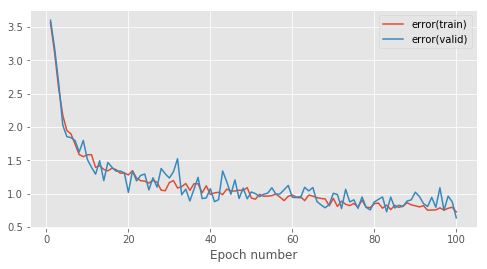

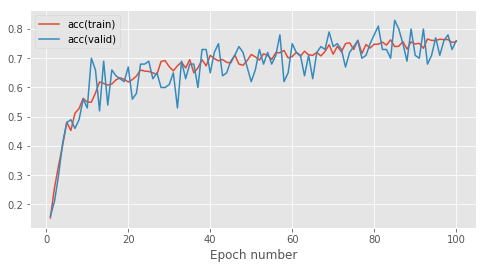

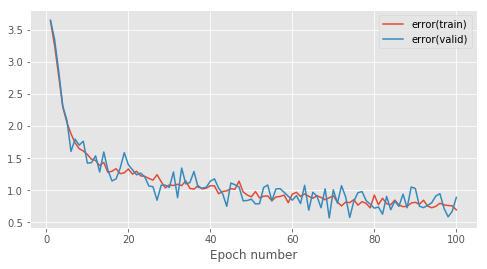

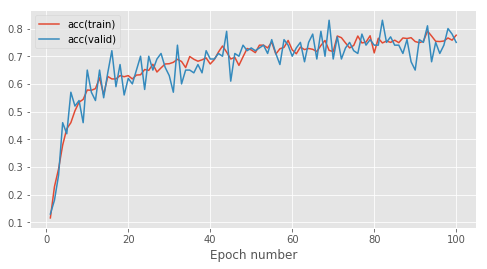

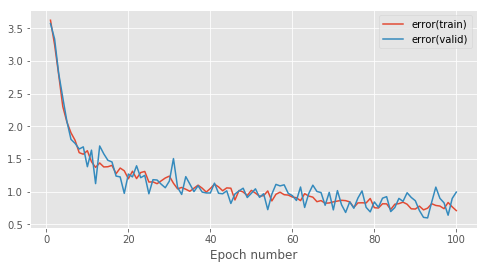

...

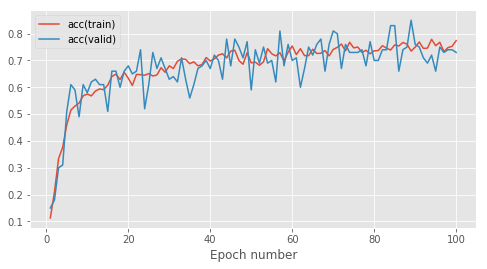

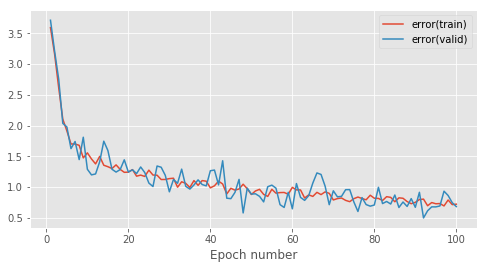

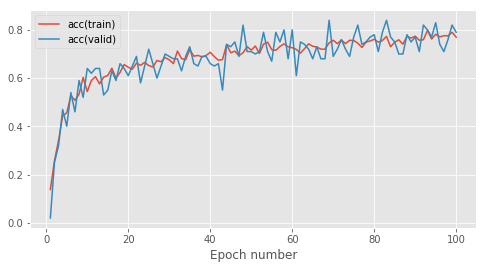

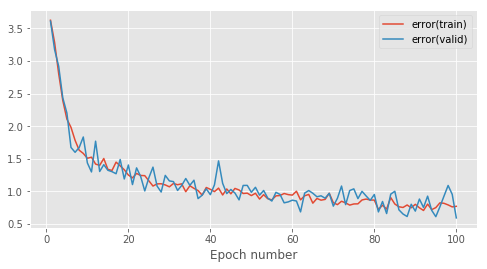

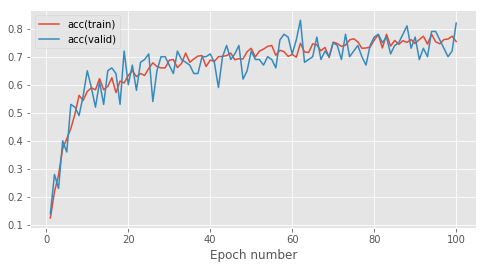

In [254]:
numSamples = 10
num_epochs = 100

rrelu_accs = defaultdict(list)
for rrelu_seed in [10, 20, 30, 40, 50]:
    print("*********** RRELU {} ***********".format(rrelu_seed))
    layer_rng = np.random.RandomState(rrelu_seed)
    mean, sd = gatherRRELUSamples(numSamples, layer_rng, num_epochs, train_data, valid_data, lower=0.125, upper=0.3333333333333333)
    rrelu_accs[rrelu_seed] = [mean, sd]

In [255]:
for (rrelu_seed, stats) in rrelu_accs.items():
    print("RRELU Validation set accuracy ({} samples, {} epochs, {} training batches, seed={}): {} ± {}".format(10, num_epochs, 100, rrelu_seed, stats[0], stats[1]))

RRELU Validation set accuracy (10 samples, 100 epochs, 100 training batches, seed=10): 0.772 ± 0.03280243893371344
RRELU Validation set accuracy (10 samples, 100 epochs, 100 training batches, seed=20): 0.7219999999999999 ± 0.06337191807101944
RRELU Validation set accuracy (10 samples, 100 epochs, 100 training batches, seed=30): 0.7590000000000001 ± 0.03986226285598952
RRELU Validation set accuracy (10 samples, 100 epochs, 100 training batches, seed=40): 0.76 ± 0.03405877273185283
RRELU Validation set accuracy (10 samples, 100 epochs, 100 training batches, seed=50): 0.744 ± 0.0429418211071678


#### ELU

In [15]:
from mlp.layers import ExponentialLinearUnitLayer

def createMultiLayerELUModel(numHiddenLayers, alpha_init, input_dim, hidden_dim, output_dim, rng):
    # initialise hyperparameters
    alpha = np.ones((batch_size, hidden_dim)) * alpha_init
    
    hiddenLayerType = ExponentialLinearUnitLayer(alpha)
    
    return createMultiLayerModel(numHiddenLayers, hiddenLayerType, input_dim, hidden_dim, output_dim, rng)
    

In [16]:
def gatherELUSamples(numSamples, alpha, num_epochs, train_data, valid_data, test_data=None, early_stopping=None):
    elu_valid_accs = []
    
    if test_data is not None:
        elu_test_accs = []
    
    for i in range(0, numSamples):
        print("*********** Sample {} ***********".format(i+1))
        # reset rng
        rng.seed(i)

        # create model (3 layers)
        elu_model = createMultiLayerELUModel(numHiddenLayers, alpha, input_dim, hidden_dim, output_dim, rng)

        elu_stats = trainModel(elu_model, train_data, valid_data,
                               learning_rate = 0.01,
                               num_epochs = num_epochs,
                               stats_interval = 1,
                               batch_size = 100,
                               hidden_dim = 128, early_stopping=early_stopping)

        # create empty "best model"
        best_elu_model = createMultiLayerELUModel(numHiddenLayers, alpha, input_dim, hidden_dim, output_dim, rng)

        # report best model validation set accuracy
        elu_valid_acc = createBestModelAndCalculateAccuracy(elu_stats[0].model, best_elu_model, elu_stats[0].model.params, elu_stats[0].best_model_params, valid_data, 'Validation')
        
        if test_data is not None: 
            elu_test_acc = createBestModelAndCalculateAccuracy(elu_stats[0].model, best_elu_model, elu_stats[0].model.params, elu_stats[0].best_model_params, test_data, 'Test') 
            elu_test_accs.append(elu_test_acc)
        
        elu_valid_accs.append(elu_valid_acc)
        
    mean = np.array(elu_valid_accs).mean()
    sd = np.array(elu_valid_accs).std()
    
    if test_data is not None:
        mean_test = np.array(elu_test_accs).mean()
        sd_test = np.array(elu_test_accs).std()
        
        return mean, sd, mean_test, sd_test
    
    return mean, sd


*********** ELU 0.001 ***********
*********** Sample 1 ***********


Epoch 1: 1.0s to complete
    error(train)=1.59e+00, acc(train)=5.46e-01, error(valid)=1.60e+00, acc(valid)=5.45e-01
Epoch 2: 1.0s to complete
    error(train)=1.24e+00, acc(train)=6.42e-01, error(valid)=1.19e+00, acc(valid)=6.41e-01
Epoch 3: 0.9s to complete
    error(train)=1.09e+00, acc(train)=6.79e-01, error(valid)=1.14e+00, acc(valid)=6.74e-01
Epoch 4: 1.1s to complete
    error(train)=9.79e-01, acc(train)=7.09e-01, error(valid)=9.46e-01, acc(valid)=7.31e-01
Epoch 5: 0.9s to complete
    error(train)=8.80e-01, acc(train)=7.37e-01, error(valid)=8.72e-01, acc(valid)=7.39e-01
Epoch 6: 0.9s to complete
    error(train)=8.67e-01, acc(train)=7.31e-01, error(valid)=9.68e-01, acc(valid)=7.28e-01
Epoch 7: 0.8s to complete
    error(train)=8.10e-01, acc(train)=7.49e-01, error(valid)=8.48e-01, acc(valid)=7.41e-01
Epoch 8: 0.7s to complete
    error(train)=7.76e-01, acc(train)=7.68e-01, error(valid)=7.34e-01, acc(valid)=7.76e-01
Epoch 9: 0.8s to complete
    error(train)=7.64e-01, acc(train)=

Epoch 71: 0.8s to complete
    error(train)=3.55e-01, acc(train)=8.71e-01, error(valid)=5.31e-01, acc(valid)=8.43e-01
Epoch 72: 0.8s to complete
    error(train)=3.76e-01, acc(train)=8.65e-01, error(valid)=4.89e-01, acc(valid)=8.43e-01
Epoch 73: 0.8s to complete
    error(train)=3.59e-01, acc(train)=8.74e-01, error(valid)=4.97e-01, acc(valid)=8.17e-01
Epoch 74: 0.7s to complete
    error(train)=3.65e-01, acc(train)=8.70e-01, error(valid)=4.65e-01, acc(valid)=8.30e-01
Epoch 75: 0.8s to complete
    error(train)=3.65e-01, acc(train)=8.72e-01, error(valid)=5.02e-01, acc(valid)=8.34e-01
Epoch 76: 0.9s to complete
    error(train)=3.57e-01, acc(train)=8.71e-01, error(valid)=5.37e-01, acc(valid)=8.27e-01
Epoch 77: 0.8s to complete
    error(train)=3.68e-01, acc(train)=8.69e-01, error(valid)=4.83e-01, acc(valid)=8.38e-01
Epoch 78: 0.9s to complete
    error(train)=3.57e-01, acc(train)=8.74e-01, error(valid)=4.79e-01, acc(valid)=8.33e-01
Epoch 79: 0.9s to complete
    error(train)=3.53e-01, ac


Validation set accuracy on best model: 0.833
*********** Sample 2 ***********


Epoch 1: 0.7s to complete
    error(train)=1.55e+00, acc(train)=5.71e-01, error(valid)=1.57e+00, acc(valid)=5.48e-01
Epoch 2: 0.7s to complete
    error(train)=1.26e+00, acc(train)=6.39e-01, error(valid)=1.33e+00, acc(valid)=6.25e-01
Epoch 3: 0.7s to complete
    error(train)=1.13e+00, acc(train)=6.69e-01, error(valid)=1.14e+00, acc(valid)=6.67e-01
Epoch 4: 0.8s to complete
    error(train)=9.79e-01, acc(train)=7.07e-01, error(valid)=1.01e+00, acc(valid)=7.02e-01
Epoch 5: 0.7s to complete
    error(train)=9.20e-01, acc(train)=7.20e-01, error(valid)=9.30e-01, acc(valid)=7.22e-01
Epoch 6: 0.7s to complete
    error(train)=8.52e-01, acc(train)=7.39e-01, error(valid)=8.78e-01, acc(valid)=7.29e-01
Epoch 7: 0.7s to complete
    error(train)=7.80e-01, acc(train)=7.57e-01, error(valid)=8.24e-01, acc(valid)=7.37e-01
Epoch 8: 0.7s to complete
    error(train)=7.55e-01, acc(train)=7.65e-01, error(valid)=7.74e-01, acc(valid)=7.75e-01
Epoch 9: 0.7s to complete
    error(train)=7.47e-01, acc(train)=

Epoch 71: 1.0s to complete
    error(train)=3.55e-01, acc(train)=8.72e-01, error(valid)=4.85e-01, acc(valid)=8.45e-01
Epoch 72: 0.8s to complete
    error(train)=3.74e-01, acc(train)=8.67e-01, error(valid)=5.19e-01, acc(valid)=8.33e-01
Epoch 73: 0.8s to complete
    error(train)=3.58e-01, acc(train)=8.72e-01, error(valid)=4.57e-01, acc(valid)=8.44e-01
Epoch 74: 0.8s to complete
    error(train)=3.64e-01, acc(train)=8.65e-01, error(valid)=5.50e-01, acc(valid)=8.36e-01
Epoch 75: 0.8s to complete
    error(train)=3.53e-01, acc(train)=8.72e-01, error(valid)=4.80e-01, acc(valid)=8.44e-01
Epoch 76: 0.9s to complete
    error(train)=3.52e-01, acc(train)=8.71e-01, error(valid)=4.93e-01, acc(valid)=8.39e-01
Epoch 77: 0.8s to complete
    error(train)=3.69e-01, acc(train)=8.65e-01, error(valid)=5.73e-01, acc(valid)=8.27e-01
Epoch 78: 0.8s to complete
    error(train)=3.82e-01, acc(train)=8.58e-01, error(valid)=5.24e-01, acc(valid)=8.25e-01
Epoch 79: 0.7s to complete
    error(train)=3.47e-01, ac


Validation set accuracy on best model: 0.8399999999999999
*********** Sample 3 ***********


Epoch 1: 0.9s to complete
    error(train)=1.65e+00, acc(train)=5.33e-01, error(valid)=1.58e+00, acc(valid)=5.64e-01
Epoch 2: 0.9s to complete
    error(train)=1.27e+00, acc(train)=6.33e-01, error(valid)=1.28e+00, acc(valid)=6.33e-01
Epoch 3: 0.9s to complete
    error(train)=1.13e+00, acc(train)=6.75e-01, error(valid)=1.16e+00, acc(valid)=6.46e-01
Epoch 4: 1.0s to complete
    error(train)=9.88e-01, acc(train)=7.10e-01, error(valid)=1.05e+00, acc(valid)=6.89e-01
Epoch 5: 1.1s to complete
    error(train)=9.33e-01, acc(train)=7.22e-01, error(valid)=9.56e-01, acc(valid)=7.16e-01
Epoch 6: 1.0s to complete
    error(train)=8.37e-01, acc(train)=7.37e-01, error(valid)=8.89e-01, acc(valid)=7.49e-01
Epoch 7: 0.8s to complete
    error(train)=8.04e-01, acc(train)=7.56e-01, error(valid)=8.49e-01, acc(valid)=7.62e-01
Epoch 8: 1.0s to complete
    error(train)=7.87e-01, acc(train)=7.60e-01, error(valid)=8.56e-01, acc(valid)=7.56e-01
Epoch 9: 0.9s to complete
    error(train)=7.50e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.80e-01, acc(train)=8.61e-01, error(valid)=5.24e-01, acc(valid)=8.33e-01
Epoch 72: 0.7s to complete
    error(train)=3.62e-01, acc(train)=8.70e-01, error(valid)=5.16e-01, acc(valid)=8.30e-01
Epoch 73: 0.7s to complete
    error(train)=3.63e-01, acc(train)=8.64e-01, error(valid)=4.78e-01, acc(valid)=8.33e-01
Epoch 74: 0.7s to complete
    error(train)=3.87e-01, acc(train)=8.60e-01, error(valid)=4.34e-01, acc(valid)=8.55e-01
Epoch 75: 0.7s to complete
    error(train)=3.67e-01, acc(train)=8.65e-01, error(valid)=4.77e-01, acc(valid)=8.51e-01
Epoch 76: 0.7s to complete
    error(train)=3.60e-01, acc(train)=8.70e-01, error(valid)=4.65e-01, acc(valid)=8.37e-01
Epoch 77: 0.7s to complete
    error(train)=3.61e-01, acc(train)=8.72e-01, error(valid)=5.14e-01, acc(valid)=8.42e-01
Epoch 78: 0.7s to complete
    error(train)=3.36e-01, acc(train)=8.76e-01, error(valid)=5.00e-01, acc(valid)=8.45e-01
Epoch 79: 0.7s to complete
    error(train)=3.71e-01, ac


Validation set accuracy on best model: 0.8220000000000001
*********** Sample 4 ***********


Epoch 1: 0.9s to complete
    error(train)=1.55e+00, acc(train)=5.55e-01, error(valid)=1.55e+00, acc(valid)=5.63e-01
Epoch 2: 1.2s to complete
    error(train)=1.22e+00, acc(train)=6.43e-01, error(valid)=1.27e+00, acc(valid)=6.43e-01
Epoch 3: 0.8s to complete
    error(train)=1.04e+00, acc(train)=6.92e-01, error(valid)=1.07e+00, acc(valid)=6.77e-01
Epoch 4: 0.9s to complete
    error(train)=9.49e-01, acc(train)=7.15e-01, error(valid)=9.81e-01, acc(valid)=7.09e-01
Epoch 5: 0.9s to complete
    error(train)=8.98e-01, acc(train)=7.25e-01, error(valid)=9.22e-01, acc(valid)=7.35e-01
Epoch 6: 0.8s to complete
    error(train)=8.27e-01, acc(train)=7.49e-01, error(valid)=7.95e-01, acc(valid)=7.53e-01
Epoch 7: 0.9s to complete
    error(train)=7.88e-01, acc(train)=7.52e-01, error(valid)=7.82e-01, acc(valid)=7.39e-01
Epoch 8: 0.8s to complete
    error(train)=7.82e-01, acc(train)=7.57e-01, error(valid)=7.72e-01, acc(valid)=7.58e-01
Epoch 9: 0.9s to complete
    error(train)=7.13e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.78e-01, acc(train)=8.67e-01, error(valid)=5.43e-01, acc(valid)=8.32e-01
Epoch 72: 0.8s to complete
    error(train)=3.57e-01, acc(train)=8.71e-01, error(valid)=4.64e-01, acc(valid)=8.44e-01
Epoch 73: 0.8s to complete
    error(train)=3.76e-01, acc(train)=8.73e-01, error(valid)=5.63e-01, acc(valid)=8.22e-01
Epoch 74: 0.8s to complete
    error(train)=3.65e-01, acc(train)=8.73e-01, error(valid)=5.45e-01, acc(valid)=8.30e-01
Epoch 75: 0.7s to complete
    error(train)=3.55e-01, acc(train)=8.71e-01, error(valid)=4.73e-01, acc(valid)=8.38e-01
Epoch 76: 0.7s to complete
    error(train)=3.57e-01, acc(train)=8.73e-01, error(valid)=5.38e-01, acc(valid)=8.22e-01
Epoch 77: 0.7s to complete
    error(train)=3.62e-01, acc(train)=8.70e-01, error(valid)=4.90e-01, acc(valid)=8.29e-01
Epoch 78: 0.7s to complete
    error(train)=3.44e-01, acc(train)=8.78e-01, error(valid)=4.58e-01, acc(valid)=8.44e-01
Epoch 79: 0.7s to complete
    error(train)=3.47e-01, ac


Validation set accuracy on best model: 0.837
*********** Sample 5 ***********


Epoch 1: 0.7s to complete
    error(train)=1.59e+00, acc(train)=5.54e-01, error(valid)=1.55e+00, acc(valid)=5.70e-01
Epoch 2: 0.6s to complete
    error(train)=1.26e+00, acc(train)=6.30e-01, error(valid)=1.25e+00, acc(valid)=6.44e-01
Epoch 3: 0.6s to complete
    error(train)=1.14e+00, acc(train)=6.66e-01, error(valid)=1.08e+00, acc(valid)=6.73e-01
Epoch 4: 0.7s to complete
    error(train)=1.01e+00, acc(train)=6.91e-01, error(valid)=1.06e+00, acc(valid)=6.71e-01
Epoch 5: 0.7s to complete
    error(train)=9.57e-01, acc(train)=7.10e-01, error(valid)=9.31e-01, acc(valid)=7.44e-01
Epoch 6: 0.8s to complete
    error(train)=8.58e-01, acc(train)=7.37e-01, error(valid)=9.59e-01, acc(valid)=7.09e-01
Epoch 7: 0.8s to complete
    error(train)=8.34e-01, acc(train)=7.44e-01, error(valid)=9.33e-01, acc(valid)=7.04e-01
Epoch 8: 0.7s to complete
    error(train)=7.56e-01, acc(train)=7.66e-01, error(valid)=7.61e-01, acc(valid)=7.59e-01
Epoch 9: 0.7s to complete
    error(train)=7.67e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.60e-01, acc(train)=8.67e-01, error(valid)=5.28e-01, acc(valid)=8.27e-01
Epoch 72: 0.8s to complete
    error(train)=3.66e-01, acc(train)=8.68e-01, error(valid)=4.69e-01, acc(valid)=8.25e-01
Epoch 73: 0.8s to complete
    error(train)=3.53e-01, acc(train)=8.72e-01, error(valid)=4.57e-01, acc(valid)=8.34e-01
Epoch 74: 0.8s to complete
    error(train)=3.57e-01, acc(train)=8.72e-01, error(valid)=5.48e-01, acc(valid)=8.36e-01
Epoch 75: 0.8s to complete
    error(train)=3.53e-01, acc(train)=8.74e-01, error(valid)=5.32e-01, acc(valid)=8.41e-01
Epoch 76: 0.7s to complete
    error(train)=3.64e-01, acc(train)=8.67e-01, error(valid)=4.78e-01, acc(valid)=8.39e-01
Epoch 77: 0.7s to complete
    error(train)=3.43e-01, acc(train)=8.76e-01, error(valid)=4.96e-01, acc(valid)=8.45e-01
Epoch 78: 0.7s to complete
    error(train)=3.41e-01, acc(train)=8.76e-01, error(valid)=5.59e-01, acc(valid)=8.14e-01
Epoch 79: 0.7s to complete
    error(train)=3.37e-01, ac


Validation set accuracy on best model: 0.8400000000000001
*********** Sample 6 ***********


Epoch 1: 0.7s to complete
    error(train)=1.68e+00, acc(train)=5.26e-01, error(valid)=1.74e+00, acc(valid)=5.12e-01
Epoch 2: 0.7s to complete
    error(train)=1.27e+00, acc(train)=6.32e-01, error(valid)=1.26e+00, acc(valid)=6.26e-01
Epoch 3: 0.7s to complete
    error(train)=1.12e+00, acc(train)=6.70e-01, error(valid)=1.12e+00, acc(valid)=6.79e-01
Epoch 4: 0.8s to complete
    error(train)=9.77e-01, acc(train)=7.12e-01, error(valid)=1.01e+00, acc(valid)=6.95e-01
Epoch 5: 0.7s to complete
    error(train)=9.10e-01, acc(train)=7.26e-01, error(valid)=8.83e-01, acc(valid)=7.38e-01
Epoch 6: 0.7s to complete
    error(train)=8.00e-01, acc(train)=7.51e-01, error(valid)=8.54e-01, acc(valid)=7.54e-01
Epoch 7: 0.7s to complete
    error(train)=8.00e-01, acc(train)=7.51e-01, error(valid)=7.99e-01, acc(valid)=7.49e-01
Epoch 8: 0.7s to complete
    error(train)=7.48e-01, acc(train)=7.64e-01, error(valid)=7.00e-01, acc(valid)=7.99e-01
Epoch 9: 0.7s to complete
    error(train)=7.16e-01, acc(train)=

Epoch 71: 0.8s to complete
    error(train)=3.66e-01, acc(train)=8.70e-01, error(valid)=5.31e-01, acc(valid)=8.24e-01
Epoch 72: 0.8s to complete
    error(train)=3.61e-01, acc(train)=8.71e-01, error(valid)=4.68e-01, acc(valid)=8.37e-01
Epoch 73: 0.8s to complete
    error(train)=3.81e-01, acc(train)=8.63e-01, error(valid)=5.00e-01, acc(valid)=8.39e-01
Epoch 74: 0.7s to complete
    error(train)=3.55e-01, acc(train)=8.72e-01, error(valid)=5.07e-01, acc(valid)=8.34e-01
Epoch 75: 0.7s to complete
    error(train)=3.46e-01, acc(train)=8.75e-01, error(valid)=4.98e-01, acc(valid)=8.39e-01
Epoch 76: 0.7s to complete
    error(train)=3.66e-01, acc(train)=8.72e-01, error(valid)=4.95e-01, acc(valid)=8.36e-01
Epoch 77: 0.7s to complete
    error(train)=3.45e-01, acc(train)=8.70e-01, error(valid)=4.97e-01, acc(valid)=8.43e-01
Epoch 78: 0.7s to complete
    error(train)=3.47e-01, acc(train)=8.76e-01, error(valid)=5.52e-01, acc(valid)=8.20e-01
Epoch 79: 0.7s to complete
    error(train)=3.54e-01, ac


Validation set accuracy on best model: 0.8549999999999999
*********** Sample 7 ***********


Epoch 1: 0.8s to complete
    error(train)=1.65e+00, acc(train)=5.28e-01, error(valid)=1.73e+00, acc(valid)=5.04e-01
Epoch 2: 0.7s to complete
    error(train)=1.29e+00, acc(train)=6.24e-01, error(valid)=1.26e+00, acc(valid)=6.23e-01
Epoch 3: 0.7s to complete
    error(train)=1.13e+00, acc(train)=6.74e-01, error(valid)=1.13e+00, acc(valid)=6.78e-01
Epoch 4: 0.8s to complete
    error(train)=9.97e-01, acc(train)=7.05e-01, error(valid)=1.09e+00, acc(valid)=6.78e-01
Epoch 5: 0.7s to complete
    error(train)=9.06e-01, acc(train)=7.32e-01, error(valid)=8.72e-01, acc(valid)=7.42e-01
Epoch 6: 0.7s to complete
    error(train)=8.41e-01, acc(train)=7.47e-01, error(valid)=8.60e-01, acc(valid)=7.46e-01
Epoch 7: 0.7s to complete
    error(train)=8.11e-01, acc(train)=7.43e-01, error(valid)=8.55e-01, acc(valid)=7.46e-01
Epoch 8: 0.7s to complete
    error(train)=7.55e-01, acc(train)=7.64e-01, error(valid)=8.41e-01, acc(valid)=7.51e-01
Epoch 9: 0.7s to complete
    error(train)=7.49e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.51e-01, acc(train)=8.76e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01
Epoch 72: 0.7s to complete
    error(train)=3.65e-01, acc(train)=8.70e-01, error(valid)=4.75e-01, acc(valid)=8.31e-01
Epoch 73: 0.7s to complete
    error(train)=3.48e-01, acc(train)=8.79e-01, error(valid)=5.08e-01, acc(valid)=8.37e-01
Epoch 74: 0.7s to complete
    error(train)=3.43e-01, acc(train)=8.78e-01, error(valid)=5.27e-01, acc(valid)=8.31e-01
Epoch 75: 0.7s to complete
    error(train)=3.46e-01, acc(train)=8.76e-01, error(valid)=5.03e-01, acc(valid)=8.33e-01
Epoch 76: 0.7s to complete
    error(train)=3.56e-01, acc(train)=8.73e-01, error(valid)=5.08e-01, acc(valid)=8.21e-01
Epoch 77: 0.7s to complete
    error(train)=3.69e-01, acc(train)=8.65e-01, error(valid)=5.00e-01, acc(valid)=8.27e-01
Epoch 78: 0.8s to complete
    error(train)=3.25e-01, acc(train)=8.82e-01, error(valid)=4.47e-01, acc(valid)=8.41e-01
Epoch 79: 0.8s to complete
    error(train)=3.59e-01, ac


Validation set accuracy on best model: 0.8099999999999999
*********** Sample 8 ***********


Epoch 1: 0.7s to complete
    error(train)=1.57e+00, acc(train)=5.55e-01, error(valid)=1.60e+00, acc(valid)=5.50e-01
Epoch 2: 0.6s to complete
    error(train)=1.24e+00, acc(train)=6.43e-01, error(valid)=1.22e+00, acc(valid)=6.57e-01
Epoch 3: 0.6s to complete
    error(train)=1.09e+00, acc(train)=6.79e-01, error(valid)=1.14e+00, acc(valid)=6.70e-01
Epoch 4: 0.7s to complete
    error(train)=9.96e-01, acc(train)=7.10e-01, error(valid)=1.07e+00, acc(valid)=6.86e-01
Epoch 5: 0.7s to complete
    error(train)=8.99e-01, acc(train)=7.32e-01, error(valid)=9.74e-01, acc(valid)=6.95e-01
Epoch 6: 0.7s to complete
    error(train)=8.54e-01, acc(train)=7.38e-01, error(valid)=8.89e-01, acc(valid)=7.39e-01
Epoch 7: 0.7s to complete
    error(train)=8.00e-01, acc(train)=7.50e-01, error(valid)=8.74e-01, acc(valid)=7.29e-01
Epoch 8: 0.7s to complete
    error(train)=7.54e-01, acc(train)=7.69e-01, error(valid)=8.86e-01, acc(valid)=7.34e-01
Epoch 9: 0.7s to complete
    error(train)=7.42e-01, acc(train)=

Epoch 71: 0.8s to complete
    error(train)=3.63e-01, acc(train)=8.75e-01, error(valid)=4.57e-01, acc(valid)=8.47e-01
Epoch 72: 0.8s to complete
    error(train)=3.82e-01, acc(train)=8.62e-01, error(valid)=4.56e-01, acc(valid)=8.46e-01
Epoch 73: 0.8s to complete
    error(train)=3.69e-01, acc(train)=8.63e-01, error(valid)=5.22e-01, acc(valid)=8.42e-01
Epoch 74: 0.8s to complete
    error(train)=3.68e-01, acc(train)=8.68e-01, error(valid)=5.34e-01, acc(valid)=8.25e-01
Epoch 75: 0.8s to complete
    error(train)=3.56e-01, acc(train)=8.72e-01, error(valid)=4.86e-01, acc(valid)=8.21e-01
Epoch 76: 0.8s to complete
    error(train)=3.69e-01, acc(train)=8.65e-01, error(valid)=5.20e-01, acc(valid)=8.42e-01
Epoch 77: 0.8s to complete
    error(train)=3.76e-01, acc(train)=8.68e-01, error(valid)=5.38e-01, acc(valid)=8.29e-01
Epoch 78: 0.8s to complete
    error(train)=3.51e-01, acc(train)=8.73e-01, error(valid)=5.49e-01, acc(valid)=8.24e-01
Epoch 79: 0.8s to complete
    error(train)=3.51e-01, ac


Validation set accuracy on best model: 0.858
*********** Sample 9 ***********


Epoch 1: 0.8s to complete
    error(train)=1.56e+00, acc(train)=5.53e-01, error(valid)=1.61e+00, acc(valid)=5.24e-01
Epoch 2: 0.9s to complete
    error(train)=1.28e+00, acc(train)=6.31e-01, error(valid)=1.18e+00, acc(valid)=6.55e-01
Epoch 3: 0.7s to complete
    error(train)=1.08e+00, acc(train)=6.76e-01, error(valid)=1.15e+00, acc(valid)=6.62e-01
Epoch 4: 0.7s to complete
    error(train)=9.45e-01, acc(train)=7.14e-01, error(valid)=9.96e-01, acc(valid)=6.98e-01
Epoch 5: 0.6s to complete
    error(train)=9.03e-01, acc(train)=7.24e-01, error(valid)=8.74e-01, acc(valid)=7.30e-01
Epoch 6: 0.7s to complete
    error(train)=8.41e-01, acc(train)=7.44e-01, error(valid)=8.15e-01, acc(valid)=7.61e-01
Epoch 7: 0.7s to complete
    error(train)=7.81e-01, acc(train)=7.60e-01, error(valid)=8.21e-01, acc(valid)=7.54e-01
Epoch 8: 0.6s to complete
    error(train)=7.51e-01, acc(train)=7.66e-01, error(valid)=7.63e-01, acc(valid)=7.71e-01
Epoch 9: 0.6s to complete
    error(train)=7.65e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.46e-01, acc(train)=8.76e-01, error(valid)=4.97e-01, acc(valid)=8.34e-01
Epoch 72: 0.7s to complete
    error(train)=3.78e-01, acc(train)=8.65e-01, error(valid)=5.78e-01, acc(valid)=8.35e-01
Epoch 73: 0.6s to complete
    error(train)=3.50e-01, acc(train)=8.71e-01, error(valid)=5.69e-01, acc(valid)=8.14e-01
Epoch 74: 0.6s to complete
    error(train)=3.41e-01, acc(train)=8.78e-01, error(valid)=5.41e-01, acc(valid)=8.33e-01
Epoch 75: 0.7s to complete
    error(train)=3.64e-01, acc(train)=8.66e-01, error(valid)=5.23e-01, acc(valid)=8.21e-01
Epoch 76: 0.7s to complete
    error(train)=3.77e-01, acc(train)=8.64e-01, error(valid)=5.09e-01, acc(valid)=8.21e-01
Epoch 77: 0.7s to complete
    error(train)=3.54e-01, acc(train)=8.71e-01, error(valid)=4.92e-01, acc(valid)=8.48e-01
Epoch 78: 0.7s to complete
    error(train)=3.73e-01, acc(train)=8.62e-01, error(valid)=5.30e-01, acc(valid)=8.27e-01
Epoch 79: 0.9s to complete
    error(train)=3.26e-01, ac


Validation set accuracy on best model: 0.8320000000000001
*********** Sample 10 ***********


Epoch 1: 0.7s to complete
    error(train)=1.62e+00, acc(train)=5.43e-01, error(valid)=1.59e+00, acc(valid)=5.40e-01
Epoch 2: 0.7s to complete
    error(train)=1.27e+00, acc(train)=6.34e-01, error(valid)=1.29e+00, acc(valid)=6.28e-01
Epoch 3: 0.7s to complete
    error(train)=1.15e+00, acc(train)=6.70e-01, error(valid)=1.07e+00, acc(valid)=6.94e-01
Epoch 4: 0.7s to complete
    error(train)=9.86e-01, acc(train)=7.04e-01, error(valid)=1.05e+00, acc(valid)=6.79e-01
Epoch 5: 0.7s to complete
    error(train)=9.07e-01, acc(train)=7.34e-01, error(valid)=8.78e-01, acc(valid)=7.38e-01
Epoch 6: 0.7s to complete
    error(train)=8.46e-01, acc(train)=7.46e-01, error(valid)=8.48e-01, acc(valid)=7.41e-01
Epoch 7: 0.7s to complete
    error(train)=7.74e-01, acc(train)=7.61e-01, error(valid)=7.75e-01, acc(valid)=7.49e-01
Epoch 8: 0.7s to complete
    error(train)=7.91e-01, acc(train)=7.47e-01, error(valid)=8.11e-01, acc(valid)=7.47e-01
Epoch 9: 0.7s to complete
    error(train)=7.31e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.67e-01, acc(train)=8.72e-01, error(valid)=5.95e-01, acc(valid)=8.28e-01
Epoch 72: 0.7s to complete
    error(train)=3.72e-01, acc(train)=8.65e-01, error(valid)=5.57e-01, acc(valid)=8.32e-01
Epoch 73: 0.7s to complete
    error(train)=3.67e-01, acc(train)=8.73e-01, error(valid)=4.51e-01, acc(valid)=8.56e-01
Epoch 74: 0.7s to complete
    error(train)=3.83e-01, acc(train)=8.66e-01, error(valid)=5.32e-01, acc(valid)=8.26e-01
Epoch 75: 0.7s to complete
    error(train)=3.65e-01, acc(train)=8.72e-01, error(valid)=4.80e-01, acc(valid)=8.52e-01
Epoch 76: 0.7s to complete
    error(train)=3.71e-01, acc(train)=8.63e-01, error(valid)=4.97e-01, acc(valid)=8.49e-01
Epoch 77: 0.7s to complete
    error(train)=3.71e-01, acc(train)=8.70e-01, error(valid)=5.45e-01, acc(valid)=8.13e-01
Epoch 78: 0.7s to complete
    error(train)=3.63e-01, acc(train)=8.71e-01, error(valid)=5.78e-01, acc(valid)=8.29e-01
Epoch 79: 0.7s to complete
    error(train)=3.56e-01, ac


Validation set accuracy on best model: 0.845
*********** ELU 0.01 ***********
*********** Sample 1 ***********


Epoch 1: 0.7s to complete
    error(train)=1.58e+00, acc(train)=5.48e-01, error(valid)=1.58e+00, acc(valid)=5.40e-01
Epoch 2: 0.7s to complete
    error(train)=1.24e+00, acc(train)=6.39e-01, error(valid)=1.18e+00, acc(valid)=6.42e-01
Epoch 3: 0.7s to complete
    error(train)=1.09e+00, acc(train)=6.79e-01, error(valid)=1.13e+00, acc(valid)=6.75e-01
Epoch 4: 0.7s to complete
    error(train)=9.76e-01, acc(train)=7.11e-01, error(valid)=9.46e-01, acc(valid)=7.40e-01
Epoch 5: 0.7s to complete
    error(train)=8.79e-01, acc(train)=7.36e-01, error(valid)=8.74e-01, acc(valid)=7.39e-01
Epoch 6: 0.7s to complete
    error(train)=8.60e-01, acc(train)=7.35e-01, error(valid)=9.59e-01, acc(valid)=7.28e-01
Epoch 7: 0.7s to complete
    error(train)=8.00e-01, acc(train)=7.57e-01, error(valid)=8.30e-01, acc(valid)=7.46e-01
Epoch 8: 0.7s to complete
    error(train)=7.64e-01, acc(train)=7.68e-01, error(valid)=7.23e-01, acc(valid)=7.79e-01
Epoch 9: 0.7s to complete
    error(train)=7.53e-01, acc(train)=

Epoch 71: 0.8s to complete
    error(train)=3.64e-01, acc(train)=8.72e-01, error(valid)=5.37e-01, acc(valid)=8.35e-01
Epoch 72: 0.7s to complete
    error(train)=3.77e-01, acc(train)=8.66e-01, error(valid)=4.72e-01, acc(valid)=8.40e-01
Epoch 73: 0.7s to complete
    error(train)=3.48e-01, acc(train)=8.75e-01, error(valid)=4.94e-01, acc(valid)=8.30e-01
Epoch 74: 0.7s to complete
    error(train)=3.53e-01, acc(train)=8.77e-01, error(valid)=4.61e-01, acc(valid)=8.46e-01
Epoch 75: 0.7s to complete
    error(train)=3.58e-01, acc(train)=8.75e-01, error(valid)=4.89e-01, acc(valid)=8.40e-01
Epoch 76: 0.7s to complete
    error(train)=3.54e-01, acc(train)=8.70e-01, error(valid)=4.93e-01, acc(valid)=8.32e-01
Epoch 77: 0.7s to complete
    error(train)=3.44e-01, acc(train)=8.72e-01, error(valid)=4.84e-01, acc(valid)=8.38e-01
Epoch 78: 0.7s to complete
    error(train)=3.67e-01, acc(train)=8.71e-01, error(valid)=4.75e-01, acc(valid)=8.37e-01
Epoch 79: 0.7s to complete
    error(train)=3.55e-01, ac


Validation set accuracy on best model: 0.835
*********** Sample 2 ***********


Epoch 1: 0.7s to complete
    error(train)=1.55e+00, acc(train)=5.65e-01, error(valid)=1.58e+00, acc(valid)=5.52e-01
Epoch 2: 0.7s to complete
    error(train)=1.25e+00, acc(train)=6.42e-01, error(valid)=1.32e+00, acc(valid)=6.16e-01
Epoch 3: 0.7s to complete
    error(train)=1.13e+00, acc(train)=6.66e-01, error(valid)=1.14e+00, acc(valid)=6.75e-01
Epoch 4: 0.7s to complete
    error(train)=9.77e-01, acc(train)=7.09e-01, error(valid)=1.01e+00, acc(valid)=7.08e-01
Epoch 5: 0.7s to complete
    error(train)=9.10e-01, acc(train)=7.24e-01, error(valid)=9.13e-01, acc(valid)=7.26e-01
Epoch 6: 0.7s to complete
    error(train)=8.60e-01, acc(train)=7.36e-01, error(valid)=8.88e-01, acc(valid)=7.29e-01
Epoch 7: 0.7s to complete
    error(train)=7.80e-01, acc(train)=7.56e-01, error(valid)=8.35e-01, acc(valid)=7.43e-01
Epoch 8: 0.7s to complete
    error(train)=7.50e-01, acc(train)=7.63e-01, error(valid)=7.61e-01, acc(valid)=7.78e-01
Epoch 9: 0.7s to complete
    error(train)=7.49e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.47e-01, acc(train)=8.72e-01, error(valid)=5.03e-01, acc(valid)=8.36e-01
Epoch 72: 0.7s to complete
    error(train)=3.77e-01, acc(train)=8.61e-01, error(valid)=5.06e-01, acc(valid)=8.36e-01
Epoch 73: 0.7s to complete
    error(train)=3.55e-01, acc(train)=8.78e-01, error(valid)=4.42e-01, acc(valid)=8.40e-01
Epoch 74: 0.7s to complete
    error(train)=3.48e-01, acc(train)=8.72e-01, error(valid)=5.49e-01, acc(valid)=8.38e-01
Epoch 75: 0.7s to complete
    error(train)=3.47e-01, acc(train)=8.78e-01, error(valid)=4.70e-01, acc(valid)=8.53e-01
Epoch 76: 0.7s to complete
    error(train)=3.57e-01, acc(train)=8.69e-01, error(valid)=5.22e-01, acc(valid)=8.54e-01
Epoch 77: 0.8s to complete
    error(train)=3.46e-01, acc(train)=8.75e-01, error(valid)=5.33e-01, acc(valid)=8.26e-01
Epoch 78: 0.7s to complete
    error(train)=3.79e-01, acc(train)=8.63e-01, error(valid)=5.60e-01, acc(valid)=8.22e-01
Epoch 79: 0.7s to complete
    error(train)=3.45e-01, ac


Validation set accuracy on best model: 0.8389999999999999
*********** Sample 3 ***********


Epoch 1: 0.7s to complete
    error(train)=1.63e+00, acc(train)=5.44e-01, error(valid)=1.56e+00, acc(valid)=5.51e-01
Epoch 2: 0.7s to complete
    error(train)=1.25e+00, acc(train)=6.36e-01, error(valid)=1.25e+00, acc(valid)=6.39e-01
Epoch 3: 0.7s to complete
    error(train)=1.13e+00, acc(train)=6.75e-01, error(valid)=1.16e+00, acc(valid)=6.44e-01
Epoch 4: 0.7s to complete
    error(train)=9.79e-01, acc(train)=7.12e-01, error(valid)=1.04e+00, acc(valid)=6.99e-01
Epoch 5: 0.7s to complete
    error(train)=9.31e-01, acc(train)=7.21e-01, error(valid)=9.59e-01, acc(valid)=7.11e-01
Epoch 6: 0.8s to complete
    error(train)=8.28e-01, acc(train)=7.43e-01, error(valid)=8.83e-01, acc(valid)=7.58e-01
Epoch 7: 0.9s to complete
    error(train)=7.99e-01, acc(train)=7.56e-01, error(valid)=8.38e-01, acc(valid)=7.58e-01
Epoch 8: 0.8s to complete
    error(train)=7.71e-01, acc(train)=7.62e-01, error(valid)=8.61e-01, acc(valid)=7.58e-01
Epoch 9: 0.8s to complete
    error(train)=7.46e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.79e-01, acc(train)=8.61e-01, error(valid)=5.22e-01, acc(valid)=8.42e-01
Epoch 72: 0.7s to complete
    error(train)=3.70e-01, acc(train)=8.66e-01, error(valid)=5.04e-01, acc(valid)=8.29e-01
Epoch 73: 0.7s to complete
    error(train)=3.62e-01, acc(train)=8.62e-01, error(valid)=4.74e-01, acc(valid)=8.37e-01
Epoch 74: 0.7s to complete
    error(train)=3.86e-01, acc(train)=8.63e-01, error(valid)=4.45e-01, acc(valid)=8.45e-01
Epoch 75: 0.7s to complete
    error(train)=3.63e-01, acc(train)=8.68e-01, error(valid)=4.76e-01, acc(valid)=8.57e-01
Epoch 76: 0.7s to complete
    error(train)=3.61e-01, acc(train)=8.74e-01, error(valid)=4.44e-01, acc(valid)=8.34e-01
Epoch 77: 0.7s to complete
    error(train)=3.50e-01, acc(train)=8.75e-01, error(valid)=5.24e-01, acc(valid)=8.32e-01
Epoch 78: 0.7s to complete
    error(train)=3.50e-01, acc(train)=8.75e-01, error(valid)=5.41e-01, acc(valid)=8.35e-01
Epoch 79: 0.7s to complete
    error(train)=3.72e-01, ac


Validation set accuracy on best model: 0.836
*********** Sample 4 ***********


Epoch 1: 0.7s to complete
    error(train)=1.55e+00, acc(train)=5.58e-01, error(valid)=1.54e+00, acc(valid)=5.68e-01
Epoch 2: 0.7s to complete
    error(train)=1.22e+00, acc(train)=6.43e-01, error(valid)=1.28e+00, acc(valid)=6.53e-01
Epoch 3: 0.7s to complete
    error(train)=1.04e+00, acc(train)=6.94e-01, error(valid)=1.09e+00, acc(valid)=6.69e-01
Epoch 4: 0.7s to complete
    error(train)=9.52e-01, acc(train)=7.17e-01, error(valid)=9.81e-01, acc(valid)=7.15e-01
Epoch 5: 0.7s to complete
    error(train)=9.00e-01, acc(train)=7.25e-01, error(valid)=9.30e-01, acc(valid)=7.21e-01
Epoch 6: 0.7s to complete
    error(train)=8.33e-01, acc(train)=7.46e-01, error(valid)=7.99e-01, acc(valid)=7.58e-01
Epoch 7: 0.7s to complete
    error(train)=7.89e-01, acc(train)=7.53e-01, error(valid)=7.87e-01, acc(valid)=7.24e-01
Epoch 8: 0.7s to complete
    error(train)=7.85e-01, acc(train)=7.55e-01, error(valid)=7.92e-01, acc(valid)=7.56e-01
Epoch 9: 0.7s to complete
    error(train)=7.12e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.80e-01, acc(train)=8.66e-01, error(valid)=5.43e-01, acc(valid)=8.35e-01
Epoch 72: 0.7s to complete
    error(train)=3.73e-01, acc(train)=8.67e-01, error(valid)=5.03e-01, acc(valid)=8.34e-01
Epoch 73: 0.7s to complete
    error(train)=3.82e-01, acc(train)=8.69e-01, error(valid)=5.39e-01, acc(valid)=8.15e-01
Epoch 74: 0.7s to complete
    error(train)=3.51e-01, acc(train)=8.73e-01, error(valid)=5.24e-01, acc(valid)=8.29e-01
Epoch 75: 0.7s to complete
    error(train)=3.57e-01, acc(train)=8.68e-01, error(valid)=4.75e-01, acc(valid)=8.46e-01
Epoch 76: 0.7s to complete
    error(train)=3.46e-01, acc(train)=8.77e-01, error(valid)=5.32e-01, acc(valid)=8.25e-01
Epoch 77: 0.7s to complete
    error(train)=3.48e-01, acc(train)=8.74e-01, error(valid)=4.64e-01, acc(valid)=8.35e-01
Epoch 78: 0.7s to complete
    error(train)=3.46e-01, acc(train)=8.75e-01, error(valid)=4.35e-01, acc(valid)=8.54e-01
Epoch 79: 0.7s to complete
    error(train)=3.50e-01, ac


Validation set accuracy on best model: 0.8380000000000001
*********** Sample 5 ***********


Epoch 1: 0.7s to complete
    error(train)=1.57e+00, acc(train)=5.58e-01, error(valid)=1.53e+00, acc(valid)=5.83e-01
Epoch 2: 0.7s to complete
    error(train)=1.27e+00, acc(train)=6.29e-01, error(valid)=1.26e+00, acc(valid)=6.42e-01
Epoch 3: 0.7s to complete
    error(train)=1.13e+00, acc(train)=6.72e-01, error(valid)=1.07e+00, acc(valid)=6.86e-01
Epoch 4: 0.7s to complete
    error(train)=1.02e+00, acc(train)=6.93e-01, error(valid)=1.06e+00, acc(valid)=6.84e-01
Epoch 5: 0.7s to complete
    error(train)=9.63e-01, acc(train)=7.10e-01, error(valid)=9.24e-01, acc(valid)=7.46e-01
Epoch 6: 0.7s to complete
    error(train)=8.55e-01, acc(train)=7.40e-01, error(valid)=9.48e-01, acc(valid)=7.15e-01
Epoch 7: 0.7s to complete
    error(train)=8.23e-01, acc(train)=7.48e-01, error(valid)=9.07e-01, acc(valid)=7.18e-01
Epoch 8: 0.8s to complete
    error(train)=7.54e-01, acc(train)=7.68e-01, error(valid)=7.62e-01, acc(valid)=7.50e-01
Epoch 9: 0.8s to complete
    error(train)=7.81e-01, acc(train)=

Epoch 71: 0.8s to complete
    error(train)=3.40e-01, acc(train)=8.76e-01, error(valid)=5.00e-01, acc(valid)=8.35e-01
Epoch 72: 0.7s to complete
    error(train)=3.64e-01, acc(train)=8.67e-01, error(valid)=4.71e-01, acc(valid)=8.31e-01
Epoch 73: 0.7s to complete
    error(train)=3.55e-01, acc(train)=8.75e-01, error(valid)=4.65e-01, acc(valid)=8.24e-01
Epoch 74: 0.7s to complete
    error(train)=3.51e-01, acc(train)=8.75e-01, error(valid)=5.31e-01, acc(valid)=8.32e-01
Epoch 75: 0.7s to complete
    error(train)=3.44e-01, acc(train)=8.79e-01, error(valid)=5.34e-01, acc(valid)=8.36e-01
Epoch 76: 0.7s to complete
    error(train)=3.76e-01, acc(train)=8.60e-01, error(valid)=4.65e-01, acc(valid)=8.40e-01
Epoch 77: 0.7s to complete
    error(train)=3.54e-01, acc(train)=8.71e-01, error(valid)=4.81e-01, acc(valid)=8.37e-01
Epoch 78: 0.7s to complete
    error(train)=3.55e-01, acc(train)=8.73e-01, error(valid)=5.60e-01, acc(valid)=8.18e-01
Epoch 79: 0.7s to complete
    error(train)=3.45e-01, ac


Validation set accuracy on best model: 0.834
*********** Sample 6 ***********


Epoch 1: 0.7s to complete
    error(train)=1.67e+00, acc(train)=5.33e-01, error(valid)=1.74e+00, acc(valid)=5.06e-01
Epoch 2: 0.7s to complete
    error(train)=1.27e+00, acc(train)=6.31e-01, error(valid)=1.27e+00, acc(valid)=6.30e-01
Epoch 3: 0.7s to complete
    error(train)=1.11e+00, acc(train)=6.69e-01, error(valid)=1.11e+00, acc(valid)=6.84e-01
Epoch 4: 0.7s to complete
    error(train)=9.80e-01, acc(train)=7.07e-01, error(valid)=1.01e+00, acc(valid)=6.95e-01
Epoch 5: 0.7s to complete
    error(train)=8.96e-01, acc(train)=7.31e-01, error(valid)=8.71e-01, acc(valid)=7.35e-01
Epoch 6: 0.7s to complete
    error(train)=8.09e-01, acc(train)=7.45e-01, error(valid)=8.56e-01, acc(valid)=7.43e-01
Epoch 7: 0.7s to complete
    error(train)=7.97e-01, acc(train)=7.53e-01, error(valid)=7.85e-01, acc(valid)=7.53e-01
Epoch 8: 0.7s to complete
    error(train)=7.39e-01, acc(train)=7.68e-01, error(valid)=6.99e-01, acc(valid)=7.96e-01
Epoch 9: 0.7s to complete
    error(train)=7.13e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.72e-01, acc(train)=8.67e-01, error(valid)=5.10e-01, acc(valid)=8.33e-01
Epoch 72: 0.7s to complete
    error(train)=3.60e-01, acc(train)=8.69e-01, error(valid)=4.61e-01, acc(valid)=8.45e-01
Epoch 73: 0.7s to complete
    error(train)=3.84e-01, acc(train)=8.63e-01, error(valid)=4.77e-01, acc(valid)=8.51e-01
Epoch 74: 0.7s to complete
    error(train)=3.56e-01, acc(train)=8.67e-01, error(valid)=5.17e-01, acc(valid)=8.44e-01
Epoch 75: 0.7s to complete
    error(train)=3.52e-01, acc(train)=8.73e-01, error(valid)=4.85e-01, acc(valid)=8.37e-01
Epoch 76: 0.7s to complete
    error(train)=3.67e-01, acc(train)=8.68e-01, error(valid)=5.30e-01, acc(valid)=8.22e-01
Epoch 77: 0.7s to complete
    error(train)=3.48e-01, acc(train)=8.72e-01, error(valid)=4.81e-01, acc(valid)=8.52e-01
Epoch 78: 0.7s to complete
    error(train)=3.45e-01, acc(train)=8.77e-01, error(valid)=5.26e-01, acc(valid)=8.28e-01
Epoch 79: 0.7s to complete
    error(train)=3.44e-01, ac


Validation set accuracy on best model: 0.8479999999999999
*********** Sample 7 ***********


Epoch 1: 0.8s to complete
    error(train)=1.64e+00, acc(train)=5.35e-01, error(valid)=1.71e+00, acc(valid)=5.06e-01
Epoch 2: 0.7s to complete
    error(train)=1.28e+00, acc(train)=6.29e-01, error(valid)=1.26e+00, acc(valid)=6.41e-01
Epoch 3: 0.7s to complete
    error(train)=1.12e+00, acc(train)=6.75e-01, error(valid)=1.13e+00, acc(valid)=6.77e-01
Epoch 4: 0.7s to complete
    error(train)=9.80e-01, acc(train)=7.13e-01, error(valid)=1.07e+00, acc(valid)=6.80e-01
Epoch 5: 0.8s to complete
    error(train)=8.96e-01, acc(train)=7.32e-01, error(valid)=8.59e-01, acc(valid)=7.48e-01
Epoch 6: 0.7s to complete
    error(train)=8.39e-01, acc(train)=7.46e-01, error(valid)=8.67e-01, acc(valid)=7.36e-01
Epoch 7: 0.8s to complete
    error(train)=8.18e-01, acc(train)=7.42e-01, error(valid)=8.64e-01, acc(valid)=7.33e-01
Epoch 8: 0.7s to complete
    error(train)=7.50e-01, acc(train)=7.65e-01, error(valid)=8.34e-01, acc(valid)=7.46e-01
Epoch 9: 0.7s to complete
    error(train)=7.60e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.58e-01, acc(train)=8.74e-01, error(valid)=4.90e-01, acc(valid)=8.39e-01
Epoch 72: 0.7s to complete
    error(train)=3.56e-01, acc(train)=8.73e-01, error(valid)=4.67e-01, acc(valid)=8.33e-01
Epoch 73: 0.7s to complete
    error(train)=3.46e-01, acc(train)=8.78e-01, error(valid)=5.08e-01, acc(valid)=8.51e-01
Epoch 74: 0.7s to complete
    error(train)=3.50e-01, acc(train)=8.72e-01, error(valid)=5.19e-01, acc(valid)=8.30e-01
Epoch 75: 0.7s to complete
    error(train)=3.53e-01, acc(train)=8.70e-01, error(valid)=5.08e-01, acc(valid)=8.19e-01
Epoch 76: 0.7s to complete
    error(train)=3.51e-01, acc(train)=8.73e-01, error(valid)=4.89e-01, acc(valid)=8.34e-01
Epoch 77: 0.7s to complete
    error(train)=3.67e-01, acc(train)=8.64e-01, error(valid)=4.98e-01, acc(valid)=8.14e-01
Epoch 78: 0.7s to complete
    error(train)=3.26e-01, acc(train)=8.83e-01, error(valid)=4.62e-01, acc(valid)=8.36e-01
Epoch 79: 0.7s to complete
    error(train)=3.70e-01, ac


Validation set accuracy on best model: 0.826
*********** Sample 8 ***********


Epoch 1: 0.7s to complete
    error(train)=1.56e+00, acc(train)=5.53e-01, error(valid)=1.60e+00, acc(valid)=5.41e-01
Epoch 2: 0.7s to complete
    error(train)=1.25e+00, acc(train)=6.40e-01, error(valid)=1.23e+00, acc(valid)=6.50e-01
Epoch 3: 0.7s to complete
    error(train)=1.09e+00, acc(train)=6.82e-01, error(valid)=1.13e+00, acc(valid)=6.72e-01
Epoch 4: 0.7s to complete
    error(train)=9.91e-01, acc(train)=7.14e-01, error(valid)=1.07e+00, acc(valid)=6.86e-01
Epoch 5: 0.7s to complete
    error(train)=8.85e-01, acc(train)=7.34e-01, error(valid)=9.61e-01, acc(valid)=6.99e-01
Epoch 6: 0.7s to complete
    error(train)=8.48e-01, acc(train)=7.40e-01, error(valid)=8.80e-01, acc(valid)=7.18e-01
Epoch 7: 0.7s to complete
    error(train)=7.90e-01, acc(train)=7.52e-01, error(valid)=8.70e-01, acc(valid)=7.42e-01
Epoch 8: 0.7s to complete
    error(train)=7.45e-01, acc(train)=7.70e-01, error(valid)=8.65e-01, acc(valid)=7.38e-01
Epoch 9: 0.7s to complete
    error(train)=7.37e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.68e-01, acc(train)=8.71e-01, error(valid)=5.37e-01, acc(valid)=8.38e-01
Epoch 72: 0.7s to complete
    error(train)=3.61e-01, acc(train)=8.69e-01, error(valid)=4.65e-01, acc(valid)=8.48e-01
Epoch 73: 0.7s to complete
    error(train)=3.52e-01, acc(train)=8.73e-01, error(valid)=4.87e-01, acc(valid)=8.47e-01
Epoch 74: 0.7s to complete
    error(train)=3.75e-01, acc(train)=8.68e-01, error(valid)=5.51e-01, acc(valid)=8.20e-01
Epoch 75: 0.7s to complete
    error(train)=3.66e-01, acc(train)=8.73e-01, error(valid)=5.04e-01, acc(valid)=8.34e-01
Epoch 76: 0.7s to complete
    error(train)=3.66e-01, acc(train)=8.65e-01, error(valid)=4.81e-01, acc(valid)=8.44e-01
Epoch 77: 0.7s to complete
    error(train)=3.77e-01, acc(train)=8.68e-01, error(valid)=5.29e-01, acc(valid)=8.36e-01
Epoch 78: 0.7s to complete
    error(train)=3.48e-01, acc(train)=8.78e-01, error(valid)=5.27e-01, acc(valid)=8.50e-01
Epoch 79: 0.7s to complete
    error(train)=3.40e-01, ac


Validation set accuracy on best model: 0.841
*********** Sample 9 ***********


Epoch 1: 0.7s to complete
    error(train)=1.56e+00, acc(train)=5.49e-01, error(valid)=1.61e+00, acc(valid)=5.17e-01
Epoch 2: 0.7s to complete
    error(train)=1.29e+00, acc(train)=6.25e-01, error(valid)=1.19e+00, acc(valid)=6.38e-01
Epoch 3: 0.6s to complete
    error(train)=1.09e+00, acc(train)=6.76e-01, error(valid)=1.16e+00, acc(valid)=6.70e-01
Epoch 4: 0.7s to complete
    error(train)=9.51e-01, acc(train)=7.11e-01, error(valid)=1.01e+00, acc(valid)=6.95e-01
Epoch 5: 0.7s to complete
    error(train)=9.06e-01, acc(train)=7.26e-01, error(valid)=8.84e-01, acc(valid)=7.30e-01
Epoch 6: 0.7s to complete
    error(train)=8.49e-01, acc(train)=7.37e-01, error(valid)=8.22e-01, acc(valid)=7.58e-01
Epoch 7: 0.7s to complete
    error(train)=7.83e-01, acc(train)=7.60e-01, error(valid)=8.30e-01, acc(valid)=7.46e-01
Epoch 8: 0.7s to complete
    error(train)=7.49e-01, acc(train)=7.68e-01, error(valid)=7.61e-01, acc(valid)=7.68e-01
Epoch 9: 0.7s to complete
    error(train)=7.71e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.51e-01, acc(train)=8.73e-01, error(valid)=5.18e-01, acc(valid)=8.36e-01
Epoch 72: 0.7s to complete
    error(train)=3.61e-01, acc(train)=8.67e-01, error(valid)=5.43e-01, acc(valid)=8.35e-01
Epoch 73: 0.7s to complete
    error(train)=3.46e-01, acc(train)=8.74e-01, error(valid)=5.59e-01, acc(valid)=8.17e-01
Epoch 74: 0.7s to complete
    error(train)=3.37e-01, acc(train)=8.79e-01, error(valid)=5.05e-01, acc(valid)=8.43e-01
Epoch 75: 0.7s to complete
    error(train)=3.61e-01, acc(train)=8.70e-01, error(valid)=5.53e-01, acc(valid)=8.06e-01
Epoch 76: 0.7s to complete
    error(train)=3.82e-01, acc(train)=8.62e-01, error(valid)=5.02e-01, acc(valid)=8.27e-01
Epoch 77: 0.7s to complete
    error(train)=3.62e-01, acc(train)=8.70e-01, error(valid)=4.88e-01, acc(valid)=8.36e-01
Epoch 78: 0.7s to complete
    error(train)=3.68e-01, acc(train)=8.69e-01, error(valid)=5.42e-01, acc(valid)=8.09e-01
Epoch 79: 0.7s to complete
    error(train)=3.38e-01, ac


Validation set accuracy on best model: 0.8550000000000001
*********** Sample 10 ***********


Epoch 1: 0.7s to complete
    error(train)=1.62e+00, acc(train)=5.41e-01, error(valid)=1.59e+00, acc(valid)=5.40e-01
Epoch 2: 0.7s to complete
    error(train)=1.27e+00, acc(train)=6.34e-01, error(valid)=1.28e+00, acc(valid)=6.20e-01
Epoch 3: 0.7s to complete
    error(train)=1.14e+00, acc(train)=6.70e-01, error(valid)=1.06e+00, acc(valid)=7.03e-01
Epoch 4: 0.7s to complete
    error(train)=9.75e-01, acc(train)=7.06e-01, error(valid)=1.05e+00, acc(valid)=6.84e-01
Epoch 5: 0.7s to complete
    error(train)=9.05e-01, acc(train)=7.32e-01, error(valid)=8.77e-01, acc(valid)=7.25e-01
Epoch 6: 0.7s to complete
    error(train)=8.32e-01, acc(train)=7.45e-01, error(valid)=8.43e-01, acc(valid)=7.31e-01
Epoch 7: 0.7s to complete
    error(train)=7.76e-01, acc(train)=7.59e-01, error(valid)=7.74e-01, acc(valid)=7.44e-01
Epoch 8: 0.7s to complete
    error(train)=7.78e-01, acc(train)=7.52e-01, error(valid)=7.95e-01, acc(valid)=7.46e-01
Epoch 9: 0.7s to complete
    error(train)=7.24e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.71e-01, acc(train)=8.69e-01, error(valid)=6.10e-01, acc(valid)=8.02e-01
Epoch 72: 0.7s to complete
    error(train)=3.68e-01, acc(train)=8.67e-01, error(valid)=5.59e-01, acc(valid)=8.19e-01
Epoch 73: 0.7s to complete
    error(train)=3.47e-01, acc(train)=8.81e-01, error(valid)=4.35e-01, acc(valid)=8.63e-01
Epoch 74: 0.7s to complete
    error(train)=3.70e-01, acc(train)=8.72e-01, error(valid)=4.83e-01, acc(valid)=8.42e-01
Epoch 75: 0.7s to complete
    error(train)=3.65e-01, acc(train)=8.71e-01, error(valid)=4.79e-01, acc(valid)=8.45e-01
Epoch 76: 0.7s to complete
    error(train)=3.61e-01, acc(train)=8.64e-01, error(valid)=5.29e-01, acc(valid)=8.41e-01
Epoch 77: 0.7s to complete
    error(train)=3.81e-01, acc(train)=8.64e-01, error(valid)=5.51e-01, acc(valid)=8.16e-01
Epoch 78: 0.7s to complete
    error(train)=3.47e-01, acc(train)=8.77e-01, error(valid)=5.42e-01, acc(valid)=8.30e-01
Epoch 79: 0.7s to complete
    error(train)=3.47e-01, ac


Validation set accuracy on best model: 0.857
*********** ELU 0.1 ***********
*********** Sample 1 ***********


Epoch 1: 0.7s to complete
    error(train)=1.53e+00, acc(train)=5.64e-01, error(valid)=1.54e+00, acc(valid)=5.66e-01
Epoch 2: 0.7s to complete
    error(train)=1.22e+00, acc(train)=6.50e-01, error(valid)=1.16e+00, acc(valid)=6.55e-01
Epoch 3: 0.7s to complete
    error(train)=1.09e+00, acc(train)=6.82e-01, error(valid)=1.14e+00, acc(valid)=6.74e-01
Epoch 4: 0.7s to complete
    error(train)=9.60e-01, acc(train)=7.12e-01, error(valid)=9.37e-01, acc(valid)=7.36e-01
Epoch 5: 0.7s to complete
    error(train)=8.68e-01, acc(train)=7.41e-01, error(valid)=8.61e-01, acc(valid)=7.44e-01
Epoch 6: 0.7s to complete
    error(train)=8.51e-01, acc(train)=7.38e-01, error(valid)=9.43e-01, acc(valid)=7.10e-01
Epoch 7: 0.7s to complete
    error(train)=8.00e-01, acc(train)=7.54e-01, error(valid)=8.41e-01, acc(valid)=7.38e-01
Epoch 8: 0.7s to complete
    error(train)=7.54e-01, acc(train)=7.72e-01, error(valid)=7.29e-01, acc(valid)=7.88e-01
Epoch 9: 0.7s to complete
    error(train)=7.40e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.49e-01, acc(train)=8.77e-01, error(valid)=5.17e-01, acc(valid)=8.53e-01
Epoch 72: 0.7s to complete
    error(train)=3.76e-01, acc(train)=8.67e-01, error(valid)=4.48e-01, acc(valid)=8.51e-01
Epoch 73: 0.7s to complete
    error(train)=3.49e-01, acc(train)=8.74e-01, error(valid)=4.74e-01, acc(valid)=8.34e-01
Epoch 74: 0.7s to complete
    error(train)=3.43e-01, acc(train)=8.79e-01, error(valid)=4.77e-01, acc(valid)=8.36e-01
Epoch 75: 0.7s to complete
    error(train)=3.64e-01, acc(train)=8.71e-01, error(valid)=5.43e-01, acc(valid)=8.29e-01
Epoch 76: 0.7s to complete
    error(train)=3.55e-01, acc(train)=8.70e-01, error(valid)=4.83e-01, acc(valid)=8.34e-01
Epoch 77: 0.7s to complete
    error(train)=3.41e-01, acc(train)=8.74e-01, error(valid)=4.39e-01, acc(valid)=8.51e-01
Epoch 78: 0.7s to complete
    error(train)=3.39e-01, acc(train)=8.78e-01, error(valid)=4.50e-01, acc(valid)=8.49e-01
Epoch 79: 0.7s to complete
    error(train)=3.42e-01, ac


Validation set accuracy on best model: 0.85
*********** Sample 2 ***********


Epoch 1: 0.7s to complete
    error(train)=1.53e+00, acc(train)=5.77e-01, error(valid)=1.54e+00, acc(valid)=5.59e-01
Epoch 2: 0.7s to complete
    error(train)=1.27e+00, acc(train)=6.38e-01, error(valid)=1.34e+00, acc(valid)=6.18e-01
Epoch 3: 0.7s to complete
    error(train)=1.12e+00, acc(train)=6.71e-01, error(valid)=1.14e+00, acc(valid)=6.69e-01
Epoch 4: 0.7s to complete
    error(train)=9.75e-01, acc(train)=7.08e-01, error(valid)=1.01e+00, acc(valid)=6.99e-01
Epoch 5: 0.7s to complete
    error(train)=9.09e-01, acc(train)=7.26e-01, error(valid)=9.07e-01, acc(valid)=7.29e-01
Epoch 6: 0.7s to complete
    error(train)=8.59e-01, acc(train)=7.36e-01, error(valid)=8.94e-01, acc(valid)=7.27e-01
Epoch 7: 0.7s to complete
    error(train)=7.76e-01, acc(train)=7.58e-01, error(valid)=8.42e-01, acc(valid)=7.41e-01
Epoch 8: 0.7s to complete
    error(train)=7.42e-01, acc(train)=7.67e-01, error(valid)=7.62e-01, acc(valid)=7.73e-01
Epoch 9: 0.7s to complete
    error(train)=7.37e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.60e-01, acc(train)=8.72e-01, error(valid)=5.01e-01, acc(valid)=8.36e-01
Epoch 72: 0.7s to complete
    error(train)=3.60e-01, acc(train)=8.68e-01, error(valid)=5.14e-01, acc(valid)=8.32e-01
Epoch 73: 0.6s to complete
    error(train)=3.50e-01, acc(train)=8.74e-01, error(valid)=4.22e-01, acc(valid)=8.62e-01
Epoch 74: 0.6s to complete
    error(train)=3.43e-01, acc(train)=8.74e-01, error(valid)=5.57e-01, acc(valid)=8.30e-01
Epoch 75: 0.6s to complete
    error(train)=3.55e-01, acc(train)=8.73e-01, error(valid)=5.11e-01, acc(valid)=8.36e-01
Epoch 76: 0.6s to complete
    error(train)=3.41e-01, acc(train)=8.74e-01, error(valid)=4.97e-01, acc(valid)=8.53e-01
Epoch 77: 0.6s to complete
    error(train)=3.55e-01, acc(train)=8.71e-01, error(valid)=5.31e-01, acc(valid)=8.30e-01
Epoch 78: 0.7s to complete
    error(train)=3.59e-01, acc(train)=8.66e-01, error(valid)=4.87e-01, acc(valid)=8.35e-01
Epoch 79: 0.6s to complete
    error(train)=3.44e-01, ac


Validation set accuracy on best model: 0.845
*********** Sample 3 ***********


Epoch 1: 0.7s to complete
    error(train)=1.59e+00, acc(train)=5.47e-01, error(valid)=1.52e+00, acc(valid)=5.73e-01
Epoch 2: 0.7s to complete
    error(train)=1.24e+00, acc(train)=6.39e-01, error(valid)=1.26e+00, acc(valid)=6.37e-01
Epoch 3: 0.7s to complete
    error(train)=1.10e+00, acc(train)=6.81e-01, error(valid)=1.13e+00, acc(valid)=6.55e-01
Epoch 4: 0.7s to complete
    error(train)=9.47e-01, acc(train)=7.21e-01, error(valid)=1.00e+00, acc(valid)=7.09e-01
Epoch 5: 0.7s to complete
    error(train)=8.94e-01, acc(train)=7.35e-01, error(valid)=9.29e-01, acc(valid)=7.15e-01
Epoch 6: 0.7s to complete
    error(train)=8.17e-01, acc(train)=7.43e-01, error(valid)=8.72e-01, acc(valid)=7.44e-01
Epoch 7: 0.8s to complete
    error(train)=7.79e-01, acc(train)=7.60e-01, error(valid)=8.33e-01, acc(valid)=7.52e-01
Epoch 8: 0.7s to complete
    error(train)=7.61e-01, acc(train)=7.66e-01, error(valid)=8.46e-01, acc(valid)=7.53e-01
Epoch 9: 0.7s to complete
    error(train)=7.29e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.78e-01, acc(train)=8.63e-01, error(valid)=5.43e-01, acc(valid)=8.25e-01
Epoch 72: 0.7s to complete
    error(train)=3.58e-01, acc(train)=8.72e-01, error(valid)=5.10e-01, acc(valid)=8.13e-01
Epoch 73: 0.7s to complete
    error(train)=3.52e-01, acc(train)=8.67e-01, error(valid)=4.58e-01, acc(valid)=8.39e-01
Epoch 74: 0.7s to complete
    error(train)=3.66e-01, acc(train)=8.71e-01, error(valid)=4.33e-01, acc(valid)=8.55e-01
Epoch 75: 0.7s to complete
    error(train)=3.42e-01, acc(train)=8.75e-01, error(valid)=4.91e-01, acc(valid)=8.43e-01
Epoch 76: 0.7s to complete
    error(train)=3.40e-01, acc(train)=8.77e-01, error(valid)=4.41e-01, acc(valid)=8.47e-01
Epoch 77: 0.7s to complete
    error(train)=3.54e-01, acc(train)=8.68e-01, error(valid)=5.12e-01, acc(valid)=8.38e-01
Epoch 78: 0.7s to complete
    error(train)=3.39e-01, acc(train)=8.77e-01, error(valid)=5.32e-01, acc(valid)=8.31e-01
Epoch 79: 0.7s to complete
    error(train)=3.65e-01, ac


Validation set accuracy on best model: 0.836
*********** Sample 4 ***********


Epoch 1: 0.7s to complete
    error(train)=1.50e+00, acc(train)=5.71e-01, error(valid)=1.50e+00, acc(valid)=5.79e-01
Epoch 2: 0.7s to complete
    error(train)=1.21e+00, acc(train)=6.49e-01, error(valid)=1.25e+00, acc(valid)=6.61e-01
Epoch 3: 0.7s to complete
    error(train)=1.02e+00, acc(train)=7.01e-01, error(valid)=1.05e+00, acc(valid)=6.66e-01
Epoch 4: 0.7s to complete
    error(train)=9.44e-01, acc(train)=7.16e-01, error(valid)=9.70e-01, acc(valid)=7.13e-01
Epoch 5: 0.7s to complete
    error(train)=8.88e-01, acc(train)=7.29e-01, error(valid)=9.25e-01, acc(valid)=7.30e-01
Epoch 6: 0.7s to complete
    error(train)=8.22e-01, acc(train)=7.47e-01, error(valid)=7.81e-01, acc(valid)=7.60e-01
Epoch 7: 0.7s to complete
    error(train)=7.69e-01, acc(train)=7.57e-01, error(valid)=7.68e-01, acc(valid)=7.45e-01
Epoch 8: 0.7s to complete
    error(train)=7.71e-01, acc(train)=7.59e-01, error(valid)=7.69e-01, acc(valid)=7.62e-01
Epoch 9: 0.7s to complete
    error(train)=7.05e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.66e-01, acc(train)=8.70e-01, error(valid)=5.33e-01, acc(valid)=8.40e-01
Epoch 72: 0.7s to complete
    error(train)=3.57e-01, acc(train)=8.73e-01, error(valid)=4.61e-01, acc(valid)=8.52e-01
Epoch 73: 0.7s to complete
    error(train)=3.61e-01, acc(train)=8.74e-01, error(valid)=5.29e-01, acc(valid)=8.30e-01
Epoch 74: 0.7s to complete
    error(train)=3.40e-01, acc(train)=8.80e-01, error(valid)=5.25e-01, acc(valid)=8.19e-01
Epoch 75: 0.7s to complete
    error(train)=3.42e-01, acc(train)=8.73e-01, error(valid)=4.55e-01, acc(valid)=8.50e-01
Epoch 76: 0.7s to complete
    error(train)=3.38e-01, acc(train)=8.80e-01, error(valid)=5.08e-01, acc(valid)=8.34e-01
Epoch 77: 0.7s to complete
    error(train)=3.47e-01, acc(train)=8.74e-01, error(valid)=4.86e-01, acc(valid)=8.38e-01
Epoch 78: 0.7s to complete
    error(train)=3.42e-01, acc(train)=8.76e-01, error(valid)=4.57e-01, acc(valid)=8.51e-01
Epoch 79: 0.7s to complete
    error(train)=3.33e-01, ac


Validation set accuracy on best model: 0.8370000000000001
*********** Sample 5 ***********


Epoch 1: 0.7s to complete
    error(train)=1.55e+00, acc(train)=5.66e-01, error(valid)=1.51e+00, acc(valid)=5.86e-01
Epoch 2: 0.7s to complete
    error(train)=1.24e+00, acc(train)=6.38e-01, error(valid)=1.23e+00, acc(valid)=6.42e-01
Epoch 3: 0.7s to complete
    error(train)=1.11e+00, acc(train)=6.75e-01, error(valid)=1.07e+00, acc(valid)=6.80e-01
Epoch 4: 0.7s to complete
    error(train)=9.95e-01, acc(train)=6.96e-01, error(valid)=1.04e+00, acc(valid)=6.79e-01
Epoch 5: 0.7s to complete
    error(train)=9.51e-01, acc(train)=7.12e-01, error(valid)=9.11e-01, acc(valid)=7.52e-01
Epoch 6: 0.7s to complete
    error(train)=8.51e-01, acc(train)=7.44e-01, error(valid)=9.40e-01, acc(valid)=7.08e-01
Epoch 7: 0.7s to complete
    error(train)=8.14e-01, acc(train)=7.53e-01, error(valid)=8.94e-01, acc(valid)=7.11e-01
Epoch 8: 0.7s to complete
    error(train)=7.35e-01, acc(train)=7.74e-01, error(valid)=7.54e-01, acc(valid)=7.52e-01
Epoch 9: 0.7s to complete
    error(train)=7.64e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.54e-01, acc(train)=8.70e-01, error(valid)=5.27e-01, acc(valid)=8.32e-01
Epoch 72: 0.7s to complete
    error(train)=3.66e-01, acc(train)=8.66e-01, error(valid)=4.65e-01, acc(valid)=8.28e-01
Epoch 73: 0.7s to complete
    error(train)=3.42e-01, acc(train)=8.79e-01, error(valid)=4.60e-01, acc(valid)=8.40e-01
Epoch 74: 0.7s to complete
    error(train)=3.45e-01, acc(train)=8.80e-01, error(valid)=5.01e-01, acc(valid)=8.44e-01
Epoch 75: 0.7s to complete
    error(train)=3.49e-01, acc(train)=8.74e-01, error(valid)=5.37e-01, acc(valid)=8.30e-01
Epoch 76: 0.7s to complete
    error(train)=3.53e-01, acc(train)=8.70e-01, error(valid)=4.60e-01, acc(valid)=8.41e-01
Epoch 77: 0.7s to complete
    error(train)=3.52e-01, acc(train)=8.72e-01, error(valid)=4.83e-01, acc(valid)=8.46e-01
Epoch 78: 0.7s to complete
    error(train)=3.54e-01, acc(train)=8.75e-01, error(valid)=5.27e-01, acc(valid)=8.19e-01
Epoch 79: 0.8s to complete
    error(train)=3.35e-01, ac


Validation set accuracy on best model: 0.841
*********** Sample 6 ***********


Epoch 1: 0.7s to complete
    error(train)=1.63e+00, acc(train)=5.40e-01, error(valid)=1.71e+00, acc(valid)=5.18e-01
Epoch 2: 0.7s to complete
    error(train)=1.25e+00, acc(train)=6.35e-01, error(valid)=1.24e+00, acc(valid)=6.41e-01
Epoch 3: 0.7s to complete
    error(train)=1.11e+00, acc(train)=6.72e-01, error(valid)=1.10e+00, acc(valid)=6.88e-01
Epoch 4: 0.7s to complete
    error(train)=9.86e-01, acc(train)=7.04e-01, error(valid)=1.01e+00, acc(valid)=7.02e-01
Epoch 5: 0.7s to complete
    error(train)=9.00e-01, acc(train)=7.30e-01, error(valid)=8.67e-01, acc(valid)=7.38e-01
Epoch 6: 0.7s to complete
    error(train)=8.02e-01, acc(train)=7.53e-01, error(valid)=8.46e-01, acc(valid)=7.54e-01
Epoch 7: 0.7s to complete
    error(train)=7.92e-01, acc(train)=7.57e-01, error(valid)=7.84e-01, acc(valid)=7.53e-01
Epoch 8: 0.7s to complete
    error(train)=7.48e-01, acc(train)=7.65e-01, error(valid)=7.15e-01, acc(valid)=7.98e-01
Epoch 9: 0.7s to complete
    error(train)=7.10e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.73e-01, acc(train)=8.67e-01, error(valid)=5.13e-01, acc(valid)=8.33e-01
Epoch 72: 0.7s to complete
    error(train)=3.67e-01, acc(train)=8.65e-01, error(valid)=4.78e-01, acc(valid)=8.38e-01
Epoch 73: 0.7s to complete
    error(train)=3.73e-01, acc(train)=8.64e-01, error(valid)=4.89e-01, acc(valid)=8.46e-01
Epoch 74: 0.7s to complete
    error(train)=3.51e-01, acc(train)=8.69e-01, error(valid)=4.92e-01, acc(valid)=8.50e-01
Epoch 75: 0.7s to complete
    error(train)=3.60e-01, acc(train)=8.69e-01, error(valid)=4.73e-01, acc(valid)=8.41e-01
Epoch 76: 0.7s to complete
    error(train)=3.66e-01, acc(train)=8.69e-01, error(valid)=4.82e-01, acc(valid)=8.41e-01
Epoch 77: 0.7s to complete
    error(train)=3.52e-01, acc(train)=8.73e-01, error(valid)=4.78e-01, acc(valid)=8.37e-01
Epoch 78: 0.7s to complete
    error(train)=3.42e-01, acc(train)=8.79e-01, error(valid)=5.54e-01, acc(valid)=8.22e-01
Epoch 79: 0.7s to complete
    error(train)=3.49e-01, ac


Validation set accuracy on best model: 0.8569999999999999
*********** Sample 7 ***********


Epoch 1: 0.7s to complete
    error(train)=1.57e+00, acc(train)=5.54e-01, error(valid)=1.67e+00, acc(valid)=5.27e-01
Epoch 2: 0.7s to complete
    error(train)=1.27e+00, acc(train)=6.34e-01, error(valid)=1.23e+00, acc(valid)=6.45e-01
Epoch 3: 0.7s to complete
    error(train)=1.11e+00, acc(train)=6.73e-01, error(valid)=1.12e+00, acc(valid)=6.82e-01
Epoch 4: 0.7s to complete
    error(train)=9.76e-01, acc(train)=7.11e-01, error(valid)=1.08e+00, acc(valid)=6.90e-01
Epoch 5: 0.7s to complete
    error(train)=8.86e-01, acc(train)=7.38e-01, error(valid)=8.56e-01, acc(valid)=7.54e-01
Epoch 6: 0.7s to complete
    error(train)=8.25e-01, acc(train)=7.50e-01, error(valid)=8.50e-01, acc(valid)=7.42e-01
Epoch 7: 0.7s to complete
    error(train)=8.09e-01, acc(train)=7.48e-01, error(valid)=8.34e-01, acc(valid)=7.50e-01
Epoch 8: 0.7s to complete
    error(train)=7.52e-01, acc(train)=7.66e-01, error(valid)=8.20e-01, acc(valid)=7.59e-01
Epoch 9: 0.7s to complete
    error(train)=7.55e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.45e-01, acc(train)=8.75e-01, error(valid)=4.81e-01, acc(valid)=8.40e-01
Epoch 72: 0.8s to complete
    error(train)=3.55e-01, acc(train)=8.73e-01, error(valid)=4.90e-01, acc(valid)=8.31e-01
Epoch 73: 0.7s to complete
    error(train)=3.42e-01, acc(train)=8.79e-01, error(valid)=5.11e-01, acc(valid)=8.50e-01
Epoch 74: 0.7s to complete
    error(train)=3.45e-01, acc(train)=8.74e-01, error(valid)=5.12e-01, acc(valid)=8.33e-01
Epoch 75: 0.7s to complete
    error(train)=3.50e-01, acc(train)=8.76e-01, error(valid)=5.01e-01, acc(valid)=8.37e-01
Epoch 76: 0.7s to complete
    error(train)=3.46e-01, acc(train)=8.77e-01, error(valid)=5.26e-01, acc(valid)=8.25e-01
Epoch 77: 0.7s to complete
    error(train)=3.69e-01, acc(train)=8.66e-01, error(valid)=5.30e-01, acc(valid)=8.16e-01
Epoch 78: 0.7s to complete
    error(train)=3.18e-01, acc(train)=8.85e-01, error(valid)=4.68e-01, acc(valid)=8.35e-01
Epoch 79: 0.7s to complete
    error(train)=3.58e-01, ac


Validation set accuracy on best model: 0.8190000000000002
*********** Sample 8 ***********


Epoch 1: 0.6s to complete
    error(train)=1.53e+00, acc(train)=5.62e-01, error(valid)=1.56e+00, acc(valid)=5.56e-01
Epoch 2: 0.6s to complete
    error(train)=1.24e+00, acc(train)=6.45e-01, error(valid)=1.22e+00, acc(valid)=6.57e-01
Epoch 3: 0.6s to complete
    error(train)=1.09e+00, acc(train)=6.80e-01, error(valid)=1.13e+00, acc(valid)=6.70e-01
Epoch 4: 0.6s to complete
    error(train)=9.78e-01, acc(train)=7.14e-01, error(valid)=1.04e+00, acc(valid)=7.03e-01
Epoch 5: 0.6s to complete
    error(train)=8.85e-01, acc(train)=7.36e-01, error(valid)=9.73e-01, acc(valid)=7.02e-01
Epoch 6: 0.6s to complete
    error(train)=8.40e-01, acc(train)=7.40e-01, error(valid)=8.65e-01, acc(valid)=7.27e-01
Epoch 7: 0.6s to complete
    error(train)=7.85e-01, acc(train)=7.51e-01, error(valid)=8.77e-01, acc(valid)=7.38e-01
Epoch 8: 0.6s to complete
    error(train)=7.20e-01, acc(train)=7.76e-01, error(valid)=8.38e-01, acc(valid)=7.39e-01
Epoch 9: 0.6s to complete
    error(train)=7.13e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.53e-01, acc(train)=8.77e-01, error(valid)=4.72e-01, acc(valid)=8.30e-01
Epoch 72: 0.7s to complete
    error(train)=3.55e-01, acc(train)=8.75e-01, error(valid)=4.62e-01, acc(valid)=8.45e-01
Epoch 73: 0.7s to complete
    error(train)=3.61e-01, acc(train)=8.67e-01, error(valid)=5.09e-01, acc(valid)=8.46e-01
Epoch 74: 0.7s to complete
    error(train)=3.49e-01, acc(train)=8.73e-01, error(valid)=5.50e-01, acc(valid)=8.21e-01
Epoch 75: 0.7s to complete
    error(train)=3.58e-01, acc(train)=8.72e-01, error(valid)=4.81e-01, acc(valid)=8.22e-01
Epoch 76: 0.7s to complete
    error(train)=3.51e-01, acc(train)=8.72e-01, error(valid)=5.14e-01, acc(valid)=8.36e-01
Epoch 77: 0.7s to complete
    error(train)=3.84e-01, acc(train)=8.59e-01, error(valid)=5.68e-01, acc(valid)=8.03e-01
Epoch 78: 0.7s to complete
    error(train)=3.39e-01, acc(train)=8.78e-01, error(valid)=5.14e-01, acc(valid)=8.35e-01
Epoch 79: 0.8s to complete
    error(train)=3.55e-01, ac


Validation set accuracy on best model: 0.834
*********** Sample 9 ***********


Epoch 1: 0.8s to complete
    error(train)=1.52e+00, acc(train)=5.60e-01, error(valid)=1.57e+00, acc(valid)=5.37e-01
Epoch 2: 0.7s to complete
    error(train)=1.27e+00, acc(train)=6.27e-01, error(valid)=1.17e+00, acc(valid)=6.45e-01
Epoch 3: 0.7s to complete
    error(train)=1.07e+00, acc(train)=6.85e-01, error(valid)=1.15e+00, acc(valid)=6.75e-01
Epoch 4: 0.7s to complete
    error(train)=9.41e-01, acc(train)=7.15e-01, error(valid)=9.89e-01, acc(valid)=7.06e-01
Epoch 5: 0.8s to complete
    error(train)=8.99e-01, acc(train)=7.27e-01, error(valid)=8.82e-01, acc(valid)=7.33e-01
Epoch 6: 0.7s to complete
    error(train)=8.27e-01, acc(train)=7.49e-01, error(valid)=8.02e-01, acc(valid)=7.51e-01
Epoch 7: 0.7s to complete
    error(train)=7.65e-01, acc(train)=7.63e-01, error(valid)=8.02e-01, acc(valid)=7.60e-01
Epoch 8: 0.7s to complete
    error(train)=7.46e-01, acc(train)=7.70e-01, error(valid)=7.60e-01, acc(valid)=7.60e-01
Epoch 9: 0.8s to complete
    error(train)=7.63e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.57e-01, acc(train)=8.71e-01, error(valid)=5.23e-01, acc(valid)=8.40e-01
Epoch 72: 0.7s to complete
    error(train)=3.65e-01, acc(train)=8.67e-01, error(valid)=5.56e-01, acc(valid)=8.37e-01
Epoch 73: 0.7s to complete
    error(train)=3.49e-01, acc(train)=8.77e-01, error(valid)=5.34e-01, acc(valid)=8.18e-01
Epoch 74: 0.8s to complete
    error(train)=3.36e-01, acc(train)=8.82e-01, error(valid)=5.18e-01, acc(valid)=8.43e-01
Epoch 75: 0.6s to complete
    error(train)=3.53e-01, acc(train)=8.72e-01, error(valid)=5.30e-01, acc(valid)=8.25e-01
Epoch 76: 0.6s to complete
    error(train)=3.65e-01, acc(train)=8.69e-01, error(valid)=5.24e-01, acc(valid)=8.31e-01
Epoch 77: 0.7s to complete
    error(train)=3.59e-01, acc(train)=8.71e-01, error(valid)=4.89e-01, acc(valid)=8.46e-01
Epoch 78: 0.6s to complete
    error(train)=3.67e-01, acc(train)=8.67e-01, error(valid)=5.71e-01, acc(valid)=8.15e-01
Epoch 79: 0.6s to complete
    error(train)=3.26e-01, ac


Validation set accuracy on best model: 0.851
*********** Sample 10 ***********


Epoch 1: 0.7s to complete
    error(train)=1.58e+00, acc(train)=5.56e-01, error(valid)=1.56e+00, acc(valid)=5.50e-01
Epoch 2: 0.7s to complete
    error(train)=1.24e+00, acc(train)=6.40e-01, error(valid)=1.25e+00, acc(valid)=6.33e-01
Epoch 3: 0.7s to complete
    error(train)=1.13e+00, acc(train)=6.72e-01, error(valid)=1.04e+00, acc(valid)=7.11e-01
Epoch 4: 0.7s to complete
    error(train)=9.57e-01, acc(train)=7.09e-01, error(valid)=1.04e+00, acc(valid)=6.98e-01
Epoch 5: 0.7s to complete
    error(train)=8.94e-01, acc(train)=7.38e-01, error(valid)=8.61e-01, acc(valid)=7.28e-01
Epoch 6: 0.7s to complete
    error(train)=8.21e-01, acc(train)=7.50e-01, error(valid)=8.20e-01, acc(valid)=7.39e-01
Epoch 7: 0.7s to complete
    error(train)=7.55e-01, acc(train)=7.66e-01, error(valid)=7.66e-01, acc(valid)=7.60e-01
Epoch 8: 0.8s to complete
    error(train)=7.80e-01, acc(train)=7.49e-01, error(valid)=8.04e-01, acc(valid)=7.35e-01
Epoch 9: 0.8s to complete
    error(train)=7.12e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.55e-01, acc(train)=8.74e-01, error(valid)=5.92e-01, acc(valid)=8.17e-01
Epoch 72: 0.7s to complete
    error(train)=3.58e-01, acc(train)=8.72e-01, error(valid)=5.65e-01, acc(valid)=8.29e-01
Epoch 73: 0.6s to complete
    error(train)=3.45e-01, acc(train)=8.81e-01, error(valid)=4.75e-01, acc(valid)=8.42e-01
Epoch 74: 0.6s to complete
    error(train)=3.68e-01, acc(train)=8.72e-01, error(valid)=5.04e-01, acc(valid)=8.38e-01
Epoch 75: 0.6s to complete
    error(train)=3.54e-01, acc(train)=8.76e-01, error(valid)=4.92e-01, acc(valid)=8.52e-01
Epoch 76: 0.6s to complete
    error(train)=3.52e-01, acc(train)=8.70e-01, error(valid)=5.39e-01, acc(valid)=8.38e-01
Epoch 77: 0.7s to complete
    error(train)=3.50e-01, acc(train)=8.74e-01, error(valid)=5.36e-01, acc(valid)=8.21e-01
Epoch 78: 0.6s to complete
    error(train)=3.50e-01, acc(train)=8.72e-01, error(valid)=5.43e-01, acc(valid)=8.35e-01
Epoch 79: 0.7s to complete
    error(train)=3.50e-01, ac


Validation set accuracy on best model: 0.8390000000000001
*********** ELU 1.0 ***********
*********** Sample 1 ***********


Epoch 1: 0.7s to complete
    error(train)=1.44e+00, acc(train)=5.92e-01, error(valid)=1.43e+00, acc(valid)=5.88e-01
Epoch 2: 0.7s to complete
    error(train)=1.22e+00, acc(train)=6.50e-01, error(valid)=1.18e+00, acc(valid)=6.57e-01
Epoch 3: 0.7s to complete
    error(train)=1.11e+00, acc(train)=6.75e-01, error(valid)=1.16e+00, acc(valid)=6.75e-01
Epoch 4: 0.7s to complete
    error(train)=1.00e+00, acc(train)=7.03e-01, error(valid)=9.89e-01, acc(valid)=7.16e-01
Epoch 5: 0.7s to complete
    error(train)=9.09e-01, acc(train)=7.30e-01, error(valid)=9.03e-01, acc(valid)=7.44e-01
Epoch 6: 0.7s to complete
    error(train)=8.65e-01, acc(train)=7.39e-01, error(valid)=9.59e-01, acc(valid)=7.07e-01
Epoch 7: 0.7s to complete
    error(train)=8.02e-01, acc(train)=7.57e-01, error(valid)=8.49e-01, acc(valid)=7.49e-01
Epoch 8: 0.7s to complete
    error(train)=7.67e-01, acc(train)=7.67e-01, error(valid)=7.58e-01, acc(valid)=7.88e-01
Epoch 9: 0.7s to complete
    error(train)=7.36e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.39e-01, acc(train)=8.78e-01, error(valid)=5.18e-01, acc(valid)=8.36e-01
Epoch 72: 0.7s to complete
    error(train)=3.63e-01, acc(train)=8.73e-01, error(valid)=4.75e-01, acc(valid)=8.52e-01
Epoch 73: 0.7s to complete
    error(train)=3.41e-01, acc(train)=8.80e-01, error(valid)=4.86e-01, acc(valid)=8.44e-01
Epoch 74: 0.7s to complete
    error(train)=3.44e-01, acc(train)=8.79e-01, error(valid)=4.54e-01, acc(valid)=8.40e-01
Epoch 75: 0.7s to complete
    error(train)=3.58e-01, acc(train)=8.75e-01, error(valid)=4.98e-01, acc(valid)=8.35e-01
Epoch 76: 0.7s to complete
    error(train)=3.45e-01, acc(train)=8.77e-01, error(valid)=4.83e-01, acc(valid)=8.25e-01
Epoch 77: 0.6s to complete
    error(train)=3.39e-01, acc(train)=8.74e-01, error(valid)=4.59e-01, acc(valid)=8.46e-01
Epoch 78: 0.7s to complete
    error(train)=3.41e-01, acc(train)=8.78e-01, error(valid)=4.92e-01, acc(valid)=8.38e-01
Epoch 79: 0.6s to complete
    error(train)=3.43e-01, ac


Validation set accuracy on best model: 0.85
*********** Sample 2 ***********


Epoch 1: 0.9s to complete
    error(train)=1.43e+00, acc(train)=5.99e-01, error(valid)=1.44e+00, acc(valid)=6.02e-01
Epoch 2: 1.0s to complete
    error(train)=1.25e+00, acc(train)=6.42e-01, error(valid)=1.32e+00, acc(valid)=6.13e-01
Epoch 3: 1.1s to complete
    error(train)=1.12e+00, acc(train)=6.75e-01, error(valid)=1.12e+00, acc(valid)=6.65e-01
Epoch 4: 0.9s to complete
    error(train)=9.79e-01, acc(train)=7.07e-01, error(valid)=1.02e+00, acc(valid)=6.96e-01
Epoch 5: 1.1s to complete
    error(train)=9.33e-01, acc(train)=7.22e-01, error(valid)=9.14e-01, acc(valid)=7.38e-01
Epoch 6: 0.9s to complete
    error(train)=8.49e-01, acc(train)=7.42e-01, error(valid)=8.79e-01, acc(valid)=7.18e-01
Epoch 7: 1.0s to complete
    error(train)=7.72e-01, acc(train)=7.63e-01, error(valid)=8.50e-01, acc(valid)=7.43e-01
Epoch 8: 0.9s to complete
    error(train)=7.52e-01, acc(train)=7.61e-01, error(valid)=7.56e-01, acc(valid)=7.81e-01
Epoch 9: 0.8s to complete
    error(train)=7.27e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.36e-01, acc(train)=8.77e-01, error(valid)=4.51e-01, acc(valid)=8.58e-01
Epoch 72: 0.7s to complete
    error(train)=3.53e-01, acc(train)=8.72e-01, error(valid)=4.84e-01, acc(valid)=8.42e-01
Epoch 73: 0.7s to complete
    error(train)=3.45e-01, acc(train)=8.76e-01, error(valid)=4.15e-01, acc(valid)=8.73e-01
Epoch 74: 0.7s to complete
    error(train)=3.36e-01, acc(train)=8.77e-01, error(valid)=5.08e-01, acc(valid)=8.39e-01
Epoch 75: 0.7s to complete
    error(train)=3.39e-01, acc(train)=8.76e-01, error(valid)=5.18e-01, acc(valid)=8.38e-01
Epoch 76: 0.7s to complete
    error(train)=3.42e-01, acc(train)=8.73e-01, error(valid)=4.85e-01, acc(valid)=8.52e-01
Epoch 77: 0.7s to complete
    error(train)=3.31e-01, acc(train)=8.75e-01, error(valid)=4.91e-01, acc(valid)=8.49e-01
Epoch 78: 0.7s to complete
    error(train)=3.52e-01, acc(train)=8.70e-01, error(valid)=4.80e-01, acc(valid)=8.45e-01
Epoch 79: 0.7s to complete
    error(train)=3.34e-01, ac


Validation set accuracy on best model: 0.852
*********** Sample 3 ***********


Epoch 1: 0.7s to complete
    error(train)=1.48e+00, acc(train)=5.75e-01, error(valid)=1.40e+00, acc(valid)=6.04e-01
Epoch 2: 0.7s to complete
    error(train)=1.22e+00, acc(train)=6.46e-01, error(valid)=1.22e+00, acc(valid)=6.50e-01
Epoch 3: 0.7s to complete
    error(train)=1.10e+00, acc(train)=6.83e-01, error(valid)=1.15e+00, acc(valid)=6.60e-01
Epoch 4: 0.9s to complete
    error(train)=9.62e-01, acc(train)=7.16e-01, error(valid)=1.02e+00, acc(valid)=7.08e-01
Epoch 5: 0.7s to complete
    error(train)=9.01e-01, acc(train)=7.29e-01, error(valid)=9.46e-01, acc(valid)=7.10e-01
Epoch 6: 0.7s to complete
    error(train)=8.12e-01, acc(train)=7.45e-01, error(valid)=8.66e-01, acc(valid)=7.44e-01
Epoch 7: 0.7s to complete
    error(train)=7.87e-01, acc(train)=7.57e-01, error(valid)=8.40e-01, acc(valid)=7.52e-01
Epoch 8: 0.8s to complete
    error(train)=7.61e-01, acc(train)=7.68e-01, error(valid)=8.28e-01, acc(valid)=7.73e-01
Epoch 9: 0.8s to complete
    error(train)=7.34e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.68e-01, acc(train)=8.63e-01, error(valid)=5.06e-01, acc(valid)=8.41e-01
Epoch 72: 0.8s to complete
    error(train)=3.45e-01, acc(train)=8.74e-01, error(valid)=4.94e-01, acc(valid)=8.24e-01
Epoch 73: 0.8s to complete
    error(train)=3.44e-01, acc(train)=8.74e-01, error(valid)=4.39e-01, acc(valid)=8.49e-01
Epoch 74: 0.7s to complete
    error(train)=3.60e-01, acc(train)=8.71e-01, error(valid)=4.34e-01, acc(valid)=8.48e-01
Epoch 75: 0.7s to complete
    error(train)=3.49e-01, acc(train)=8.73e-01, error(valid)=4.85e-01, acc(valid)=8.51e-01
Epoch 76: 0.7s to complete
    error(train)=3.34e-01, acc(train)=8.77e-01, error(valid)=4.57e-01, acc(valid)=8.46e-01
Epoch 77: 0.8s to complete
    error(train)=3.31e-01, acc(train)=8.81e-01, error(valid)=4.59e-01, acc(valid)=8.44e-01
Epoch 78: 0.8s to complete
    error(train)=3.29e-01, acc(train)=8.78e-01, error(valid)=5.09e-01, acc(valid)=8.41e-01
Epoch 79: 0.8s to complete
    error(train)=3.46e-01, ac


Validation set accuracy on best model: 0.8380000000000001
*********** Sample 4 ***********


Epoch 1: 0.8s to complete
    error(train)=1.43e+00, acc(train)=5.91e-01, error(valid)=1.43e+00, acc(valid)=5.84e-01
Epoch 2: 0.8s to complete
    error(train)=1.23e+00, acc(train)=6.45e-01, error(valid)=1.28e+00, acc(valid)=6.43e-01
Epoch 3: 0.8s to complete
    error(train)=1.05e+00, acc(train)=6.93e-01, error(valid)=1.10e+00, acc(valid)=6.68e-01
Epoch 4: 0.7s to complete
    error(train)=9.68e-01, acc(train)=7.16e-01, error(valid)=9.93e-01, acc(valid)=7.02e-01
Epoch 5: 0.7s to complete
    error(train)=9.17e-01, acc(train)=7.28e-01, error(valid)=9.67e-01, acc(valid)=7.21e-01
Epoch 6: 0.7s to complete
    error(train)=8.23e-01, acc(train)=7.44e-01, error(valid)=8.05e-01, acc(valid)=7.74e-01
Epoch 7: 0.7s to complete
    error(train)=7.74e-01, acc(train)=7.55e-01, error(valid)=7.79e-01, acc(valid)=7.39e-01
Epoch 8: 0.7s to complete
    error(train)=7.72e-01, acc(train)=7.61e-01, error(valid)=8.03e-01, acc(valid)=7.67e-01
Epoch 9: 0.7s to complete
    error(train)=7.22e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.66e-01, acc(train)=8.72e-01, error(valid)=5.20e-01, acc(valid)=8.33e-01
Epoch 72: 0.7s to complete
    error(train)=3.50e-01, acc(train)=8.74e-01, error(valid)=4.60e-01, acc(valid)=8.48e-01
Epoch 73: 0.7s to complete
    error(train)=3.56e-01, acc(train)=8.73e-01, error(valid)=5.52e-01, acc(valid)=8.26e-01
Epoch 74: 0.7s to complete
    error(train)=3.47e-01, acc(train)=8.78e-01, error(valid)=5.22e-01, acc(valid)=8.19e-01
Epoch 75: 0.7s to complete
    error(train)=3.38e-01, acc(train)=8.75e-01, error(valid)=4.05e-01, acc(valid)=8.66e-01
Epoch 76: 0.7s to complete
    error(train)=3.44e-01, acc(train)=8.76e-01, error(valid)=5.66e-01, acc(valid)=8.15e-01
Epoch 77: 0.7s to complete
    error(train)=3.55e-01, acc(train)=8.74e-01, error(valid)=4.92e-01, acc(valid)=8.26e-01
Epoch 78: 0.7s to complete
    error(train)=3.37e-01, acc(train)=8.81e-01, error(valid)=4.43e-01, acc(valid)=8.58e-01
Epoch 79: 0.7s to complete
    error(train)=3.39e-01, ac


Validation set accuracy on best model: 0.844
*********** Sample 5 ***********


Epoch 1: 0.7s to complete
    error(train)=1.45e+00, acc(train)=5.86e-01, error(valid)=1.45e+00, acc(valid)=6.08e-01
Epoch 2: 0.9s to complete
    error(train)=1.20e+00, acc(train)=6.58e-01, error(valid)=1.18e+00, acc(valid)=6.76e-01
Epoch 3: 0.7s to complete
    error(train)=1.10e+00, acc(train)=6.78e-01, error(valid)=1.03e+00, acc(valid)=6.94e-01
Epoch 4: 0.7s to complete
    error(train)=9.68e-01, acc(train)=7.09e-01, error(valid)=1.01e+00, acc(valid)=7.02e-01
Epoch 5: 0.8s to complete
    error(train)=9.18e-01, acc(train)=7.23e-01, error(valid)=8.79e-01, acc(valid)=7.52e-01
Epoch 6: 0.8s to complete
    error(train)=8.30e-01, acc(train)=7.48e-01, error(valid)=9.05e-01, acc(valid)=7.25e-01
Epoch 7: 0.8s to complete
    error(train)=8.19e-01, acc(train)=7.46e-01, error(valid)=8.64e-01, acc(valid)=7.37e-01
Epoch 8: 0.7s to complete
    error(train)=7.52e-01, acc(train)=7.69e-01, error(valid)=7.68e-01, acc(valid)=7.52e-01
Epoch 9: 0.7s to complete
    error(train)=7.64e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.55e-01, acc(train)=8.69e-01, error(valid)=5.20e-01, acc(valid)=8.31e-01
Epoch 72: 0.7s to complete
    error(train)=3.44e-01, acc(train)=8.74e-01, error(valid)=4.73e-01, acc(valid)=8.32e-01
Epoch 73: 0.8s to complete
    error(train)=3.34e-01, acc(train)=8.80e-01, error(valid)=4.32e-01, acc(valid)=8.45e-01
Epoch 74: 0.7s to complete
    error(train)=3.43e-01, acc(train)=8.75e-01, error(valid)=5.44e-01, acc(valid)=8.38e-01
Epoch 75: 0.8s to complete
    error(train)=3.45e-01, acc(train)=8.75e-01, error(valid)=5.18e-01, acc(valid)=8.43e-01
Epoch 76: 0.8s to complete
    error(train)=3.51e-01, acc(train)=8.71e-01, error(valid)=4.62e-01, acc(valid)=8.42e-01
Epoch 77: 1.1s to complete
    error(train)=3.43e-01, acc(train)=8.77e-01, error(valid)=4.93e-01, acc(valid)=8.40e-01
Epoch 78: 0.8s to complete
    error(train)=3.29e-01, acc(train)=8.85e-01, error(valid)=5.34e-01, acc(valid)=8.24e-01
Epoch 79: 0.7s to complete
    error(train)=3.24e-01, ac


Validation set accuracy on best model: 0.8469999999999999
*********** Sample 6 ***********


Epoch 1: 0.8s to complete
    error(train)=1.47e+00, acc(train)=5.81e-01, error(valid)=1.57e+00, acc(valid)=5.56e-01
Epoch 2: 0.8s to complete
    error(train)=1.22e+00, acc(train)=6.43e-01, error(valid)=1.22e+00, acc(valid)=6.33e-01
Epoch 3: 0.8s to complete
    error(train)=1.09e+00, acc(train)=6.78e-01, error(valid)=1.08e+00, acc(valid)=6.92e-01
Epoch 4: 0.8s to complete
    error(train)=9.99e-01, acc(train)=7.05e-01, error(valid)=1.02e+00, acc(valid)=7.06e-01
Epoch 5: 0.7s to complete
    error(train)=9.13e-01, acc(train)=7.25e-01, error(valid)=8.62e-01, acc(valid)=7.24e-01
Epoch 6: 0.8s to complete
    error(train)=8.20e-01, acc(train)=7.48e-01, error(valid)=8.65e-01, acc(valid)=7.41e-01
Epoch 7: 0.8s to complete
    error(train)=8.03e-01, acc(train)=7.48e-01, error(valid)=7.98e-01, acc(valid)=7.29e-01
Epoch 8: 0.8s to complete
    error(train)=7.56e-01, acc(train)=7.64e-01, error(valid)=7.25e-01, acc(valid)=7.94e-01
Epoch 9: 0.8s to complete
    error(train)=7.19e-01, acc(train)=

Epoch 71: 0.8s to complete
    error(train)=3.59e-01, acc(train)=8.70e-01, error(valid)=4.91e-01, acc(valid)=8.42e-01
Epoch 72: 0.8s to complete
    error(train)=3.37e-01, acc(train)=8.77e-01, error(valid)=4.64e-01, acc(valid)=8.47e-01
Epoch 73: 0.9s to complete
    error(train)=3.62e-01, acc(train)=8.69e-01, error(valid)=4.59e-01, acc(valid)=8.52e-01
Epoch 74: 0.8s to complete
    error(train)=3.41e-01, acc(train)=8.74e-01, error(valid)=4.75e-01, acc(valid)=8.49e-01
Epoch 75: 0.9s to complete
    error(train)=3.52e-01, acc(train)=8.68e-01, error(valid)=4.68e-01, acc(valid)=8.37e-01
Epoch 76: 0.9s to complete
    error(train)=3.44e-01, acc(train)=8.78e-01, error(valid)=4.90e-01, acc(valid)=8.55e-01
Epoch 77: 0.8s to complete
    error(train)=3.44e-01, acc(train)=8.74e-01, error(valid)=4.60e-01, acc(valid)=8.51e-01
Epoch 78: 0.8s to complete
    error(train)=3.29e-01, acc(train)=8.82e-01, error(valid)=5.14e-01, acc(valid)=8.45e-01
Epoch 79: 0.9s to complete
    error(train)=3.40e-01, ac


Validation set accuracy on best model: 0.85
*********** Sample 7 ***********


Epoch 1: 0.8s to complete
    error(train)=1.46e+00, acc(train)=5.89e-01, error(valid)=1.54e+00, acc(valid)=5.61e-01
Epoch 2: 0.7s to complete
    error(train)=1.23e+00, acc(train)=6.44e-01, error(valid)=1.19e+00, acc(valid)=6.57e-01
Epoch 3: 0.7s to complete
    error(train)=1.11e+00, acc(train)=6.74e-01, error(valid)=1.12e+00, acc(valid)=6.78e-01
Epoch 4: 0.7s to complete
    error(train)=9.84e-01, acc(train)=7.12e-01, error(valid)=1.08e+00, acc(valid)=6.93e-01
Epoch 5: 0.7s to complete
    error(train)=8.96e-01, acc(train)=7.38e-01, error(valid)=8.44e-01, acc(valid)=7.46e-01
Epoch 6: 0.8s to complete
    error(train)=8.47e-01, acc(train)=7.47e-01, error(valid)=8.62e-01, acc(valid)=7.40e-01
Epoch 7: 0.8s to complete
    error(train)=8.06e-01, acc(train)=7.48e-01, error(valid)=8.29e-01, acc(valid)=7.67e-01
Epoch 8: 0.8s to complete
    error(train)=7.39e-01, acc(train)=7.73e-01, error(valid)=8.09e-01, acc(valid)=7.57e-01
Epoch 9: 0.7s to complete
    error(train)=7.60e-01, acc(train)=

Epoch 71: 0.9s to complete
    error(train)=3.51e-01, acc(train)=8.76e-01, error(valid)=4.66e-01, acc(valid)=8.39e-01
Epoch 72: 1.4s to complete
    error(train)=3.46e-01, acc(train)=8.75e-01, error(valid)=4.78e-01, acc(valid)=8.40e-01
Epoch 73: 1.2s to complete
    error(train)=3.48e-01, acc(train)=8.75e-01, error(valid)=4.97e-01, acc(valid)=8.49e-01
Epoch 74: 0.7s to complete
    error(train)=3.33e-01, acc(train)=8.77e-01, error(valid)=5.32e-01, acc(valid)=8.26e-01
Epoch 75: 0.9s to complete
    error(train)=3.40e-01, acc(train)=8.79e-01, error(valid)=5.24e-01, acc(valid)=8.32e-01
Epoch 76: 0.8s to complete
    error(train)=3.37e-01, acc(train)=8.81e-01, error(valid)=5.19e-01, acc(valid)=8.17e-01
Epoch 77: 0.7s to complete
    error(train)=3.42e-01, acc(train)=8.75e-01, error(valid)=4.58e-01, acc(valid)=8.34e-01
Epoch 78: 0.7s to complete
    error(train)=3.10e-01, acc(train)=8.89e-01, error(valid)=4.48e-01, acc(valid)=8.38e-01
Epoch 79: 0.7s to complete
    error(train)=3.49e-01, ac


Validation set accuracy on best model: 0.8320000000000001
*********** Sample 8 ***********


Epoch 1: 1.6s to complete
    error(train)=1.45e+00, acc(train)=5.84e-01, error(valid)=1.50e+00, acc(valid)=5.72e-01
Epoch 2: 0.8s to complete
    error(train)=1.23e+00, acc(train)=6.48e-01, error(valid)=1.22e+00, acc(valid)=6.58e-01
Epoch 3: 0.7s to complete
    error(train)=1.08e+00, acc(train)=6.82e-01, error(valid)=1.12e+00, acc(valid)=6.84e-01
Epoch 4: 0.8s to complete
    error(train)=9.97e-01, acc(train)=7.09e-01, error(valid)=1.07e+00, acc(valid)=7.00e-01
Epoch 5: 0.7s to complete
    error(train)=9.08e-01, acc(train)=7.25e-01, error(valid)=9.83e-01, acc(valid)=6.96e-01
Epoch 6: 0.8s to complete
    error(train)=8.43e-01, acc(train)=7.47e-01, error(valid)=8.74e-01, acc(valid)=7.37e-01
Epoch 7: 0.7s to complete
    error(train)=7.81e-01, acc(train)=7.53e-01, error(valid)=8.71e-01, acc(valid)=7.39e-01
Epoch 8: 0.7s to complete
    error(train)=7.36e-01, acc(train)=7.73e-01, error(valid)=8.79e-01, acc(valid)=7.34e-01
Epoch 9: 0.8s to complete
    error(train)=7.28e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.47e-01, acc(train)=8.77e-01, error(valid)=4.64e-01, acc(valid)=8.50e-01
Epoch 72: 0.7s to complete
    error(train)=3.53e-01, acc(train)=8.71e-01, error(valid)=4.25e-01, acc(valid)=8.52e-01
Epoch 73: 0.7s to complete
    error(train)=3.36e-01, acc(train)=8.77e-01, error(valid)=5.03e-01, acc(valid)=8.45e-01
Epoch 74: 0.7s to complete
    error(train)=3.59e-01, acc(train)=8.70e-01, error(valid)=5.68e-01, acc(valid)=8.16e-01
Epoch 75: 0.8s to complete
    error(train)=3.48e-01, acc(train)=8.76e-01, error(valid)=4.72e-01, acc(valid)=8.38e-01
Epoch 76: 0.8s to complete
    error(train)=3.40e-01, acc(train)=8.77e-01, error(valid)=4.61e-01, acc(valid)=8.53e-01
Epoch 77: 0.7s to complete
    error(train)=3.63e-01, acc(train)=8.68e-01, error(valid)=5.50e-01, acc(valid)=8.36e-01
Epoch 78: 0.8s to complete
    error(train)=3.41e-01, acc(train)=8.79e-01, error(valid)=5.10e-01, acc(valid)=8.50e-01
Epoch 79: 0.7s to complete
    error(train)=3.40e-01, ac


Validation set accuracy on best model: 0.8480000000000001
*********** Sample 9 ***********


Epoch 1: 0.7s to complete
    error(train)=1.43e+00, acc(train)=5.94e-01, error(valid)=1.50e+00, acc(valid)=5.70e-01
Epoch 2: 0.8s to complete
    error(train)=1.26e+00, acc(train)=6.34e-01, error(valid)=1.17e+00, acc(valid)=6.58e-01
Epoch 3: 0.9s to complete
    error(train)=1.09e+00, acc(train)=6.78e-01, error(valid)=1.15e+00, acc(valid)=6.63e-01
Epoch 4: 0.8s to complete
    error(train)=9.68e-01, acc(train)=7.11e-01, error(valid)=1.01e+00, acc(valid)=6.95e-01
Epoch 5: 0.8s to complete
    error(train)=9.07e-01, acc(train)=7.27e-01, error(valid)=8.81e-01, acc(valid)=7.28e-01
Epoch 6: 0.9s to complete
    error(train)=8.44e-01, acc(train)=7.44e-01, error(valid)=8.27e-01, acc(valid)=7.43e-01
Epoch 7: 0.8s to complete
    error(train)=8.01e-01, acc(train)=7.54e-01, error(valid)=8.54e-01, acc(valid)=7.45e-01
Epoch 8: 0.7s to complete
    error(train)=7.68e-01, acc(train)=7.62e-01, error(valid)=8.04e-01, acc(valid)=7.50e-01
Epoch 9: 0.8s to complete
    error(train)=7.52e-01, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=3.45e-01, acc(train)=8.73e-01, error(valid)=5.01e-01, acc(valid)=8.38e-01
Epoch 72: 0.7s to complete
    error(train)=3.47e-01, acc(train)=8.74e-01, error(valid)=5.19e-01, acc(valid)=8.34e-01
Epoch 73: 0.9s to complete
    error(train)=3.27e-01, acc(train)=8.83e-01, error(valid)=5.44e-01, acc(valid)=8.27e-01
Epoch 74: 0.9s to complete
    error(train)=3.33e-01, acc(train)=8.80e-01, error(valid)=5.20e-01, acc(valid)=8.38e-01
Epoch 75: 0.7s to complete
    error(train)=3.60e-01, acc(train)=8.70e-01, error(valid)=5.15e-01, acc(valid)=8.27e-01
Epoch 76: 0.9s to complete
    error(train)=3.68e-01, acc(train)=8.69e-01, error(valid)=5.03e-01, acc(valid)=8.24e-01
Epoch 77: 1.0s to complete
    error(train)=3.46e-01, acc(train)=8.71e-01, error(valid)=4.76e-01, acc(valid)=8.40e-01
Epoch 78: 0.8s to complete
    error(train)=3.56e-01, acc(train)=8.73e-01, error(valid)=5.56e-01, acc(valid)=8.23e-01
Epoch 79: 0.9s to complete
    error(train)=3.18e-01, ac


Validation set accuracy on best model: 0.865
*********** Sample 10 ***********


Epoch 1: 0.9s to complete
    error(train)=1.48e+00, acc(train)=5.83e-01, error(valid)=1.45e+00, acc(valid)=5.83e-01
Epoch 2: 0.9s to complete
    error(train)=1.24e+00, acc(train)=6.42e-01, error(valid)=1.26e+00, acc(valid)=6.31e-01
Epoch 3: 0.9s to complete
    error(train)=1.14e+00, acc(train)=6.70e-01, error(valid)=1.06e+00, acc(valid)=7.00e-01
Epoch 4: 0.7s to complete
    error(train)=9.85e-01, acc(train)=7.03e-01, error(valid)=1.08e+00, acc(valid)=6.63e-01
Epoch 5: 0.7s to complete
    error(train)=9.26e-01, acc(train)=7.31e-01, error(valid)=8.78e-01, acc(valid)=7.39e-01
Epoch 6: 0.8s to complete
    error(train)=8.46e-01, acc(train)=7.38e-01, error(valid)=8.69e-01, acc(valid)=7.25e-01
Epoch 7: 0.8s to complete
    error(train)=7.82e-01, acc(train)=7.61e-01, error(valid)=7.91e-01, acc(valid)=7.52e-01
Epoch 8: 0.8s to complete
    error(train)=7.69e-01, acc(train)=7.56e-01, error(valid)=8.25e-01, acc(valid)=7.46e-01
Epoch 9: 0.8s to complete
    error(train)=7.19e-01, acc(train)=

Epoch 71: 0.8s to complete
    error(train)=3.51e-01, acc(train)=8.74e-01, error(valid)=5.77e-01, acc(valid)=8.26e-01
Epoch 72: 0.8s to complete
    error(train)=3.53e-01, acc(train)=8.71e-01, error(valid)=5.75e-01, acc(valid)=8.20e-01
Epoch 73: 0.8s to complete
    error(train)=3.37e-01, acc(train)=8.79e-01, error(valid)=4.34e-01, acc(valid)=8.60e-01
Epoch 74: 0.7s to complete
    error(train)=3.65e-01, acc(train)=8.70e-01, error(valid)=4.61e-01, acc(valid)=8.51e-01
Epoch 75: 0.8s to complete
    error(train)=3.55e-01, acc(train)=8.77e-01, error(valid)=4.86e-01, acc(valid)=8.56e-01
Epoch 76: 0.8s to complete
    error(train)=3.39e-01, acc(train)=8.72e-01, error(valid)=5.02e-01, acc(valid)=8.43e-01
Epoch 77: 0.8s to complete
    error(train)=3.46e-01, acc(train)=8.76e-01, error(valid)=5.22e-01, acc(valid)=8.37e-01
Epoch 78: 0.8s to complete
    error(train)=3.36e-01, acc(train)=8.74e-01, error(valid)=5.70e-01, acc(valid)=8.21e-01
Epoch 79: 0.8s to complete
    error(train)=3.40e-01, ac


Validation set accuracy on best model: 0.8459999999999999
*********** ELU 10.0 ***********
*********** Sample 1 ***********


Epoch 1: 0.8s to complete
    error(train)=2.51e+00, acc(train)=3.63e-01, error(valid)=2.43e+00, acc(valid)=3.58e-01
Epoch 2: 0.9s to complete
    error(train)=1.90e+00, acc(train)=4.81e-01, error(valid)=1.81e+00, acc(valid)=5.06e-01
Epoch 3: 0.8s to complete
    error(train)=1.60e+00, acc(train)=5.46e-01, error(valid)=1.63e+00, acc(valid)=5.55e-01
Epoch 4: 0.8s to complete
    error(train)=1.43e+00, acc(train)=5.92e-01, error(valid)=1.35e+00, acc(valid)=6.22e-01
Epoch 5: 0.8s to complete
    error(train)=1.39e+00, acc(train)=6.10e-01, error(valid)=1.42e+00, acc(valid)=6.18e-01
Epoch 6: 0.8s to complete
    error(train)=1.31e+00, acc(train)=6.30e-01, error(valid)=1.37e+00, acc(valid)=6.40e-01
Epoch 7: 0.9s to complete
    error(train)=1.33e+00, acc(train)=6.29e-01, error(valid)=1.33e+00, acc(valid)=6.33e-01
Epoch 8: 0.9s to complete
    error(train)=1.22e+00, acc(train)=6.52e-01, error(valid)=1.16e+00, acc(valid)=6.63e-01
Epoch 9: 0.7s to complete
    error(train)=1.26e+00, acc(train)=

Epoch 71: 1.0s to complete
    error(train)=6.49e-01, acc(train)=7.90e-01, error(valid)=7.88e-01, acc(valid)=7.64e-01
Epoch 72: 0.7s to complete
    error(train)=7.63e-01, acc(train)=7.68e-01, error(valid)=8.30e-01, acc(valid)=7.63e-01
Epoch 73: 0.7s to complete
    error(train)=6.38e-01, acc(train)=8.02e-01, error(valid)=6.91e-01, acc(valid)=7.86e-01
Epoch 74: 0.7s to complete
    error(train)=6.77e-01, acc(train)=7.94e-01, error(valid)=6.92e-01, acc(valid)=7.77e-01
Epoch 75: 0.7s to complete
    error(train)=7.20e-01, acc(train)=7.82e-01, error(valid)=8.30e-01, acc(valid)=7.62e-01
Epoch 76: 0.7s to complete
    error(train)=6.71e-01, acc(train)=7.84e-01, error(valid)=7.14e-01, acc(valid)=7.80e-01
Epoch 77: 0.7s to complete
    error(train)=6.62e-01, acc(train)=7.89e-01, error(valid)=6.85e-01, acc(valid)=7.99e-01
Epoch 78: 0.7s to complete
    error(train)=7.40e-01, acc(train)=7.67e-01, error(valid)=7.48e-01, acc(valid)=7.72e-01
Epoch 79: 0.7s to complete
    error(train)=6.71e-01, ac


Validation set accuracy on best model: 0.748
*********** Sample 2 ***********


Epoch 1: 0.9s to complete
    error(train)=2.37e+00, acc(train)=3.63e-01, error(valid)=2.39e+00, acc(valid)=3.48e-01
Epoch 2: 0.8s to complete
    error(train)=1.84e+00, acc(train)=5.00e-01, error(valid)=1.95e+00, acc(valid)=4.68e-01
Epoch 3: 0.7s to complete
    error(train)=1.53e+00, acc(train)=5.67e-01, error(valid)=1.52e+00, acc(valid)=5.70e-01
Epoch 4: 0.7s to complete
    error(train)=1.47e+00, acc(train)=5.83e-01, error(valid)=1.55e+00, acc(valid)=5.73e-01
Epoch 5: 0.9s to complete
    error(train)=1.37e+00, acc(train)=6.15e-01, error(valid)=1.35e+00, acc(valid)=6.10e-01
Epoch 6: 0.8s to complete
    error(train)=1.35e+00, acc(train)=6.06e-01, error(valid)=1.34e+00, acc(valid)=5.98e-01
Epoch 7: 1.0s to complete
    error(train)=1.27e+00, acc(train)=6.28e-01, error(valid)=1.34e+00, acc(valid)=6.11e-01
Epoch 8: 0.9s to complete
    error(train)=1.23e+00, acc(train)=6.36e-01, error(valid)=1.28e+00, acc(valid)=6.32e-01
Epoch 9: 0.9s to complete
    error(train)=1.21e+00, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=6.69e-01, acc(train)=7.82e-01, error(valid)=8.19e-01, acc(valid)=7.75e-01
Epoch 72: 0.7s to complete
    error(train)=6.99e-01, acc(train)=7.82e-01, error(valid)=8.12e-01, acc(valid)=7.77e-01
Epoch 73: 0.7s to complete
    error(train)=6.62e-01, acc(train)=7.95e-01, error(valid)=7.11e-01, acc(valid)=8.03e-01
Epoch 74: 0.7s to complete
    error(train)=6.85e-01, acc(train)=7.88e-01, error(valid)=8.29e-01, acc(valid)=7.63e-01
Epoch 75: 0.7s to complete
    error(train)=6.85e-01, acc(train)=7.85e-01, error(valid)=7.62e-01, acc(valid)=7.64e-01
Epoch 76: 0.7s to complete
    error(train)=6.85e-01, acc(train)=7.79e-01, error(valid)=7.96e-01, acc(valid)=7.59e-01
Epoch 77: 0.7s to complete
    error(train)=6.46e-01, acc(train)=7.89e-01, error(valid)=7.90e-01, acc(valid)=7.82e-01
Epoch 78: 0.7s to complete
    error(train)=6.77e-01, acc(train)=7.83e-01, error(valid)=8.28e-01, acc(valid)=7.51e-01
Epoch 79: 0.8s to complete
    error(train)=6.90e-01, ac


Validation set accuracy on best model: 0.7929999999999999
*********** Sample 3 ***********


Epoch 1: 0.9s to complete
    error(train)=2.39e+00, acc(train)=3.76e-01, error(valid)=2.30e+00, acc(valid)=3.93e-01
Epoch 2: 0.7s to complete
    error(train)=1.80e+00, acc(train)=4.93e-01, error(valid)=1.82e+00, acc(valid)=4.89e-01
Epoch 3: 0.7s to complete
    error(train)=1.74e+00, acc(train)=5.21e-01, error(valid)=1.81e+00, acc(valid)=4.93e-01
Epoch 4: 0.7s to complete
    error(train)=1.55e+00, acc(train)=5.75e-01, error(valid)=1.61e+00, acc(valid)=5.48e-01
Epoch 5: 0.7s to complete
    error(train)=1.39e+00, acc(train)=6.05e-01, error(valid)=1.51e+00, acc(valid)=5.82e-01
Epoch 6: 0.8s to complete
    error(train)=1.32e+00, acc(train)=6.21e-01, error(valid)=1.33e+00, acc(valid)=6.28e-01
Epoch 7: 0.8s to complete
    error(train)=1.29e+00, acc(train)=6.40e-01, error(valid)=1.34e+00, acc(valid)=6.34e-01
Epoch 8: 0.7s to complete
    error(train)=1.25e+00, acc(train)=6.51e-01, error(valid)=1.31e+00, acc(valid)=6.50e-01
Epoch 9: 0.8s to complete
    error(train)=1.24e+00, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=7.11e-01, acc(train)=7.71e-01, error(valid)=8.51e-01, acc(valid)=7.64e-01
Epoch 72: 0.8s to complete
    error(train)=6.57e-01, acc(train)=7.92e-01, error(valid)=7.48e-01, acc(valid)=7.64e-01
Epoch 73: 0.8s to complete
    error(train)=6.68e-01, acc(train)=7.89e-01, error(valid)=7.69e-01, acc(valid)=7.61e-01
Epoch 74: 0.7s to complete
    error(train)=7.29e-01, acc(train)=7.77e-01, error(valid)=7.28e-01, acc(valid)=7.81e-01
Epoch 75: 0.7s to complete
    error(train)=7.28e-01, acc(train)=7.63e-01, error(valid)=8.44e-01, acc(valid)=7.52e-01
Epoch 76: 0.7s to complete
    error(train)=7.52e-01, acc(train)=7.71e-01, error(valid)=7.95e-01, acc(valid)=7.70e-01
Epoch 77: 0.7s to complete
    error(train)=7.04e-01, acc(train)=7.87e-01, error(valid)=7.60e-01, acc(valid)=7.84e-01
Epoch 78: 0.7s to complete
    error(train)=6.68e-01, acc(train)=7.88e-01, error(valid)=8.51e-01, acc(valid)=7.78e-01
Epoch 79: 0.7s to complete
    error(train)=6.65e-01, ac


Validation set accuracy on best model: 0.7699999999999999
*********** Sample 4 ***********


Epoch 1: 0.8s to complete
    error(train)=2.43e+00, acc(train)=3.73e-01, error(valid)=2.46e+00, acc(valid)=3.83e-01
Epoch 2: 0.7s to complete
    error(train)=1.84e+00, acc(train)=5.05e-01, error(valid)=1.92e+00, acc(valid)=5.05e-01
Epoch 3: 0.7s to complete
    error(train)=1.70e+00, acc(train)=5.33e-01, error(valid)=1.78e+00, acc(valid)=5.20e-01
Epoch 4: 0.8s to complete
    error(train)=1.47e+00, acc(train)=5.86e-01, error(valid)=1.50e+00, acc(valid)=5.85e-01
Epoch 5: 0.8s to complete
    error(train)=1.44e+00, acc(train)=6.03e-01, error(valid)=1.45e+00, acc(valid)=5.95e-01
Epoch 6: 0.8s to complete
    error(train)=1.35e+00, acc(train)=6.13e-01, error(valid)=1.31e+00, acc(valid)=6.40e-01
Epoch 7: 0.7s to complete
    error(train)=1.24e+00, acc(train)=6.37e-01, error(valid)=1.29e+00, acc(valid)=6.17e-01
Epoch 8: 0.7s to complete
    error(train)=1.25e+00, acc(train)=6.31e-01, error(valid)=1.25e+00, acc(valid)=6.49e-01
Epoch 9: 0.7s to complete
    error(train)=1.14e+00, acc(train)=

Epoch 71: 0.9s to complete
    error(train)=7.18e-01, acc(train)=7.80e-01, error(valid)=8.69e-01, acc(valid)=7.55e-01
Epoch 72: 0.8s to complete
    error(train)=7.14e-01, acc(train)=7.73e-01, error(valid)=7.94e-01, acc(valid)=7.63e-01
Epoch 73: 0.7s to complete
    error(train)=7.15e-01, acc(train)=7.83e-01, error(valid)=8.97e-01, acc(valid)=7.54e-01
Epoch 74: 0.7s to complete
    error(train)=7.44e-01, acc(train)=7.69e-01, error(valid)=8.28e-01, acc(valid)=7.63e-01
Epoch 75: 0.7s to complete
    error(train)=6.73e-01, acc(train)=7.83e-01, error(valid)=6.91e-01, acc(valid)=7.97e-01
Epoch 76: 0.8s to complete
    error(train)=6.63e-01, acc(train)=7.95e-01, error(valid)=8.86e-01, acc(valid)=7.48e-01
Epoch 77: 0.7s to complete
    error(train)=6.64e-01, acc(train)=7.86e-01, error(valid)=8.24e-01, acc(valid)=7.57e-01
Epoch 78: 0.8s to complete
    error(train)=7.45e-01, acc(train)=7.69e-01, error(valid)=8.27e-01, acc(valid)=7.57e-01
Epoch 79: 0.7s to complete
    error(train)=7.16e-01, ac


Validation set accuracy on best model: 0.778
*********** Sample 5 ***********


Epoch 1: 0.7s to complete
    error(train)=2.52e+00, acc(train)=3.58e-01, error(valid)=2.48e+00, acc(valid)=3.39e-01
Epoch 2: 0.7s to complete
    error(train)=1.83e+00, acc(train)=5.15e-01, error(valid)=1.83e+00, acc(valid)=5.00e-01
Epoch 3: 0.6s to complete
    error(train)=1.71e+00, acc(train)=5.37e-01, error(valid)=1.64e+00, acc(valid)=5.62e-01
Epoch 4: 0.6s to complete
    error(train)=1.54e+00, acc(train)=5.72e-01, error(valid)=1.58e+00, acc(valid)=5.57e-01
Epoch 5: 0.6s to complete
    error(train)=1.53e+00, acc(train)=5.81e-01, error(valid)=1.42e+00, acc(valid)=6.01e-01
Epoch 6: 0.8s to complete
    error(train)=1.28e+00, acc(train)=6.28e-01, error(valid)=1.43e+00, acc(valid)=5.92e-01
Epoch 7: 0.9s to complete
    error(train)=1.28e+00, acc(train)=6.24e-01, error(valid)=1.39e+00, acc(valid)=5.98e-01
Epoch 8: 0.7s to complete
    error(train)=1.26e+00, acc(train)=6.34e-01, error(valid)=1.28e+00, acc(valid)=6.50e-01
Epoch 9: 0.8s to complete
    error(train)=1.25e+00, acc(train)=

Epoch 71: 0.9s to complete
    error(train)=6.90e-01, acc(train)=7.82e-01, error(valid)=8.25e-01, acc(valid)=7.54e-01
Epoch 72: 0.8s to complete
    error(train)=7.06e-01, acc(train)=7.80e-01, error(valid)=8.46e-01, acc(valid)=7.46e-01
Epoch 73: 0.9s to complete
    error(train)=6.46e-01, acc(train)=7.92e-01, error(valid)=7.26e-01, acc(valid)=7.71e-01
Epoch 74: 0.8s to complete
    error(train)=6.87e-01, acc(train)=7.83e-01, error(valid)=7.73e-01, acc(valid)=7.64e-01
Epoch 75: 0.8s to complete
    error(train)=7.24e-01, acc(train)=7.67e-01, error(valid)=7.93e-01, acc(valid)=7.64e-01
Epoch 76: 0.8s to complete
    error(train)=7.16e-01, acc(train)=7.74e-01, error(valid)=7.63e-01, acc(valid)=7.65e-01
Epoch 77: 0.7s to complete
    error(train)=6.96e-01, acc(train)=7.80e-01, error(valid)=7.08e-01, acc(valid)=7.75e-01
Epoch 78: 0.7s to complete
    error(train)=6.60e-01, acc(train)=7.94e-01, error(valid)=8.12e-01, acc(valid)=7.56e-01
Epoch 79: 0.7s to complete
    error(train)=6.02e-01, ac


Validation set accuracy on best model: 0.786
*********** Sample 6 ***********


Epoch 1: 0.7s to complete
    error(train)=2.40e+00, acc(train)=3.65e-01, error(valid)=2.49e+00, acc(valid)=3.55e-01
Epoch 2: 0.7s to complete
    error(train)=1.89e+00, acc(train)=4.81e-01, error(valid)=1.86e+00, acc(valid)=4.96e-01
Epoch 3: 0.7s to complete
    error(train)=1.64e+00, acc(train)=5.49e-01, error(valid)=1.66e+00, acc(valid)=5.35e-01
Epoch 4: 0.7s to complete
    error(train)=1.67e+00, acc(train)=5.28e-01, error(valid)=1.69e+00, acc(valid)=5.27e-01
Epoch 5: 0.8s to complete
    error(train)=1.43e+00, acc(train)=6.01e-01, error(valid)=1.32e+00, acc(valid)=6.18e-01
Epoch 6: 0.7s to complete
    error(train)=1.33e+00, acc(train)=6.20e-01, error(valid)=1.40e+00, acc(valid)=6.26e-01
Epoch 7: 0.7s to complete
    error(train)=1.27e+00, acc(train)=6.34e-01, error(valid)=1.28e+00, acc(valid)=6.23e-01
Epoch 8: 0.7s to complete
    error(train)=1.29e+00, acc(train)=6.25e-01, error(valid)=1.25e+00, acc(valid)=6.55e-01
Epoch 9: 0.7s to complete
    error(train)=1.27e+00, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=6.51e-01, acc(train)=7.93e-01, error(valid)=8.04e-01, acc(valid)=7.60e-01
Epoch 72: 0.7s to complete
    error(train)=6.86e-01, acc(train)=7.84e-01, error(valid)=7.87e-01, acc(valid)=7.55e-01
Epoch 73: 0.7s to complete
    error(train)=7.58e-01, acc(train)=7.64e-01, error(valid)=7.53e-01, acc(valid)=7.61e-01
Epoch 74: 0.7s to complete
    error(train)=6.78e-01, acc(train)=7.88e-01, error(valid)=8.99e-01, acc(valid)=7.50e-01
Epoch 75: 0.8s to complete
    error(train)=6.74e-01, acc(train)=7.83e-01, error(valid)=7.66e-01, acc(valid)=7.66e-01
Epoch 76: 0.7s to complete
    error(train)=6.89e-01, acc(train)=7.82e-01, error(valid)=7.96e-01, acc(valid)=7.66e-01
Epoch 77: 0.7s to complete
    error(train)=6.24e-01, acc(train)=8.00e-01, error(valid)=6.78e-01, acc(valid)=7.89e-01
Epoch 78: 0.7s to complete
    error(train)=6.73e-01, acc(train)=7.79e-01, error(valid)=8.33e-01, acc(valid)=7.53e-01
Epoch 79: 0.7s to complete
    error(train)=6.96e-01, ac


Validation set accuracy on best model: 0.788
*********** Sample 7 ***********


Epoch 1: 0.7s to complete
    error(train)=2.47e+00, acc(train)=3.68e-01, error(valid)=2.50e+00, acc(valid)=3.67e-01
Epoch 2: 0.7s to complete
    error(train)=1.94e+00, acc(train)=4.80e-01, error(valid)=1.98e+00, acc(valid)=4.65e-01
Epoch 3: 0.8s to complete
    error(train)=1.62e+00, acc(train)=5.42e-01, error(valid)=1.60e+00, acc(valid)=5.77e-01
Epoch 4: 0.9s to complete
    error(train)=1.50e+00, acc(train)=5.74e-01, error(valid)=1.58e+00, acc(valid)=5.62e-01
Epoch 5: 0.9s to complete
    error(train)=1.51e+00, acc(train)=5.83e-01, error(valid)=1.52e+00, acc(valid)=6.03e-01
Epoch 6: 0.8s to complete
    error(train)=1.34e+00, acc(train)=6.20e-01, error(valid)=1.41e+00, acc(valid)=5.95e-01
Epoch 7: 0.9s to complete
    error(train)=1.29e+00, acc(train)=6.33e-01, error(valid)=1.34e+00, acc(valid)=6.30e-01
Epoch 8: 0.7s to complete
    error(train)=1.30e+00, acc(train)=6.23e-01, error(valid)=1.41e+00, acc(valid)=5.89e-01
Epoch 9: 0.8s to complete
    error(train)=1.20e+00, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=6.61e-01, acc(train)=7.90e-01, error(valid)=6.53e-01, acc(valid)=7.96e-01
Epoch 72: 0.7s to complete
    error(train)=6.83e-01, acc(train)=7.91e-01, error(valid)=8.25e-01, acc(valid)=7.65e-01
Epoch 73: 0.7s to complete
    error(train)=6.95e-01, acc(train)=7.82e-01, error(valid)=8.85e-01, acc(valid)=7.62e-01
Epoch 74: 0.7s to complete
    error(train)=7.08e-01, acc(train)=7.77e-01, error(valid)=8.66e-01, acc(valid)=7.64e-01
Epoch 75: 0.7s to complete
    error(train)=7.29e-01, acc(train)=7.70e-01, error(valid)=8.38e-01, acc(valid)=7.35e-01
Epoch 76: 0.7s to complete
    error(train)=7.29e-01, acc(train)=7.78e-01, error(valid)=8.48e-01, acc(valid)=7.55e-01
Epoch 77: 0.7s to complete
    error(train)=7.19e-01, acc(train)=7.79e-01, error(valid)=8.09e-01, acc(valid)=7.69e-01
Epoch 78: 0.7s to complete
    error(train)=6.76e-01, acc(train)=7.79e-01, error(valid)=7.65e-01, acc(valid)=7.54e-01
Epoch 79: 0.7s to complete
    error(train)=6.62e-01, ac


Validation set accuracy on best model: 0.777
*********** Sample 8 ***********


Epoch 1: 0.7s to complete
    error(train)=2.34e+00, acc(train)=3.83e-01, error(valid)=2.35e+00, acc(valid)=3.87e-01
Epoch 2: 0.7s to complete
    error(train)=1.89e+00, acc(train)=4.87e-01, error(valid)=1.84e+00, acc(valid)=5.06e-01
Epoch 3: 0.7s to complete
    error(train)=1.61e+00, acc(train)=5.53e-01, error(valid)=1.62e+00, acc(valid)=5.35e-01
Epoch 4: 0.7s to complete
    error(train)=1.50e+00, acc(train)=5.84e-01, error(valid)=1.58e+00, acc(valid)=5.71e-01
Epoch 5: 0.7s to complete
    error(train)=1.32e+00, acc(train)=6.21e-01, error(valid)=1.47e+00, acc(valid)=5.85e-01
Epoch 6: 0.7s to complete
    error(train)=1.38e+00, acc(train)=6.11e-01, error(valid)=1.46e+00, acc(valid)=6.16e-01
Epoch 7: 0.7s to complete
    error(train)=1.24e+00, acc(train)=6.35e-01, error(valid)=1.29e+00, acc(valid)=6.15e-01
Epoch 8: 0.7s to complete
    error(train)=1.22e+00, acc(train)=6.52e-01, error(valid)=1.41e+00, acc(valid)=6.10e-01
Epoch 9: 0.7s to complete
    error(train)=1.32e+00, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=7.30e-01, acc(train)=7.72e-01, error(valid)=7.71e-01, acc(valid)=7.66e-01
Epoch 72: 0.7s to complete
    error(train)=6.79e-01, acc(train)=7.78e-01, error(valid)=7.37e-01, acc(valid)=7.76e-01
Epoch 73: 0.8s to complete
    error(train)=7.14e-01, acc(train)=7.74e-01, error(valid)=8.18e-01, acc(valid)=7.66e-01
Epoch 74: 0.8s to complete
    error(train)=6.85e-01, acc(train)=7.89e-01, error(valid)=7.98e-01, acc(valid)=7.66e-01
Epoch 75: 0.8s to complete
    error(train)=6.81e-01, acc(train)=7.88e-01, error(valid)=7.80e-01, acc(valid)=7.54e-01
Epoch 76: 0.8s to complete
    error(train)=7.06e-01, acc(train)=7.76e-01, error(valid)=8.25e-01, acc(valid)=7.52e-01
Epoch 77: 0.8s to complete
    error(train)=6.93e-01, acc(train)=7.92e-01, error(valid)=7.84e-01, acc(valid)=7.83e-01
Epoch 78: 0.8s to complete
    error(train)=7.10e-01, acc(train)=7.78e-01, error(valid)=8.97e-01, acc(valid)=7.50e-01
Epoch 79: 0.9s to complete
    error(train)=6.67e-01, ac


Validation set accuracy on best model: 0.767
*********** Sample 9 ***********


Epoch 1: 0.9s to complete
    error(train)=2.41e+00, acc(train)=3.84e-01, error(valid)=2.50e+00, acc(valid)=3.37e-01
Epoch 2: 0.8s to complete
    error(train)=2.05e+00, acc(train)=4.66e-01, error(valid)=1.94e+00, acc(valid)=4.87e-01
Epoch 3: 0.8s to complete
    error(train)=1.61e+00, acc(train)=5.55e-01, error(valid)=1.65e+00, acc(valid)=5.40e-01
Epoch 4: 0.8s to complete
    error(train)=1.50e+00, acc(train)=5.88e-01, error(valid)=1.52e+00, acc(valid)=5.79e-01
Epoch 5: 0.8s to complete
    error(train)=1.45e+00, acc(train)=5.92e-01, error(valid)=1.39e+00, acc(valid)=6.08e-01
Epoch 6: 0.9s to complete
    error(train)=1.27e+00, acc(train)=6.35e-01, error(valid)=1.29e+00, acc(valid)=6.18e-01
Epoch 7: 0.7s to complete
    error(train)=1.22e+00, acc(train)=6.47e-01, error(valid)=1.21e+00, acc(valid)=6.62e-01
Epoch 8: 0.7s to complete
    error(train)=1.12e+00, acc(train)=6.74e-01, error(valid)=1.14e+00, acc(valid)=6.72e-01
Epoch 9: 0.8s to complete
    error(train)=1.24e+00, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=6.74e-01, acc(train)=7.84e-01, error(valid)=8.61e-01, acc(valid)=7.33e-01
Epoch 72: 0.8s to complete
    error(train)=7.69e-01, acc(train)=7.62e-01, error(valid)=8.95e-01, acc(valid)=7.45e-01
Epoch 73: 0.8s to complete
    error(train)=6.64e-01, acc(train)=7.92e-01, error(valid)=8.27e-01, acc(valid)=7.57e-01
Epoch 74: 0.7s to complete
    error(train)=7.00e-01, acc(train)=7.83e-01, error(valid)=8.31e-01, acc(valid)=7.67e-01
Epoch 75: 0.8s to complete
    error(train)=6.63e-01, acc(train)=7.80e-01, error(valid)=7.58e-01, acc(valid)=7.64e-01
Epoch 76: 0.8s to complete
    error(train)=6.52e-01, acc(train)=7.92e-01, error(valid)=7.30e-01, acc(valid)=7.79e-01
Epoch 77: 0.7s to complete
    error(train)=7.41e-01, acc(train)=7.58e-01, error(valid)=8.14e-01, acc(valid)=7.60e-01
Epoch 78: 0.7s to complete
    error(train)=6.95e-01, acc(train)=7.87e-01, error(valid)=8.84e-01, acc(valid)=7.69e-01
Epoch 79: 0.7s to complete
    error(train)=6.24e-01, ac


Validation set accuracy on best model: 0.8139999999999998
*********** Sample 10 ***********


Epoch 1: 0.9s to complete
    error(train)=2.35e+00, acc(train)=3.88e-01, error(valid)=2.33e+00, acc(valid)=3.89e-01
Epoch 2: 0.8s to complete
    error(train)=1.89e+00, acc(train)=4.86e-01, error(valid)=1.92e+00, acc(valid)=4.80e-01
Epoch 3: 0.7s to complete
    error(train)=1.89e+00, acc(train)=4.94e-01, error(valid)=1.78e+00, acc(valid)=5.32e-01
Epoch 4: 0.8s to complete
    error(train)=1.46e+00, acc(train)=5.80e-01, error(valid)=1.60e+00, acc(valid)=5.46e-01
Epoch 5: 0.9s to complete
    error(train)=1.37e+00, acc(train)=6.15e-01, error(valid)=1.34e+00, acc(valid)=6.04e-01
Epoch 6: 0.7s to complete
    error(train)=1.38e+00, acc(train)=6.17e-01, error(valid)=1.43e+00, acc(valid)=5.96e-01
Epoch 7: 0.8s to complete
    error(train)=1.19e+00, acc(train)=6.51e-01, error(valid)=1.18e+00, acc(valid)=6.46e-01
Epoch 8: 0.7s to complete
    error(train)=1.20e+00, acc(train)=6.49e-01, error(valid)=1.21e+00, acc(valid)=6.59e-01
Epoch 9: 0.7s to complete
    error(train)=1.17e+00, acc(train)=

Epoch 71: 0.7s to complete
    error(train)=6.96e-01, acc(train)=7.84e-01, error(valid)=9.23e-01, acc(valid)=7.17e-01
Epoch 72: 0.8s to complete
    error(train)=7.06e-01, acc(train)=7.74e-01, error(valid)=8.03e-01, acc(valid)=7.58e-01
Epoch 73: 0.7s to complete
    error(train)=7.01e-01, acc(train)=7.76e-01, error(valid)=7.39e-01, acc(valid)=7.64e-01
Epoch 74: 0.7s to complete
    error(train)=7.25e-01, acc(train)=7.82e-01, error(valid)=8.00e-01, acc(valid)=7.49e-01
Epoch 75: 0.7s to complete
    error(train)=6.83e-01, acc(train)=7.86e-01, error(valid)=7.87e-01, acc(valid)=7.60e-01
Epoch 76: 0.7s to complete
    error(train)=6.75e-01, acc(train)=7.84e-01, error(valid)=7.51e-01, acc(valid)=7.69e-01
Epoch 77: 0.7s to complete
    error(train)=7.34e-01, acc(train)=7.80e-01, error(valid)=8.73e-01, acc(valid)=7.48e-01
Epoch 78: 0.7s to complete
    error(train)=6.95e-01, acc(train)=7.80e-01, error(valid)=8.37e-01, acc(valid)=7.52e-01
Epoch 79: 0.7s to complete
    error(train)=6.55e-01, ac


Validation set accuracy on best model: 0.8


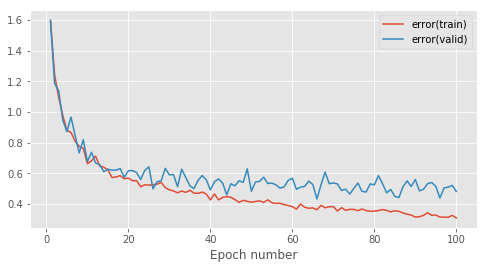

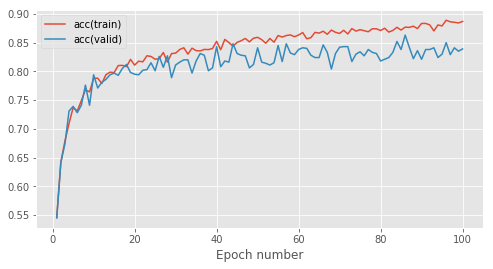

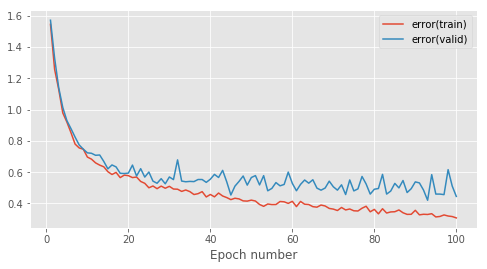

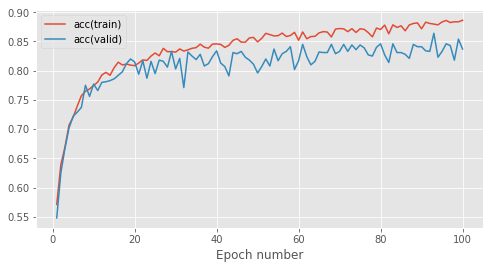

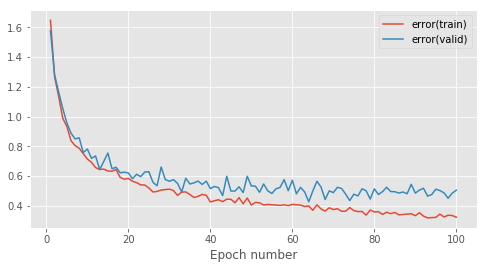

...

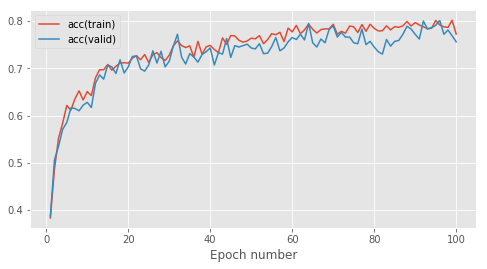

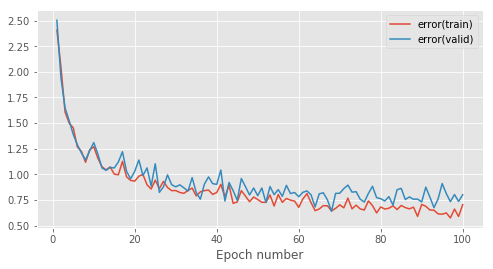

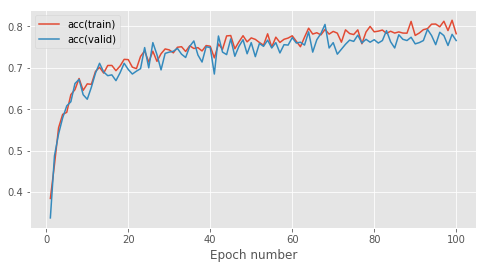

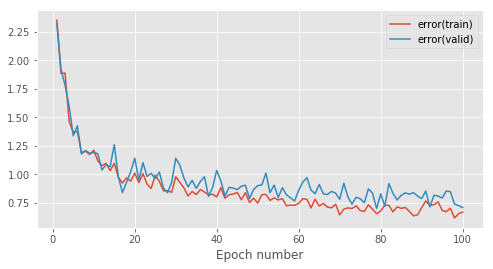

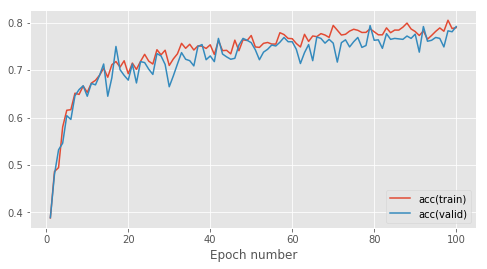

In [17]:
numSamples = 10
num_epochs = 100

elu_accs = defaultdict(list)
for alpha in [0.001, 0.01, 0.1, 1.0, 10.0]:
    print("*********** ELU {} ***********".format(alpha))
    mean, sd = gatherELUSamples(numSamples, alpha, num_epochs, train_data_100, valid_data_10)
    elu_accs[alpha] = [mean, sd]

In [18]:
for (alpha, stats) in elu_accs.items():
    print("ELU Validation set accuracy ({} samples, {} epochs, {} training batches, alpha={}): {} ± {}".format(10, num_epochs, 100, alpha, stats[0], stats[1]))


ELU Validation set accuracy (10 samples, 100 epochs, 100 training batches, alpha=0.001): 0.8371999999999999 ± 0.01357055636294988
ELU Validation set accuracy (10 samples, 100 epochs, 100 training batches, alpha=0.01): 0.8408999999999999 ± 0.009213576938409984
ELU Validation set accuracy (10 samples, 100 epochs, 100 training batches, alpha=0.1): 0.8408999999999999 ± 0.010153324578678588
ELU Validation set accuracy (10 samples, 100 epochs, 100 training batches, alpha=1.0): 0.8472 ± 0.008268010643437733
ELU Validation set accuracy (10 samples, 100 epochs, 100 training batches, alpha=10.0): 0.7821 ± 0.017569575976670557


In [261]:
print(lrelu_accs)
print()
print(prelu_accs)
print()
print(rrelu_accs)
print()
print(elu_accs)

defaultdict(<class 'list'>, {0.001: [0.7329999999999999, 0.028301943396169815], 0.01: [0.727, 0.027946377224964267], 0.1: [0.728, 0.052306787322488085], 1.0: [0.7530000000000001, 0.043139309220246], 10.0: [0.7649999999999999, 0.02202271554554526]})

defaultdict(<class 'list'>, {0.001: [0.641, 0.051468436929831086], 0.01: [0.6400000000000001, 0.03872983346207416], 0.1: [0.664, 0.06590902821313632], 1.0: [0.6460000000000001, 0.028000000000000004], 10.0: [0.6410000000000001, 0.05889821729050888]})

defaultdict(<class 'list'>, {10: [0.772, 0.03280243893371344], 20: [0.7219999999999999, 0.06337191807101944], 30: [0.7590000000000001, 0.03986226285598952], 40: [0.76, 0.03405877273185283], 50: [0.744, 0.0429418211071678]})

defaultdict(<class 'list'>, {0.001: [0.8325999999999999, 0.013929824119492673], 0.01: [0.8339000000000001, 0.008287943049997394], 0.1: [0.8341, 0.011665761869676546], 1.0: [0.845, 0.01281405478371306], 10.0: [0.7687, 0.009445104552094685]})


So, now I've got an estimate to the best hyperparameter for each model.
Next was to add regularisation, but I'm not going to do that because I just can't be bothered.
Instead, I'll train each model on the full dataset (just 3 samples this time, and a greater number of epochs (1000). Once I've done that, I'll know which model is the best.
Finally, I'll do a final hyper-parameter search for this best model (within the magnitude that the initial experimentation showed was best. 

#### Full dataset

*********** Sample 1 ***********


Epoch 1: 0.8s to complete
    error(train)=1.55e+00, acc(train)=5.60e-01, error(valid)=1.55e+00, acc(valid)=5.62e-01
Epoch 2: 0.8s to complete
    error(train)=1.24e+00, acc(train)=6.40e-01, error(valid)=1.18e+00, acc(valid)=6.58e-01
Epoch 3: 0.8s to complete
    error(train)=1.12e+00, acc(train)=6.75e-01, error(valid)=1.16e+00, acc(valid)=6.74e-01
Epoch 4: 0.7s to complete
    error(train)=9.98e-01, acc(train)=7.05e-01, error(valid)=9.82e-01, acc(valid)=7.24e-01
Epoch 5: 0.8s to complete
    error(train)=9.04e-01, acc(train)=7.32e-01, error(valid)=8.98e-01, acc(valid)=7.36e-01
Epoch 6: 0.7s to complete
    error(train)=8.81e-01, acc(train)=7.31e-01, error(valid)=9.87e-01, acc(valid)=7.08e-01
Epoch 7: 0.8s to complete
    error(train)=8.24e-01, acc(train)=7.50e-01, error(valid)=8.47e-01, acc(valid)=7.42e-01
Epoch 8: 0.8s to complete
    error(train)=7.86e-01, acc(train)=7.64e-01, error(valid)=7.62e-01, acc(valid)=7.79e-01
Epoch 9: 0.7s to complete
    error(train)=7.70e-01, acc(train)=


Validation set accuracy on best model: 0.781
Test set accuracy on best model: 0.7662025316455696


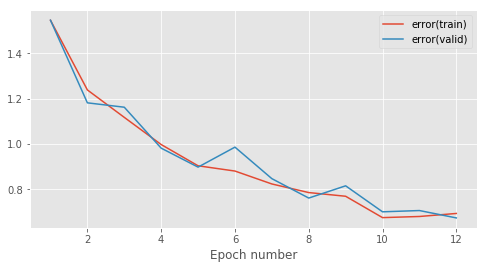

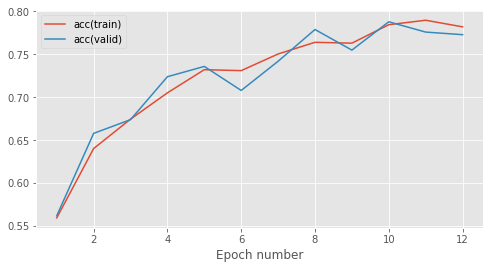

In [23]:
numSamples = 1
num_epochs = 100

all_accs = defaultdict(list)
all_accs['lrelu'] = [gatherLRELUSamples(numSamples, 0.1, num_epochs, train_data_100, valid_data_10, test_data, 2)]

In [25]:
all_accs['lrelu']

[(0.781, 0.0, 0.7662025316455696, 0.0)]

#### 2B

In [18]:
def createMultiLayerAffineModel(numHiddenLayers, input_dim, hidden_dim, output_dim, rng):
    
    return createMultiLayerModel(numHiddenLayers + 1, None, input_dim, hidden_dim, output_dim, rng)
    

In [24]:
def gatherAffineSamples(numSamples, num_epochs, train_data, valid_data, test_data=None, early_stopping=None):
    valid_accs = []
    
    if test_data is not None:
        test_accs = []
    
    for i in range(0, numSamples):
        print("*********** Sample {} ***********".format(i+1))
        # reset rng
        rng.seed(i)

        # create model (3 layers)
        model = createMultiLayerAffineModel(numHiddenLayers, input_dim, hidden_dim, output_dim, rng)

        stats = trainModel(model, train_data, valid_data,
                           learning_rate = 0.01,
                           num_epochs = num_epochs,
                           stats_interval = 1,
                           batch_size = batch_size,
                           hidden_dim = hidden_dim, early_stopping=early_stopping)

        # create empty "best model"
        best_model = createMultiLayerAffineModel(numHiddenLayers, input_dim, hidden_dim, output_dim, rng)
        print(best_model)

        # report best model validation set accuracy
        valid_acc = createBestModelAndCalculateAccuracy(stats[0].model, best_model, stats[0].model.params, stats[0].best_model_params, valid_data, 'Validation')
        
        if test_data is not None: 
            test_acc = createBestModelAndCalculateAccuracy(stats[0].model, best_model, stats[0].model.params, stats[0].best_model_params, test_data, 'Test') 
            test_accs.append(test_acc)
        
        valid_accs.append(valid_acc)
        
    mean = np.array(valid_accs).mean()
    sd = np.array(valid_accs).std()
    
    if test_data is not None:
        mean_test = np.array(test_accs).mean()
        sd_test = np.array(test_accs).std()
        
        return mean, sd, mean_test, sd_test
    
    return mean, sd


*********** Sample 1 ***********



MultiLayerModel(
    AffineLayer(input_dim=784, output_dim=128)
    AffineLayer(input_dim=128, output_dim=128)
    AffineLayer(input_dim=128, output_dim=128)
    AffineLayer(input_dim=128, output_dim=128)
    AffineLayer(input_dim=128, output_dim=47)
)
Validation set accuracy on best model: 0.625
Test set accuracy on best model: 0.6186708860759493
*********** Sample 2 ***********



MultiLayerModel(
    AffineLayer(input_dim=784, output_dim=128)
    AffineLayer(input_dim=128, output_dim=128)
    AffineLayer(input_dim=128, output_dim=128)
    AffineLayer(input_dim=128, output_dim=128)
    AffineLayer(input_dim=128, output_dim=47)
)
Validation set accuracy on best model: 0.642
Test set accuracy on best model: 0.6195569620253165


(0.6335, 0.008500000000000008, 0.6191139240506329, 0.0004430379746835911)

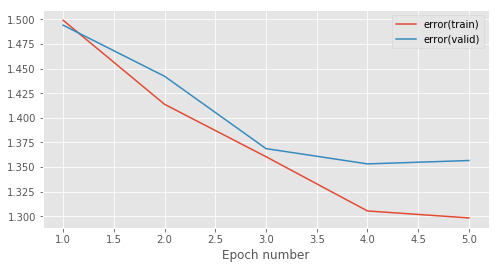

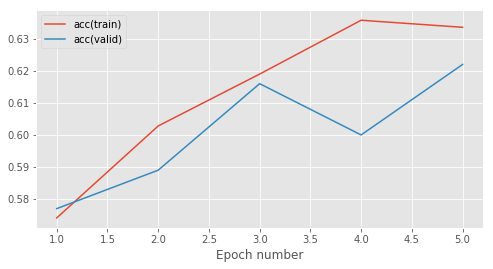

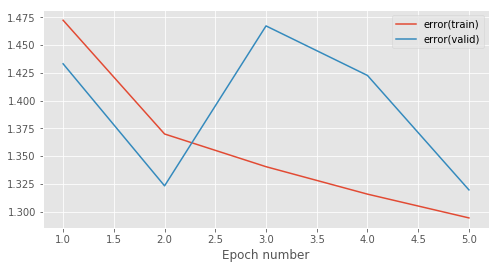

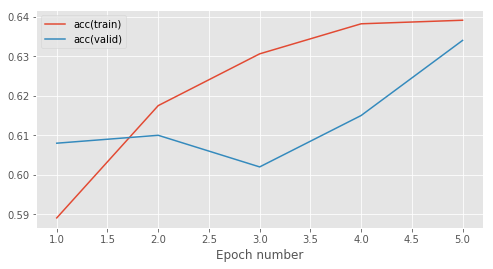

In [25]:
numSamples=2
num_epochs=5
early_stopping=2
gatherAffineSamples(numSamples, num_epochs, train_data_100, valid_data_10, test_data=test_data, early_stopping=early_stopping)

In [24]:
[stats[0] for stats in elu_accs.values()]

[0.8371999999999999, 0.8408999999999999, 0.8408999999999999, 0.8472, 0.7821]

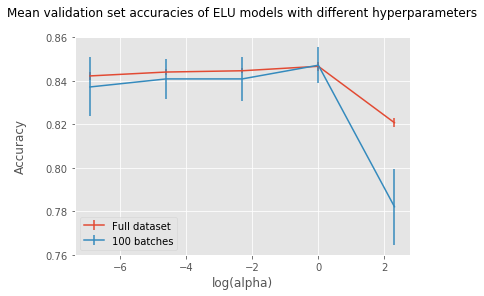

In [51]:
import math

elu_full_val = [0.8422784810126581, 0.8440632911392406,  0.8446518987341772, 0.8467025316455695, 0.8207405063291139]
elu_full_err = [0.001738376141782561, 0.001363567899695729, 0.0011749842751234206, 0.0020093217309078157, 0.001965707039718582]
elu_100_val = [stats[0] for stats in elu_accs.values()]
elu_100_sd = [stats[1] for stats in elu_accs.values()]
alpha = [0.001, 0.01, 0.1, 1.0, 10.0]
plt.errorbar([math.log(al) for al in alpha], elu_full_val, yerr=elu_full_err, label='Full dataset')
plt.errorbar([math.log(al) for al in alpha], elu_100_val, yerr=elu_100_sd, label='100 batches')
plt.xlabel("log(alpha)")
plt.ylabel("Accuracy\n")
plt.title('Mean validation set accuracies of ELU models with different hyperparameters\n', fontsize=12)
plt.legend()
plt.show()
# elu_full_train = [0.8315569620253165,  0.8328481012658229, 0.8338354430379746, 0.8340569620253164, 0.8105632911392406]
